# Quantum LSTM For Timeseries Forecasting _Logged_

                                                                                                   Hasnain Sikora, 19BAI1072

# Architecture

## How A VQC Looks:
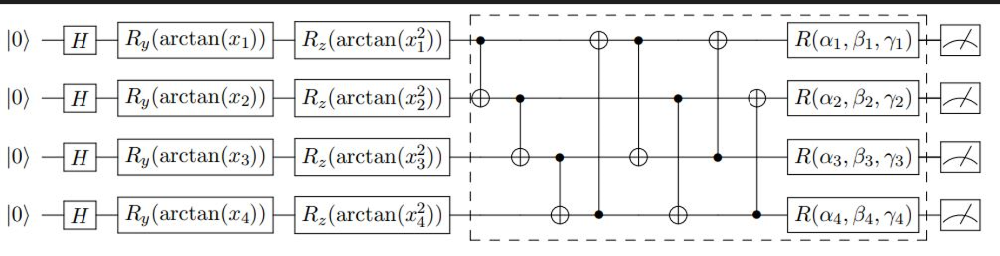
## How A VQCs Are Integrated:
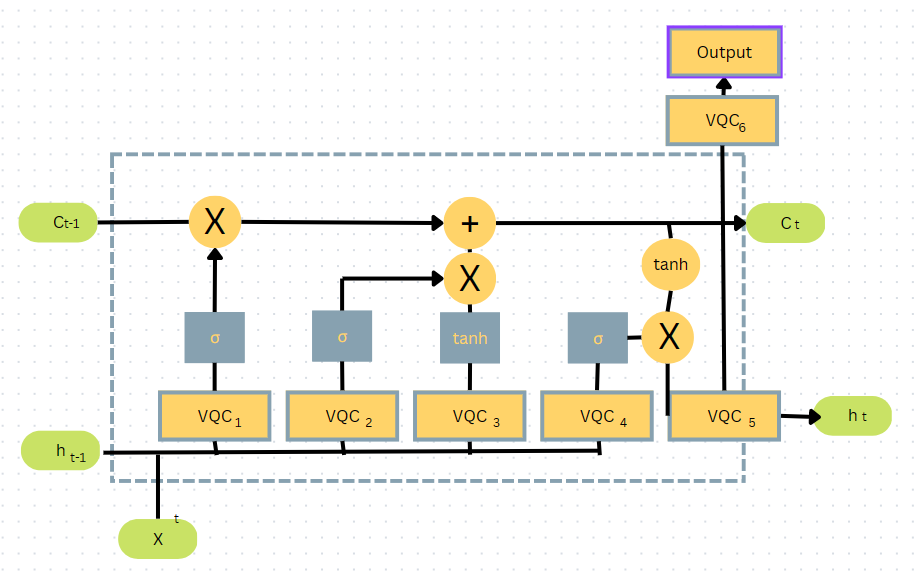

In [1]:
#importing all the necessary pip packages to proceed
import pandas as pd
from utils import *
import time
import numpy as np
import math
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from torch import nn
from IPython.display import Image
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
import torch
from torch import nn
from torch.utils.data import Dataset
import pennylane as qml
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [2]:
df = pd.read_csv('daily.csv')
df=df.head(1000)
df = df.drop(['date'], axis=1)
df = df[['max_temperature','avg_temperature','min_temperature','max_dew_point','avg_dew_point','min_dew_point','max_relative_humidity','avg_relative_humidity','min_relative_humidity','max_wind_speed',
         'avg_wind_speed','min_wind_speed','max_pressure_station','avg_pressure_station','min_pressure_station']]

features = ['avg_temperature','min_temperature','max_dew_point','avg_dew_point','min_dew_point','max_relative_humidity','avg_relative_humidity','min_relative_humidity','max_wind_speed',
         'avg_wind_speed','min_wind_speed','max_pressure_station','avg_pressure_station','min_pressure_station']
target = "max_temperature"

C:\Users\hnsik\AppData\Local\Temp\ipykernel_1768\4120764847.py:1: DtypeWarning: Columns (46,47) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('daily.csv')


In [18]:
size = int(len(df) * 0.67)
df_train = df.loc[:size].copy()
df_test = df.loc[size:].copy()

In [23]:
print("Split Training Data: \n")
print(df_train.head())
print("Training Data Shape: \n")
print(df_train.shape)

Split Training Data: 

   max_temperature  avg_temperature  min_temperature  max_dew_point  \
0            -21.9           -26.60            -31.3          -25.0   
1            -14.8           -20.39            -26.0          -18.8   
2            -11.4           -13.15            -14.9          -13.5   
3             -7.0           -10.30            -13.6           -8.7   
4             -3.2            -7.60            -12.0           -6.8   

   avg_dew_point  min_dew_point  max_relative_humidity  avg_relative_humidity  \
0          -29.8          -34.5                   78.0                   73.5   
1          -23.8          -28.8                   86.0                   79.0   
2          -15.9          -18.4                   86.0                   78.0   
3          -13.2          -17.6                   88.0                   80.0   
4          -10.7          -14.6                   89.0                   79.5   

   min_relative_humidity  max_wind_speed  avg_wind_speed  min_w

In [25]:
print("Split Testing Data: \n")
print(df_test.head())
print("Test Data Shape: \n")
print(df_test.shape)

Split Testing Data: 

     max_temperature  avg_temperature  min_temperature  max_dew_point  \
670        -0.030989        -0.096030        -0.168369      -0.279841   
671         0.540293         0.240338        -0.117930      -0.603860   
672         0.024297        -0.262536        -0.593497      -0.587244   
673        -0.338129        -0.289392        -0.226014      -0.296457   
674        -0.184559        -0.011435         0.191908      -0.396155   

     avg_dew_point  min_dew_point  max_relative_humidity  \
670      -0.443820      -0.583528              -1.251322   
671      -0.562608      -0.509117              -2.038236   
672      -0.570528      -0.546322               0.224141   
673      -0.309193      -0.315651              -0.070951   
674      -0.491335      -0.561205              -1.743143   

     avg_relative_humidity  min_relative_humidity  max_wind_speed  \
670              -1.336741              -1.067359        1.352792   
671              -2.244053              

In [24]:
target_mean = df_train[target].mean()
target_stdev = df_train[target].std()

for c in df_train.columns:
    mean = df_train[c].mean()
    stdev = df_train[c].std()

    df_train[c] = (df_train[c] - mean) / stdev
    df_test[c] = (df_test[c] - mean) / stdev

In [27]:
print("Normalized Training Data: \n")
print(df_train.head())

Normalized Training Data: 

   max_temperature  avg_temperature  min_temperature  max_dew_point  \
0        -1.941402        -1.995406        -2.005785      -2.082716   
1        -1.505263        -1.578470        -1.623891      -1.567609   
2        -1.296407        -1.092380        -0.824075      -1.127275   
3        -1.026124        -0.901033        -0.730402      -0.728483   
4        -0.792697        -0.719756        -0.615114      -0.570627   

   avg_dew_point  min_dew_point  max_relative_humidity  avg_relative_humidity  \
0      -2.083103      -2.041970              -0.661137               0.515687   
1      -1.607948      -1.617831               0.125777               0.931538   
2      -0.982328      -0.843964               0.125777               0.855929   
3      -0.768509      -0.784435               0.322506               1.007147   
4      -0.570528      -0.561205               0.420870               0.969343   

   min_relative_humidity  max_wind_speed  avg_wind_speed  

In [26]:
print("Normalized Testing Data: \n")
print(df_test.head())

Normalized Testing Data: 

     max_temperature  avg_temperature  min_temperature  max_dew_point  \
670        -0.030989        -0.096030        -0.168369      -0.279841   
671         0.540293         0.240338        -0.117930      -0.603860   
672         0.024297        -0.262536        -0.593497      -0.587244   
673        -0.338129        -0.289392        -0.226014      -0.296457   
674        -0.184559        -0.011435         0.191908      -0.396155   

     avg_dew_point  min_dew_point  max_relative_humidity  \
670      -0.443820      -0.583528              -1.251322   
671      -0.562608      -0.509117              -2.038236   
672      -0.570528      -0.546322               0.224141   
673      -0.309193      -0.315651              -0.070951   
674      -0.491335      -0.561205              -1.743143   

     avg_relative_humidity  min_relative_humidity  max_wind_speed  \
670              -1.336741              -1.067359        1.352792   
671              -2.244053         

# Helper Functions

In [75]:
class DataSequencing(Dataset):
    def __init__(self, dataframe, target, features, sequence_length=5):
        self.features = features
        print(f"Features {features}\n")
        self.target = target
        print(f"Target: {target}\n")
        self.sequence_length = sequence_length
        print(f"Look Back: {sequence_length}\n")
        
        print("PyTorch deep learning models require data to be in tensor format.\n")
        self.y = torch.tensor(dataframe[self.target].values).float()
        print(f"Tensor of target: {self.y}\n")
        self.X = torch.tensor(dataframe[self.features].values).float()
        print(f"Tensor of features: {self.X}\n")

        

    def __len__(self):
        print(f"Number of rows of the features {self.X.shape[0]}\n")
        return self.X.shape[0]

    def __getitem__(self, i): 

        if i >= self.sequence_length - 1:
            i_start = i - self.sequence_length + 1
            x = self.X[i_start:(i + 1), :]
        else:
            padding = self.X[0].repeat(self.sequence_length - i - 1, 1)
            x = self.X[0:(i + 1), :]
            x = torch.cat((padding, x), 0)

        print(f"x: {x}\n")
        print(f"y: {self.y[i]}\n")
        
        
        return x, self.y[i]

In [76]:
torch.manual_seed(101)

batch_size = 1
sequence_length = 3

train_dataset = DataSequencing(
    df_train,
    target=target,
    features=features,
    sequence_length=sequence_length
)
test_dataset = DataSequencing(
    df_test,
    target=target,
    features=features,
    sequence_length=sequence_length
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

X, y = next(iter(train_loader))

print("Features shape:", X.shape)
print("Target shape:", y.shape)

Features ['avg_temperature', 'min_temperature', 'max_dew_point', 'avg_dew_point', 'min_dew_point', 'max_relative_humidity', 'avg_relative_humidity', 'min_relative_humidity', 'max_wind_speed', 'avg_wind_speed', 'min_wind_speed', 'max_pressure_station', 'avg_pressure_station', 'min_pressure_station']

Target: max_temperature

Look Back: 3

PyTorch deep learning models require data to be in tensor format.

Tensor of target: tensor([-1.9414e+00, -1.5053e+00, -1.2964e+00, -1.0261e+00, -7.9270e-01,
        -9.4627e-01, -1.3701e+00, -6.6370e-01, -4.9170e-01, -5.7770e-01,
        -6.0841e-01, -4.0570e-01, -7.7427e-01, -7.0670e-01, -5.2856e-01,
        -5.8998e-01, -6.3298e-01, -7.8041e-01, -1.1613e+00, -1.8001e+00,
        -1.5298e+00, -1.5974e+00, -1.7633e+00, -1.7387e+00, -1.7018e+00,
        -8.5413e-01, -3.6884e-01, -7.5584e-01, -9.7698e-01, -6.6370e-01,
        -5.1627e-01, -8.2341e-01, -9.9541e-01, -8.6027e-01, -9.4012e-01,
        -1.1490e+00, -9.9541e-01, -1.0691e+00, -1.0876e+00, -1.3

In [82]:
def train_model(data_loader, model, loss_function, optimizer):
    num_batches = len(data_loader)
   
    total_loss = 0
    model.train()
    
    for X, y in data_loader:
        output = model(X)
        loss = loss_function(output, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / num_batches
    print(f"Train loss: {avg_loss}")
    return avg_loss

def test_model(data_loader, model, loss_function):
    
    num_batches = len(data_loader)

    total_loss = 0

    model.eval()
    with torch.no_grad():
        for X, y in data_loader:
            output = model(X)
            total_loss += loss_function(output, y).item()

    avg_loss = total_loss / num_batches
    print(f"Test loss: {avg_loss}")
    return avg_loss

In [83]:
def predict(data_loader, model):
    output = torch.tensor([])
    model.eval()
    with torch.no_grad():
        for X, _ in data_loader:
            y_star = model(X)
            output = torch.cat((output, y_star), 0)
    
    return output

# _Quantum LSTM_

In [123]:
class QLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, n_qubits=4,n_qlayers=1,n_vrotations=3,batch_first=True,return_sequences=False,
                 return_state=False,
                backend="default.qubit"):
        super(QLSTM, self).__init__()
        self.n_inputs = input_size
        print(f"Inputs: {self.n_inputs}\n")
        self.hidden_size = hidden_size
        print(f"Hidden Size: {self.hidden_size}\n")
        self.concat_size = self.n_inputs + self.hidden_size
        print(f"Concatenation Size: {self.concat_size}\n")
        
        self.n_qubits = n_qubits
        print(f"Qubits: {self.n_qubits}\n")
        
        self.n_qlayers = n_qlayers
        print(f"Qlayers: {self.n_qlayers}\n")
        
        self.n_vrotations = n_vrotations
        print(f"V rotations: {self.n_vrotations}\n")
        
        self.backend = backend 
        print(f"Backend: {self.backend}\n")
        

        self.batch_first = batch_first
        self.return_sequences = return_sequences
        self.return_state = return_state
        
        self.wires_forget = [f"wire_forget_{i}" for i in range(self.n_qubits)]
        self.wires_input = [f"wire_input_{i}" for i in range(self.n_qubits)]
        self.wires_update = [f"wire_update_{i}" for i in range(self.n_qubits)]
        self.wires_output = [f"wire_output_{i}" for i in range(self.n_qubits)]
        print(f"Forget Wires: {self.wires_forget}\n")
        print(f"Input Wires: {self.wires_input}\n")
        print(f"Update Wires: {self.wires_update}\n")
        print(f"Output Wires: {self.wires_output}\n")
        
        

        self.dev_forget = qml.device(self.backend, wires=self.wires_forget)
        self.dev_input = qml.device(self.backend, wires=self.wires_input)
        self.dev_update = qml.device(self.backend, wires=self.wires_update)
        self.dev_output = qml.device(self.backend, wires=self.wires_output)
        
        
        def ansatz(params, wires_type):
            for i in range(1,3): 
                for j in range(self.n_qubits):
                    if j + i < self.n_qubits:
                        qml.CNOT(wires=[wires_type[j], wires_type[j + i]])
                    else:
                        qml.CNOT(wires=[wires_type[j], wires_type[j + i - self.n_qubits]])

            for i in range(self.n_qubits):
                qml.RX(params[0][i], wires=wires_type[i])
                qml.RY(params[1][i], wires=wires_type[i])
                qml.RZ(params[2][i], wires=wires_type[i])
                
        def VQC(features, weights, wires_type):
            print(f"inputs: {features}")
            print(f"weights: {weights}")
            print(f"wires type: {wires_type}")
            ry_params = [torch.arctan(feature) for feature in features]
            rz_params = [torch.arctan(feature**2) for feature in features]
            for i in range(self.n_qubits):
                qml.Hadamard(wires=wires_type[i])
                qml.RY(ry_params[i], wires=wires_type[i])
                qml.RZ(ry_params[i], wires=wires_type[i])
        
            qml.layer(ansatz, self.n_qlayers, weights, wires_type = wires_type)

        def _circuit_forget(inputs, weights): 
            VQC(inputs, weights, self.wires_forget)
            
            return [qml.expval(qml.PauliZ(wires=i)) for i in self.wires_forget]
        self.qlayer_forget = qml.QNode(_circuit_forget, self.dev_forget, interface="torch")

        def _circuit_input(inputs, weights):         
            VQC(inputs, weights, self.wires_input)
            return [qml.expval(qml.PauliZ(wires=i)) for i in self.wires_input]
        self.qlayer_input = qml.QNode(_circuit_input, self.dev_input, interface="torch")

        def _circuit_update(inputs, weights):
            VQC(inputs, weights, self.wires_update)
            return [qml.expval(qml.PauliZ(wires=i)) for i in self.wires_update]
        self.qlayer_update = qml.QNode(_circuit_update, self.dev_update, interface="torch")

        def _circuit_output(inputs, weights):
            VQC(inputs, weights, self.wires_output)
            return [qml.expval(qml.PauliZ(wires=i)) for i in self.wires_output]
        self.qlayer_output = qml.QNode(_circuit_output, self.dev_output, interface="torch")
        
        print("Defined output Qnode which takes in a quantum function, a device to simulate it on and an interface which makes the qnode compatible with pytorch\n")
        
        weight_shapes = {"weights": (self.n_qlayers, self.n_vrotations, self.n_qubits)}
        print(f"weight_shapes = (n_qlayers, n_vrotations, n_qubits) = ({self.n_qlayers}, {self.n_vrotations}, {self.n_qubits})\n")
        self.clayer_in = torch.nn.Linear(self.concat_size, self.n_qubits)
    
        self.VQC = {
            'forget': qml.qnn.TorchLayer(self.qlayer_forget, weight_shapes),
            'input': qml.qnn.TorchLayer(self.qlayer_input, weight_shapes),
            'update': qml.qnn.TorchLayer(self.qlayer_update, weight_shapes),
            'output': qml.qnn.TorchLayer(self.qlayer_output, weight_shapes)
        }
        print(f"VQC Object: {self.VQC}")
        self.clayer_out = torch.nn.Linear(self.n_qubits, self.hidden_size)

    def forward(self, x, init_states=None):
        print("Inside Quantum Forward Pass\n")
  
        if self.batch_first is True:
            print("Batch First\n")
        
            batch_size, seq_length, features_size = x.size()
            print(f"Batch size: {batch_size}, Sequence length: {seq_length}, feature size: {features_size}\n")
        else:
            print("Sequence First\n")
            
            seq_length, batch_size, features_size = x.size()
            print(f"Batch size: {batch_size}, Sequence length: {seq_length}, feature size: {features_size}\n")
            

        hidden_seq = []
        if init_states is None:
            print("No initial states initialized\n")
            
            h_t = torch.zeros(batch_size, self.hidden_size)  
            c_t = torch.zeros(batch_size, self.hidden_size)  
            print(f"h_t: {h_t}\n")
            print(f"c_t: {c_t}\n")
            
            
        else:
            print("Initial states initialized\n")
            
            h_t, c_t = init_states
            h_t = h_t[0]
            c_t = c_t[0]
            print(f"h_t: {h_t}\n")
            print(f"c_t: {c_t}\n")
    

        for t in range(seq_length):
            print(f"t: {t}\n")
            print(f"x: {x}\n")
            print(f"x shape: {x.shape}\n")
            

            x_t = x[:, t, :]
            print(f"x_{t}: {x_t}\n")
            print(f"x_{t} shape: {x_t.shape}\n")
            
            print(f"h_t shape: {h_t.shape}\n")
            
            v_t = torch.cat((h_t, x_t), dim=1)
            print(f"v_{t}: {v_t}\n")
            print(f"v_{t} shape: {v_t.shape}\n")
            
            

            y_t = self.clayer_in(v_t)
            print(f"y_{t}: {y_t}\n")
            

            f_t = torch.sigmoid(self.clayer_out(self.VQC['forget'](y_t)))  
            i_t = torch.sigmoid(self.clayer_out(self.VQC['input'](y_t)))  
            g_t = torch.tanh(self.clayer_out(self.VQC['update'](y_t)))  
            o_t = torch.sigmoid(self.clayer_out(self.VQC['output'](y_t))) 

            c_t = (f_t * c_t) + (i_t * g_t)
            h_t = o_t * torch.tanh(c_t)

            hidden_seq.append(h_t.unsqueeze(0))
        hidden_seq = torch.cat(hidden_seq, dim=0)
        hidden_seq = hidden_seq.transpose(0, 1).contiguous()
        return hidden_seq, (h_t, c_t)
    
class QuantumLSTM(nn.Module):
    def __init__(self, num_sensors, hidden_units, n_qubits=0, n_qlayers=1):
        super().__init__()
        self.num_sensors = num_sensors  
        self.hidden_units = hidden_units
        self.num_layers = 1
        self.lstm = QLSTM(
            input_size=num_sensors,
            hidden_size=hidden_units,
            batch_first=True,
            n_qubits = n_qubits,
            n_qlayers= n_qlayers
        )

        self.linear = nn.Linear(in_features=self.hidden_units, out_features=1)

    def forward(self, x):
        print("In Training Function\n")
        batch_size = x.shape[0]
        print(f"Batch Size: {batch_size}\n")
        print("Initial States:\n")
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_units).requires_grad_()
        print(f"h theta: {h0}\n")
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_units).requires_grad_()
        print(f"c thera: {c0}\n")
        
        _, (hn, _) = self.lstm(x, (h0, c0))
        out = self.linear(hn).flatten()  

        return out

In [124]:
learning_rate = 0.05
num_hidden_units = 16

Qmodel = QuantumLSTM(num_sensors=len(features), hidden_units=num_hidden_units, n_qubits=4)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adagrad(Qmodel.parameters(), lr=learning_rate)

Inputs: 14

Hidden Size: 16

Concatenation Size: 30

Qubits: 4

Qlayers: 1

V rotations: 3

Backend: default.qubit

Forget Wires: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']

Input Wires: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']

Update Wires: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']

Output Wires: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']

Defined output Qnode which takes in a quantum function, a device to simulate it on and an interface which makes the qnode compatible with pytorch

weight_shapes = (n_qlayers, n_vrotations, n_qubits) = (1, 3, 4)

VQC Object: {'forget': <Quantum Torch Layer: func=_circuit_forget>, 'input': <Quantum Torch Layer: func=_circuit_input>, 'update': <Quantum Torch Layer: func=_circuit_update>, 'output': <Quantum Torch Layer: func=_circuit_output>}


In [125]:
quantum_loss_train = []
quantum_loss_test = []
print("Training QLSTM\n-------------------------------------------")
start = time.time()
test_loss = test_model(test_loader, Qmodel, loss_function)
end = time.time()
print("Execution time", end - start)
quantum_loss_test.append(test_loss)

for ix_epoch in range(1):
    print(f"Epoch {ix_epoch}\n*********************")
    start = time.time()
    train_loss = train_model(train_loader, Qmodel, loss_function, optimizer=optimizer)
    test_loss = test_model(test_loader, Qmodel, loss_function)
    end = time.time()
    print("Execution time", end - start)
    quantum_loss_train.append(train_loss)
    quantum_loss_test.append(test_loss)

Training QLSTM
-------------------------------------------
Number of rows of the features 330

Number of rows of the features 330

x: tensor([[-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273],
        [-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273],
        [-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273]])

y: -0.03098868392407894

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized


inputs: tensor([-0.2625,  0.4318,  0.2357,  0.1611])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.2625,  0.4318,  0.2357,  0.1611])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2625,  0.4318,  0.2357,  0.1611])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.0960, -0.1684, -0.2798, -0.4438, -0.5835,

inputs: tensor([ 0.7252,  0.0013, -0.2058,  0.0860])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.2403, -0.1179, -0.6039, -0.5626, -0.5091, -2.0382, -2.2441,
          -1.8217,  0.5224,  1.0202,  1.7138,  0.3547, -0.2819, -0.7950],
         [-0.2625, -0.5935, -0.5872, -0.5705, -0.5463,  0.2241, -1.0343,
          -1.3974, -0.8270, -0.9099, -0.7496,  1.4702,  1.4635,  1.2970],
         [-0.2894, -0.2260, -0.2965, -0.3092, -0.3157, -0.0710, -0.3916,
          -0.4544,  0.1072,  0.1356,  0.1462,  1.3738,  1.6681,  1.7418]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.2894, -0.2260, -0.2965, -0.3092, -0.3157, -0.0710, -0.3916, -0.4544,
          0.1072,  0.1356,  0.1462,  1.3738,  1.6681,  1.7418]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.2894, -0.2260, -0.2965, -0.3092, -0.3157, -0.0710, -0.3916,
          -0.4544,  0.1072,  0.1356,  0.1462,  1.3738,  1.6681,  1.7418],
         [-0.0114,  0.1919, -0.3962, -0.4913, -0.5612, -1.7431, -1.6392,
          -1.2088,  0.1072,  0.2964,  0.5941,  1.3738,  1.5045,  1.4533],
         [ 0.4686,  0.2928, -0.3048, -0.1983, -0.0924, -2.7268, -2.1684,
          -1.3974,  0.6262,  0.3768, -0.3017,  0.6715,  0.7817,  0.7800]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.0114,  0.1919, -0.3962, -0.4913, -0.5612, -1.7431, -1.6392, -1.2088,
          0.1072,  0.2964,  0.5941,  1.3738,  1.5045,  1.4533]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0080,  0.0958, -0.0021,  0.0765,  0.0131, -0.0384,  0.0474,  0.1693,
         -0.0755,  0.0799, -0.1343, -0.0702,  0.0187, -0.0067,  0.0769,  0.0907,
         -0.0114,  0.1919, -0.3962, -0.4913, -0.5612, -1.7431, -1.6392, -1.2088,
          0.1072,  0.2964,  0.5941,  1.3738,  1.50

inputs: tensor([-0.0687,  0.0832, -0.1646,  0.0534])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0687,  0.0832, -0.1646,  0.0534])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0687,  0.0832, -0.1646,  0.0534])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4686,  0.2928, -0.3048, -0.1983, -

inputs: tensor([ 0.6589,  0.0675, -0.2348,  0.5647])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6589,  0.0675, -0.2348,  0.5647])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1665, -0.0603, -0.3546, -0.2854, -0.2189, -0.2677, -1.2989, -1.4917,
         -0.8270, -0.9903, -0.9735,  1.4014,  1.5863,  1.5735],
        [ 0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770, -1.3031,
         -1.4498, -1.2316, -0.3017,  2.1588,  2.2954,  2.1626],
        [-0.1054,  0.0478, -0.7451, -0.5626, -0.3901, -2.9235, -1.9416, -1.

inputs: tensor([-0.1734, -0.4146, -0.2673,  0.7319])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770,
          -1.3031, -1.4498, -1.2316, -0.3017,  2.1588,  2.2954,  2.1626],
         [-0.1054,  0.0478, -0.7451, -0.5626, -0.3901, -2.9235, -1.9416,
          -1.0202,  0.5224,  0.8593,  1.2659,  2.1588,  2.5817,  2.6676],
         [-0.1189,  0.0262, -0.3380, -0.4201, -0.4942,  0.2241, -0.7697,
          -1.0674,  0.6262,  0.7789,  0.8180,  1.9935,  1.9954,  1.7779]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.1189,  0.0262, -0.3380, -0.4201, -0.4942,  0.2241, -0.7697, -1.0674,
          0.6262,  0.7789,  0.8180,  1.9935,  1.9954,  1.7779]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.1367, -0.4508,  0.0218,  0.3375])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.1886e-01,  2.6181e-02, -3.3800e-01, -4.2006e-01, -4.9424e-01,
           2.2414e-01, -7.6967e-01, -1.0674e+00,  6.2620e-01,  7.7893e-01,
           8.1800e-01,  1.9935e+00,  1.9954e+00,  1.7779e+00],
         [-1.4907e-01,  1.1985e-01, -1.7183e-01, -8.2615e-03,  1.3825e-01,
           4.2087e-01,  4.0227e-01,  2.9997e-01,  1.9756e+00,  2.7895e+00,
           3.5053e+00,  9.3312e-01,  4.6807e-01,  2.2541e-02],
         [ 2.0677e-01,  2.1352e-01, -2.1338e-01, -1.9832e-01, -1.8915e-01,
          -1.3497e+00, -1.4124e+00, -1.1145e+00,  3.4032e-03, -1.0571e-01,
          -3.0170e-01, -1.1464e+00, -1.2092e+00, -1.1317e+00]]])

x shape: torch.Size([1, 3, 14])



inputs: tensor([ 0.2877,  0.3526,  0.0293, -0.3997])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2877,  0.3526,  0.0293, -0.3997])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2877,  0.3526,  0.0293, -0.3997])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2068,  0.2135, -0.2134, -0.1983, -0.1892,

t: 2

x: tensor([[[-0.1061, -0.2909, -0.2715, -0.2538, -0.2338,  0.5192, -0.6941,
          -1.1145,  0.0034, -0.2666, -0.7496, -0.1548, -0.5001, -0.7469],
         [ 0.3209,  0.3072,  0.0940,  0.0947,  0.0936,  0.6176, -0.2782,
          -0.6430,  1.1452,  0.9398,  0.1462, -0.5542, -0.8956, -1.0836],
         [ 0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038,
          -1.6803,  1.5604,  1.3419,  0.3701, -0.6919, -0.9229, -1.0234]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038, -1.6803,
          1.5604,  1.3419,  0.3701, -0.6919, -0.9229, -1.0234]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0115,  0.1463,  0.0130,  0.1342,  0.0156, -0.0688,  0.0992,  0.2657,
         -0.1085,  0.1481, -0.1585, -0.1089,  0.0455,  0.0333,  0.1150,  0.1421,
          0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038, -1.6803,
          1.5604,  1.3419,  0.3701, -0.6919, -0.92

t: 1

x: tensor([[[ 0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038,
          -1.6803,  1.5604,  1.3419,  0.3701, -0.6919, -0.9229, -1.0234],
         [ 0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258,
          -1.2560, -1.1384, -0.9099, -0.0778, -0.6231, -0.2547,  0.0947],
         [ 0.0389, -0.0603, -0.1137, -0.1033, -0.0924,  0.5192, -0.7319,
          -1.1617,  0.3148,  0.2964,  0.1462, -0.7057, -0.3910, -0.0616]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258, -1.2560,
         -1.1384, -0.9099, -0.0778, -0.6231, -0.2547,  0.0947]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0093,  0.0836,  0.0065,  0.0881,  0.0128, -0.0474,  0.0721,  0.1822,
         -0.0660,  0.0834, -0.1148, -0.0729,  0.0240,  0.0151,  0.0807,  0.1000,
          0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258, -1.2560,
         -1.1384, -0.9099, -0.0778, -0.6231, -0.25

x: tensor([[ 0.0389, -0.0603, -0.1137, -0.1033, -0.0924,  0.5192, -0.7319, -1.1617,
          0.3148,  0.2964,  0.1462, -0.7057, -0.3910, -0.0616],
        [ 0.4149,  0.3937,  0.0109,  0.0709,  0.1159, -1.6448, -1.4502, -1.0202,
          1.1452,  2.0657,  3.2813, -0.0584, -0.3228, -0.5185],
        [ 0.2168,  0.2207, -0.4626, -0.2934, -0.1296, -2.1366, -1.7526, -1.1617,
         -1.2422, -1.1512, -0.5256,  0.1206,  0.4817,  0.7439]])

y: 0.2085808515548706

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([ 0.2351,  0.6651, -0.0169, -0.3736])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2351,  0.6651, -0.0169, -0.3736])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2351,  0.6651, -0.0169, -0.3736])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2168,  0.2207, -0.4626, -0.2934, -0.1296,

inputs: tensor([-0.4919,  0.4387,  0.5497,  0.1360])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4919,  0.4387,  0.5497,  0.1360])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4919,  0.4387,  0.5497,  0.1360])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0960,  0.0622, -0.2881, -0.4280, -

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.4546, -0.8673, -0.2466, -0.5705, -0.8514, -0.7595, -0.4672, -0.2187,
          0.3148,  0.5377,  0.8180,  0.7403,  0.7544,  0.6838]])

v_0 shape: torch.Size([1, 30])

y_0: tensor([[-0.1496, -0.3806, -0.1098,  0.1108]])

inputs: tensor([-0.1496, -0.3806, -0.1098,  0.1108])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([-0.1496, -0.3806, -0.1098,  0.1108])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire

t: 2

x: tensor([[[-0.8842, -0.8097, -1.2020, -1.0219, -0.8365, -1.2513, -0.3916,
           0.1114,  1.0414,  0.3768, -1.1975,  0.6301,  0.2635, -0.0736],
         [-0.3102, -0.5863, -0.0140, -0.3409, -0.6356,  0.5192,  0.3645,
           0.2057,  3.2212,  3.3524,  2.3856, -1.3116, -2.5183, -3.3078],
         [ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258,
          -1.1617,  0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258, -1.1617,
          0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-6.9435e-03,  6.8374e-02,  6.8677e-03,  1.6228e-01, -1.7181e-03,
         -9.1785e-02,  1.3633e-01,  2.9243e-01, -4.5547e-02,  1.2790e-01,
         -9.7117e-02, -9.7893e-02,  4.9186e-02,  5.8710e-02,  1.0312e-01,
          1.5657e-01,  4.1826e-01,  2.9279e-01, -1.0537e-01,  2.3415e-0

t: 1

x: tensor([[[ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258,
          -1.1617,  0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591],
         [-0.3471, -0.4926, -0.5208, -0.4517, -0.3901, -0.0710, -0.7319,
          -0.8788, -0.6194, -0.7491, -0.7496,  0.2170,  0.2499,  0.2510],
         [-0.5345, -0.5431, -0.3878, -0.4042, -0.4049,  0.2241, -0.0514,
          -0.1715, -0.3080, -0.1861,  0.1462, -0.3063, -0.0092,  0.2630]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.3471, -0.4926, -0.5208, -0.4517, -0.3901, -0.0710, -0.7319, -0.8788,
         -0.6194, -0.7491, -0.7496,  0.2170,  0.2499,  0.2510]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0179,  0.0719, -0.0188,  0.0917, -0.0071, -0.0456,  0.0453,  0.1675,
         -0.0242,  0.0768, -0.0837, -0.0501,  0.0240,  0.0067,  0.0476,  0.0785,
         -0.3471, -0.4926, -0.5208, -0.4517, -0.3901, -0.0710, -0.7319, -0.8788,
         -0.6194, -0.7491, -0.7496,  0.2170,  0.24

inputs: tensor([ 0.0996, -0.1680,  0.0917, -0.2124])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0996, -0.1680,  0.0917, -0.2124])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0996, -0.1680,  0.0917, -0.2124])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5345, -0.5431, -0.3878, -0.4042, -

inputs: tensor([ 0.0212, -0.2495, -0.4399, -0.1493])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.0692, -0.0675, -0.1137, -0.0954, -0.0775, -0.5628, -0.3916, -0.2187,
          0.5224,  1.2615,  2.3856,  0.0931, -0.5819, -1.1196],
        [-0.5653, -0.3989, -0.5457, -0.4993, -0.4496, -0.1693,  0.4023,  0.5829,
          0.6262,  0.1356, -0.9735,  1.3050,  1.1635,  0.9122],
        [-0.1732, -0.1828, -0.1220, -0.2379, -0.3380,  0.3225,  0.1376,  0.0171,
          0.1072, -0.2666, -0.9735, -0.2237, -0.2819, -0.3021]])

y: -0.1599876582622528

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

inputs: tensor([ 0.1288,  0.1105, -0.0960, -0.3961])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5653, -0.3989, -0.5457, -0.4993, -0.4496, -0.1693,  0.4023,  0.5829,
          0.6262,  0.1356, -0.9735,  1.3050,  1.1635,  0.9122],
        [-0.1732, -0.1828, -0.1220, -0.2379, -0.3380,  0.3225,  0.1376,  0.0171,
          0.1072, -0.2666, -0.9735, -0.2237, -0.2819, -0.3021],
        [-0.3203, -0.1540, -0.1968, -0.4201, -0.6059, -0.6611, -1.0343, -0.9731,
          1.4566,  0.9398, -0.5256, -0.3752, -0.5547, -0.6507]])

y: -0.4548424780368805

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

t: 2

x: tensor([[[-0.1732, -0.1828, -0.1220, -0.2379, -0.3380,  0.3225,  0.1376,
           0.0171,  0.1072, -0.2666, -0.9735, -0.2237, -0.2819, -0.3021],
         [-0.3203, -0.1540, -0.1968, -0.4201, -0.6059, -0.6611, -1.0343,
          -0.9731,  1.4566,  0.9398, -0.5256, -0.3752, -0.5547, -0.6507],
         [ 0.0859, -0.0459, -0.0721,  0.0313,  0.1234,  0.7160, -0.5050,
          -0.9731, -0.4118, -0.3470, -0.0778, -1.4080, -1.0183, -0.5666]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.0859, -0.0459, -0.0721,  0.0313,  0.1234,  0.7160, -0.5050, -0.9731,
         -0.4118, -0.3470, -0.0778, -1.4080, -1.0183, -0.5666]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0128,  0.1475,  0.0167,  0.1340,  0.0161, -0.0707,  0.1049,  0.2696,
         -0.1121,  0.1498, -0.1551, -0.1107,  0.0474,  0.0400,  0.1182,  0.1447,
          0.0859, -0.0459, -0.0721,  0.0313,  0.1234,  0.7160, -0.5050, -0.9731,
         -0.4118, -0.3470, -0.0778, -1.4080, -1.01

inputs: tensor([ 0.1311,  0.3011,  0.3899, -0.1050])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1311,  0.3011,  0.3899, -0.1050])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1311,  0.3011,  0.3899, -0.1050])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0859, -0.0459, -0.0721,  0.0313,  

t: 1

x: tensor([[[ 0.1497,  0.0910, -0.0306, -0.0399, -0.0403, -0.9562, -0.8453,
          -0.5959, -0.3080, -0.2666, -0.0778,  0.2170,  0.2499,  0.2390],
         [-0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916,
          -0.4073, -1.1384, -0.8295,  0.1462,  0.6439,  0.8635,  0.9483],
         [-0.6123, -0.5647, -0.7700, -0.7210, -0.6579, -0.6611, -0.7319,
          -0.5959, -0.3080, -0.4274, -0.5256,  0.2170,  0.5772,  0.8161]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916, -0.4073,
         -1.1384, -0.8295,  0.1462,  0.6439,  0.8635,  0.9483]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0154,  0.1019,  0.0099,  0.0705,  0.0173, -0.0385,  0.0547,  0.1714,
         -0.0956,  0.0873, -0.1437, -0.0776,  0.0227,  0.0029,  0.0888,  0.0954,
         -0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916, -0.4073,
         -1.1384, -0.8295,  0.1462,  0.6439,  0.86

inputs: tensor([ 0.2771, -0.1388, -0.1730, -0.2356])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2771, -0.1388, -0.1730, -0.2356])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2771, -0.1388, -0.1730, -0.2356])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.6123, -0.5647, -0.7700, -0.7210, -

inputs: tensor([ 0.4691, -0.2006, -0.2761,  0.0893])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4691, -0.2006, -0.2761,  0.0893])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0121,  0.1775, -0.0888,  0.0551,  0.1829, -0.8579, -0.1648,  0.2057,
          2.0794,  2.6286,  2.8335,  1.0020,  0.5226,  0.0586],
        [-0.2525, -0.3125, -0.1469, -0.1191, -0.0999,  0.6176,  0.4401,  0.2528,
         -0.7232, -0.9903, -1.1975,  1.2912,  1.4635,  1.4533],
        [-0.4411, -0.4062, -0.1718, -0.2934, -0.3901,  0.3225,  0.8937,  0.

inputs: tensor([ 0.0981, -0.2864, -0.0526,  0.0353])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.2525, -0.3125, -0.1469, -0.1191, -0.0999,  0.6176,  0.4401,
           0.2528, -0.7232, -0.9903, -1.1975,  1.2912,  1.4635,  1.4533],
         [-0.4411, -0.4062, -0.1718, -0.2934, -0.3901,  0.3225,  0.8937,
           0.9601, -0.6194, -0.5078, -0.0778,  0.5475,  0.7272,  0.8040],
         [-1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,
           0.6300, -0.2042, -0.1057,  0.1462,  0.5613,  0.8499,  1.0084]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,  0.6300,
         -0.2042, -0.1057,  0.1462,  0.5613,  0.8499,  1.0084]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.0051, -0.4897, -0.3196, -0.1040])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,
           0.6300, -0.2042, -0.1057,  0.1462,  0.5613,  0.8499,  1.0084],
         [-0.7198, -0.7592, -0.3546, -0.6576, -0.9184,  0.7160,  0.7047,
           0.5357,  0.8338,  1.2615,  1.7138,  0.4236,  0.1544, -0.0977],
         [-0.5418, -0.2909, -0.3962, -0.3330, -0.2710,  0.6176,  1.0828,
           1.0544,  0.3148,  0.2964,  0.1462, -0.0584,  0.1817,  0.3712]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7198, -0.7592, -0.3546, -0.6576, -0.9184,  0.7160,  0.7047,  0.5357,
          0.8338,  1.2615,  1.7138,  0.4236,  0.1544, -0.0977]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.4076, -0.4734,  0.2009, -0.0547])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7198, -0.7592, -0.3546, -0.6576, -0.9184,  0.7160,  0.7047,
           0.5357,  0.8338,  1.2615,  1.7138,  0.4236,  0.1544, -0.0977],
         [-0.5418, -0.2909, -0.3962, -0.3330, -0.2710,  0.6176,  1.0828,
           1.0544,  0.3148,  0.2964,  0.1462, -0.0584,  0.1817,  0.3712],
         [-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,
           1.0544,  0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5418, -0.2909, -0.3962, -0.3330, -0.2710,  0.6176,  1.0828,  1.0544,
          0.3148,  0.2964,  0.1462, -0.0584,  0.1817,  0.3712]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.5418, -0.2909, -0.3962, -0.3330, -0.2710,  0.6176,  1.0828,
           1.0544,  0.3148,  0.2964,  0.1462, -0.0584,  0.1817,  0.3712],
         [-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,
           1.0544,  0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630],
         [-0.2431, -0.0243, -0.1137, -0.0399,  0.0341, -0.1693,  0.7047,
           0.9601, -0.7232, -0.5078,  0.1462, -0.4854, -0.6638, -0.7469]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,  1.0544,
          0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 9.1266e-03,  9.5182e-02,  8.8288e-04,  7.7675e-02,  1.3574e-02,
         -3.9922e-02,  5.2579e-02,  1.7142e-01, -7.6469e-02,  8.1856e-02,
         -1.3220e-01, -7.1676e-02,  2.0420e-02, -1.3114e-03,  7.9092e-02,
          9.2678e-02, -4.2099e-01, -3.3410e-01, -2.4661e-01, -2.3792e-0

inputs: tensor([-0.1319,  0.0795,  0.2688, -0.2353])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1319,  0.0795,  0.2688, -0.2353])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1319,  0.0795,  0.2688, -0.2353])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.2431, -0.0243, -0.1137, -0.0399,  

inputs: tensor([ 0.0655, -0.3585, -0.1723,  0.0168])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4170, -0.4494, -0.0804, -0.1508, -0.2115,  0.8143,  1.1584,  1.0544,
         -0.9308, -0.8295, -0.3017,  0.5200,  0.3999,  0.2390],
        [-0.6190, -0.7520, -0.2300, -0.4517, -0.6505,  0.5192,  1.1206,  1.1487,
         -0.4118, -0.3470, -0.0778,  0.6164,  0.7817,  0.8281],
        [-0.7164, -0.7592, -0.4045, -0.5309, -0.6431,  0.6176,  1.3096,  1.3373,
         -1.4498, -1.5533, -1.1975, -0.1548, -0.2410, -0.2901]])

y: -0.6636979579925537

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.7164, -0.7592, -0.4045, -0.5309, -0.6431,  0.6176,  1.3096,  1.3373,
         -1.4498, -1.5533, -1.1975, -0.1548, -0.2410, -0.2901],
        [-0.5553, -0.3629, -0.4959, -0.3567, -0.2264,  0.7160,  1.1584,  1.1015,
          0.6262,  0.0551, -1.1975, -1.0362, -1.2092, -1.2158],
        [-0.8138, -1.0474, -0.2632, -0.7527, -1.1788,  0.1258,  0.6669,  0.7715,
          0.2110,  0.1356, -0.0778,  0.2032, -0.6092, -1.2519]])

y: -0.5961270928382874

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([-0.1573,  0.0181, -0.0056, -0.8919])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1573,  0.0181, -0.0056, -0.8919])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1573,  0.0181, -0.0056, -0.8919])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5553, -0.3629, -0.4959, -0.3567, -

inputs: tensor([-0.1836, -0.0657, -0.1196, -0.4715])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1836, -0.0657, -0.1196, -0.4715])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8138, -1.0474, -0.2632, -0.7527, -1.1788,  0.1258,  0.6669,
           0.7715,  0.2110,  0.1356, -0.0778,  0.2032, -0.6092, -1.2519],
         [-1.4274, -1.4293, -1.4928, -1.4575, -1.4095, -0.5628,  0.4401,
           0.8186, -0.9308, -0.9903, -0.7496,  0.3960,  0.5499,  0.6237],
         [-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  

inputs: tensor([ 0.3367, -0.2675, -0.3864, -0.4344])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.4274, -1.4293, -1.4928, -1.4575, -1.4095, -0.5628,  0.4401,
           0.8186, -0.9308, -0.9903, -0.7496,  0.3960,  0.5499,  0.6237],
         [-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  0.2132,
           0.6772, -0.6194, -0.7491, -0.7496,  0.0793,  0.3317,  0.5275],
         [-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,
           0.9601,  0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  0.2132,  0.6772,
         -0.6194, -0.7491, -0.7496,  0.0793,  0.3317,  0.5275]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.2456, -0.2926, -0.4465, -0.5217])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  0.2132,
           0.6772, -0.6194, -0.7491, -0.7496,  0.0793,  0.3317,  0.5275],
         [-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,
           0.9601,  0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530],
         [-0.6224, -0.5791, -0.3795, -0.4438, -0.4942,  0.0274,  0.6291,
           0.7715,  0.6262,  0.7789,  0.8180, -0.1961, -1.1683, -1.8891]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,  0.9601,
          0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,
           0.9601,  0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530],
         [-0.6224, -0.5791, -0.3795, -0.4438, -0.4942,  0.0274,  0.6291,
           0.7715,  0.6262,  0.7789,  0.8180, -0.1961, -1.1683, -1.8891],
         [-0.6996, -0.6583, -0.4959, -0.5151, -0.5240,  0.3225,  1.1206,
           1.2430,  0.2110,  0.2160,  0.1462,  0.3823,  0.4408,  0.4433]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6224, -0.5791, -0.3795, -0.4438, -0.4942,  0.0274,  0.6291,  0.7715,
          0.6262,  0.7789,  0.8180, -0.1961, -1.1683, -1.8891]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0122,  0.0713,  0.0153,  0.0970,  0.0136, -0.0544,  0.0918,  0.1917,
         -0.0624,  0.0864, -0.1029, -0.0766,  0.0278,  0.0306,  0.0851,  0.1086,
         -0.6224, -0.5791, -0.3795, -0.4438, -0.4942,  0.0274,  0.6291,  0.7715,
          0.6262,  0.7789,  0.8180, -0.1961, -1.16

inputs: tensor([-0.1676, -0.3615, -0.1061, -0.1400])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1676, -0.3615, -0.1061, -0.1400])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1676, -0.3615, -0.1061, -0.1400])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.6224, -0.5791, -0.3795, -0.4438, -

inputs: tensor([ 0.1364,  0.2147,  0.0182, -0.5173])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1364,  0.2147,  0.0182, -0.5173])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.6996, -0.6583, -0.4959, -0.5151, -0.5240,  0.3225,  1.1206,
           1.2430,  0.2110,  0.2160,  0.1462,  0.3823,  0.4408,  0.4433],
         [-0.5586, -0.4638, -0.3712, -0.3567, -0.3380,  0.2241,  1.1584,
           1.3373, -1.1384, -1.2316, -0.9735, -0.6644, -0.8956, -1.0114],
         [-0.2599, -0.1900, -0.1552, -0.1191, -0.0850,  0.3225,  

inputs: tensor([-0.9119,  0.0840,  0.4116, -0.6653])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5586, -0.4638, -0.3712, -0.3567, -0.3380,  0.2241,  1.1584,
           1.3373, -1.1384, -1.2316, -0.9735, -0.6644, -0.8956, -1.0114],
         [-0.2599, -0.1900, -0.1552, -0.1191, -0.0850,  0.3225,  0.5535,
           0.5357,  1.9756,  1.9853,  1.2659, -2.0002, -2.2456, -2.2257],
         [-0.5720, -0.7880, -0.2383, -0.5072, -0.7398, -0.3660,  0.4023,
           0.6772,  0.7300,  0.7789,  0.5941, -1.6422, -2.0411, -2.1656]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5720, -0.7880, -0.2383, -0.5072, -0.7398, -0.3660,  0.4023,  0.6772,
          0.7300,  0.7789,  0.5941, -1.6422, -2.0411, -2.1656]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.2599, -0.1900, -0.1552, -0.1191, -0.0850,  0.3225,  0.5535,
           0.5357,  1.9756,  1.9853,  1.2659, -2.0002, -2.2456, -2.2257],
         [-0.5720, -0.7880, -0.2383, -0.5072, -0.7398, -0.3660,  0.4023,
           0.6772,  0.7300,  0.7789,  0.5941, -1.6422, -2.0411, -2.1656],
         [-0.7533, -0.6295, -0.7700, -0.6814, -0.5835,  0.4209,  0.6669,
           0.6300, -0.2042,  0.4572,  1.7138, -1.6008, -1.1547, -0.6387]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7533, -0.6295, -0.7700, -0.6814, -0.5835,  0.4209,  0.6669,  0.6300,
         -0.2042,  0.4572,  1.7138, -1.6008, -1.1547, -0.6387]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0083,  0.0674,  0.0168,  0.1682,  0.0119, -0.0893,  0.1482,  0.2885,
         -0.0678,  0.1320, -0.1161, -0.1083,  0.0450,  0.0572,  0.1138,  0.1650,
         -0.7533, -0.6295, -0.7700, -0.6814, -0.5835,  0.4209,  0.6669,  0.6300,
         -0.2042,  0.4572,  1.7138, -1.6008, -1.15

inputs: tensor([-0.3928, -0.2014, -0.1281, -0.3773])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3928, -0.2014, -0.1281, -0.3773])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3928, -0.2014, -0.1281, -0.3773])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7533, -0.6295, -0.7700, -0.6814, -0.5835,

inputs: tensor([ 0.3575, -0.1998, -0.4478, -0.1957])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3575, -0.1998, -0.4478, -0.1957])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3575, -0.1998, -0.4478, -0.1957])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.0487, -1.2708, -0.8199, -1.0774, -1.2979,

inputs: tensor([ 0.4245, -0.0423, -0.4987, -0.3505])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4245, -0.0423, -0.4987, -0.3505])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6765, -1.7248, -1.8252, -1.7743, -1.7071, -0.7595,  0.2132,  0.6300,
         -1.1384, -0.9099, -0.0778,  0.8643,  0.8908,  0.8040],
        [-1.6094, -1.5662, -1.7587, -1.6951, -1.6104, -0.8579,  0.3645,  0.8658,
         -1.3460, -1.3120, -0.7496,  0.7403,  0.5908,  0.4073],
        [-1.6866, -1.6455, -1.9664, -1.8534, -1.7220, -0.8579,  0.1376,  0.

inputs: tensor([ 0.2083, -0.1129, -0.4836, -0.7181])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6094, -1.5662, -1.7587, -1.6951, -1.6104, -0.8579,  0.3645,  0.8658,
         -1.3460, -1.3120, -0.7496,  0.7403,  0.5908,  0.4073],
        [-1.6866, -1.6455, -1.9664, -1.8534, -1.7220, -0.8579,  0.1376,  0.5829,
         -0.3080, -0.5078, -0.7496, -0.6368, -0.2410,  0.1428],
        [-1.8443, -1.9337, -2.1076, -2.0593, -1.9824, -1.3497, -0.3160,  0.2528,
          0.1072,  0.1356,  0.1462,  1.1948,  0.8090,  0.3832]])

y: -1.726403832435608

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.0737, -0.2011, -0.6190, -0.3179])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6866, -1.6455, -1.9664, -1.8534, -1.7220, -0.8579,  0.1376,  0.5829,
         -0.3080, -0.5078, -0.7496, -0.6368, -0.2410,  0.1428],
        [-1.8443, -1.9337, -2.1076, -2.0593, -1.9824, -1.3497, -0.3160,  0.2528,
          0.1072,  0.1356,  0.1462,  1.1948,  0.8090,  0.3832],
        [-2.1095, -2.2724, -2.1243, -2.2890, -2.3991, -1.1530, -0.1270,  0.3943,
         -1.2422, -1.1512, -0.5256,  2.4205,  2.3499,  2.0424]])

y: -1.9229737520217896

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

inputs: tensor([ 0.6396, -0.4692, -0.9036,  0.0097])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.8443, -1.9337, -2.1076, -2.0593, -1.9824, -1.3497, -0.3160,  0.2528,
          0.1072,  0.1356,  0.1462,  1.1948,  0.8090,  0.3832],
        [-2.1095, -2.2724, -2.1243, -2.2890, -2.3991, -1.1530, -0.1270,  0.3943,
         -1.2422, -1.1512, -0.5256,  2.4205,  2.3499,  2.0424],
        [-2.3976, -2.4021, -2.6975, -2.6295, -2.5256, -1.3497,  0.1376,  0.8186,
         -1.4498, -1.5533, -1.1975,  2.4067,  2.7454,  2.7397]])

y: -2.340684652328491

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

x: tensor([[-2.1095, -2.2724, -2.1243, -2.2890, -2.3991, -1.1530, -0.1270,  0.3943,
         -1.2422, -1.1512, -0.5256,  2.4205,  2.3499,  2.0424],
        [-2.3976, -2.4021, -2.6975, -2.6295, -2.5256, -1.3497,  0.1376,  0.8186,
         -1.4498, -1.5533, -1.1975,  2.4067,  2.7454,  2.7397],
        [-2.0458, -2.0418, -2.3652, -2.1623, -1.9452, -1.0546,  0.0998,  0.6300,
         -1.1384, -1.3120, -1.1975,  2.0624,  2.1317,  1.9582]])

y: -2.0028302669525146

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

x: tensor([[-2.0458, -2.0418, -2.3652, -2.1623, -1.9452, -1.0546,  0.0998,  0.6300,
         -1.1384, -1.3120, -1.1975,  2.0624,  2.1317,  1.9582],
        [-2.5527, -2.6399, -2.8221, -2.8275, -2.7861, -1.6448, -0.3538,  0.3471,
         -0.2042,  0.1356,  0.8180,  2.3791,  2.3772,  2.1025],
        [-2.3647, -2.4309, -2.7308, -2.6216, -2.4884, -1.6448, -0.4672,  0.2057,
         -0.7232, -0.0253,  1.4898,  2.1726,  2.0363,  1.6937]])

y: -2.254685401916504

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

x: tensor([[-2.3647, -2.4309, -2.7308, -2.6216, -2.4884, -1.6448, -0.4672,  0.2057,
         -0.7232, -0.0253,  1.4898,  2.1726,  2.0363,  1.6937],
        [-2.0525, -1.8617, -2.4815, -2.2494, -1.9973, -1.5464, -0.0892,  0.6300,
          1.3528,  2.0657,  2.8335,  0.8229,  1.1090,  1.2369],
        [-2.4083, -2.6111, -2.4815, -2.6374, -2.7265, -1.4481, -0.1648,  0.4886,
          1.5604,  1.5831,  1.0419,  0.7541,  1.0408,  1.1767]])

y: -2.180971622467041

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([-0.6188, -0.8658, -0.1861, -0.0506])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([-0.6188, -0.8658, -0.1861, -0.0506])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.6188, -0.8658, -0.1861, -0.0506])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6188, -0.8658, -0.1861, -0.0506])
wei

x: tensor([[-2.5896, -2.6615, -2.9302, -2.8671, -2.7637, -1.5464, -0.0136,  0.7243,
         -1.3460, -1.4729, -1.1975,  1.1535,  1.4772,  1.5975],
        [-2.3815, -2.4309, -2.6975, -2.6374, -2.5405, -1.4481,  0.0620,  0.7715,
         -0.8270, -0.8295, -0.5256,  1.3050,  1.5726,  1.6336],
        [-1.8309, -2.0202, -1.7172, -1.9722, -2.1685, -1.0546, -0.0892,  0.3943,
          0.0034,  0.0551,  0.1462,  1.2223,  0.8499,  0.4313]])

y: -1.628118872642517

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

t: 0

x: tensor([[[-2.3815, -2.4309, -2.6975, -2.6374, -2.5405, -1.4481,  0.0620,
           0.7715, -0.8270, -0.8295, -0.5256,  1.3050,  1.5726,  1.6336],
         [-1.8309, -2.0202, -1.7172, -1.9722, -2.1685, -1.0546, -0.0892,
           0.3943,  0.0034,  0.0551,  0.1462,  1.2223,  0.8499,  0.4313],
         [-1.4274, -1.2348, -1.6839, -1.4575, -1.2235, -0.9562,  0.4023,
           0.9601, -0.3080, -0.0253,  0.5941, -0.3614,  0.0181,  0.3592]]])

x shape: torch.Size([1, 3, 14])

x_0: tensor([[-2.3815, -2.4309, -2.6975, -2.6374, -2.5405, -1.4481,  0.0620,  0.7715,
         -0.8270, -0.8295, -0.5256,  1.3050,  1.5726,  1.6336]])

x_0 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.00

inputs: tensor([-0.0995, -0.3367, -0.1092, -0.3935])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([-0.0995, -0.3367, -0.1092, -0.3935])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0995, -0.3367, -0.1092, -0.3935])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0995, -0.3367, -0.1092, -0.3935])
wei

inputs: tensor([-0.6080, -0.5395, -0.0252, -0.3535])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.6080, -0.5395, -0.0252, -0.3535])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6080, -0.5395, -0.0252, -0.3535])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.1964, -1.2636, -0.9777, -1.1566, -

inputs: tensor([-0.0379, -0.0715,  0.0755, -0.6968])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0379, -0.0715,  0.0755, -0.6968])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7970, -0.6007, -0.8033, -0.6576, -0.5240,  0.5192,  1.1962,
           1.2430, -0.2042, -0.3470, -0.5256, -1.0087, -0.9229, -0.7469],
         [-0.7802, -0.6944, -0.7368, -0.6893, -0.6431,  0.0274,  0.8181,
           1.0072, -0.4118, -0.5882, -0.7496,  0.2721,  0.1817,  0.0947],
         [-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  

inputs: tensor([ 0.1183, -0.1710, -0.1614, -0.3985])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7802, -0.6944, -0.7368, -0.6893, -0.6431,  0.0274,  0.8181,
           1.0072, -0.4118, -0.5882, -0.7496,  0.2721,  0.1817,  0.0947],
         [-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  0.9693,
           1.1015, -0.8270, -0.8295, -0.5256,  0.9194,  1.1499,  1.2369],
         [-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,
           1.3844, -1.2422, -0.9099,  0.1462,  0.5475,  0.3999,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  0.9693,  1.1015,
         -0.8270, -0.8295, -0.5256,  0.9194,  1.1499,  1.2369]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  0.9693,
           1.1015, -0.8270, -0.8295, -0.5256,  0.9194,  1.1499,  1.2369],
         [-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,
           1.3844, -1.2422, -0.9099,  0.1462,  0.5475,  0.3999,  0.2390],
         [-1.1897, -1.1051, -1.1605, -1.1011, -1.0374, -0.0710,  1.0450,
           1.3373, -1.2422, -0.9903, -0.0778, -0.3614, -0.1865, -0.0135]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,  1.3844,
         -1.2422, -0.9099,  0.1462,  0.5475,  0.3999,  0.2390]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0041,  0.0971, -0.0051,  0.0776,  0.0096, -0.0406,  0.0482,  0.1678,
         -0.0701,  0.0840, -0.1214, -0.0679,  0.0229,  0.0026,  0.0734,  0.0868,
         -1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,  1.3844,
         -1.2422, -0.9099,  0.1462,  0.5475,  0.39

inputs: tensor([ 0.1734, -0.1055, -0.0810, -0.3587])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1734, -0.1055, -0.0810, -0.3587])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1734, -0.1055, -0.0810, -0.3587])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0185, -0.7808, -1.0774, -0.8635, -

t: 1

x: tensor([[[-1.1629, -1.0619, -1.3101, -1.1724, -1.0300, -0.2677,  0.5913,
           0.8658,  0.1072, -0.2666, -0.9735,  0.1619,  0.4408,  0.6357],
         [-1.4945, -1.4365, -1.5344, -1.5208, -1.4839, -0.8579,  0.2889,
           0.7715,  0.1072,  0.8593,  2.1616,  0.6301,  0.9317,  1.0806],
         [-1.9954, -2.0490, -2.0827, -2.1306, -2.1461, -1.0546,  0.3267,
           0.9129,  0.0034,  0.2964,  0.8180,  1.0020,  1.2863,  1.3931]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.4945, -1.4365, -1.5344, -1.5208, -1.4839, -0.8579,  0.2889,  0.7715,
          0.1072,  0.8593,  2.1616,  0.6301,  0.9317,  1.0806]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-4.3700e-03,  9.9317e-02, -6.6809e-03,  8.1682e-02,  1.0899e-03,
         -4.6360e-02,  5.0416e-02,  1.6291e-01, -5.2345e-02,  9.7150e-02,
         -9.7665e-02, -6.3564e-02,  3.4793e-02,  2.6162e-02,  6.5206e-02,
          7.8356e-02, -1.4945e+00, -1.4365e+00, -1.5344e+00, -1.5208e+0

inputs: tensor([-0.0129, -0.6620, -0.5165, -0.1680])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0129, -0.6620, -0.5165, -0.1680])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0129, -0.6620, -0.5165, -0.1680])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.4945, -1.4365, -1.5344, -1.5208, -

inputs: tensor([ 0.2218, -0.5706, -0.5296, -0.1590])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2218, -0.5706, -0.5296, -0.1590])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2218, -0.5706, -0.5296, -0.1590])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.9954, -2.0490, -2.0827, -2.1306, -

t: 1

x: tensor([[[-2.2472, -2.2868, -2.4317, -2.4157, -2.3619, -1.1530,  0.2511,
           0.8658, -1.1384, -0.6687,  0.5941,  0.6164,  0.9726,  1.1767],
         [-1.6161, -2.0634, -0.9943, -1.5921, -2.1015,  0.2241,  0.6669,
           0.7243,  0.8338,  0.3768, -0.7496,  0.4098,  0.2499,  0.0706],
         [-0.8675, -0.7664, -0.6371, -0.6576, -0.6654,  0.5192,  1.0450,
           1.0544, -0.5156, -0.8295, -1.1975,  0.1068,  0.0317, -0.0496]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.6161, -2.0634, -0.9943, -1.5921, -2.1015,  0.2241,  0.6669,  0.7243,
          0.8338,  0.3768, -0.7496,  0.4098,  0.2499,  0.0706]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-7.9578e-03,  9.8986e-02, -1.9848e-02,  7.6518e-02,  3.9314e-04,
         -4.0492e-02,  3.5159e-02,  1.5712e-01, -5.3985e-02,  8.5445e-02,
         -1.0086e-01, -5.7619e-02,  2.6481e-02,  6.0477e-03,  5.9398e-02,
          7.2945e-02, -1.6161e+00, -2.0634e+00, -9.9434e-01, -1.5921e+0

inputs: tensor([ 0.2303, -0.0996, -0.2436, -0.4847])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2303, -0.0996, -0.2436, -0.4847])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2303, -0.0996, -0.2436, -0.4847])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.6161, -2.0634, -0.9943, -1.5921, -

inputs: tensor([-0.0591, -0.2664, -0.2160, -0.3240])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0591, -0.2664, -0.2160, -0.3240])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8675, -0.7664, -0.6371, -0.6576, -0.6654,  0.5192,  1.0450,
           1.0544, -0.5156, -0.8295, -1.1975,  0.1068,  0.0317, -0.0496],
         [-1.0085, -0.8529, -0.9445, -0.9348, -0.9184,  0.1258,  0.7047,
           0.8186,  0.3148,  0.2160, -0.0778,  0.4098,  0.3453,  0.2510],
         [-0.4002, -0.3701, -0.0638, -0.2775, -0.4645,  0.5192,  

inputs: tensor([-1.4827, -0.3856,  0.3481, -0.4695])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0085, -0.8529, -0.9445, -0.9348, -0.9184,  0.1258,  0.7047,
           0.8186,  0.3148,  0.2160, -0.0778,  0.4098,  0.3453,  0.2510],
         [-0.4002, -0.3701, -0.0638, -0.2775, -0.4645,  0.5192,  0.7047,
           0.6300,  3.9478,  3.9958,  2.6095, -0.9674, -1.5501, -1.9011],
         [-0.6425, -0.8241, -0.1968, -0.4517, -0.6654,  0.0274,  0.7047,
           0.8658,  1.0414,  0.6985, -0.3017,  1.0984, -0.5001, -1.8530]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.6425, -0.8241, -0.1968, -0.4517, -0.6654,  0.0274,  0.7047,  0.8658,
          1.0414,  0.6985, -0.3017,  1.0984, -0.5001, -1.8530]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.4002, -0.3701, -0.0638, -0.2775, -0.4645,  0.5192,  0.7047,
           0.6300,  3.9478,  3.9958,  2.6095, -0.9674, -1.5501, -1.9011],
         [-0.6425, -0.8241, -0.1968, -0.4517, -0.6654,  0.0274,  0.7047,
           0.8658,  1.0414,  0.6985, -0.3017,  1.0984, -0.5001, -1.8530],
         [-0.7634, -0.9177, -0.2466, -0.5705, -0.8514,  0.4209,  1.1206,
           1.1958,  1.1452,  1.0202,  0.3701,  1.0433,  0.7544,  0.4193]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7634, -0.9177, -0.2466, -0.5705, -0.8514,  0.4209,  1.1206,  1.1958,
          1.1452,  1.0202,  0.3701,  1.0433,  0.7544,  0.4193]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 4.2396e-04,  9.1118e-02,  8.0102e-04,  1.5328e-01,  6.4353e-03,
         -7.7860e-02,  1.2039e-01,  2.6560e-01, -7.7343e-02,  1.3859e-01,
         -1.2320e-01, -1.0048e-01,  4.7991e-02,  5.0775e-02,  1.0626e-01,
          1.4572e-01, -7.6340e-01, -9.1775e-01, -2.4661e-01, -5.7053e-0

v_2: tensor([[ 0.0033,  0.1373, -0.0064,  0.1325,  0.0123, -0.0649,  0.0815,  0.2582,
         -0.0942,  0.1276, -0.1591, -0.1002,  0.0339,  0.0075,  0.1033,  0.1353,
         -0.7802, -0.6800, -0.4460, -0.5309, -0.5910,  0.8143,  1.4986,  1.4787,
         -0.3080, -0.5882, -0.9735, -0.3476, -0.2683, -0.1698]])

v_2 shape: torch.Size([1, 30])

y_2: tensor([[ 0.0726, -0.1403, -0.1661, -0.4923]])

inputs: tensor([ 0.0726, -0.1403, -0.1661, -0.4923])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.0726, -0.1403, -0.1661, -0.4923])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire

inputs: tensor([-0.5395, -0.4090,  0.1402,  0.0348])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5395, -0.4090,  0.1402,  0.0348])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7802, -0.6800, -0.4460, -0.5309, -0.5910,  0.8143,  1.4986,
           1.4787, -0.3080, -0.5882, -0.9735, -0.3476, -0.2683, -0.1698],
         [-0.6190, -0.6583, -0.4377, -0.5151, -0.5761, -0.3660,  0.5535,
           0.8658,  0.6262,  1.1006,  1.7138, -0.2925, -0.0228,  0.2149],
         [-0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  

inputs: tensor([-1.1185, -0.4709,  0.2261,  0.1191])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  1.4230,
           1.4316, -1.1384, -1.0708, -0.5256,  1.0295,  0.7135,  0.3472],
         [-0.5049, -0.3197, -0.3297, -0.2775, -0.2264,  0.0274,  0.9693,
           1.1958,  2.3908,  2.7895,  2.6095,  0.9744,  0.1953, -0.5065],
         [-0.3639, -0.5286,  0.1023, -0.1350, -0.3380,  1.2078,  1.4230,
           1.1958,  4.9858,  3.5937, -0.7496, -1.9727, -2.9138, -3.4280]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.3639, -0.5286,  0.1023, -0.1350, -0.3380,  1.2078,  1.4230,  1.1958,
          4.9858,  3.5937, -0.7496, -1.9727, -2.9138, -3.4280]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.5049, -0.3197, -0.3297, -0.2775, -0.2264,  0.0274,  0.9693,
           1.1958,  2.3908,  2.7895,  2.6095,  0.9744,  0.1953, -0.5065],
         [-0.3639, -0.5286,  0.1023, -0.1350, -0.3380,  1.2078,  1.4230,
           1.1958,  4.9858,  3.5937, -0.7496, -1.9727, -2.9138, -3.4280],
         [-0.6929, -0.5791, -0.5540, -0.4913, -0.4273,  0.6176,  1.1584,
           1.1487, -0.8270, -0.7491, -0.3017, -1.2152, -1.2774, -1.2038]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.6929, -0.5791, -0.5540, -0.4913, -0.4273,  0.6176,  1.1584,  1.1487,
         -0.8270, -0.7491, -0.3017, -1.2152, -1.2774, -1.2038]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0093,  0.0208,  0.0101,  0.1787, -0.0057, -0.1018,  0.1578,  0.3032,
         -0.0320,  0.1180, -0.0793, -0.0985,  0.0463,  0.0606,  0.1025,  0.1708,
         -0.6929, -0.5791, -0.5540, -0.4913, -0.4273,  0.6176,  1.1584,  1.1487,
         -0.8270, -0.7491, -0.3017, -1.2152, -1.27

inputs: tensor([-0.0893, -0.1173,  0.1054, -0.1774])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0893, -0.1173,  0.1054, -0.1774])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0893, -0.1173,  0.1054, -0.1774])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6929, -0.5791, -0.5540, -0.4913, -0.4273,

inputs: tensor([ 0.3252, -0.1384, -0.2403, -0.3485])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3252, -0.1384, -0.2403, -0.3485])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8205, -0.8169, -0.6039, -0.6339, -0.6505,  0.5192,  1.3474,  1.4316,
         -0.7232, -0.3470,  0.5941, -0.3752, -0.3774, -0.3502],
        [-0.9782, -0.7376, -0.8531, -0.7131, -0.5761,  0.8143,  1.8388,  1.9030,
         -1.1384, -1.3120, -1.1975,  0.3960,  0.4135,  0.3952],
        [-0.9648, -0.9394, -0.8199, -0.8002, -0.7696,  0.8143,  1.3474,  1.

inputs: tensor([ 0.3453, -0.3891, -0.1494,  0.1607])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9782, -0.7376, -0.8531, -0.7131, -0.5761,  0.8143,  1.8388,  1.9030,
         -1.1384, -1.3120, -1.1975,  0.3960,  0.4135,  0.3952],
        [-0.9648, -0.9394, -0.8199, -0.8002, -0.7696,  0.8143,  1.3474,  1.2901,
         -1.2422, -0.9099,  0.1462,  1.2774,  1.3954,  1.3571],
        [-0.8809, -0.8385, -0.8116, -0.6893, -0.5761,  0.9127, -0.3538, -0.8788,
         -1.1384, -1.0708, -0.5256,  1.4014,  1.7499,  1.8620]])

y: -0.897124707698822

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.7543, -0.2153, -0.2393,  0.1309])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9648, -0.9394, -0.8199, -0.8002, -0.7696,  0.8143,  1.3474,  1.2901,
         -1.2422, -0.9099,  0.1462,  1.2774,  1.3954,  1.3571],
        [-0.8809, -0.8385, -0.8116, -0.6893, -0.5761,  0.9127, -0.3538, -0.8788,
         -1.1384, -1.0708, -0.5256,  1.4014,  1.7499,  1.8620],
        [-0.6754, -0.5863, -0.4377, -0.3805, -0.3305,  0.5192,  1.1962,  1.2430,
         -1.3460, -1.4729, -1.1975,  1.4151,  1.0681,  0.6477]])

y: -0.7374116778373718

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

t: 2

x: tensor([[[-0.8809, -0.8385, -0.8116, -0.6893, -0.5761,  0.9127, -0.3538,
          -0.8788, -1.1384, -1.0708, -0.5256,  1.4014,  1.7499,  1.8620],
         [-0.6754, -0.5863, -0.4377, -0.3805, -0.3305,  0.5192,  1.1962,
           1.2430, -1.3460, -1.4729, -1.1975,  1.4151,  1.0681,  0.6477],
         [-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,
           1.0072,  0.6262,  0.5377,  0.1462, -0.2650, -0.1865, -0.0977]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,  1.0072,
          0.6262,  0.5377,  0.1462, -0.2650, -0.1865, -0.0977]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0109,  0.1343,  0.0063,  0.1360,  0.0159, -0.0687,  0.1015,  0.2656,
         -0.1109,  0.1396, -0.1545, -0.1074,  0.0411,  0.0286,  0.1147,  0.1439,
         -0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,  1.0072,
          0.6262,  0.5377,  0.1462, -0.2650, -0.18

inputs: tensor([-0.1862, -0.0097,  0.0440, -0.4593])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1862, -0.0097,  0.0440, -0.4593])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1862, -0.0097,  0.0440, -0.4593])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,

inputs: tensor([-0.1579,  0.0769,  0.1826, -0.4602])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1579,  0.0769,  0.1826, -0.4602])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5821, -0.3989, -0.2466, -0.2854, -0.3157,  1.1094,  1.5742,  1.4316,
          0.2110,  0.0551, -0.3017, -0.2650, -0.6774, -0.9513],
        [-0.7735, -0.5719, -0.7534, -0.6101, -0.4719,  0.3225,  0.8937,  0.9601,
         -0.3080, -0.1057,  0.3701, -1.2015, -1.1001, -0.9032],
        [-0.3371, -0.2116, -0.1054, -0.1033, -0.1073, -0.0710,  0.8937,  1.

inputs: tensor([-0.7410,  0.2341,  0.4550, -0.5027])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7735, -0.5719, -0.7534, -0.6101, -0.4719,  0.3225,  0.8937,  0.9601,
         -0.3080, -0.1057,  0.3701, -1.2015, -1.1001, -0.9032],
        [-0.3371, -0.2116, -0.1054, -0.1033, -0.1073, -0.0710,  0.8937,  1.1487,
          0.5224,  0.8593,  1.2659, -2.1655, -2.3547, -2.2498],
        [-0.5486, -0.6872, -0.1054, -0.3250, -0.5166,  0.8143,  1.2340,  1.1487,
          0.6262,  0.6181,  0.3701, -2.1930, -2.1365, -1.8650]])

y: -0.41798561811447144

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 

x: tensor([[-0.3371, -0.2116, -0.1054, -0.1033, -0.1073, -0.0710,  0.8937,  1.1487,
          0.5224,  0.8593,  1.2659, -2.1655, -2.3547, -2.2498],
        [-0.5486, -0.6872, -0.1054, -0.3250, -0.5166,  0.8143,  1.2340,  1.1487,
          0.6262,  0.6181,  0.3701, -2.1930, -2.1365, -1.8650],
        [-1.0252, -0.8673, -0.9860, -0.8398, -0.6951,  0.4209,  1.1584,  1.2430,
         -0.9308, -0.6687,  0.1462, -0.4716, -0.7456, -0.9152]])

y: -1.1366941928863525

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([-0.4869, -0.0676,  0.3090, -0.7913])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4869, -0.0676,  0.3090, -0.7913])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4869, -0.0676,  0.3090, -0.7913])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5486, -0.6872, -0.1054, -0.3250, -

inputs: tensor([ 0.0342,  0.0042,  0.1570, -0.4918])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0342,  0.0042,  0.1570, -0.4918])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.0252, -0.8673, -0.9860, -0.8398, -0.6951,  0.4209,  1.1584,
           1.2430, -0.9308, -0.6687,  0.1462, -0.4716, -0.7456, -0.9152],
         [-1.3509, -1.2492, -1.2851, -1.2278, -1.1565,  0.4209,  1.3096,
           1.4316, -1.6574, -1.7141, -1.1975, -0.4440, -0.5138, -0.5065],
         [-1.2596, -1.1699, -1.3184, -1.2120, -1.0895,  0.2241,  

inputs: tensor([ 0.4496,  0.0052, -0.1544, -0.7095])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.3509, -1.2492, -1.2851, -1.2278, -1.1565,  0.4209,  1.3096,
           1.4316, -1.6574, -1.7141, -1.1975, -0.4440, -0.5138, -0.5065],
         [-1.2596, -1.1699, -1.3184, -1.2120, -1.0895,  0.2241,  1.1206,
           1.2901, -1.2422, -0.9099,  0.1462, -0.2375, -0.3774, -0.4704],
         [-0.9279, -0.8961, -0.6537, -0.7368, -0.7993,  0.9127,  1.5742,
           1.5259,  0.3148,  0.7789,  1.4898, -0.0997,  0.0044,  0.0947]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.2596, -1.1699, -1.3184, -1.2120, -1.0895,  0.2241,  1.1206,  1.2901,
         -1.2422, -0.9099,  0.1462, -0.2375, -0.3774, -0.4704]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.9279, -0.8961, -0.6537, -0.7368, -0.7993,  0.9127,  1.5742,
           1.5259,  0.3148,  0.7789,  1.4898, -0.0997,  0.0044,  0.0947],
         [-1.3307, -1.4510, -0.9030, -1.0932, -1.2458,  0.7160,  1.5364,
           1.5730,  0.6262,  0.3768, -0.3017,  0.7403,  0.4681,  0.1788],
         [-1.2468, -1.3933, -0.7949, -1.0853, -1.3351,  0.6176,  1.4608,
           1.5259, -0.8270, -1.0708, -1.1975,  0.8092,  0.8635,  0.8281]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.3307, -1.4510, -0.9030, -1.0932, -1.2458,  0.7160,  1.5364,  1.5730,
          0.6262,  0.3768, -0.3017,  0.7403,  0.4681,  0.1788]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 8.3299e-04,  8.8646e-02, -1.0975e-02,  8.0284e-02,  8.3868e-03,
         -3.9705e-02,  4.5322e-02,  1.6916e-01, -6.2124e-02,  7.6193e-02,
         -1.1845e-01, -6.3832e-02,  1.8692e-02, -5.0332e-03,  6.8642e-02,
          8.6927e-02, -1.3307e+00, -1.4510e+00, -9.0295e-01, -1.0932e+0

inputs: tensor([ 0.3685, -0.4169, -0.4852, -0.3348])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3685, -0.4169, -0.4852, -0.3348])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3685, -0.4169, -0.4852, -0.3348])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.3307, -1.4510, -0.9030, -1.0932, -

inputs: tensor([ 0.0614, -0.3041,  0.0553, -0.1954])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0614, -0.3041,  0.0553, -0.1954])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.2468, -1.3933, -0.7949, -1.0853, -1.3351,  0.6176,  1.4608,
           1.5259, -0.8270, -1.0708, -1.1975,  0.8092,  0.8635,  0.8281],
         [-0.8708, -0.6944, -0.6703, -0.5864, -0.5091,  0.8143,  1.6120,
           1.6202, -0.8270, -0.5882,  0.1462, -0.0997,  0.1544,  0.3592],
         [-0.9514, -0.8529, -0.8199, -0.7131, -0.6059,  0.9127,  

inputs: tensor([ 0.2771, -0.0936, -0.1459, -0.5611])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8708, -0.6944, -0.6703, -0.5864, -0.5091,  0.8143,  1.6120,
           1.6202, -0.8270, -0.5882,  0.1462, -0.0997,  0.1544,  0.3592],
         [-0.9514, -0.8529, -0.8199, -0.7131, -0.6059,  0.9127,  1.6498,
           1.6202, -0.9308, -1.1512, -1.1975, -0.3201, -0.2274, -0.1217],
         [-0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,
           1.2901, -0.2042,  0.0551,  0.5941, -0.2375, -0.3365, -0.3862]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,  1.2901,
         -0.2042,  0.0551,  0.5941, -0.2375, -0.3365, -0.3862]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.9514, -0.8529, -0.8199, -0.7131, -0.6059,  0.9127,  1.6498,
           1.6202, -0.9308, -1.1512, -1.1975, -0.3201, -0.2274, -0.1217],
         [-0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,
           1.2901, -0.2042,  0.0551,  0.5941, -0.2375, -0.3365, -0.3862],
         [-1.1528, -0.9898, -1.0193, -0.9665, -0.9035,  0.8143,  1.4608,
           1.4316, -1.6574, -1.5533, -0.7496,  0.8505,  0.8363,  0.7439]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.1528, -0.9898, -1.0193, -0.9665, -0.9035,  0.8143,  1.4608,  1.4316,
         -1.6574, -1.5533, -0.7496,  0.8505,  0.8363,  0.7439]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0164,  0.1439,  0.0171,  0.1307,  0.0195, -0.0651,  0.0980,  0.2616,
         -0.1221,  0.1490, -0.1730, -0.1121,  0.0441,  0.0286,  0.1200,  0.1449,
         -1.1528, -0.9898, -1.0193, -0.9665, -0.9035,  0.8143,  1.4608,  1.4316,
         -1.6574, -1.5533, -0.7496,  0.8505,  0.83

x_2: tensor([[-0.9480, -0.8745, -0.6703, -0.7368, -0.7770,  0.7160,  1.5364,  1.5730,
          0.7300,  0.3768, -0.5256,  0.7679,  0.0453, -0.5906]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0121,  0.1471,  0.0088,  0.1306,  0.0170, -0.0676,  0.0971,  0.2688,
         -0.1151,  0.1395, -0.1586, -0.1086,  0.0404,  0.0246,  0.1166,  0.1436,
         -0.9480, -0.8745, -0.6703, -0.7368, -0.7770,  0.7160,  1.5364,  1.5730,
          0.7300,  0.3768, -0.5256,  0.7679,  0.0453, -0.5906]])

v_2 shape: torch.Size([1, 30])

y_2: tensor([[-0.2169, -0.1664, -0.2854, -0.4532]])

inputs: tensor([-0.2169, -0.1664, -0.2854, -0.4532])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([-0.2169, -0.1664, -0.2854, -0.4532])
weights: Paramet

inputs: tensor([-0.0394,  0.0085,  0.0541, -0.4685])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0394,  0.0085,  0.0541, -0.4685])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0394,  0.0085,  0.0541, -0.4685])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9480, -0.8745, -0.6703, -0.7368, -0.7770,

inputs: tensor([-0.6316,  0.0318, -0.0733, -1.0235])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6316,  0.0318, -0.0733, -1.0235])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5418, -0.3629, -0.3380, -0.3013, -0.2636,  0.6176,  1.3096,  1.3373,
         -0.4118, -0.5078, -0.5256, -0.9949, -0.8001, -0.5546],
        [-0.4337, -0.4062, -0.0721, -0.1508, -0.2189,  0.9127,  1.4986,  1.4316,
          1.9756,  1.1810, -0.9735, -1.7523, -1.9865, -1.9733],
        [-0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,  0.

inputs: tensor([-0.2423, -0.0627, -0.3659, -0.6195])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,  0.9129,
          3.1174,  2.6286,  0.5941, -1.2979, -1.8365, -2.1055],
        [-1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,  0.6772,
          0.8338,  0.6181, -0.0778,  0.2308, -0.4729, -1.0355],
        [-0.7869, -1.0691, -0.2134, -0.6101, -0.9481,  0.5192,  1.1584,  1.1958,
          1.7680,  1.7440,  1.0419, -1.3392, -1.8501, -2.0935]])

y: -0.5285561680793762

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,  0.6772,
          0.8338,  0.6181, -0.0778,  0.2308, -0.4729, -1.0355],
        [-0.7869, -1.0691, -0.2134, -0.6101, -0.9481,  0.5192,  1.1584,  1.1958,
          1.7680,  1.7440,  1.0419, -1.3392, -1.8501, -2.0935],
        [-1.2132, -1.2420, -1.0359, -1.1170, -1.1788,  0.6176,  1.3852,  1.4316,
         -1.2422, -1.2316, -0.7496, -1.1877, -0.9638, -0.6628]])

y: -1.16126549243927

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.,

x: tensor([[-0.7869, -1.0691, -0.2134, -0.6101, -0.9481,  0.5192,  1.1584,  1.1958,
          1.7680,  1.7440,  1.0419, -1.3392, -1.8501, -2.0935],
        [-1.2132, -1.2420, -1.0359, -1.1170, -1.1788,  0.6176,  1.3852,  1.4316,
         -1.2422, -1.2316, -0.7496, -1.1877, -0.9638, -0.6628],
        [-1.3435, -1.3141, -1.1605, -1.2120, -1.2309,  0.3225,  1.1584,  1.2901,
         -0.6194, -0.9099, -1.1975,  0.2583, -0.2547, -0.6868]])

y: -1.3394068479537964

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([ 0.2640, -0.0894, -0.0312, -0.7500])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2640, -0.0894, -0.0312, -0.7500])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2640, -0.0894, -0.0312, -0.7500])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.2132, -1.2420, -1.0359, -1.1170, -

inputs: tensor([ 0.2243, -0.0616, -0.3102, -0.7128])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2243, -0.0616, -0.3102, -0.7128])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.3435, -1.3141, -1.1605, -1.2120, -1.2309,  0.3225,  1.1584,
           1.2901, -0.6194, -0.9099, -1.1975,  0.2583, -0.2547, -0.6868],
         [-1.8410, -1.9481, -1.7338, -1.8693, -1.9601, -0.3660,  0.8181,
           1.1958, -1.2422, -1.3925, -1.1975,  1.0295,  1.1499,  1.1166],
         [-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  

inputs: tensor([ 0.5354, -0.4426, -0.6440, -0.4421])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.8410, -1.9481, -1.7338, -1.8693, -1.9601, -0.3660,  0.8181,
           1.1958, -1.2422, -1.3925, -1.1975,  1.0295,  1.1499,  1.1166],
         [-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,
           1.1015, -0.1004, -0.5078, -1.1975,  1.3600,  1.5181,  1.5014],
         [-0.8097, -0.7376, -0.5623, -0.7210, -0.8440,  0.7160,  1.0071,
           0.9129,  1.6642,  1.0202, -0.7496,  0.7679,  0.7681,  0.6838]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,  1.1015,
         -0.1004, -0.5078, -1.1975,  1.3600,  1.5181,  1.5014]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,
           1.1015, -0.1004, -0.5078, -1.1975,  1.3600,  1.5181,  1.5014],
         [-0.8097, -0.7376, -0.5623, -0.7210, -0.8440,  0.7160,  1.0071,
           0.9129,  1.6642,  1.0202, -0.7496,  0.7679,  0.7681,  0.6838],
         [-0.6929, -0.4638, -0.4959, -0.3250, -0.1668,  0.7160,  1.6498,
           1.7144, -0.9308, -1.1512, -1.1975,  0.9056,  1.0954,  1.1407]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.8097, -0.7376, -0.5623, -0.7210, -0.8440,  0.7160,  1.0071,  0.9129,
          1.6642,  1.0202, -0.7496,  0.7679,  0.7681,  0.6838]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0265,  0.0942, -0.0396,  0.0753, -0.0152, -0.0426,  0.0216,  0.1343,
         -0.0307,  0.0873, -0.0629, -0.0409,  0.0327,  0.0161,  0.0389,  0.0521,
         -0.8097, -0.7376, -0.5623, -0.7210, -0.8440,  0.7160,  1.0071,  0.9129,
          1.6642,  1.0202, -0.7496,  0.7679,  0.76

inputs: tensor([ 0.3046, -0.3372, -0.2425, -0.1342])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3046, -0.3372, -0.2425, -0.1342])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3046, -0.3372, -0.2425, -0.1342])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8097, -0.7376, -0.5623, -0.7210, -

inputs: tensor([-0.0074, -0.4866, -0.0196, -0.0653])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0074, -0.4866, -0.0196, -0.0653])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.6929, -0.4638, -0.4959, -0.3250, -0.1668,  0.7160,  1.6498,
           1.7144, -0.9308, -1.1512, -1.1975,  0.9056,  1.0954,  1.1407],
         [-0.8675, -0.7664, -0.6620, -0.6418, -0.6059,  0.8143,  1.6120,
           1.6202, -0.4118, -0.1861,  0.3701,  0.3823,  0.6863,  0.8762],
         [-0.5486, -0.4494, -0.1801, -0.2458, -0.3008,  0.9127,  

inputs: tensor([-0.0029, -0.2995,  0.1238, -0.1047])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8675, -0.7664, -0.6620, -0.6418, -0.6059,  0.8143,  1.6120,
           1.6202, -0.4118, -0.1861,  0.3701,  0.3823,  0.6863,  0.8762],
         [-0.5486, -0.4494, -0.1801, -0.2458, -0.3008,  0.9127,  1.7632,
           1.7616, -0.8270, -0.5882,  0.1462, -0.0860,  0.1272,  0.2870],
         [-0.4008, -0.2476, -0.0971, -0.0954, -0.0850,  0.7160,  1.6120,
           1.6673, -0.7232, -0.8295, -0.7496, -0.5818, -0.3501, -0.1097]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.4008, -0.2476, -0.0971, -0.0954, -0.0850,  0.7160,  1.6120,  1.6673,
         -0.7232, -0.8295, -0.7496, -0.5818, -0.3501, -0.1097]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.5486, -0.4494, -0.1801, -0.2458, -0.3008,  0.9127,  1.7632,
           1.7616, -0.8270, -0.5882,  0.1462, -0.0860,  0.1272,  0.2870],
         [-0.4008, -0.2476, -0.0971, -0.0954, -0.0850,  0.7160,  1.6120,
           1.6673, -0.7232, -0.8295, -0.7496, -0.5818, -0.3501, -0.1097],
         [-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  0.9315,
           1.1015, -0.4118, -0.1861,  0.3701,  0.0104,  0.1408,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  0.9315,  1.1015,
         -0.4118, -0.1861,  0.3701,  0.0104,  0.1408,  0.2390]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0173,  0.1603,  0.0140,  0.1213,  0.0204, -0.0609,  0.0861,  0.2609,
         -0.1341,  0.1453, -0.1787, -0.1117,  0.0395,  0.0137,  0.1205,  0.1412,
         -0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  0.9315,  1.1015,
         -0.4118, -0.1861,  0.3701,  0.0104,  0.14

inputs: tensor([ 0.0131, -0.2634,  0.0070, -0.1957])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0131, -0.2634,  0.0070, -0.1957])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0131, -0.2634,  0.0070, -0.1957])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,

inputs: tensor([ 0.1363, -0.2308,  0.0185,  0.1178])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1363, -0.2308,  0.0185,  0.1178])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7466, -0.6439, -0.6869, -0.5309, -0.3826,  0.9127,  1.1206,  0.9601,
         -0.1004, -0.0253,  0.1462, -0.0171,  0.2499,  0.4674],
        [-0.4445, -0.3197, -0.3712, -0.2617, -0.1594,  0.5192,  0.9315,  0.9129,
         -0.7232, -0.5078,  0.1462,  0.6852,  0.8635,  0.9363],
        [-0.4680, -0.3845, -0.3380, -0.2934, -0.2487,  0.2241,  0.8559,  0.

inputs: tensor([-0.2710, -0.3105,  0.1882,  0.2606])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4445, -0.3197, -0.3712, -0.2617, -0.1594,  0.5192,  0.9315,  0.9129,
         -0.7232, -0.5078,  0.1462,  0.6852,  0.8635,  0.9363],
        [-0.4680, -0.3845, -0.3380, -0.2934, -0.2487,  0.2241,  0.8559,  0.9601,
         -0.1004,  0.4572,  1.4898,  0.6301,  0.6181,  0.5395],
        [-0.5150, -0.4422, -0.3712, -0.3409, -0.3157,  0.3225,  0.8937,  0.9601,
         -0.5156, -0.1861,  0.5941,  0.5751,  0.5090,  0.3952]])

y: -0.5654129981994629

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.4680, -0.3845, -0.3380, -0.2934, -0.2487,  0.2241,  0.8559,  0.9601,
         -0.1004,  0.4572,  1.4898,  0.6301,  0.6181,  0.5395],
        [-0.5150, -0.4422, -0.3712, -0.3409, -0.3157,  0.3225,  0.8937,  0.9601,
         -0.5156, -0.1861,  0.5941,  0.5751,  0.5090,  0.3952],
        [-0.7701, -0.6223, -0.6786, -0.5784, -0.4794, -0.0710,  0.9315,  1.1958,
         -0.7232, -0.0253,  1.4898,  1.3876,  1.5181,  1.4533]])

y: -0.8786962628364563

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([-0.0410, -0.2960,  0.1363,  0.0223])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0410, -0.2960,  0.1363,  0.0223])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0410, -0.2960,  0.1363,  0.0223])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5150, -0.4422, -0.3712, -0.3409, -

inputs: tensor([-0.0826, -0.5861,  0.1070,  0.3980])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0826, -0.5861,  0.1070,  0.3980])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7701, -0.6223, -0.6786, -0.5784, -0.4794, -0.0710,  0.9315,
           1.1958, -0.7232, -0.0253,  1.4898,  1.3876,  1.5181,  1.4533],
         [-0.5177, -0.5575, -0.1386, -0.3013, -0.4421,  0.0274,  1.0071,
           1.2430,  1.0414,  1.3419,  1.4898,  1.3463,  0.3726, -0.5305],
         [-0.4613, -0.4206, -0.5125, -0.4042, -0.2933,  0.4209,  

inputs: tensor([-0.6550, -0.3591,  0.0942,  0.0705])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6550, -0.3591,  0.0942,  0.0705])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5177, -0.5575, -0.1386, -0.3013, -0.4421,  0.0274,  1.0071,
           1.2430,  1.0414,  1.3419,  1.4898,  1.3463,  0.3726, -0.5305],
         [-0.4613, -0.4206, -0.5125, -0.4042, -0.2933,  0.4209,  0.3645,
           0.2528, -0.4118, -0.1861,  0.3701, -0.5267, -0.8956, -1.1317],
         [-0.9212, -0.9394, -0.7285, -0.7685, -0.7993,  0.6176,  

inputs: tensor([ 0.2122, -0.3078, -0.0618, -0.0764])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9212, -0.9394, -0.7285, -0.7685, -0.7993,  0.6176,  0.8181,
           0.7243, -0.7232, -0.5078,  0.1462,  1.0708,  0.8226,  0.5155],
         [-0.6828, -0.6511, -0.2715, -0.4121, -0.5314,  0.9127,  1.4608,
           1.3844,  0.0034, -0.2666, -0.7496,  0.9607,  0.0453, -0.7710],
         [-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,
           1.3844, -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6828, -0.6511, -0.2715, -0.4121, -0.5314,  0.9127,  1.4608,  1.3844,
          0.0034, -0.2666, -0.7496,  0.9607,  0.0453, -0.7710]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.6828, -0.6511, -0.2715, -0.4121, -0.5314,  0.9127,  1.4608,
           1.3844,  0.0034, -0.2666, -0.7496,  0.9607,  0.0453, -0.7710],
         [-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,
           1.3844, -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343],
         [-0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,
           1.0544,  0.7300,  0.6181,  0.1462, -0.6506, -0.7319, -0.7349]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,  1.3844,
         -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0114,  0.0991,  0.0111,  0.0796,  0.0132, -0.0442,  0.0643,  0.1748,
         -0.0790,  0.0931, -0.1251, -0.0757,  0.0288,  0.0191,  0.0840,  0.0948,
         -0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,  1.3844,
         -0.6194, -0.2666,  0.5941, -1.2015, -0.84

inputs: tensor([-0.3381, -0.2844,  0.0428, -0.5402])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,
           1.0544,  0.7300,  0.6181,  0.1462, -0.6506, -0.7319, -0.7349],
         [-0.5720, -0.4710, -0.2217, -0.2458, -0.2636,  0.9127,  1.5742,
           1.5259,  0.1072,  0.1356,  0.1462, -1.4769, -1.7274, -1.7568],
         [-0.6392, -0.4134, -0.4626, -0.3646, -0.2710,  1.0111,  1.8388,
           1.8087, -0.5156, -0.3470,  0.1462, -0.7195, -0.9365, -1.0234]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5720, -0.4710, -0.2217, -0.2458, -0.2636,  0.9127,  1.5742,  1.5259,
          0.1072,  0.1356,  0.1462, -1.4769, -1.7274, -1.7568]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.6392, -0.4134, -0.4626, -0.3646, -0.2710,  1.0111,  1.8388,
           1.8087, -0.5156, -0.3470,  0.1462, -0.7195, -0.9365, -1.0234],
         [-0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  1.6498,
           1.7144,  0.2110,  0.0551, -0.3017, -0.7195, -0.5547, -0.3502],
         [-1.2132, -1.1267, -1.0193, -1.0140, -0.9928,  0.6176,  1.6120,
           1.7144,  0.6262,  0.1356, -0.9735,  1.0433,  0.7135,  0.3351]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  1.6498,  1.7144,
          0.2110,  0.0551, -0.3017, -0.7195, -0.5547, -0.3502]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0093,  0.0893,  0.0117,  0.0873,  0.0112, -0.0485,  0.0747,  0.1817,
         -0.0682,  0.0937, -0.1108, -0.0739,  0.0310,  0.0285,  0.0824,  0.0982,
         -0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  1.6498,  1.7144,
          0.2110,  0.0551, -0.3017, -0.7195, -0.55

inputs: tensor([-0.0503, -0.4121, -0.4769, -0.4751])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0503, -0.4121, -0.4769, -0.4751])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0503, -0.4121, -0.4769, -0.4751])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8037, -0.5647, -0.7285, -0.5389, -

inputs: tensor([ 0.4841, -0.4429, -0.3188, -0.1832])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4841, -0.4429, -0.3188, -0.1832])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.2132, -1.1267, -1.0193, -1.0140, -0.9928,  0.6176,  1.6120,
           1.7144,  0.6262,  0.1356, -0.9735,  1.0433,  0.7135,  0.3351],
         [-1.2099, -1.2132, -1.0608, -1.0774, -1.0821,  0.9127,  1.4230,
           1.3373, -1.1384, -1.1512, -0.7496,  0.9469,  1.2044,  1.2970],
         [-1.1931, -1.0186, -1.1688, -1.0219, -0.8663,  0.6176,  

inputs: tensor([-0.0115, -0.1731, -0.1392, -0.2195])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0115, -0.1731, -0.1392, -0.2195])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0115, -0.1731, -0.1392, -0.2195])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.1931, -1.0186, -1.1688, -1.0219, -

inputs: tensor([-0.4293,  0.1159,  0.4905, -0.4479])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4293,  0.1159,  0.4905, -0.4479])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8070, -0.7088, -0.5457, -0.5389, -0.5240,  0.6176,  1.3474,
           1.3844, -0.2042, -0.2666, -0.3017,  0.9469,  0.3999, -0.1097],
         [-0.3203, -0.1179, -0.0971, -0.0320,  0.0341,  1.2078,  1.6498,
           1.4787,  0.1072,  0.3768,  0.8180, -1.1602, -1.5910, -1.8049],
         [-0.5687, -0.3413, -0.3463, -0.2379, -0.1371,  0.9127,  

inputs: tensor([-0.8993, -0.2820,  0.3271,  0.0160])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.3203, -0.1179, -0.0971, -0.0320,  0.0341,  1.2078,  1.6498,
           1.4787,  0.1072,  0.3768,  0.8180, -1.1602, -1.5910, -1.8049],
         [-0.5687, -0.3413, -0.3463, -0.2379, -0.1371,  0.9127,  1.8767,
           1.9030,  1.4566,  1.9048,  2.1616,  1.0984, -0.1183, -1.1797],
         [-0.7164, -0.3413, -0.6371, -0.3725, -0.1296,  1.0111,  2.0657,
           2.0916, -1.5536, -1.4729, -0.7496,  1.1122,  0.7272,  0.3111]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7164, -0.3413, -0.6371, -0.3725, -0.1296,  1.0111,  2.0657,  2.0916,
         -1.5536, -1.4729, -0.7496,  1.1122,  0.7272,  0.3111]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.5687, -0.3413, -0.3463, -0.2379, -0.1371,  0.9127,  1.8767,
           1.9030,  1.4566,  1.9048,  2.1616,  1.0984, -0.1183, -1.1797],
         [-0.7164, -0.3413, -0.6371, -0.3725, -0.1296,  1.0111,  2.0657,
           2.0916, -1.5536, -1.4729, -0.7496,  1.1122,  0.7272,  0.3111],
         [-0.7298, -0.3917, -0.6454, -0.3884, -0.1519,  1.2078,  2.0657,
           1.9973, -0.4118, -0.1861,  0.3701, -0.8572, -0.5683, -0.2540]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7298, -0.3917, -0.6454, -0.3884, -0.1519,  1.2078,  2.0657,  1.9973,
         -0.4118, -0.1861,  0.3701, -0.8572, -0.5683, -0.2540]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0128,  0.1307,  0.0072,  0.1348,  0.0170, -0.0663,  0.1004,  0.2595,
         -0.1168,  0.1417, -0.1621, -0.1081,  0.0411,  0.0265,  0.1161,  0.1436,
         -0.7298, -0.3917, -0.6454, -0.3884, -0.1519,  1.2078,  2.0657,  1.9973,
         -0.4118, -0.1861,  0.3701, -0.8572, -0.56

inputs: tensor([-0.3164,  0.3587, -0.0568, -1.0003])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3164,  0.3587, -0.0568, -1.0003])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3164,  0.3587, -0.0568, -1.0003])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7298, -0.3917, -0.6454, -0.3884, -0.1519,

inputs: tensor([-0.2649,  0.4887,  0.3234, -0.7145])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2649,  0.4887,  0.3234, -0.7145])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7701, -0.7880, -0.4128, -0.5151, -0.5984,  0.9127,  1.3852,  1.2901,
          0.7300,  0.2160, -0.9735, -1.0638, -2.0683, -2.7187],
        [-0.7164, -0.7160, -0.4460, -0.5230, -0.5761,  0.2241,  0.8181,  0.9129,
         -0.6194, -0.3470,  0.3701, -2.0691, -2.5729, -2.7187],
        [-1.5086, -1.6527, -1.2187, -1.4179, -1.5732,  0.3225,  1.1962,  1.

inputs: tensor([ 0.1256, -0.0539, -0.3290, -0.5900])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7164, -0.7160, -0.4460, -0.5230, -0.5761,  0.2241,  0.8181,  0.9129,
         -0.6194, -0.3470,  0.3701, -2.0691, -2.5729, -2.7187],
        [-1.5086, -1.6527, -1.2187, -1.4179, -1.5732,  0.3225,  1.1962,  1.3373,
         -0.6194, -0.6687, -0.5256, -0.0584, -0.4592, -0.7589],
        [-1.2367, -1.5951, -0.5623, -1.0457, -1.4616,  0.5192,  1.3096,  1.3844,
          1.6642,  1.4223,  0.3701, -0.0309, -0.3092, -0.5185]])

y: -0.903267502784729

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([-0.5480, -0.5007, -0.3739, -0.4858])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.5086, -1.6527, -1.2187, -1.4179, -1.5732,  0.3225,  1.1962,  1.3373,
         -0.6194, -0.6687, -0.5256, -0.0584, -0.4592, -0.7589],
        [-1.2367, -1.5951, -0.5623, -1.0457, -1.4616,  0.5192,  1.3096,  1.3844,
          1.6642,  1.4223,  0.3701, -0.0309, -0.3092, -0.5185],
        [-0.9850, -0.8457, -0.9113, -0.8002, -0.6803,  0.4209,  1.2340,  1.3373,
         -1.3460, -1.4729, -1.1975, -1.2566, -1.0729, -0.8070]])

y: -1.081408977508545

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.2941,  0.1784, -0.0732, -0.7032])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.2367, -1.5951, -0.5623, -1.0457, -1.4616,  0.5192,  1.3096,  1.3844,
          1.6642,  1.4223,  0.3701, -0.0309, -0.3092, -0.5185],
        [-0.9850, -0.8457, -0.9113, -0.8002, -0.6803,  0.4209,  1.2340,  1.3373,
         -1.3460, -1.4729, -1.1975, -1.2566, -1.0729, -0.8070],
        [-1.2871, -1.3068, -1.0359, -1.1170, -1.1714,  0.7160,  1.4230,  1.4316,
          0.7300,  0.6181,  0.1462, -0.6093, -0.3774, -0.1217]])

y: -1.2411220073699951

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-1.2871, -1.3068, -1.0359, -1.1170, -1.1714,  0.7160,  1.4230,  1.4316,
          0.7300,  0.6181,  0.1462, -0.6093, -0.3774, -0.1217],
        [-0.6963, -0.5070, -0.4709, -0.4280, -0.3901,  0.9127,  1.7632,  1.7616,
          2.7022,  3.9958,  5.2968, -0.6644, -0.4592, -0.2420],
        [-0.3404, -0.0315, -0.0306,  0.0709,  0.1606,  1.3061,  2.0657,  1.9502,
          0.8338,  0.6985,  0.1462, -0.5680, -0.6910, -0.7229]])

y: -0.5961270928382874

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([-1.5848, -1.0124,  0.8598,  0.2504])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-1.5848, -1.0124,  0.8598,  0.2504])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.5848, -1.0124,  0.8598,  0.2504])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.6963, -0.5070, -0.4709, -0.4280, -

inputs: tensor([-0.4860, -0.3077,  0.2591, -0.4641])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4860, -0.3077,  0.2591, -0.4641])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.3404, -0.0315, -0.0306,  0.0709,  0.1606,  1.3061,  2.0657,
           1.9502,  0.8338,  0.6985,  0.1462, -0.5680, -0.6910, -0.7229],
         [-0.1189,  0.0118,  0.0774,  0.1739,  0.2573,  1.3061,  1.3474,
           1.0544, -1.1384, -1.1512, -0.7496, -0.4303, -0.2274, -0.0376],
         [-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  

inputs: tensor([ 0.2666, -0.0549,  0.2533, -0.2793])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.1189,  0.0118,  0.0774,  0.1739,  0.2573,  1.3061,  1.3474,
           1.0544, -1.1384, -1.1512, -0.7496, -0.4303, -0.2274, -0.0376],
         [-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  1.4608,
           1.3844, -0.5156, -0.5882, -0.5256, -0.5542, -0.9092, -1.1076],
         [ 0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,
           0.1114, -0.4118, -0.6687, -0.9735, -0.1961, -0.7319, -1.1196]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  1.4608,  1.3844,
         -0.5156, -0.5882, -0.5256, -0.5542, -0.9092, -1.1076]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  1.4608,
           1.3844, -0.5156, -0.5882, -0.5256, -0.5542, -0.9092, -1.1076],
         [ 0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,
           0.1114, -0.4118, -0.6687, -0.9735, -0.1961, -0.7319, -1.1196],
         [ 0.2001,  0.1054,  0.0857,  0.1184,  0.1457, -0.7595, -0.5806,
          -0.3601, -1.4498, -1.3925, -0.7496, -1.7661, -1.5229, -1.1317]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,  0.1114,
         -0.4118, -0.6687, -0.9735, -0.1961, -0.7319, -1.1196]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0094,  0.0953,  0.0096,  0.0828,  0.0116, -0.0457,  0.0673,  0.1780,
         -0.0725,  0.0935, -0.1172, -0.0736,  0.0300,  0.0230,  0.0822,  0.0953,
          0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,  0.1114,
         -0.4118, -0.6687, -0.9735, -0.1961, -0.73

inputs: tensor([ 0.2364,  0.5713,  0.2549, -0.3870])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2364,  0.5713,  0.2549, -0.3870])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2364,  0.5713,  0.2549, -0.3870])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0819, -0.0026,  0.2020,  0.1660,  

inputs: tensor([ 0.1883,  0.4486,  0.2633, -0.1718])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1883,  0.4486,  0.2633, -0.1718])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.2001,  0.1054,  0.0857,  0.1184,  0.1457, -0.7595, -0.5806,
          -0.3601, -1.4498, -1.3925, -0.7496, -1.7661, -1.5229, -1.1317],
         [ 0.2739,  0.2207,  0.0109,  0.1264,  0.2275, -0.0710, -0.4672,
          -0.5487, -0.7232, -0.6687, -0.3017, -0.1961, -0.5819, -0.8672],
         [ 0.0584, -0.1972, -0.0223, -0.0479, -0.0701,  0.1258, -

inputs: tensor([-0.0023, -0.1363,  0.1918,  0.2774])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.2739,  0.2207,  0.0109,  0.1264,  0.2275, -0.0710, -0.4672,
          -0.5487, -0.7232, -0.6687, -0.3017, -0.1961, -0.5819, -0.8672],
         [ 0.0584, -0.1972, -0.0223, -0.0479, -0.0701,  0.1258, -0.5806,
          -0.7845,  0.1072,  0.4572,  1.0419,  0.6990,  0.7135,  0.6598],
         [-0.4781, -0.2765, -0.3795, -0.2617, -0.1445,  0.3225,  0.5535,
           0.5357,  1.5604,  0.8593, -0.9735,  0.9331, -0.0638, -0.9273]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.4781, -0.2765, -0.3795, -0.2617, -0.1445,  0.3225,  0.5535,  0.5357,
          1.5604,  0.8593, -0.9735,  0.9331, -0.0638, -0.9273]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.6574,  0.2346,  0.4136, -0.3462])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.4781, -0.2765, -0.3795, -0.2617, -0.1445,  0.3225,  0.5535,
           0.5357,  1.5604,  0.8593, -0.9735,  0.9331, -0.0638, -0.9273],
         [ 0.0087,  0.1415,  0.2768,  0.2768,  0.2722,  1.2078,  1.3852,
           1.1487,  1.1452,  1.1810,  0.8180,  0.0931, -1.3183, -2.3941],
         [-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,
           1.3373, -1.2422, -1.0708, -0.3017,  0.0517,  0.1953,  0.3111]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,  1.3373,
         -1.2422, -1.0708, -0.3017,  0.0517,  0.1953,  0.3111]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.2196, -0.1310,  0.2081, -0.0244])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0087,  0.1415,  0.2768,  0.2768,  0.2722,  1.2078,  1.3852,
           1.1487,  1.1452,  1.1810,  0.8180,  0.0931, -1.3183, -2.3941],
         [-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,
           1.3373, -1.2422, -1.0708, -0.3017,  0.0517,  0.1953,  0.3111],
         [-0.3337, -0.1828,  0.0608,  0.0551,  0.0564,  1.3061,  1.9523,
           1.8087, -1.1384, -1.1512, -0.7496,  0.2721,  0.0862, -0.0977]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.3337, -0.1828,  0.0608,  0.0551,  0.0564,  1.3061,  1.9523,  1.8087,
         -1.1384, -1.1512, -0.7496,  0.2721,  0.0862, -0.0977]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,
           1.3373, -1.2422, -1.0708, -0.3017,  0.0517,  0.1953,  0.3111],
         [-0.3337, -0.1828,  0.0608,  0.0551,  0.0564,  1.3061,  1.9523,
           1.8087, -1.1384, -1.1512, -0.7496,  0.2721,  0.0862, -0.0977],
         [ 0.0389,  0.0262,  0.3931,  0.0393, -0.2859,  0.8143,  0.5535,
           0.3000,  0.2110,  0.2160,  0.1462, -1.3805, -1.4547, -1.3721]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.0389,  0.0262,  0.3931,  0.0393, -0.2859,  0.8143,  0.5535,  0.3000,
          0.2110,  0.2160,  0.1462, -1.3805, -1.4547, -1.3721]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0183,  0.1586,  0.0146,  0.1195,  0.0212, -0.0601,  0.0859,  0.2598,
         -0.1389,  0.1459, -0.1820, -0.1126,  0.0400,  0.0149,  0.1223,  0.1418,
          0.0389,  0.0262,  0.3931,  0.0393, -0.2859,  0.8143,  0.5535,  0.3000,
          0.2110,  0.2160,  0.1462, -1.3805, -1.45

inputs: tensor([-0.0777, -0.2725, -0.2376,  0.4081])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0777, -0.2725, -0.2376,  0.4081])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0777, -0.2725, -0.2376,  0.4081])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5412, -0.6656, -0.9362, -0.8477, -0.7472,

t: 2

x: tensor([[[-0.6862, -0.5719, -0.9528, -0.8160, -0.6728, -1.4481, -0.7319,
          -0.2187,  0.1072,  0.4572,  1.0419,  1.9109,  1.7772,  1.4653],
         [-0.6325, -0.3413, -0.9030, -0.6972, -0.5091, -1.4481, -0.3916,
           0.2057, -0.3080, -0.3470, -0.3017,  1.9522,  2.2408,  2.2588],
         [-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,
           0.0171, -1.4498, -1.2316, -0.3017,  1.9660,  2.1999,  2.1626]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,  0.0171,
         -1.4498, -1.2316, -0.3017,  1.9660,  2.1999,  2.1626]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0030,  0.1546, -0.0069,  0.1245,  0.0111, -0.0615,  0.0729,  0.2584,
         -0.1043,  0.1382, -0.1580, -0.0992,  0.0393,  0.0118,  0.1045,  0.1299,
         -0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,  0.0171,
         -1.4498, -1.2316, -0.3017,  1.9660,  2.19

inputs: tensor([ 0.0122, -0.6126, -0.1233,  0.4001])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0122, -0.6126, -0.1233,  0.4001])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0122, -0.6126, -0.1233,  0.4001])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,

t: 2

x: tensor([[[-0.7493, -0.7016, -0.7285, -0.6260, -0.5240,  0.6176,  0.6291,
           0.4886,  0.2110,  0.5377,  1.0419,  1.9522,  2.0499,  1.9222],
         [-0.5150, -0.3989, -0.5706, -0.3884, -0.2264,  0.5192,  0.2889,
           0.1114, -0.7232, -0.9099, -0.9735,  1.0571,  1.0817,  0.9723],
         [-0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,
           0.8658, -0.9308, -0.9903, -0.7496,  0.0517,  0.2908,  0.4674]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,  0.8658,
         -0.9308, -0.9903, -0.7496,  0.0517,  0.2908,  0.4674]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0108,  0.1479,  0.0013,  0.1291,  0.0166, -0.0624,  0.0848,  0.2630,
         -0.1121,  0.1352, -0.1649, -0.1040,  0.0354,  0.0079,  0.1111,  0.1392,
         -0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,  0.8658,
         -0.9308, -0.9903, -0.7496,  0.0517,  0.29

inputs: tensor([ 0.3727,  0.0394, -0.0278, -0.1143])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3727,  0.0394, -0.0278, -0.1143])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,
           0.8658, -0.9308, -0.9903, -0.7496,  0.0517,  0.2908,  0.4674],
         [-0.4915, -0.2692, -0.7617, -0.6339, -0.5091,  0.0274, -0.2404,
          -0.3130, -0.7232, -0.6687, -0.3017,  0.5751,  0.6044,  0.5636],
         [-0.4579, -0.1612, -0.8199, -0.6180, -0.4273, -1.3497, -

inputs: tensor([-0.0136, -0.2126, -0.0703,  0.1731])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.4915, -0.2692, -0.7617, -0.6339, -0.5091,  0.0274, -0.2404,
          -0.3130, -0.7232, -0.6687, -0.3017,  0.5751,  0.6044,  0.5636],
         [-0.4579, -0.1612, -0.8199, -0.6180, -0.4273, -1.3497, -0.5806,
          -0.0772, -0.2042,  0.0551,  0.5941,  0.6577,  1.0817,  1.3330],
         [-0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,
           0.0171,  0.3148,  0.7789,  1.4898,  0.5613,  0.5908,  0.5515]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,  0.0171,
          0.3148,  0.7789,  1.4898,  0.5613,  0.5908,  0.5515]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.4579, -0.1612, -0.8199, -0.6180, -0.4273, -1.3497, -0.5806,
          -0.0772, -0.2042,  0.0551,  0.5941,  0.6577,  1.0817,  1.3330],
         [-0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,
           0.0171,  0.3148,  0.7789,  1.4898,  0.5613,  0.5908,  0.5515],
         [-0.5586, -0.6872, -0.6952, -0.7448, -0.7844,  0.4209, -0.5428,
          -0.8788, -0.7232, -0.4274,  0.3701,  0.1757,  0.0590, -0.0496]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5586, -0.6872, -0.6952, -0.7448, -0.7844,  0.4209, -0.5428, -0.8788,
         -0.7232, -0.4274,  0.3701,  0.1757,  0.0590, -0.0496]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0164,  0.1584,  0.

y_1: tensor([[-0.3100, -0.4524, -0.0186, -0.1461]])

inputs: tensor([-0.3100, -0.4524, -0.0186, -0.1461])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([-0.3100, -0.4524, -0.0186, -0.1461])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3100, -0.4524, -0.0186, -0.1461])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inp

inputs: tensor([-0.2561,  0.0176,  0.2369, -0.1946])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.2666, -0.3197, -0.4128, -0.3963, -0.3752, -0.3660, -0.8453,
          -0.8788,  0.7300,  0.9398,  1.0419, -0.1548, -0.4183, -0.6026],
         [ 0.1094,  0.2063, -0.0971,  0.0709,  0.2201, -0.0710, -0.3160,
          -0.3601,  1.0414,  0.6181, -0.5256, -1.0638, -0.9910, -0.8311],
         [ 0.0315, -0.0747,  0.0026,  0.0868,  0.1680,  1.0111,  0.0620,
          -0.4073,  0.8338,  1.1810,  1.4898, -1.5871, -1.3183, -0.9393]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1094,  0.2063, -0.0971,  0.0709,  0.2201, -0.0710, -0.3160, -0.3601,
          1.0414,  0.6181, -0.5256, -1.0638, -0.9910, -0.8311]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.3930, -0.0690,  0.6289, -0.3102])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3930, -0.0690,  0.6289, -0.3102])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3930, -0.0690,  0.6289, -0.3102])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 3.1535e-02, -7.4697e-02,  2.6373e-03

inputs: tensor([-1.1429,  0.3124,  0.7746, -0.3517])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.1429,  0.3124,  0.7746, -0.3517])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4820,  0.4657,  0.3516,  0.3798,  0.3987, -1.0546, -0.7697,
          -0.4544,  1.8718,  2.3069,  2.3856, -2.1242, -2.5729, -2.6826],
         [ 0.6902,  0.4513,  0.4097,  0.4669,  0.5103, -0.1693, -0.8075,
          -0.9259,  0.5224,  1.1810,  2.1616, -1.1326, -2.0138, -2.5744],
         [ 0.1799,  0.3360,  0.3100,  0.3877,  0.4508, -0.1693, -

inputs: tensor([-0.4655,  0.4917,  0.1821, -0.1322])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1799,  0.3360,  0.3100,  0.3877,  0.4508, -0.1693, -0.0136,  0.0642,
          0.1072, -0.3470, -1.1975, -0.7470, -0.6638, -0.5065],
        [ 0.7170,  0.7467,  0.3682,  0.4511,  0.5252, -1.4481, -1.2611, -0.8788,
          1.1452,  0.9398,  0.1462, -0.1686, -0.8138, -1.3000],
        [ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237]])

y: 0.36215105652809143

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[ 0.7170,  0.7467,  0.3682,  0.4511,  0.5252, -1.4481, -1.2611, -0.8788,
          1.1452,  0.9398,  0.1462, -0.1686, -0.8138, -1.3000],
        [ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237],
        [ 0.5223,  0.4513,  0.4513,  0.4352,  0.4136,  0.5192, -0.6185, -1.0202,
          1.7680,  1.8244,  1.2659, -0.4165, -0.4456, -0.4223]])

y: 0.5710065364837646

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

x: tensor([[ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237],
        [ 0.5223,  0.4513,  0.4513,  0.4352,  0.4136,  0.5192, -0.6185, -1.0202,
          1.7680,  1.8244,  1.2659, -0.4165, -0.4456, -0.4223],
        [ 0.6633,  0.7684,  0.7670,  0.6728,  0.5773,  0.4209, -0.4672, -0.7845,
          0.3148,  0.1356, -0.3017, -0.6782, -0.5819, -0.4343]])

y: 0.5587209463119507

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([-0.5007, -0.1168,  0.4730, -0.0800])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.5007, -0.1168,  0.4730, -0.0800])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5007, -0.1168,  0.4730, -0.0800])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5223,  0.4513,  0.4513,  0.4352,  

inputs: tensor([0.4579, 0.0350, 0.1439, 0.1333])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.4579, 0.0350, 0.1439, 0.1333])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.4579, 0.0350, 0.1439, 0.1333])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7204,  0.6675,  0.9248,  0.8153,  0.7112,  0.8143, -0

inputs: tensor([ 0.4195, -0.0042,  0.1098,  0.1010])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4195, -0.0042,  0.1098,  0.1010])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.2236,  0.1054,  0.2768,  0.3323,  0.3764,  1.5029,  0.4023,
          -0.2187, -0.8270, -0.8295, -0.5256,  0.8367,  0.7817,  0.6477],
         [ 0.3370,  0.2423,  0.2768,  0.3719,  0.4508,  1.0111,  0.2132,
          -0.2187, -0.7232, -0.8295, -0.7496,  0.6990,  0.8363,  0.8521],
         [-0.0685, -0.2044,  0.0940,  0.0789,  0.0638,  1.3061,  

t: 1

x: tensor([[[-0.0685, -0.2044,  0.0940,  0.0789,  0.0638,  1.3061,  0.3645,
          -0.1715, -0.8270, -1.0708, -1.1975,  1.8007,  1.4908,  1.0565],
         [ 0.1155,  0.0406,  0.0691,  0.1501,  0.2275,  0.6176, -0.0514,
          -0.3601,  1.3528,  1.1810,  0.3701,  1.7181,  1.4635,  1.0806],
         [ 0.5794,  0.6242,  0.5261,  0.3323,  0.1531,  0.6176, -0.6185,
          -1.0674,  1.4566,  1.4223,  0.8180,  0.0931,  0.1817,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1155,  0.0406,  0.0691,  0.1501,  0.2275,  0.6176, -0.0514, -0.3601,
          1.3528,  1.1810,  0.3701,  1.7181,  1.4635,  1.0806]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0118,  0.0797,  0.0095,  0.0900,  0.0145, -0.0496,  0.0800,  0.1860,
         -0.0697,  0.0829, -0.1119, -0.0754,  0.0242,  0.0195,  0.0843,  0.1041,
          0.1155,  0.0406,  0.0691,  0.1501,  0.2275,  0.6176, -0.0514, -0.3601,
          1.3528,  1.1810,  0.3701,  1.7181,  1.46

inputs: tensor([-0.2606, -0.1276,  0.3216,  0.0426])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.2606, -0.1276,  0.3216,  0.0426])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2606, -0.1276,  0.3216,  0.0426])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.1155,  0.0406,  0.0691,  0.1501,  

inputs: tensor([0.2352, 0.1045, 0.2156, 0.0926])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.2352, 0.1045, 0.2156, 0.0926])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5794,  0.6242,  0.5261,  0.3323,  0.1531,  0.6176, -0.6185,
          -1.0674,  1.4566,  1.4223,  0.8180,  0.0931,  0.1817,  0.2390],
         [ 0.5593,  0.3000,  0.5676,  0.5540,  0.5401,  1.2078, -0.2026,
          -0.8316,  0.0034, -0.1057, -0.3017,  0.7541,  0.4681,  0.1548],
         [ 0.4619,  0.5954,  0.5925,  0.6886,  0.7633,  0.7160,  0.4023,


inputs: tensor([-0.3434,  0.3945,  0.5845, -0.4402])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3434,  0.3945,  0.5845, -0.4402])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3434,  0.3945,  0.5845, -0.4402])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.4619,  0.5954,  0.5925,  0.6886,  

inputs: tensor([-0.1559,  0.5116,  0.6838, -0.2519])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1559,  0.5116,  0.6838, -0.2519])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.6633,  0.9125,  0.7088,  0.7520,  0.7782,  1.0111,  0.1376,
          -0.3130,  0.8338,  0.6985,  0.1462, -1.4769, -1.7547, -1.8049],
         [ 0.6499,  0.5450,  0.3848,  0.4748,  0.5401,  0.1258, -0.8453,
          -1.1145, -0.1004,  0.2160,  0.8180, -1.8763, -1.8229, -1.5885],
         [ 0.9050,  0.8908,  0.7005,  0.7361,  0.7633, -0.9562, -

inputs: tensor([-0.1931,  0.1435,  0.3356,  0.1041])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.9050,  0.8908,  0.7005,  0.7361,  0.7633, -0.9562, -1.2233,
          -1.0674,  1.4566,  1.3419,  0.5941, -1.4907, -1.7001, -1.6847],
         [ 0.7607,  0.7900,  0.7836,  0.8312,  0.8526,  0.2241, -0.0892,
          -0.2187,  0.3148,  0.2964,  0.1462,  0.1344, -0.0910, -0.2780],
         [ 0.6935,  0.7972,  0.7338,  0.7678,  0.7856,  0.8143, -0.0892,
          -0.5016, -0.6194, -0.6687, -0.5256,  0.1481,  0.1817,  0.1909]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.6935,  0.7972,  0.7338,  0.7678,  0.7856,  0.8143, -0.0892, -0.5016,
         -0.6194, -0.6687, -0.5256,  0.1481,  0.1817,  0.1909]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.3050,  0.3212,  0.4608, -0.0240])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3050,  0.3212,  0.4608, -0.0240])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.6935,  0.7972,  0.7338,  0.7678,  0.7856,  0.8143, -0.0892,
          -0.5016, -0.6194, -0.6687, -0.5256,  0.1481,  0.1817,  0.1909],
         [ 0.7909,  0.7756,  0.9996,  0.9658,  0.9196,  1.3061, -0.0892,
          -0.7373, -0.8270, -0.8295, -0.5256, -0.5818, -0.4729, -0.3381],
         [ 0.8815,  1.1502,  1.0744,  1.1163,  1.1279,  1.1094,  

inputs: tensor([-0.4441,  0.1488,  0.4591, -0.4290])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.7909,  0.7756,  0.9996,  0.9658,  0.9196,  1.3061, -0.0892,
          -0.7373, -0.8270, -0.8295, -0.5256, -0.5818, -0.4729, -0.3381],
         [ 0.8815,  1.1502,  1.0744,  1.1163,  1.1279,  1.1094,  1.0071,
           0.7243,  1.0414,  0.6181, -0.5256, -1.5182, -1.4138, -1.1677],
         [ 0.9285,  0.8404,  0.8833,  0.7916,  0.7038, -1.0546, -0.9965,
          -0.7373,  0.4186,  0.2964, -0.0778, -0.6506, -0.5819, -0.4464]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.9285,  0.8404,  0.8833,  0.7916,  0.7038, -1.0546, -0.9965, -0.7373,
          0.4186,  0.2964, -0.0778, -0.6506, -0.5819, -0.4464]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.8815,  1.1502,  1.0744,  1.1163,  1.1279,  1.1094,  1.0071,
           0.7243,  1.0414,  0.6181, -0.5256, -1.5182, -1.4138, -1.1677],
         [ 0.9285,  0.8404,  0.8833,  0.7916,  0.7038, -1.0546, -0.9965,
          -0.7373,  0.4186,  0.2964, -0.0778, -0.6506, -0.5819, -0.4464],
         [ 0.5895,  0.2640,  0.3931,  0.4827,  0.5624,  1.3061, -0.2782,
          -0.9731, -0.7232, -0.6687, -0.3017,  0.8643,  0.6453,  0.3832]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5895,  0.2640,  0.3931,  0.4827,  0.5624,  1.3061, -0.2782, -0.9731,
         -0.7232, -0.6687, -0.3017,  0.8643,  0.6453,  0.3832]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0085,  0.1371,  0.

inputs: tensor([0.4731, 0.0993, 0.3295, 0.1355])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5895,  0.2640,  0.3931,  0.4827,  0.5624,  1.3061, -0.2782,
          -0.9731, -0.7232, -0.6687, -0.3017,  0.8643,  0.6453,  0.3832],
         [ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782,
          -0.4073, -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330],
         [ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754,
          -0.2658, -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782, -0.4073,
         -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.S

inputs: tensor([ 0.3143, -0.1156,  0.1760,  0.2835])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782,
          -0.4073, -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330],
         [ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754,
          -0.2658, -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172],
         [ 0.3572,  0.5738,  0.4928,  0.6094,  0.6963,  1.5029,  1.1584,
           0.7243, -0.5156, -0.6687, -0.7496,  1.1397,  1.2044,  1.1166]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754, -0.2658,
         -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.0185,  0.0239,  0.3582,  0.3384])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3572,  0.5738,  0.4928,  0.6094,  0.6963,  1.5029,  1.1584,  0.7243,
         -0.5156, -0.6687, -0.7496,  1.1397,  1.2044,  1.1166],
        [ 0.5760,  0.6963,  0.4430,  0.5619,  0.6666,  0.1258, -0.0136, -0.0772,
         -0.4118, -0.1057,  0.5941,  0.2445,  0.4817,  0.6357],
        [ 0.1430,  0.0262,  0.3516,  0.3402,  0.3243,  1.3061,  0.5157,  0.0171,
         -0.4118, -0.6687, -0.9735,  1.0295,  1.2044,  1.2248]])

y: 0.2392948865890503

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([0.3616, 0.0690, 0.2040, 0.2625])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.3616, 0.0690, 0.2040, 0.2625])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1430,  0.0262,  0.3516,  0.3402,  0.3243,  1.3061,  0.5157,  0.0171,
         -0.4118, -0.6687, -0.9735,  1.0295,  1.2044,  1.2248],
        [ 0.2940,  0.2928,  0.7670,  0.6332,  0.5029,  1.0111,  0.2132, -0.2187,
         -1.2422, -1.0708, -0.3017,  0.3823,  0.5226,  0.5996],
        [ 1.1259,  0.8908,  0.9248,  0.8866,  0.8303,  0.1258, -1.0721, -1.3974,
  

inputs: tensor([0.1020, 0.3284, 0.3457, 0.0660])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.1020, 0.3284, 0.3457, 0.0660])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.2940,  0.2928,  0.7670,  0.6332,  0.5029,  1.0111,  0.2132,
          -0.2187, -1.2422, -1.0708, -0.3017,  0.3823,  0.5226,  0.5996],
         [ 1.1259,  0.8908,  0.9248,  0.8866,  0.8303,  0.1258, -1.0721,
          -1.3974,  0.1072, -0.0253, -0.3017, -0.2375, -0.2138, -0.1578],
         [ 0.7170,  0.4225,  0.7005,  0.6886,  0.6666,  1.0111, -0.2404,


v_1: tensor([[ 0.0085,  0.0870,  0.0038,  0.0843,  0.0122, -0.0470,  0.0690,  0.1802,
         -0.0707,  0.0841, -0.1124, -0.0728,  0.0252,  0.0173,  0.0813,  0.0972,
          0.5223,  0.4369,  0.7421,  0.6332,  0.5177,  1.0111, -0.0514, -0.5487,
         -1.3460, -1.0708, -0.0778,  0.6026,  0.8908,  1.0445]])

v_1 shape: torch.Size([1, 30])

y_1: tensor([[ 0.4636, -0.0031,  0.2953,  0.3866]])

inputs: tensor([ 0.4636, -0.0031,  0.2953,  0.3866])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.4636, -0.0031,  0.2953,  0.3866])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire

t: 1

x: tensor([[[ 0.0987, -0.1972,  0.0525,  0.0234,  0.0043,  0.9127, -0.2404,
          -0.7373,  0.1072, -0.1861, -0.7496,  2.1037,  1.6545,  1.0926],
         [ 0.0456,  0.0766,  0.1273,  0.1501,  0.1680,  0.5192, -0.1648,
          -0.4544,  0.1072,  0.5377,  1.2659,  2.1175,  1.9545,  1.6096],
         [ 0.5358,  0.6098,  0.8833,  0.7916,  0.6963,  1.3061,  0.3645,
          -0.1715,  0.1072,  0.3768,  0.8180,  0.6990,  0.6181,  0.4674]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.0456,  0.0766,  0.1273,  0.1501,  0.1680,  0.5192, -0.1648, -0.4544,
          0.1072,  0.5377,  1.2659,  2.1175,  1.9545,  1.6096]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0123,  0.0896,  0.0071,  0.0820,  0.0153, -0.0444,  0.0676,  0.1796,
         -0.0783,  0.0831, -0.1244, -0.0750,  0.0226,  0.0105,  0.0846,  0.0995,
          0.0456,  0.0766,  0.1273,  0.1501,  0.1680,  0.5192, -0.1648, -0.4544,
          0.1072,  0.5377,  1.2659,  2.1175,  1.95

x: tensor([[ 0.5358,  0.6098,  0.8833,  0.7916,  0.6963,  1.3061,  0.3645, -0.1715,
          0.1072,  0.3768,  0.8180,  0.6990,  0.6181,  0.4674],
        [ 0.9916,  0.8548,  0.9913,  1.0767,  1.1279,  1.2078, -0.2026, -0.8316,
          0.0034, -0.3470, -0.9735,  0.1206,  0.0044, -0.0977],
        [ 0.6230,  0.4009,  0.8335,  0.7678,  0.6889,  1.3061,  0.0620, -0.5487,
         -0.5156, -0.5078, -0.3017,  0.3134,  0.5772,  0.7319]])

y: 0.798290491104126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.,

inputs: tensor([0.0898, 0.0017, 0.3773, 0.1120])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.0898, 0.0017, 0.3773, 0.1120])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.0898, 0.0017, 0.3773, 0.1120])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6230,  0.4009,  0.8335,  0.7678,  0.6889,  1.3061,  0

inputs: tensor([-0.5613,  0.0178,  0.3948, -0.1683])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5613,  0.0178,  0.3948, -0.1683])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5928,  0.4873,  0.6756,  0.7441,  0.7931,  1.4045,  0.1376, -0.5016,
          0.0034,  0.0551,  0.1462, -0.2788,  0.0862,  0.3952],
        [ 0.5827,  0.7828,  0.9830,  0.9341,  0.8749,  1.2078,  0.7425,  0.3471,
          1.4566,  1.2615,  0.3701, -0.6782, -0.8410, -0.8912],
        [ 0.8245,  0.9125,  0.7005,  0.6728,  0.6294, -1.1530, -1.0343, -0.

inputs: tensor([-1.1352,  0.2616,  0.3625, -0.3736])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5827,  0.7828,  0.9830,  0.9341,  0.8749,  1.2078,  0.7425,  0.3471,
          1.4566,  1.2615,  0.3701, -0.6782, -0.8410, -0.8912],
        [ 0.8245,  0.9125,  0.7005,  0.6728,  0.6294, -1.1530, -1.0343, -0.7373,
          3.0136,  2.7090,  1.0419, -1.6422, -1.8638, -1.8530],
        [ 0.5156,  0.4729,  0.2768,  0.3402,  0.3987,  0.6176, -0.5806, -1.0202,
          1.4566,  1.5831,  1.2659, -1.2290, -1.2229, -1.0836]])

y: 0.540292501449585

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.,

inputs: tensor([-0.4728,  0.1444,  0.5766, -0.2244])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.8245,  0.9125,  0.7005,  0.6728,  0.6294, -1.1530, -1.0343,
          -0.7373,  3.0136,  2.7090,  1.0419, -1.6422, -1.8638, -1.8530],
         [ 0.5156,  0.4729,  0.2768,  0.3402,  0.3987,  0.6176, -0.5806,
          -1.0202,  1.4566,  1.5831,  1.2659, -1.2290, -1.2229, -1.0836],
         [ 0.4518,  0.5738,  0.5011,  0.5540,  0.5996,  0.7160, -0.0892,
          -0.4544,  1.0414,  1.0202,  0.5941, -1.4218, -0.9910, -0.5065]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.4518,  0.5738,  0.5011,  0.5540,  0.5996,  0.7160, -0.0892, -0.4544,
          1.0414,  1.0202,  0.5941, -1.4218, -0.9910, -0.5065]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[ 0.4518,  0.5738,  0.5011,  0.5540,  0.5996,  0.7160, -0.0892,
          -0.4544,  1.0414,  1.0202,  0.5941, -1.4218, -0.9910, -0.5065],
         [ 1.1528,  0.9845,  0.8335,  0.9104,  0.9642, -0.9562, -1.2989,
          -1.1617,  0.7300,  1.1006,  1.4898, -0.5129, -0.8274, -1.0234],
         [ 0.7271,  0.6675,  0.8833,  0.9262,  0.9568,  1.4045,  0.0998,
          -0.5487, -0.6194, -0.7491, -0.7496,  0.0655,  0.3044,  0.4914]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.1528,  0.9845,  0.8335,  0.9104,  0.9642, -0.9562, -1.2989, -1.1617,
          0.7300,  1.1006,  1.4898, -0.5129, -0.8274, -1.0234]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 4.8934e-04,  8.6986e-02, -3.0751e-03,  8.4993e-02,  5.5889e-03,
         -4.7425e-02,  6.3624e-02,  1.7767e-01, -5.9221e-02,  8.9276e-02,
         -9.7722e-02, -6.6318e-02,  3.0253e-02,  2.4841e-02,  7.3904e-02,
          8.9966e-02,  1.1528e+00,  9.8452e-01,  8.3346e-01,  9.1037e-0

inputs: tensor([0.3560, 0.0268, 0.3480, 0.0406])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.3560, 0.0268, 0.3480, 0.0406])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.3560, 0.0268, 0.3480, 0.0406])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.7271,  0.6675,  0.8833,  0.9262,  0.9568,  1.4

inputs: tensor([ 0.0568, -0.1126,  0.2484, -0.1877])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0568, -0.1126,  0.2484, -0.1877])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6432,  0.6170,  0.9664,  0.9262,  0.8675,  1.4045,  0.6669,
           0.1585,  0.2110, -0.1861, -0.9735, -0.4027, -0.0910,  0.2029],
         [ 0.8406,  0.7107,  0.9581,  0.9658,  0.9568,  1.4045, -0.0892,
          -0.7845, -1.5536, -1.6337, -1.1975, -0.5955, -0.1728,  0.2149],
         [ 0.9722,  1.0638,  1.2239,  1.2430,  1.2395,  1.3061,  

inputs: tensor([-0.0955,  0.2273,  0.4703,  0.2820])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9722,  1.0638,  1.2239,  1.2430,  1.2395,  1.3061,  0.2889, -0.2658,
          0.7300,  0.2964, -0.7496, -0.7746, -0.5819, -0.3622],
        [ 1.0225,  0.9341,  0.9664,  0.9816,  0.9791,  0.2241, -0.7319, -1.0202,
          0.1072,  0.2964,  0.5941, -0.1961, -0.1183, -0.0256],
        [ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294, -1.0674,
         -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0.4794]])

y: 1.0931452512741089

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([0.3784, 0.2128, 0.3883, 0.2193])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0225,  0.9341,  0.9664,  0.9816,  0.9791,  0.2241, -0.7319, -1.0202,
          0.1072,  0.2964,  0.5941, -0.1961, -0.1183, -0.0256],
        [ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294, -1.0674,
         -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0.4794],
        [ 1.1595,  0.9197,  1.2406,  1.1638,  1.0758,  1.5029, -0.1270, -0.8788,
          0.8338,  0.2160, -1.1975, -0.3889, -0.4319, -0.4103]])

y: 1.338857650756836

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

inputs: tensor([ 0.0759,  0.2512,  0.2455, -0.2001])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294, -1.0674,
         -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0.4794],
        [ 1.1595,  0.9197,  1.2406,  1.1638,  1.0758,  1.5029, -0.1270, -0.8788,
          0.8338,  0.2160, -1.1975, -0.3889, -0.4319, -0.4103],
        [ 1.0964,  1.1935,  1.4566,  1.4568,  1.4330,  0.8143,  0.3267,  0.0171,
         -0.2042, -0.0253,  0.3701, -1.0087, -0.8001, -0.5305]])

y: 0.9887175559997559

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

t: 2

x: tensor([[[ 1.1595,  0.9197,  1.2406,  1.1638,  1.0758,  1.5029, -0.1270,
          -0.8788,  0.8338,  0.2160, -1.1975, -0.3889, -0.4319, -0.4103],
         [ 1.0964,  1.1935,  1.4566,  1.4568,  1.4330,  0.8143,  0.3267,
           0.0171, -0.2042, -0.0253,  0.3701, -1.0087, -0.8001, -0.5305],
         [ 1.3750,  1.3376,  1.4815,  1.5360,  1.5669,  1.0111, -0.2026,
          -0.7373, -0.2042, -0.2666, -0.3017, -1.0224, -0.7456, -0.4223]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.3750,  1.3376,  1.4815,  1.5360,  1.5669,  1.0111, -0.2026, -0.7373,
         -0.2042, -0.2666, -0.3017, -1.0224, -0.7456, -0.4223]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0052,  0.1715, -0.0124,  0.1187,  0.0031, -0.0631,  0.0646,  0.2491,
         -0.0974,  0.1531, -0.1419, -0.0942,  0.0515,  0.0315,  0.0985,  0.1161,
          1.3750,  1.3376,  1.4815,  1.5360,  1.5669,  1.0111, -0.2026, -0.7373,
         -0.2042, -0.2666, -0.3017, -1.0224, -0.74

inputs: tensor([0.1727, 0.3894, 0.4809, 0.2217])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.1727, 0.3894, 0.4809, 0.2217])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.1727, 0.3894, 0.4809, 0.2217])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3750,  1.3376,  1.4815,  1.5360,  1.5669,  1.0111, -0

inputs: tensor([0.4368, 0.5655, 0.1867, 0.2328])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.4368, 0.5655, 0.1867, 0.2328])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2609,  1.1070,  1.4067,  1.3063,  1.1949,  0.0274, -0.5428, -0.6902,
         -1.1384, -0.9903, -0.3017, -0.9811, -0.5547, -0.1097],
        [ 1.3112,  0.9917,  1.2738,  1.1321,  0.9940, -0.8579, -1.4880, -1.4446,
         -1.3460, -1.4729, -1.1975, -0.2099, -0.0501,  0.1067],
        [ 1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989, -1.4917,
  

inputs: tensor([0.6790, 0.4867, 0.2439, 0.3261])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.6790, 0.4867, 0.2439, 0.3261])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3112,  0.9917,  1.2738,  1.1321,  0.9940, -0.8579, -1.4880, -1.4446,
         -1.3460, -1.4729, -1.1975, -0.2099, -0.0501,  0.1067],
        [ 1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989, -1.4917,
         -1.6574, -1.7141, -1.1975,  0.2859,  0.5363,  0.6958],
        [ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514, -0.5959,
  

inputs: tensor([0.5348, 0.1392, 0.1849, 0.2726])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989, -1.4917,
         -1.6574, -1.7141, -1.1975,  0.2859,  0.5363,  0.6958],
        [ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514, -0.5959,
         -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0.9483],
        [ 0.8278,  0.6891,  0.8085,  0.8549,  0.8898,  1.1094, -0.2404, -0.8316,
          0.6262,  0.3768, -0.3017, -0.0309,  0.3044,  0.5515]])

y: 0.9272894263267517

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

t: 2

x: tensor([[[ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514,
          -0.5959, -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0.9483],
         [ 0.8278,  0.6891,  0.8085,  0.8549,  0.8898,  1.1094, -0.2404,
          -0.8316,  0.6262,  0.3768, -0.3017, -0.0309,  0.3044,  0.5515],
         [ 0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672,
          -0.8788, -0.5156, -0.6687, -0.7496, -0.2788,  0.1135,  0.4313]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672, -0.8788,
         -0.5156, -0.6687, -0.7496, -0.2788,  0.1135,  0.4313]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0138,  0.1505,  0.0068,  0.1229,  0.0181, -0.0615,  0.0855,  0.2572,
         -0.1309,  0.1439, -0.1726, -0.1093,  0.0406,  0.0185,  0.1179,  0.1387,
          0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672, -0.8788,
         -0.5156, -0.6687, -0.7496, -0.2788,  0.11

inputs: tensor([ 0.6427,  0.3171,  0.3142, -0.0235])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6427,  0.3171,  0.3142, -0.0235])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672,
          -0.8788, -0.5156, -0.6687, -0.7496, -0.2788,  0.1135,  0.4313],
         [ 0.7909,  0.5882,  0.7670,  0.7916,  0.8079,  1.2078, -0.3538,
          -1.0202, -1.3460, -1.4729, -1.1975, -0.4303, -0.0365,  0.2991],
         [ 1.1427,  1.2079,  0.9996,  0.9500,  0.8898, -0.5628, -

inputs: tensor([-0.5545,  0.1491,  0.6697,  0.1196])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.1427e+00,  1.2079e+00,  9.9962e-01,  9.4997e-01,  8.8980e-01,
          -5.6277e-01, -5.8065e-01, -4.5442e-01,  7.3000e-01,  1.0202e+00,
           1.2659e+00, -7.8833e-01, -8.2740e-01, -7.5895e-01],
         [ 8.9495e-01,  8.4761e-01,  7.7530e-01,  7.9158e-01,  7.8562e-01,
           6.1760e-01, -5.4284e-01, -9.7306e-01, -8.2699e-01, -1.0708e+00,
          -1.1975e+00, -6.6438e-01, -3.2285e-01, -1.5051e-03],
         [ 8.2781e-01,  7.8997e-01,  7.4207e-01,  8.4702e-01,  9.3444e-01,
           3.2251e-01, -5.0504e-01, -7.8446e-01,  1.4566e+00,  1.6636e+00,
           1.4898e+00, -9.9490e-01, -6.0922e-01, -1.9387e-01]]])

x shape: torch.Size([1, 3, 14])



inputs: tensor([ 0.4337,  0.2914,  0.3482, -0.1714])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 8.9495e-01,  8.4761e-01,  7.7530e-01,  7.9158e-01,  7.8562e-01,
           6.1760e-01, -5.4284e-01, -9.7306e-01, -8.2699e-01, -1.0708e+00,
          -1.1975e+00, -6.6438e-01, -3.2285e-01, -1.5051e-03],
         [ 8.2781e-01,  7.8997e-01,  7.4207e-01,  8.4702e-01,  9.3444e-01,
           3.2251e-01, -5.0504e-01, -7.8446e-01,  1.4566e+00,  1.6636e+00,
           1.4898e+00, -9.9490e-01, -6.0922e-01, -1.9387e-01],
         [ 8.1438e-01,  8.6202e-01,  9.5808e-01,  9.5789e-01,  9.3444e-01,
           1.4045e+00,  2.4227e-02, -6.4302e-01,  1.5604e+00,  1.0202e+00,
          -5.2564e-01, -8.9850e-01, -4.5921e-01, -3.7574e-02]]])

x shape: torch.Size([1, 3, 14])



inputs: tensor([-0.5774, -0.1309,  0.6374,  0.0500])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5774, -0.1309,  0.6374,  0.0500])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8278,  0.7900,  0.7421,  0.8470,  0.9344,  0.3225, -0.5050,
          -0.7845,  1.4566,  1.6636,  1.4898, -0.9949, -0.6092, -0.1939],
         [ 0.8144,  0.8620,  0.9581,  0.9579,  0.9344,  1.4045,  0.0242,
          -0.6430,  1.5604,  1.0202, -0.5256, -0.8985, -0.4592, -0.0376],
         [ 1.0252,  1.1358,  0.9664,  0.9896,  0.9940,  1.1094, -

inputs: tensor([-0.7607,  0.1130,  0.2567, -0.3642])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0252,  1.1358,  0.9664,  0.9896,  0.9940,  1.1094, -0.1648, -0.7373,
          2.7022,  1.9853, -0.3017, -0.9398, -0.7319, -0.4704],
        [ 1.0460,  1.1430,  1.1076,  1.1242,  1.1130, -0.0710, -0.2026, -0.2187,
          2.3908,  1.7440, -0.3017, -1.5320, -1.2638, -0.9032],
        [ 1.3985,  1.2151,  1.0993,  1.1400,  1.1651, -0.3660, -1.1477, -1.2560,
          0.6262,  0.3768, -0.3017, -0.8434, -0.8274, -0.7229]])

y: 1.523141860961914

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.,

inputs: tensor([0.5840, 0.3845, 0.3634, 0.1334])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3985,  1.2151,  1.0993,  1.1400,  1.1651, -0.3660, -1.1477, -1.2560,
          0.6262,  0.3768, -0.3017, -0.8434, -0.8274, -0.7229],
        [ 1.0057,  0.7539,  0.9996,  1.0133,  1.0089,  1.2078, -0.3538, -1.0202,
         -1.3460, -1.3925, -0.9735, -0.1411,  0.0317,  0.1909],
        [ 1.0561,  0.9917,  1.2904,  1.2271,  1.1502,  0.2241, -0.5428, -0.7845,
         -0.1004, -0.1861, -0.3017, -0.2788,  0.0453,  0.3231]])

y: 1.0870025157928467

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

x: tensor([[ 1.0057,  0.7539,  0.9996,  1.0133,  1.0089,  1.2078, -0.3538, -1.0202,
         -1.3460, -1.3925, -0.9735, -0.1411,  0.0317,  0.1909],
        [ 1.0561,  0.9917,  1.2904,  1.2271,  1.1502,  0.2241, -0.5428, -0.7845,
         -0.1004, -0.1861, -0.3017, -0.2788,  0.0453,  0.3231],
        [ 1.3817,  1.4745,  1.1824,  1.2430,  1.2842, -1.5464, -1.2989, -0.8788,
          1.5604,  1.9853,  2.1616,  0.1481,  0.1953,  0.2149]])

y: 1.2712867259979248

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([0.0086, 0.0618, 0.3743, 0.1595])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.0086, 0.0618, 0.3743, 0.1595])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.0086, 0.0618, 0.3743, 0.1595])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0561,  0.9917,  1.2904,  1.2271,  1.1502,  0.2

inputs: tensor([-0.8737, -0.0832,  0.6202,  0.5815])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.8737, -0.0832,  0.6202,  0.5815])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3817,  1.4745,  1.1824,  1.2430,  1.2842, -1.5464, -1.2989,
          -0.8788,  1.5604,  1.9853,  2.1616,  0.1481,  0.1953,  0.2149],
         [ 1.1803,  1.1286,  1.0162,  1.0925,  1.1428, -0.3660, -0.9209,
          -0.9731,  0.0034, -0.5078, -1.4214,  0.7679,  0.9726,  1.0565],
         [ 1.0796,  0.9053,  1.0079,  1.0529,  1.0833,  0.7160, -

inputs: tensor([ 0.4896, -0.0364,  0.2097,  0.3445])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0796,  0.9053,  1.0079,  1.0529,  1.0833,  0.7160, -0.4672,
          -0.9259, -0.7232, -0.9099, -0.9735,  0.9882,  1.3135,  1.4412],
         [ 1.1467,  1.2583,  1.3818,  1.2747,  1.1502,  0.6176, -0.2782,
          -0.6430, -1.1384, -1.0708, -0.5256,  0.8643,  1.1635,  1.2849],
         [ 1.3716,  1.3592,  1.7390,  1.7181,  1.6711,  1.2078,  0.5535,
           0.1114, -0.9308, -0.7491, -0.0778,  0.3685,  0.4681,  0.4914]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.1467,  1.2583,  1.3818,  1.2747,  1.1502,  0.6176, -0.2782, -0.6430,
         -1.1384, -1.0708, -0.5256,  0.8643,  1.1635,  1.2849]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3716,  1.3592,  1.7390,  1.7181,  1.6711,  1.2078,  0.5535,
           0.1114, -0.9308, -0.7491, -0.0778,  0.3685,  0.4681,  0.4914],
         [ 1.5026,  1.5393,  1.5480,  1.5597,  1.5446, -0.2677, -0.4672,
          -0.4544, -0.2042,  0.2964,  1.2659, -0.4716, -0.1865,  0.0706],
         [ 1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8143, -0.4672,
          -0.9731, -0.6194, -0.7491, -0.7496, -0.4165, -0.1592,  0.0706]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.5026,  1.5393,  1.5480,  1.5597,  1.5446, -0.2677, -0.4672, -0.4544,
         -0.2042,  0.2964,  1.2659, -0.4716, -0.1865,  0.0706]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0090,  0.1037, -0.

t: 1

x: tensor([[[ 1.5026,  1.5393,  1.5480,  1.5597,  1.5446, -0.2677, -0.4672,
          -0.4544, -0.2042,  0.2964,  1.2659, -0.4716, -0.1865,  0.0706],
         [ 1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8143, -0.4672,
          -0.9731, -0.6194, -0.7491, -0.7496, -0.4165, -0.1592,  0.0706],
         [ 1.0192,  0.8548,  1.2987,  1.2113,  1.1205,  1.2078,  0.0998,
          -0.4544, -0.7232, -0.9099, -0.9735,  0.2583,  0.4408,  0.5395]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8143, -0.4672, -0.9731,
         -0.6194, -0.7491, -0.7496, -0.4165, -0.1592,  0.0706]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0200,  0.1036, -0.0212,  0.0796, -0.0126, -0.0491,  0.0377,  0.1450,
         -0.0292,  0.1090, -0.0681, -0.0509,  0.0469,  0.0439,  0.0488,  0.0593,
          1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8143, -0.4672, -0.9731,
         -0.6194, -0.7491, -0.7496, -0.4165, -0.15

inputs: tensor([0.3498, 0.1165, 0.2720, 0.1941])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.3498, 0.1165, 0.2720, 0.1941])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.3498, 0.1165, 0.2720, 0.1941])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8

inputs: tensor([-0.2274,  0.0841,  0.2361, -0.2686])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2274,  0.0841,  0.2361, -0.2686])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.9822,  1.0205,  1.0079,  1.1559,  1.2618,  0.9127,  0.0620,
          -0.3601,  0.6262,  0.7789,  0.8180,  0.1344,  0.3453,  0.5035],
         [ 0.8714,  1.1070,  1.2406,  1.1559,  1.0609,  1.1094,  0.3645,
          -0.0772,  1.1452,  0.5377, -0.9735, -0.5542, -0.5410, -0.4584],
         [ 1.1836,  1.3520,  1.4815,  1.5202,  1.5223,  1.3061,  

inputs: tensor([ 0.0918,  0.4305,  0.6215, -0.1237])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.8714,  1.1070,  1.2406,  1.1559,  1.0609,  1.1094,  0.3645,
          -0.0772,  1.1452,  0.5377, -0.9735, -0.5542, -0.5410, -0.4584],
         [ 1.1836,  1.3520,  1.4815,  1.5202,  1.5223,  1.3061,  0.3645,
          -0.1715, -0.7232, -0.8295, -0.7496, -1.4080, -1.1820, -0.8551],
         [ 1.4656,  1.5538,  1.7972,  1.7736,  1.7232,  1.3061,  0.4779,
          -0.0301,  0.5224,  0.2964, -0.3017, -1.6008, -1.2092, -0.7349]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.4656,  1.5538,  1.7972,  1.7736,  1.7232,  1.3061,  0.4779, -0.0301,
          0.5224,  0.2964, -0.3017, -1.6008, -1.2092, -0.7349]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.2939,  0.1983,  0.6558, -0.1013])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1836,  1.3520,  1.4815,  1.5202,  1.5223,  1.3061,  0.3645,
          -0.1715, -0.7232, -0.8295, -0.7496, -1.4080, -1.1820, -0.8551],
         [ 1.4656,  1.5538,  1.7972,  1.7736,  1.7232,  1.3061,  0.4779,
          -0.0301,  0.5224,  0.2964, -0.3017, -1.6008, -1.2092, -0.7349],
         [ 1.3710,  1.3448,  1.6975,  1.6231,  1.5297,  0.3225, -0.2782,
          -0.5016,  0.5224,  0.6181,  0.5941, -0.9260, -0.7319, -0.4944]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.3710,  1.3448,  1.6975,  1.6231,  1.5297,  0.3225, -0.2782, -0.5016,
          0.5224,  0.6181,  0.5941, -0.9260, -0.7319, -0.4944]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[ 1.4656,  1.5538,  1.7972,  1.7736,  1.7232,  1.3061,  0.4779,
          -0.0301,  0.5224,  0.2964, -0.3017, -1.6008, -1.2092, -0.7349],
         [ 1.3710,  1.3448,  1.6975,  1.6231,  1.5297,  0.3225, -0.2782,
          -0.5016,  0.5224,  0.6181,  0.5941, -0.9260, -0.7319, -0.4944],
         [ 1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  0.5535,
          -0.0301, -0.8270, -0.9903, -0.9735, -0.2375, -0.0228,  0.1548]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  0.5535, -0.0301,
         -0.8270, -0.9903, -0.9735, -0.2375, -0.0228,  0.1548]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0127,  0.1565, -0.0205,  0.1260, -0.0033, -0.0673,  0.0685,  0.2457,
         -0.0756,  0.1542, -0.1230, -0.0874,  0.0558,  0.0423,  0.0901,  0.1115,
          1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  0.5535, -0.0301,
         -0.8270, -0.9903, -0.9735, -0.2375, -0.02

inputs: tensor([0.1648, 0.0374, 0.2723, 0.1170])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.1648, 0.0374, 0.2723, 0.1170])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.1648, 0.0374, 0.2723, 0.1170])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  0

inputs: tensor([0.2936, 0.1911, 0.4825, 0.2549])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.2936, 0.1911, 0.4825, 0.2549])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0225,  1.1719,  1.2987,  1.4330,  1.5223,  1.4045,  0.8937,  0.4414,
         -0.4118, -0.7491, -1.1975, -0.0860,  0.3317,  0.6477],
        [ 0.9010,  0.9485,  1.1575,  1.2192,  1.2618,  1.4045,  0.3645, -0.2187,
         -1.1384, -0.9903, -0.3017, -0.2512,  0.0726,  0.3472],
        [ 0.8547,  0.9485,  1.1409,  1.2113,  1.2470,  1.3061,  0.7425,  0.3000,
  

inputs: tensor([-0.0823,  0.3005,  0.5020, -0.0647])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0823,  0.3005,  0.5020, -0.0647])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0823,  0.3005,  0.5020, -0.0647])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8547,  0.9485,  1.1409,  1.2113,  1.2470,

inputs: tensor([0.2871, 0.3531, 0.4898, 0.0614])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.2871, 0.3531, 0.4898, 0.0614])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0923,  1.2079,  1.3153,  1.3697,  1.3883,  0.9127,  0.5535,  0.2528,
         -0.3080, -0.4274, -0.5256, -1.2015, -0.9501, -0.6267],
        [ 0.9654,  0.8908,  1.1076,  1.1638,  1.1874,  1.2078,  0.0998, -0.4544,
         -1.0346, -0.9903, -0.5256, -0.7470, -0.5138, -0.2540],
        [ 1.0084,  1.1647,  1.0827,  1.2034,  1.2842,  0.9127,  0.4401,  0.1114,
  

inputs: tensor([-0.8475, -0.1393,  0.7023,  0.1441])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0084,  1.1647,  1.0827,  1.2034,  1.2842,  0.9127,  0.4401,  0.1114,
          0.5224,  0.6985,  0.8180, -1.0224, -0.6501, -0.2420],
        [ 0.8278,  0.9773,  1.0495,  1.1321,  1.1800,  0.7160,  0.2889,  0.0171,
          1.6642,  1.9853,  1.9377, -1.3116, -0.9092, -0.4584],
        [ 0.8238,  0.9989,  1.0329,  1.1004,  1.1502,  1.0111,  0.4779,  0.1114,
         -0.1004,  0.2964,  1.0419, -1.4494, -1.0047, -0.5065]])

y: 0.6570058465003967

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

x: tensor([[ 0.8278,  0.9773,  1.0495,  1.1321,  1.1800,  0.7160,  0.2889,  0.0171,
          1.6642,  1.9853,  1.9377, -1.3116, -0.9092, -0.4584],
        [ 0.8238,  0.9989,  1.0329,  1.1004,  1.1502,  1.0111,  0.4779,  0.1114,
         -0.1004,  0.2964,  1.0419, -1.4494, -1.0047, -0.5065],
        [ 1.0688,  1.1286,  1.3735,  1.3934,  1.3883,  1.0111,  0.3267, -0.0772,
         -0.1004,  0.0551,  0.3701, -0.6093, -0.6501, -0.6147]])

y: 0.9948603510856628

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([-0.3071,  0.0166,  0.8109,  0.0292])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3071,  0.0166,  0.8109,  0.0292])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3071,  0.0166,  0.8109,  0.0292])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8238,  0.9989,  1.0329,  1.1004,  

x: tensor([[ 0.9957,  0.9485,  1.1907,  1.2271,  1.2395,  1.4045,  0.2132, -0.4073,
         -1.1384, -0.8295,  0.1462,  0.1895,  0.3590,  0.4674],
        [ 0.9889,  1.0133,  1.3569,  1.3222,  1.2767,  1.3061,  0.6291,  0.1585,
         -0.3080, -0.5078, -0.7496, -0.1961,  0.0726,  0.2991],
        [ 1.0057,  1.2151,  1.1990,  1.2905,  1.3586,  1.0111,  0.5535,  0.2057,
         -0.2042, -0.4274, -0.7496, -0.4854, -0.5547, -0.5425]])

y: 0.804433286190033

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.,

inputs: tensor([ 0.0870, -0.0332,  0.3963,  0.0571])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0870, -0.0332,  0.3963,  0.0571])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0870, -0.0332,  0.3963,  0.0571])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9889,  1.0133,  1.3569,  1.3222,  

x: tensor([[ 0.9822,  1.3304,  1.3735,  1.4410,  1.4702,  1.1094,  1.1584,  0.9129,
          0.8338,  0.5377, -0.3017, -1.8350, -1.9456, -1.8290],
        [ 1.1736,  1.1214,  1.5563,  1.4014,  1.2470,  0.4209,  0.0620, -0.1244,
         -0.3080, -0.5882, -0.9735, -0.5404, -0.8547, -1.0355],
        [ 0.9077,  0.9125,  1.1076,  1.1717,  1.2098,  1.2078,  0.3267, -0.1715,
         -0.4118, -0.6687, -0.9735, -0.2375,  0.1544,  0.4674]])

y: 0.8842898011207581

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

x: tensor([[ 1.1736,  1.1214,  1.5563,  1.4014,  1.2470,  0.4209,  0.0620, -0.1244,
         -0.3080, -0.5882, -0.9735, -0.5404, -0.8547, -1.0355],
        [ 0.9077,  0.9125,  1.1076,  1.1717,  1.2098,  1.2078,  0.3267, -0.1715,
         -0.4118, -0.6687, -0.9735, -0.2375,  0.1544,  0.4674],
        [ 0.9654,  1.0926,  1.1159,  1.1955,  1.2470,  0.6176,  0.1376, -0.1244,
         -0.3080, -0.1057,  0.3701, -0.3889,  0.0044,  0.3592]])

y: 0.8351473212242126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.9077,  0.9125,  1.1076,  1.1717,  1.2098,  1.2078,  0.3267, -0.1715,
         -0.4118, -0.6687, -0.9735, -0.2375,  0.1544,  0.4674]])

v_0 shape: torch.Size([1, 30])

y_0: tensor([[0.2190, 0.0020, 0.3445, 0.0016]])

inputs: tensor([0.2190, 0.0020, 0.3445, 0.0016])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([0.2190, 0.0020, 0.3445, 0.0016])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', '

inputs: tensor([-0.0720,  0.2012,  0.3567,  0.3125])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2273,  1.1791,  1.4815,  1.4410,  1.3735,  0.8143, -0.0892, -0.5016,
         -0.2042, -0.2666, -0.3017, -0.2788, -0.0092,  0.2149],
        [ 1.0124,  1.0061,  1.0661,  1.1163,  1.1354, -0.1693, -0.5428, -0.5959,
         -0.2042, -0.1057,  0.1462, -0.1273,  0.0726,  0.2390],
        [ 1.0225,  1.1502,  0.9498,  1.0054,  1.0312, -0.2677, -0.6941, -0.7373,
          0.5224,  0.9398,  1.4898, -0.8296, -0.6092, -0.3502]])

y: 0.890432596206665

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.,

inputs: tensor([-0.2977,  0.2210,  0.5766, -0.1476])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2977,  0.2210,  0.5766, -0.1476])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0225,  1.1502,  0.9498,  1.0054,  1.0312, -0.2677, -0.6941, -0.7373,
          0.5224,  0.9398,  1.4898, -0.8296, -0.6092, -0.3502],
        [ 1.1232,  1.3520,  1.4815,  1.4093,  1.3214,  1.3061,  0.2889, -0.2658,
          0.7300,  0.5377, -0.0778, -1.4631, -1.2092, -0.8431],
        [ 0.8681,  1.2223,  1.4815,  1.4964,  1.4925,  1.4045,  2.2169,  2.

t: 2

x: tensor([[[ 1.1232,  1.3520,  1.4815,  1.4093,  1.3214,  1.3061,  0.2889,
          -0.2658,  0.7300,  0.5377, -0.0778, -1.4631, -1.2092, -0.8431],
         [ 0.8681,  1.2223,  1.4815,  1.4964,  1.4925,  1.4045,  2.2169,
           2.0916, -0.3080, -0.0253,  0.5941, -1.0500, -0.9774, -0.8070],
         [ 0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,
           0.9601, -0.5156,  0.1356,  1.4898, -0.9123, -0.6501, -0.3502]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,  0.9601,
         -0.5156,  0.1356,  1.4898, -0.9123, -0.6501, -0.3502]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0151,  0.1487, -0.0226,  0.1280, -0.0049, -0.0691,  0.0718,  0.2493,
         -0.0731,  0.1503, -0.1154, -0.0862,  0.0547,  0.0438,  0.0894,  0.1129,
          0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,  0.9601,
         -0.5156,  0.1356,  1.4898, -0.9123, -0.65

t: 2

x: tensor([[[ 0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,
           0.9601, -0.5156,  0.1356,  1.4898, -0.9123, -0.6501, -0.3502],
         [ 0.8849,  1.1430,  1.2655,  1.3855,  1.4702,  1.4045,  1.3096,
           0.9601, -0.2042, -0.4274, -0.7496, -1.4356, -1.1683, -0.7950],
         [ 0.9285,  1.2295,  1.2489,  1.3380,  1.4032,  1.2078,  1.0828,
           0.7715, -0.7232, -0.9099, -0.9735, -1.6697, -1.3865, -0.9754]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.9285,  1.2295,  1.2489,  1.3380,  1.4032,  1.2078,  1.0828,  0.7715,
         -0.7232, -0.9099, -0.9735, -1.6697, -1.3865, -0.9754]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-7.7246e-03,  1.5308e-01, -1.9610e-02,  1.2433e-01,  3.0094e-04,
         -6.3472e-02,  6.7516e-02,  2.4085e-01, -8.1436e-02,  1.5800e-01,
         -1.3354e-01, -8.8112e-02,  5.6679e-02,  4.0963e-02,  9.3041e-02,
          1.1251e-01,  9.2852e-01,  1.2295e+00,  1.2489e+00,  1.3380e+0

t: 2

x: tensor([[[ 0.8849,  1.1430,  1.2655,  1.3855,  1.4702,  1.4045,  1.3096,
           0.9601, -0.2042, -0.4274, -0.7496, -1.4356, -1.1683, -0.7950],
         [ 0.9285,  1.2295,  1.2489,  1.3380,  1.4032,  1.2078,  1.0828,
           0.7715, -0.7232, -0.9099, -0.9735, -1.6697, -1.3865, -0.9754],
         [ 1.1769,  1.0638,  1.2156,  1.2588,  1.2767,  0.4209, -0.3538,
          -0.6430,  1.0414,  0.5377, -0.7496, -0.8021, -0.7047, -0.5546]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.1769,  1.0638,  1.2156,  1.2588,  1.2767,  0.4209, -0.3538, -0.6430,
          1.0414,  0.5377, -0.7496, -0.8021, -0.7047, -0.5546]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0041,  0.1577, -0.0125,  0.1244,  0.0042, -0.0633,  0.0699,  0.2517,
         -0.0917,  0.1501, -0.1430, -0.0937,  0.0496,  0.0298,  0.0981,  0.1202,
          1.1769,  1.0638,  1.2156,  1.2588,  1.2767,  0.4209, -0.3538, -0.6430,
          1.0414,  0.5377, -0.7496, -0.8021, -0.70

weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0139,  0.2215,  0.7281,  0.2101])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1769,  1.0638,  1.2156,  1.2588,  1.2767,  0.4209, -0.3538,
          -0.6430,  1.0414,  0.5377, -0.7496, -0.8021, -0.7047, -0.5546],
         [ 1.1568,  1.2799,  1.3319,  1.2667,  1.1874,  1.1094, -0.1270,
          -0.6902, -0.4118, -0.1057,  0.5941, -0.8434, -0.5547, -0.2299],
         [ 1.1702,  1.4096,  1.4732,  1.4410,  1.3809,  0.9127,  0.7047,
           0.4414, -0.3080, -0.6687, -1.1975,

inputs: tensor([-3.6272e-04,  2.2970e-01,  4.0640e-01, -1.4850e-01])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-3.6272e-04,  2.2970e-01,  4.0640e-01, -1.4850e-01])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1568,  1.2799,  1.3319,  1.2667,  1.1874,  1.1094, -0.1270,
          -0.6902, -0.4118, -0.1057,  0.5941, -0.8434, -0.5547, -0.2299],
         [ 1.1702,  1.4096,  1.4732,  1.4410,  1.3809,  0.9127,  0.7047,
           0.4414, -0.3080, -0.6687, -1.1975, -1.0500, -0.7319, -0.3862],
         [ 1.1534,  1.1575,  1.09

inputs: tensor([0.0674, 0.3913, 0.3094, 0.2319])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.0674, 0.3913, 0.3094, 0.2319])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1702e+00,  1.4096e+00,  1.4732e+00,  1.4410e+00,  1.3809e+00,
           9.1269e-01,  7.0471e-01,  4.4142e-01, -3.0799e-01, -6.6866e-01,
          -1.1975e+00, -1.0500e+00, -7.3195e-01, -3.8624e-01],
         [ 1.1534e+00,  1.1575e+00,  1.0993e+00,  1.1559e+00,  1.1800e+00,
          -8.5787e-01, -7.6967e-01, -5.4872e-01, -8.2699e-01, -8.2951e-01,
    

inputs: tensor([0.5981, 0.1734, 0.1942, 0.1714])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1534e+00,  1.1575e+00,  1.0993e+00,  1.1559e+00,  1.1800e+00,
          -8.5787e-01, -7.6967e-01, -5.4872e-01, -8.2699e-01, -8.2951e-01,
          -5.2564e-01, -1.9615e-01, -9.1026e-02, -1.5051e-03],
         [ 7.2374e-01,  5.0895e-01,  9.2485e-01,  8.9453e-01,  8.5259e-01,
           9.1269e-01, -5.1383e-02, -5.0157e-01, -1.5536e+00, -1.6337e+00,
          -1.1975e+00,  1.6191e-01,  4.9535e-01,  7.4391e-01],
         [ 5.0890e-01,  4.9454e-01,  5.4267e-01,  6.7279e-01,  7.7818e-01,
           1.3061e+00,  2.1325e-01, -3.6012e-01, -1.3460e+00, -1.2316e+00,
          -5.2564e-01, -1.8238e-01,  9.9886e-02,  3.2311e-01]]])

x shape: torch.Size([1, 3, 14])

x_2:

t: 2

x: tensor([[[ 0.7237,  0.5090,  0.9248,  0.8945,  0.8526,  0.9127, -0.0514,
          -0.5016, -1.5536, -1.6337, -1.1975,  0.1619,  0.4953,  0.7439],
         [ 0.5089,  0.4945,  0.5427,  0.6728,  0.7782,  1.3061,  0.2132,
          -0.3601, -1.3460, -1.2316, -0.5256, -0.1824,  0.0999,  0.3231],
         [ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,
           0.3000, -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,  0.3000,
         -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0062,  0.1379, -0.0009,  0.1327,  0.0130, -0.0685,  0.0946,  0.2662,
         -0.1058,  0.1367, -0.1476, -0.1037,  0.0410,  0.0276,  0.1111,  0.1395,
          0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,  0.3000,
         -0.7232, -0.5078,  0.1462, -0.5955, -0.15

inputs: tensor([-0.1535,  0.0108,  0.1779, -0.0460])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,
           0.3000, -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390],
         [ 0.5760,  0.7756,  0.4928,  0.5936,  0.6666,  0.0274, -0.1270,
          -0.1715,  0.6262,  0.3768, -0.3017, -0.0997,  0.0999,  0.2630],
         [ 0.5995,  0.7684,  0.5676,  0.6490,  0.7038,  1.2078,  0.0620,
          -0.5016,  0.5224,  0.6181,  0.5941,  0.0931,  0.4953,  0.7920]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5995,  0.7684,  0.5676,  0.6490,  0.7038,  1.2078,  0.0620, -0.5016,
          0.5224,  0.6181,  0.5941,  0.0931,  0.4953,  0.7920]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.4359, -0.1228,  0.4339,  0.1126])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4359, -0.1228,  0.4339,  0.1126])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4359, -0.1228,  0.4339,  0.1126])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5995,  0.7684,  0.5676,  0.6490,  

inputs: tensor([-0.4665,  0.0597,  0.1691, -0.4356])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4665,  0.0597,  0.1691, -0.4356])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4665,  0.0597,  0.1691, -0.4356])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.9178,  0.9125,  1.1076,  0.9975,  

inputs: tensor([-0.5237,  0.1902,  0.4196, -0.2659])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5237,  0.1902,  0.4196, -0.2659])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.8043,  0.9341,  0.8833,  0.8866,  0.8675,  0.2241, -0.2782,
          -0.4544,  1.9756,  1.2615, -0.7496, -1.2015, -0.9092, -0.5666],
         [ 1.0292,  1.2295,  1.3153,  1.2271,  1.1279,  0.2241,  0.2511,
           0.2057,  1.0414,  0.6985, -0.3017, -1.5595, -1.3456, -1.0114],
         [ 1.2743,  1.3088,  1.1409,  1.1717,  1.1800, -1.5464, -

inputs: tensor([-1.3724, -0.0098,  0.7922,  0.5956])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.3724, -0.0098,  0.7922,  0.5956])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0292,  1.2295,  1.3153,  1.2271,  1.1279,  0.2241,  0.2511,
           0.2057,  1.0414,  0.6985, -0.3017, -1.5595, -1.3456, -1.0114],
         [ 1.2743,  1.3088,  1.1409,  1.1717,  1.1800, -1.5464, -1.1099,
          -0.6430,  2.3908,  3.1112,  3.5053, -0.2650, -0.5956, -0.8191],
         [ 0.9621,  0.7828,  0.8999,  0.9183,  0.9196,  0.0274, -

inputs: tensor([ 0.1930, -0.0189,  0.1968,  0.1960])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1930, -0.0189,  0.1968,  0.1960])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.9621,  0.7828,  0.8999,  0.9183,  0.9196,  0.0274, -0.6185,
          -0.7845,  1.0414,  1.9853,  3.2813,  1.0295,  0.9317,  0.7439],
         [ 0.6197,  0.6603,  0.7670,  0.8391,  0.8898,  1.1094,  0.2889,
          -0.1715, -0.2042, -0.3470, -0.5256,  0.9056,  0.7954,  0.5996],
         [ 0.7875,  0.7395,  0.7088,  0.7282,  0.7261,  0.5192, -

inputs: tensor([ 0.3666,  0.2527,  0.1479, -0.1693])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.6197,  0.6603,  0.7670,  0.8391,  0.8898,  1.1094,  0.2889,
          -0.1715, -0.2042, -0.3470, -0.5256,  0.9056,  0.7954,  0.5996],
         [ 0.7875,  0.7395,  0.7088,  0.7282,  0.7261,  0.5192, -0.5806,
          -0.9731, -0.3080, -0.7491, -1.4214, -0.4716, -0.0774,  0.2630],
         [ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -0.2404,
          -0.8316,  0.4186,  0.0551, -0.7496, -0.4165, -0.0501,  0.2750]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -0.2404, -0.8316,
          0.4186,  0.0551, -0.7496, -0.4165, -0.0501,  0.2750]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.7875,  0.7395,  0.7088,  0.7282,  0.7261,  0.5192, -0.5806,
          -0.9731, -0.3080, -0.7491, -1.4214, -0.4716, -0.0774,  0.2630],
         [ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -0.2404,
          -0.8316,  0.4186,  0.0551, -0.7496, -0.4165, -0.0501,  0.2750],
         [ 0.4485,  0.6891,  0.6590,  0.8074,  0.9196,  1.2078,  0.9315,
           0.5829, -0.3080, -0.4274, -0.5256, -0.7332, -0.8274, -0.8070]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.4485,  0.6891,  0.6590,  0.8074,  0.9196,  1.2078,  0.9315,  0.5829,
         -0.3080, -0.4274, -0.5256, -0.7332, -0.8274, -0.8070]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0170,  0.1563,  0.

t: 2

x: tensor([[[ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -0.2404,
          -0.8316,  0.4186,  0.0551, -0.7496, -0.4165, -0.0501,  0.2750],
         [ 0.4485,  0.6891,  0.6590,  0.8074,  0.9196,  1.2078,  0.9315,
           0.5829, -0.3080, -0.4274, -0.5256, -0.7332, -0.8274, -0.8070],
         [ 0.6264,  0.8764,  1.1159,  1.1242,  1.1056,  1.3061,  1.1962,
           0.8658,  1.2490,  1.2615,  0.8180, -2.0829, -2.3002, -2.2378]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.6264,  0.8764,  1.1159,  1.1242,  1.1056,  1.3061,  1.1962,  0.8658,
          1.2490,  1.2615,  0.8180, -2.0829, -2.3002, -2.2378]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0091,  0.1640,  0.0042,  0.1198,  0.0145, -0.0617,  0.0779,  0.2581,
         -0.1214,  0.1481, -0.1662, -0.1060,  0.0442,  0.0214,  0.1131,  0.1325,
          0.6264,  0.8764,  1.1159,  1.1242,  1.1056,  1.3061,  1.1962,  0.8658,
          1.2490,  1.2615,  0.8180, -2.0829, -2.30

inputs: tensor([-1.2019, -0.2712,  0.9994,  0.5407])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-1.2019, -0.2712,  0.9994,  0.5407])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.2019, -0.2712,  0.9994,  0.5407])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6264,  0.8764,  1.1159,  1.1242,  1.1056,

weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0055, -0.0129,  0.2281,  0.0628])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0055, -0.0129,  0.2281,  0.0628])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5861,  0.9413,  0.7421,  0.8549,  0.9419,  0.9127,  1.1962,  1.0544,
          1.5604,  2.6286

inputs: tensor([-0.5273,  0.0340,  0.3079, -0.0799])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.5273,  0.0340,  0.3079, -0.0799])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.5273,  0.0340,  0.3079, -0.0799])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5693,  0.6314,  0.7005,  0.7757,  0.8377,

inputs: tensor([-1.0326,  0.0981,  0.3433, -0.0780])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.0326,  0.0981,  0.3433, -0.0780])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5257,  0.6963,  0.6341,  0.7599,  0.8600,  0.0274,  0.2511,  0.3000,
          1.0414,  0.9398,  0.3701, -0.7057, -0.6229, -0.4704],
        [ 0.7305,  0.9341,  0.6756,  0.7203,  0.7484, -1.4481, -0.8831, -0.4073,
          2.2870,  2.2265,  1.2659, -1.2703, -1.1410, -0.9032],
        [ 0.8782,  0.8548,  0.7587,  0.6649,  0.5698,  0.4209, -0.8453, -1.

inputs: tensor([0.0907, 0.2677, 0.3573, 0.0383])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7305,  0.9341,  0.6756,  0.7203,  0.7484, -1.4481, -0.8831, -0.4073,
          2.2870,  2.2265,  1.2659, -1.2703, -1.1410, -0.9032],
        [ 0.8782,  0.8548,  0.7587,  0.6649,  0.5698,  0.4209, -0.8453, -1.2560,
          0.1072,  0.0551, -0.0778, -0.4440, -0.2683, -0.0736],
        [ 0.9654,  1.0133,  0.8667,  0.8074,  0.7410, -0.7595, -1.1099, -1.0202,
          4.3630,  3.6741,  0.8180, -0.9536, -1.2092, -1.3000]])

y: 0.902718186378479

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

x: tensor([[ 0.8782,  0.8548,  0.7587,  0.6649,  0.5698,  0.4209, -0.8453, -1.2560,
          0.1072,  0.0551, -0.0778, -0.4440, -0.2683, -0.0736],
        [ 0.9654,  1.0133,  0.8667,  0.8074,  0.7410, -0.7595, -1.1099, -1.0202,
          4.3630,  3.6741,  0.8180, -0.9536, -1.2092, -1.3000],
        [ 1.1467,  1.0278,  1.1990,  0.9737,  0.7559, -2.2350, -1.4502, -0.7373,
          2.3908,  2.5482,  1.9377, -0.3339, -0.9229, -1.3360]])

y: 1.2221442461013794

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([-1.2784, -0.0930,  0.2695, -0.4365])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-1.2784, -0.0930,  0.2695, -0.4365])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.2784, -0.0930,  0.2695, -0.4365])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 9.6544e-01,  1.0133e+00,  8.6669e-01

inputs: tensor([-1.2211,  0.1143,  0.4439,  0.1916])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.2211,  0.1143,  0.4439,  0.1916])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.1467,  1.0278,  1.1990,  0.9737,  0.7559, -2.2350, -1.4502,
          -0.7373,  2.3908,  2.5482,  1.9377, -0.3339, -0.9229, -1.3360],
         [ 0.8513,  0.7251,  0.3599,  0.4986,  0.6070, -0.5628, -1.1099,
          -1.1145,  0.0034, -0.1861, -0.5256,  1.0295,  0.8772,  0.6477],
         [ 0.5888,  0.6747,  0.3931,  0.4748,  0.5401, -0.0710, -

inputs: tensor([0.1987, 0.1316, 0.1302, 0.1699])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8513,  0.7251,  0.3599,  0.4986,  0.6070, -0.5628, -1.1099,
          -1.1145,  0.0034, -0.1861, -0.5256,  1.0295,  0.8772,  0.6477],
         [ 0.5888,  0.6747,  0.3931,  0.4748,  0.5401, -0.0710, -0.6941,
          -0.8316, -1.1384, -1.1512, -0.7496,  1.1672,  1.5590,  1.7298],
         [ 0.5290,  0.5234,  0.4430,  0.4669,  0.4805,  1.2078, -0.2782,
          -0.9259,  0.5224,  0.6985,  0.8180,  0.9882,  1.1635,  1.1888]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.5888,  0.6747,  0.3931,  0.4748,  0.5401, -0.0710, -0.6941, -0.8316,
         -1.1384, -1.1512, -0.7496,  1.1672,  1.5590,  1.7298]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.S

t: 1

x: tensor([[[-1.7705, -1.8256, -1.9332, -1.8851, -1.8113, -1.0546, -0.0136,
           0.4886, -1.1384, -1.2316, -0.9735,  1.2912,  1.0272,  0.6958],
         [-1.0857, -1.0691, -0.9528, -1.0615, -1.1490, -0.4644,  0.4779,
           0.8186,  0.8338,  0.3768, -0.7496, -0.2650, -0.2001, -0.1097],
         [-1.2092, -1.1483, -1.2187, -1.1724, -1.1118,  0.0274,  0.7425,
           0.9129,  0.4186, -0.0253, -0.9735,  0.9607,  0.9181,  0.7680]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.0857, -1.0691, -0.9528, -1.0615, -1.1490, -0.4644,  0.4779,  0.8186,
          0.8338,  0.3768, -0.7496, -0.2650, -0.2001, -0.1097]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0132,  0.0943, -0.0157,  0.0825, -0.0062, -0.0496,  0.0487,  0.1575,
         -0.0417,  0.1010, -0.0756, -0.0572,  0.0404,  0.0378,  0.0581,  0.0707,
         -1.0857, -1.0691, -0.9528, -1.0615, -1.1490, -0.4644,  0.4779,  0.8186,
          0.8338,  0.3768, -0.7496, -0.2650, -0.20

inputs: tensor([0.9782, 0.3536, 0.3406, 0.8322], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7640,  0.8908,  0.3931,  0.4273,  0.4508, -1.6448, -1.3367, -0.8788,
          0.5224,  1.2615,  2.3856, -0.3339,  0.0453,  0.3712],
        [ 0.6734,  0.4513, -0.0223,  0.1264,  0.2573, -1.7431, -1.8282, -1.4446,
         -0.7232, -0.9903, -1.1975, -0.4578, -0.0910,  0.2510],
        [ 0.6056,  0.3504, -0.0472,  0.0709,  0.1680, -2.1366, -1.8660, -1.3031,
         -0.4118, -0.5882, -0.7496, -0.1548,  0.0862,  0.2870]])

y: 0.8105760812759399

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0.,

inputs: tensor([-0.3913, -0.0897,  0.1558, -0.6516], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3913, -0.0897,  0.1558, -0.6516], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9715, -0.8241, -0.8033, -0.7843, -0.7547,  0.5192,  1.4608,
           1.5730, -0.1004, -0.1057, -0.0778,  0.6577, -0.7592, -1.9252],
         [-1.2703, -0.9898, -1.4264, -1.1961, -0.9779, -0.1693,  0.8937,
           1.1958,  1.6642,  1.1006, -0.5256,  0.8780,  0.1272, -0.5305],
         [-

x: tensor([[ 0.8406,  1.1430,  1.0329,  1.1321,  1.2023, -0.1693,  0.4779,  0.6772,
         -1.4498, -1.3925, -0.7496, -0.6644, -0.5819, -0.4584],
        [ 0.8815,  1.0710,  1.3735,  1.2271,  1.0758,  1.2078,  0.2511, -0.2658,
          0.3148,  0.2160, -0.0778, -0.7332, -0.9910, -1.1196],
        [ 1.1299,  1.2223,  1.3901,  1.4093,  1.4107,  0.8143,  0.0998, -0.2658,
         -0.4118, -0.5882, -0.7496, -1.6697, -1.3729, -0.9633]])

y: 1.0255743265151978

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0333,  0.6187,  0.2013, -0.2720], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6969,  0.9773,  1.0578,  1.1638,  1.2395,  1.0111,  1.0828,  0.8658,
          0.3148,  0.2964,  0.1462,  0.1895,  0.5363,  0.7800],
        [ 0.9285,  1.0422,  0.9747,  0.9896,  0.9865,  0.7160, -0.2404, -0.6430,
         -0.3080, -0.1057,  0.3701,  0.0793,  0.4135,  0.6718],
        [ 0.8681,  0.9197,  0.9165,  1.0529,  1.1577,  0.7160,  0.0242, -0.3130,
         -0.8270, -0.5882,  0.1462, -0.0997,  0.3181,  0.6477]])

y: 0.804433286190033

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

inputs: tensor([-0.1242, -0.7290,  0.2222,  0.5486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1242, -0.7290,  0.2222,  0.5486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1242, -0.7290,  0.2222,  0.5486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.7237,  0.5162,  0.5676,  0.5936,  0.5996,  0.9127, -0.5806, -1.1617,
         -0.6194, -0.5078, -0.0778, -0.0171, -0.0228, -0.0256],
        [ 0.7607,  0.6819,  0.4513,  0.5065,  0.5475, -0.2677, -1.0343, -1.1617,
          0.8338,  0.1356, -1.4214,  0.2308,  0.5226,  0.7199],
        [ 0.5055,  0.2279,  0.1771,  0.2056,  0.2275, -0.4644, -1.2233, -1.3031,
         -0.1004, -0.5078, -1.1975,  0.2308,  0.6317,  0.9243]])

y: 0.7307195663452148

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.8010,  0.7756,  0.9830,  0.8708,  0.7484,  1.2078, -0.0514, -0.6430,
          0.5224,  0.2964, -0.3017, -0.1273,  0.1408,  0.3592],
        [ 0.9413,  1.0782,  1.2572,  1.1638,  1.0535,  0.9127,  0.6291,  0.3471,
          0.6262,  0.5377,  0.1462, -0.7195, -0.7456, -0.6868],
        [ 0.7808,  0.7900,  0.6590,  0.6966,  0.7187,  0.5192, -0.3538, -0.6902,
         -0.5156, -0.8295, -1.1975,  0.8780,  0.6590,  0.4073]])

y: 0.7552908062934875

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.1629, -1.3861, -0.7368, -1.0615, -1.3351,  0.0274,  0.8181,  1.0072,
          0.0034, -0.0253, -0.0778,  0.6715, -0.0228, -0.6387],
        [-1.3072, -1.1988, -1.2353, -1.2041, -1.1565,  0.1258,  0.8181,  0.9601,
         -0.9308, -0.9903, -0.7496,  0.6439,  0.8090,  0.8762],
        [-0.8742, -1.0979, -0.4626, -0.7764, -1.0449, -0.0710,  0.6669,  0.8658,
          0.9376,  0.6985, -0.0778,  0.0655, -0.8956, -1.6366]])

y: -0.6636979579925537

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.1471,  0.0477,  0.1231, -0.2395], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0923,  1.0926,  1.1990,  1.2430,  1.2618,  1.0111,  0.1754, -0.2658,
          0.7300,  0.2964, -0.7496, -1.4218, -1.1138, -0.7109],
        [ 1.1467,  1.0566,  0.9498,  0.9737,  0.9791, -0.3660, -1.0721, -1.1617,
         -0.5156, -0.3470,  0.1462, -0.6231, -0.4865, -0.3141],
        [ 0.9487,  0.9125,  0.9332,  1.0054,  1.0535,  1.2078, -0.1648, -0.7845,
         -1.3460, -1.3120, -0.7496, -0.2925,  0.0590,  0.3592]])

y: 0.9580034613609314

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.3145,  1.0520,  0.4727,  0.1374], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3145,  1.0520,  0.4727,  0.1374], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3381,  1.2295,  1.3403,  1.3538,  1.3437, -0.5628, -0.7319,
          -0.6430, -0.6194, -0.6687, -0.5256, -0.1548, -0.0092,  0.1187],
         [ 1.1427,  1.2151,  1.1575,  1.1638,  1.1502,  0.9127, -0.0514,
          -0.5016, -0.9308, -0.9903, -0.7496, -0.0860,  0.2226,  0.4674],
         [ 

x: tensor([[ 0.8681,  0.9197,  0.9165,  1.0529,  1.1577,  0.7160,  0.0242, -0.3130,
         -0.8270, -0.5882,  0.1462, -0.0997,  0.3181,  0.6477],
        [ 0.7734,  0.9629,  0.8335,  0.9183,  0.9791,  0.0274,  0.2132,  0.2528,
         -0.5156, -0.3470,  0.1462,  0.2170,  0.5499,  0.7680],
        [ 0.6264,  0.4873,  0.7670,  0.7361,  0.6963,  0.7160, -0.2026, -0.5959,
          0.8338,  0.2964, -0.9735,  0.1344,  0.5226,  0.8161]])

y: 0.7307195663452148

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.0494,  0.9989,  1.2738,  1.0846,  0.8972,  1.3061, -0.3916, -1.1145,
         -0.9308, -0.9903, -0.7496,  0.5613,  0.8090,  0.9243],
        [ 1.0588,  1.4169,  1.4815,  1.5914,  1.6562,  1.0111,  1.5364,  1.4316,
         -0.5156, -0.2666,  0.3701,  0.1206,  0.4953,  0.7680],
        [ 1.2978,  1.0566,  1.4566,  1.3222,  1.1874, -0.0710, -1.0721, -1.3031,
          0.2110, -0.0253, -0.5256, -0.0722,  0.2499,  0.4914]])

y: 1.4739993810653687

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0587,  1.2254,  0.5982,  0.1782], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0349,  0.0046, -0.3380, -0.2934, -0.2412, -0.2677, -1.0721, -1.2088,
         -1.4498, -1.5533, -1.1975,  0.7265,  0.9863,  1.1046],
        [ 0.1363,  0.0334, -0.1885, -0.2221, -0.2487, -1.1530, -1.1099, -0.8316,
         -0.6194, -0.5078, -0.0778,  0.2445,  0.3999,  0.4914],
        [-0.0484, -0.0026, -0.3131, -0.3488, -0.3752, -0.4644, -0.9965, -1.0202,
          0.5224,  1.1006,  1.9377,  0.1206, -0.1592, -0.3742]])

y: -0.08627396076917648

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([-0.3302, -1.4142, -0.0724,  0.0171], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3302, -1.4142, -0.0724,  0.0171], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3302, -1.4142, -0.0724,  0.0171], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.4119,  1.2079,  1.0827,  0.9104,  0.7410, -2.9235, -2.3575, -1.5389,
         -0.3080, -0.2666, -0.0778,  0.1068,  0.1817,  0.2149],
        [ 0.8077,  0.5522,  0.5344,  0.6490,  0.7410,  0.5192, -0.6563, -1.0674,
         -1.0346, -0.5882,  0.5941,  0.4098,  0.5908,  0.6958],
        [ 1.1937,  1.0494,  1.0162,  0.8153,  0.6145, -0.8579, -1.4124, -1.3503,
          2.1832,  1.2615, -1.1975, -0.3614, -0.5956, -0.7349]])

y: 1.2897151708602905

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad

inputs: tensor([-1.7836, -1.7095,  1.1784,  0.0881], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-1.7836, -1.7095,  1.1784,  0.0881], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-1.7836, -1.7095,  1.1784,  0.0881], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.2306,  1.3448,  1.1242,  0.9104,  0.6963, -0.0710, -1.1477, -1.3974,
         -0.8270, -0.9903, -0.9735, -1.4494, -1.3320, -1.0956],
        [ 1.3750,  1.1502,  0.9913,  1.0529,  1.0833, -0.5628, -1.2611, -1.3031,
         -0.4118, -0.7491, -1.1975, -1.3392, -1.2638, -1.0715],
        [ 1.2441,  1.0638,  0.8999,  0.9658,  1.0089, -1.2513, -1.4124, -1.1617,
         -0.3080, -0.2666, -0.0778, -0.8296, -0.6365, -0.3983]])

y: 1.3695716857910156

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.6566,  0.7900,  0.8833,  0.9579,  1.0089,  1.0111,  0.5535,  0.2057,
          0.5224,  0.2964, -0.3017, -1.6422, -1.5638, -1.3240],
        [ 1.0393,  0.9629,  1.0079,  0.8470,  0.6889,  0.9127, -0.4672, -1.0202,
          2.7022,  2.1461,  0.1462, -2.3307, -2.0547, -1.5765],
        [ 1.2306,  1.3448,  1.1242,  0.9104,  0.6963, -0.0710, -1.1477, -1.3974,
         -0.8270, -0.9903, -0.9735, -1.4494, -1.3320, -1.0956]])

y: 1.1054308414459229

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0467,  2.0089,  0.6104, -0.4398], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.4518,  0.4729,  0.2436,  0.0789, -0.0701,  0.6176, -0.9209, -1.4446,
          0.8338,  0.3768, -0.7496, -0.8021, -0.5819, -0.3261],
        [ 0.2873,  0.5162,  0.4679,  0.5144,  0.5401,  0.5192,  0.1754, -0.0301,
          1.7680,  1.8244,  1.2659, -0.5955, -0.5819, -0.5185],
        [ 0.7036,  0.5738,  0.3100,  0.2610,  0.2201, -0.4644, -1.3367, -1.4446,
          0.1072, -0.0253, -0.3017,  0.2445,  0.3453,  0.3952]])

y: 0.798290491104126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

inputs: tensor([ 0.4680, -0.5447, -0.5940, -0.5369], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4680, -0.5447, -0.5940, -0.5369], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4680, -0.5447, -0.5940, -0.5369], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

t: 2

x: tensor([[[-1.8410, -1.8833, -1.9415, -1.9247, -1.8708, -0.5628,  0.5535,
           0.9601, -0.8270, -0.6687, -0.0778,  0.4236,  0.5772,  0.6598],
         [-1.8041, -1.8329, -1.9082, -1.9326, -1.9229, -0.5628,  0.1754,
           0.4886,  0.0034,  0.2160,  0.5941,  1.7181,  1.6545,  1.4292],
         [-1.7101, -1.6743, -1.8584, -1.7743, -1.6625, -0.4644,  0.5157,
           0.8658,  1.1452,  0.7789, -0.3017,  1.5528,  1.8317,  1.8620]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.7101, -1.6743, -1.8584, -1.7743, -1.6625, -0.4644,  0.5157,  0.8658,
          1.1452,  0.7789, -0.3017,  1.5528,  1.8317,  1.8620]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0555,  0.1780, -0.0702,  0.0971, -0.0235, -0.0239, -0.0706,  0.1719,
          0.0021,  0.0723, -0.0855, -0.0659,  0.0229, -0.0131,  0.0166,  0.0806,
         -1.7101, -1.6743, -1.8584, -1.7743, -1.6625, -0.4644,  0.5157,  0.8658,
          1.1452,  0.7789, -0.3017,  1.5528,  1.83

x: tensor([[ 0.8446,  0.7756,  0.4596,  0.4035,  0.3540, -0.4644, -1.3367, -1.4446,
         -0.1004, -0.3470, -0.7496,  0.6852,  0.7408,  0.7078],
        [ 1.1595,  1.0350,  1.3153,  1.1084,  0.9047, -0.6611, -1.0721, -1.0202,
          2.1832,  1.8244,  0.3701, -0.2925, -0.6092, -0.8191],
        [ 1.5596,  1.4889,  0.9913,  1.0688,  1.1205, -2.6284, -2.1306, -1.3974,
         -0.5156,  0.0551,  1.2659, -0.8296, -0.6774, -0.4584]])

y: 1.5845699310302734

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.3511,  0.2207,  0.1273,  0.0234, -0.0627, -0.0710, -1.1855, -1.4446,
          0.1072, -0.3470, -1.1975,  0.3272,  0.2908,  0.2269],
        [ 0.3780,  0.2351,  0.0525,  0.0393,  0.0192,  0.3225, -0.9587, -1.3503,
          0.0034, -0.1057, -0.3017, -0.8572, -0.5138, -0.1698],
        [ 0.3511,  0.3072,  0.2353,  0.2135,  0.1978, -0.3660, -0.6941, -0.6902,
          1.4566,  1.5831,  1.2659, -0.3889, -0.1456,  0.0947]])

y: 0.38057950139045715

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.9716,  0.1829,  1.2631,  0.4215], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0588,  1.4169,  1.4815,  1.5914,  1.6562,  1.0111,  1.5364,
           1.4316, -0.5156, -0.2666,  0.3701,  0.1206,  0.4953,  0.7680],
         [ 1.2978,  1.0566,  1.4566,  1.3222,  1.1874, -0.0710, -1.0721,
          -1.3031,  0.2110, -0.0253, -0.5256, -0.0722,  0.2499,  0.4914],
         [ 1.4690,  1.4673,  1.1326,  1.1796,  1.2023, -1.1530, -1.3367,
          -1.1145, -0.5156, -0.1861,  0.5941, -0.0860,  0.1817,  0.3952]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.2978,  1.0566,  1.4566,  1.3222,  1.1874, -0.0710, -1.0721, -1.3031,
          0.2110, -0.0253, -0.5256, -0.0722,  0.2499,  0.4914]])

x_1 shape: torch.Si

inputs: tensor([ 0.2631,  0.9745,  0.3101, -0.3232], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0523,  0.4657,  0.2436,  0.4511,  0.6294,  0.6176,  1.4986,  1.5730,
          0.5224,  1.2615,  2.3856, -0.8021, -0.4865, -0.1458],
        [-0.0047,  0.1271,  0.0608,  0.1184,  0.1680,  0.1258, -0.1270, -0.2187,
          2.0794,  3.2720,  4.6250, -0.5267, -0.3774, -0.1939],
        [-0.0752, -0.1107, -0.1968, -0.0558,  0.0638,  0.5192, -0.0136, -0.2658,
          0.7300,  0.9398,  1.0419,  0.3685,  0.4544,  0.4794]])

y: -0.043274302035570145

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 

inputs: tensor([-0.6126, -0.0478,  0.8740, -0.6190], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.6126, -0.0478,  0.8740, -0.6190], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6126, -0.0478,  0.8740, -0.6190], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4807, -0.7807, -0.3165, -1.1843], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9151,  1.0926,  1.2489,  1.2826,  1.2842,  1.3061,  0.8559,  0.4414,
          0.0034,  0.1356,  0.3701,  0.3134,  0.5363,  0.6718],
        [ 0.6969,  0.9773,  1.0578,  1.1638,  1.2395,  1.0111,  1.0828,  0.8658,
          0.3148,  0.2964,  0.1462,  0.1895,  0.5363,  0.7800],
        [ 0.9285,  1.0422,  0.9747,  0.9896,  0.9865,  0.7160, -0.2404, -0.6430,
         -0.3080, -0.1057,  0.3701,  0.0793,  0.4135,  0.6718]])

y: 0.8105760812759399

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.4518,  0.1991,  0.1771,  0.2135,  0.2499,  0.7160, -0.7697, -1.3031,
          0.8338,  0.6985,  0.1462, -0.1961,  0.0590,  0.2750],
        [ 0.4518,  0.4729,  0.2436,  0.0789, -0.0701,  0.6176, -0.9209, -1.4446,
          0.8338,  0.3768, -0.7496, -0.8021, -0.5819, -0.3261],
        [ 0.2873,  0.5162,  0.4679,  0.5144,  0.5401,  0.5192,  0.1754, -0.0301,
          1.7680,  1.8244,  1.2659, -0.5955, -0.5819, -0.5185]])

y: 0.08572468161582947

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.3939,  0.8673,  0.9201,  0.6999], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3939,  0.8673,  0.9201,  0.6999], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1232,  1.2511,  1.3486,  1.4172,  1.4553,  1.1094,  0.6291,
           0.2528, -0.4118, -0.3470, -0.0778, -0.1273,  0.0590,  0.2029],
         [ 1.3549,  1.6042,  1.4483,  1.3934,  1.3139,  0.3225, -0.3538,
          -0.5959,  1.3528,  1.1006,  0.1462, -0.2650, -0.1047,  0.0586],
         [ 

x: tensor([[ 0.6734,  0.4513, -0.0223,  0.1264,  0.2573, -1.7431, -1.8282, -1.4446,
         -0.7232, -0.9903, -1.1975, -0.4578, -0.0910,  0.2510],
        [ 0.6056,  0.3504, -0.0472,  0.0709,  0.1680, -2.1366, -1.8660, -1.3031,
         -0.4118, -0.5882, -0.7496, -0.1548,  0.0862,  0.2870],
        [ 0.6801,  0.6531, -0.1054, -0.0241,  0.0490, -2.8252, -2.2819, -1.4917,
          0.6262,  0.2160, -0.7496,  0.0242,  0.4135,  0.7078]])

y: 0.6877199411392212

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.6684,  1.3240, -0.4793, -0.2981], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3112,  1.0422,  0.8501,  0.6728,  0.5029, -2.8252, -2.3575, -1.5860,
          1.0414,  0.9398,  0.3701,  0.2996, -0.3910, -0.9633],
        [ 0.8446,  0.7756,  0.4596,  0.4035,  0.3540, -0.4644, -1.3367, -1.4446,
         -0.1004, -0.3470, -0.7496,  0.6852,  0.7408,  0.7078],
        [ 1.1595,  1.0350,  1.3153,  1.1084,  0.9047, -0.6611, -1.0721, -1.0202,
          2.1832,  1.8244,  0.3701, -0.2925, -0.6092, -0.8191]])

y: 1.2405726909637451

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 1.0192,  0.9269,  0.9996,  1.0846,  1.1428,  0.7160, -0.3916, -0.8316,
          1.0414,  1.0202,  0.5941, -0.0860,  0.3317,  0.6477],
        [ 1.0964,  1.1430,  1.2239,  1.2351,  1.2246,  1.2078,  0.0242, -0.5487,
          0.3148, -0.1861, -1.1975, -0.3063,  0.0453,  0.3592],
        [ 1.2508,  1.3736,  1.4815,  1.5518,  1.5967,  1.2078,  0.3645, -0.1244,
          2.5984,  1.5831, -1.1975, -0.2788,  0.0590,  0.3592]])

y: 1.1177165508270264

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3156, -0.3630,  0.1923, -0.9800], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8842, -0.7016, -0.7119, -0.6260, -0.5389,  0.5192,  1.4230,
           1.5259, -1.6574, -1.7141, -1.1975,  0.6026,  0.9590,  1.1527],
         [-1.3744, -1.3933, -1.1688, -1.2753, -1.3425,  0.4209,  1.0828,
           1.1487, -1.2422, -1.3120, -0.9735,  0.7816,  1.0681,  1.2128],
         [-1.3643, -1.3213, -1.2934, -1.2753, -1.2383,  0.3225,  0.9693,
           1.0544, -1.6574, -1.5533, -0.7496,  1.1122,  1.4363,  1.5735]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.3744, -1.3933, -1.1688, -1.2753, -1.3425,  0.4209,  1.0828,  1.1487,
         -1.2422, -1.3120, -0.9735,  0.7816,  1.0681,  1.2128]])

x_1 shape: torch.Si

inputs: tensor([-0.1347, -0.0019,  0.7478, -0.5953], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1347, -0.0019,  0.7478, -0.5953], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0893, -0.1107,  0.0359,  0.0393,  0.0415,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.3470,  0.1462, -0.6782, -0.2547,  0.1307],
        [-0.0886,  0.1559,  0.1439,  0.2452,  0.3392,  1.1094,  1.4230,  1.2430,
         -0.7232, -0.3470,  0.5941, -0.8710, -0.4592, -0.0496],
        [-0.1961, -0.

x: tensor([[-0.8876, -0.9610, -0.6039, -0.7685, -0.8961,  0.2241,  0.7425,  0.8186,
          1.9756,  1.4223, -0.3017, -0.4027, -0.5819, -0.6628],
        [-1.6295, -1.7536, -1.5593, -1.6713, -1.7443, -0.8579,  0.3645,  0.8658,
          0.1072,  0.8593,  2.1616,  0.2445,  0.1953,  0.1428],
        [-2.0995, -2.0706, -2.3070, -2.2098, -2.0866, -0.9562,  0.3645,  0.9129,
         -0.2042,  0.3768,  1.4898,  0.3409,  0.3453,  0.3111]])

y: -2.0765438079833984

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 1.3324, -1.2343, -0.1344, -1.5567], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7942,  0.9917,  1.2572,  1.1479,  1.0312,  1.2078,  0.5535,  0.1114,
          1.3528,  1.2615,  0.5941, -1.0775, -0.9910, -0.8191],
        [ 1.0252,  1.2727,  1.2821,  1.3697,  1.4181,  0.9127,  0.8937,  0.6772,
          1.4566,  1.1810,  0.1462, -0.0860, -0.4592, -0.7349],
        [ 0.8674,  1.1286,  1.1741,  1.2588,  1.3214,  0.9127,  0.8937,  0.6772,
          0.0034,  0.2160,  0.5941,  0.2583,  0.5908,  0.8281]])

y: 0.626291811466217

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

inputs: tensor([-0.1546,  0.6592,  0.5782,  0.2597], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1546,  0.6592,  0.5782,  0.2597], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1546,  0.6592,  0.5782,  0.2597], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5985, -0.3144,  0.0326, -1.3120], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.1327, -1.1267, -0.8697, -0.9269, -0.9705,  0.3225,  1.2340,
           1.3844, -0.7232, -0.9099, -0.9735,  0.4236,  0.2499,  0.0706],
         [-0.8406, -0.7232, -0.8448, -0.8239, -0.7919,  0.2241,  0.8559,
           0.9601,  0.2110,  0.0551, -0.3017,  1.6492,  1.5863,  1.3571],
         [-0.3303, -0.1251, -0.0804, -0.1191, -0.1519,  0.3225,  0.9315,
           1.0072,  3.0136,  2.8699,  1.4898,  0.5200, -0.5410, -1.4202]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.8406, -0.7232, -0.8448, -0.8239, -0.7919,  0.2241,  0.8559,  0.9601,
          0.2110,  0.0551, -0.3017,  1.6492,  1.5863,  1.3571]])

x_1 shape: torch.Si

x: tensor([[-0.6358, -0.3485, -0.4460, -0.3013, -0.1743,  1.0111,  1.7632,  1.7144,
         -0.5156, -0.5078, -0.3017,  1.5666,  1.9136,  2.0063],
        [-0.6627, -0.2981, -0.6454, -0.3963, -0.1668,  0.6176,  1.6120,  1.7144,
         -1.6574, -1.5533, -0.7496,  1.5115,  1.4090,  1.1647],
        [-0.8842, -0.7016, -0.7119, -0.6260, -0.5389,  0.5192,  1.4230,  1.5259,
         -1.6574, -1.7141, -1.1975,  0.6026,  0.9590,  1.1527]])

y: -1.0199809074401855

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.6772,  0.2182,  0.2364, -1.4416], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9682, -0.8025, -0.7617, -0.6656, -0.5761,  0.7160,  1.7254,  1.8087,
         -0.3080, -0.1861,  0.1462, -1.6284, -1.4820, -1.1918],
        [-1.2166, -1.0474, -1.1771, -1.0615, -0.9333,  0.3225,  1.4230,  1.6202,
         -0.8270, -0.9099, -0.7496, -0.3339, -0.4047, -0.4343],
        [-1.0991, -0.9538, -0.9279, -0.8635, -0.7993,  0.5192,  1.5742,  1.7144,
         -1.1384, -0.7491,  0.3701,  0.9331,  0.8772,  0.7439]])

y: -1.198122262954712

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.2766, -0.3197, -0.1137, -0.1429, -0.1743,  0.5192,  0.5913,  0.4886,
         -0.9308, -0.4274,  0.8180, -0.1548, -0.0501,  0.0466],
        [-0.3371, -0.2837, -0.1552, -0.1350, -0.1147,  0.8143,  0.9315,  0.7715,
         -0.2042,  0.1356,  0.8180, -0.4991, -0.7047, -0.8070],
        [-0.4176, -0.3197, -0.1220, -0.1350, -0.1445,  0.8143,  1.3852,  1.3373,
         -1.9688, -1.8750, -0.9735, -0.9811, -0.9638, -0.8551]])

y: -0.49169930815696716

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.9672, -0.6866, -0.0651, -1.0910], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.9672, -0.6866, -0.0651, -1.0910], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.9672, -0.6866, -0.0651, -1.0910], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-2.1868, -2.2003, -2.3569, -2.3207, -2.2429, -1.0546,  0.2511,  0.8186,
         -0.4118, -0.3470, -0.0778,  2.9713,  3.2499,  3.1244],
        [-2.2975, -2.3084, -2.5147, -2.4553, -2.3545, -1.1530,  0.3645,  1.0072,
         -0.1004,  0.0551,  0.3701,  2.5169,  2.7590,  2.6555],
        [-2.3042, -2.4669, -2.3403, -2.4315, -2.4735, -0.8579,  0.4779,  1.0072,
         -1.3460, -1.3120, -0.7496,  2.3929,  2.7045,  2.6916]])

y: -2.11340069770813

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

inputs: tensor([ 2.8040, -0.7590, -0.4182, -2.5188], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5788, -0.8889,  0.0525, -0.4913, -0.9705,  0.9127,  1.1206,  0.9601,
          2.1832,  2.4678,  2.1616, -0.0171, -0.9774, -1.7088],
        [-0.4445, -0.3341, -0.0389, -0.1191, -0.1892,  0.7160,  1.4986,  1.5259,
         -0.3080, -0.6687, -1.1975, -0.2650, -0.5001, -0.6387],
        [-0.2860, -0.2044, -0.1220, -0.0954, -0.0701,  0.3225,  0.7425,  0.7715,
          3.0136,  2.2265, -0.3017, -0.3476, -0.6092, -0.7710]])

y: -0.3504147231578827

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.6096,  0.4873,  0.3931,  0.4194,  0.4359, -0.1693, -0.9965, -1.1617,
          1.9756,  1.5027, -0.0778,  0.4373,  0.2226,  0.0105],
        [ 0.7338,  0.7467,  0.7171,  0.6886,  0.6517,  0.8143,  0.0242, -0.3601,
         -1.1384, -1.1512, -0.7496, -1.0638, -0.7865, -0.4704],
        [ 0.5888,  0.4585,  0.6008,  0.4827,  0.3764, -0.6611, -1.2989, -1.3031,
          0.8338,  1.1810,  1.4898,  0.6577,  0.1544, -0.3021]])

y: 0.6877199411392212

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.8379,  0.6891,  1.0495,  1.0212,  0.9865,  1.3061,  0.1376, -0.4544,
         -0.3080, -0.6687, -1.1975, -0.5404, -0.3501, -0.1458],
        [ 0.8681,  1.0422,  1.3070,  1.2905,  1.2618,  1.3061,  1.3474,  1.0544,
          1.0414,  0.5377, -0.7496, -0.9123, -1.1001, -1.1557],
        [ 1.1803,  1.3448,  1.2904,  1.4093,  1.5000,  1.1094,  0.3267, -0.1244,
         -0.3080, -0.4274, -0.5256, -0.4991, -0.5547, -0.5305]])

y: 1.0132887363433838

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

t: 1

x: tensor([[[ 1.4791,  1.3304,  1.2406,  1.2984,  1.3288, -0.1693, -1.0343,
          -1.2088, -0.3080, -0.5078, -0.7496,  0.2308,  0.6453,  0.9363],
         [ 1.4421,  1.3376,  1.1492,  1.2747,  1.3586, -0.7595, -1.1099,
          -1.0202, -1.1384, -1.2316, -0.9735,  0.2032,  0.6044,  0.8882],
         [ 1.1635,  1.0133,  1.1076,  1.1638,  1.1949,  0.3225, -0.6941,
          -1.0202, -0.9308, -0.9903, -0.7496,  0.6715,  0.9044,  1.0204]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.4421,  1.3376,  1.1492,  1.2747,  1.3586, -0.7595, -1.1099, -1.0202,
         -1.1384, -1.2316, -0.9735,  0.2032,  0.6044,  0.8882]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0278,  0.1205, -0.0295,  0.0605, -0.0063, -0.0224, -0.0782,  0.1515,
         -0.0078,  0.0467, -0.1282, -0.0681,  0.0214, -0.0238,  0.0145,  0.0941,
          1.4421,  1.3376,  1.1492,  1.2747,  1.3586, -0.7595, -1.1099, -1.0202,
         -1.1384, -1.2316, -0.9735,  0.2032,  0.60

inputs: tensor([ 0.2432,  1.0974,  0.2923, -0.5790], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0121,  0.0190,  0.0193,  0.1184,  0.1978,  0.9127,  0.4401,  0.1114,
         -1.1384, -1.2316, -0.9735, -0.9811, -1.1683, -1.2038],
        [ 0.1531,  0.3360,  0.5094,  0.5461,  0.5698,  1.1094,  1.2718,  1.0544,
         -0.9308, -0.8295, -0.3017, -2.2206, -1.8229, -1.2639],
        [ 0.1866,  0.5522,  0.3848,  0.5302,  0.6591,  0.6176,  1.1584,  1.1487,
          1.8718,  2.7895,  3.7292, -1.1051, -1.1274, -1.0234]])

y: -0.12927362322807312

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

x: tensor([[-0.7298, -0.3989, -0.6288, -0.4201, -0.2338,  0.8143,  1.9145,  1.9973,
         -1.0346, -1.1512, -0.9735, -0.8847, -0.5819, -0.2420],
        [-0.7903, -0.4422, -0.7285, -0.4913, -0.2710,  0.8143,  1.9145,  1.9973,
         -1.5536, -1.5533, -0.9735, -1.4080, -1.2638, -1.0114],
        [-0.9682, -0.8025, -0.7617, -0.6656, -0.5761,  0.7160,  1.7254,  1.8087,
         -0.3080, -0.1861,  0.1462, -1.6284, -1.4820, -1.1918]])

y: -1.0875517129898071

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.1850, -0.0471,  0.6583, -1.5828], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1132,  1.2872,  1.4316,  1.4726,  1.4776,  1.2078,  0.5157,  0.0642,
         -1.6574, -1.6337, -0.9735, -0.1548,  0.1272,  0.3712],
        [ 1.0185,  1.3448,  1.5064,  1.5597,  1.5818,  1.0111,  1.3852,  1.2430,
          0.6262,  0.6181,  0.3701, -0.1961, -0.0228,  0.1307],
        [ 1.3918,  1.1863,  1.5230,  1.3222,  1.1205, -0.1693, -1.1477, -1.3503,
         -0.4118, -0.4274, -0.3017, -0.2788, -0.1047,  0.0466]])

y: 1.535427451133728

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

inputs: tensor([-0.0706,  0.3133,  0.2577, -1.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0706,  0.3133,  0.2577, -1.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0706,  0.3133,  0.2577, -1.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.6963, -0.5503, -0.4792, -0.4993, -0.5017,  0.5192,  1.2718,  1.3373,
          0.2110,  0.2160,  0.1462, -0.9260, -1.0865, -1.1196],
        [-0.7399, -0.5719, -0.5374, -0.4834, -0.4273,  0.8143,  1.6498,  1.6673,
         -0.3080, -0.3470, -0.3017, -0.4440, -0.3638, -0.2420],
        [-0.5855, -0.4854, -0.4875, -0.4201, -0.3454,  0.5192,  1.0071,  1.0072,
         -0.5156, -0.5882, -0.5256, -1.4494, -2.0001, -2.2738]])

y: -0.6575551629066467

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.8880, -1.8112, -2.0827, -1.9564, -1.8113, -1.0546,  0.3267,  0.9129,
          0.7300,  1.1810,  1.7138,  1.5253,  0.9317,  0.2991],
        [-1.5617, -1.3141, -1.9249, -1.6317, -1.3425, -0.8579,  0.4401,  0.9601,
          0.6262,  1.2615,  2.1616,  0.2721,  0.3044,  0.2870],
        [-1.4381, -1.4798, -1.3931, -1.5050, -1.5806, -0.7595,  0.3267,  0.7715,
         -0.9308, -0.9099, -0.5256, -0.0722, -0.4592, -0.7589]])

y: -1.370120882987976

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.9535,  0.2926,  0.0124, -2.1022], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.1327, -0.9826, -1.2685, -1.1170, -0.9705, -0.5628,  0.3645,  0.7243,
          0.9376,  1.4223,  1.9377,  2.6683,  2.4590,  2.0063],
        [-0.6728, -0.5286, -0.5042, -0.5230, -0.5314,  0.7160,  1.0828,  1.0072,
          1.0414,  2.0657,  3.5053,  1.9109,  2.0499,  1.9462],
        [-0.6358, -0.3485, -0.4460, -0.3013, -0.1743,  1.0111,  1.7632,  1.7144,
         -0.5156, -0.5078, -0.3017,  1.5666,  1.9136,  2.0063]])

y: -0.8664106130599976

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.4991,  0.6079,  0.3781,  0.9411], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4991,  0.6079,  0.3781,  0.9411], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4991,  0.6079,  0.3781,  0.9411], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 1.0050,  0.3377,  0.3429, -1.9083], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7775,  0.8908,  0.9498,  1.0212,  1.0758,  1.2078,  0.2511, -0.2658,
         -0.3080, -0.1861,  0.1462, -1.4356, -1.3592, -1.1437],
        [ 0.9245,  0.9341,  0.9332,  1.0133,  1.0758,  0.9127, -0.2404, -0.7373,
          0.0034, -0.1861, -0.5256, -1.8350, -1.7683, -1.5164],
        [ 0.7775,  0.7684,  0.7088,  0.6807,  0.6442, -0.3660, -0.9587, -1.0202,
          0.0034, -0.1057, -0.3017, -0.9123, -0.8138, -0.6387]])

y: 0.7675763964653015

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.3503,  1.1533, -0.2142,  0.0448], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3503,  1.1533, -0.2142,  0.0448], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6801,  0.6531, -0.1054, -0.0241,  0.0490, -2.8252, -2.2819,
          -1.4917,  0.6262,  0.2160, -0.7496,  0.0242,  0.4135,  0.7078],
         [ 0.3948,  0.1919, -0.0306,  0.0472,  0.1159, -1.3497, -1.5258,
          -1.2560,  1.2490,  1.3419,  1.0419,  0.3547,  0.5772,  0.7078],
         [ 

inputs: tensor([ 0.9343,  1.2367,  0.0290, -0.9838], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6496, -1.9193, -1.4347, -1.7505, -2.0122, -0.6611,  0.1754,  0.5357,
          1.7680,  1.6636,  0.8180,  2.0348,  0.6317, -0.6628],
        [-0.7929, -0.7304, -0.5540, -0.6260, -0.6877,  0.4209,  1.3474,  1.4787,
          1.5604,  1.0202, -0.5256, -1.2428, -1.3865, -1.3721],
        [-0.5009, -0.3629, -0.2965, -0.2775, -0.2636,  0.1258,  1.1206,  1.3373,
         -0.2042, -0.3470, -0.5256, -0.4716, -0.3365, -0.1818]])

y: -0.6084126830101013

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.4154,  0.7341,  0.2082, -0.0263], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4154,  0.7341,  0.2082, -0.0263], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4154,  0.7341,  0.2082, -0.0263], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 1.4183,  0.0462,  0.0823, -2.3146], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 1.4183,  0.0462,  0.0823, -2.3146], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 1.4183,  0.0462,  0.0823, -2.3146], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2423,  1.1281,  0.2018, -0.0571], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.1155,  0.1271,  0.0109,  0.2056,  0.3689,  1.3061,  1.5364,  1.2901,
         -0.8270, -1.0708, -1.1975, -0.9949, -0.8138, -0.5666],
        [-0.1491,  0.1847, -0.0223,  0.1976,  0.3838,  1.3061,  1.6498,  1.4316,
         -0.2042, -0.3470, -0.5256, -0.4578, -0.5819, -0.6147],
        [-0.1054,  0.2207, -0.0306,  0.1105,  0.2350,  1.2078,  1.0828,  0.7715,
          0.5224,  1.1006,  1.9377, -0.1686, -0.0092,  0.1187]])

y: -0.3811287581920624

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -1.4885, -1.3861, -1.4513, -1.4179, -1.3648,  0.0274,  1.1584,  1.4316,
         -1.1384, -1.0708, -0.5256,  0.8367,  1.0817,  1.1888]],
       grad_fn=<CatBackward0>)

v_0 shape: torch.Size([1, 30])

y_0: tensor([[ 1.1098, -0.6514,  0.3885, -1.9957]], grad_fn=<AddmmBackward0>)

inputs: tensor([ 1.1098, -0.6514,  0.3885, -1.9957], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 1.1098, -0.6514,  0.3885, -1.9957], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
    

inputs: tensor([ 0.0068,  0.5614,  0.0054, -0.1442], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5458,  0.4297,  0.7504,  0.7520,  0.7484,  1.2078,  0.0242, -0.5487,
         -1.4498, -1.3925, -0.7496,  0.8229,  1.1635,  1.3330],
        [ 0.5324,  0.8044,  0.9082,  1.0292,  1.1205,  1.3061,  1.3096,  1.0072,
          0.2110, -0.2666, -1.1975,  0.4924,  0.3317,  0.1668],
        [ 0.5995,  0.8476,  0.9165,  0.9975,  1.0535,  0.9127,  0.8937,  0.6772,
          0.1072,  0.2160,  0.3701, -0.6506, -0.2547,  0.1187]])

y: 0.3744366765022278

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.5183, -0.4566, -0.2051, -0.2538, -0.2859,  0.8143,  1.4608,  1.4316,
         -0.2042, -0.3470, -0.5256,  0.2721, -0.4047, -0.9513],
        [-0.4539, -0.3413, -0.2549, -0.2142, -0.1817,  0.9127,  1.3474,  1.2430,
         -0.4118, -0.1861,  0.3701, -0.7883, -0.9229, -0.9513],
        [-0.6660, -0.7736, -0.1386, -0.3725, -0.5686,  0.7160,  1.4608,  1.4787,
         -0.4118, -0.5882, -0.7496,  0.2996,  0.2772,  0.2269]])

y: -0.5592702031135559

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.9784,  0.3457,  0.0619, -1.7516], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0326,  1.3520,  1.3652,  1.4806,  1.5520,  1.2078,  1.0828,  0.7715,
         -0.9308, -1.1512, -1.1975, -0.9123, -0.6229, -0.2901],
        [ 1.4958,  1.6042,  1.6310,  1.6073,  1.5520,  0.0274, -0.0892, -0.1244,
          1.1452,  0.6181, -0.7496, -1.6008, -1.4274, -1.1317],
        [ 1.0420,  0.9629,  1.2572,  1.2747,  1.2693,  1.0111,  0.0620, -0.4073,
          1.7680,  1.5027,  0.3701,  0.0242, -0.2547, -0.4704]])

y: 1.0870025157928467

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.1912,  0.8749,  0.1184,  0.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1912,  0.8749,  0.1184,  0.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1912,  0.8749,  0.1184,  0.2614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.7551, -0.3150,  0.1261, -1.8806], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7551, -0.3150,  0.1261, -1.8806], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0359,  0.8548,  0.6341,  0.7361,  0.8079, -1.2513, -1.3745, -1.1145,
          0.3148, -0.1057, -0.9735, -0.3614,  0.0181,  0.3592],
        [ 0.8110,  0.6675,  0.5011,  0.5778,  0.6368, -1.0546, -1.1099, -0.8788,
          0.4186,  0.3768,  0.1462,  0.6301,  0.6726,  0.6477],
        [ 0.7976,  0.

x: tensor([[ 0.3948,  0.1919, -0.0306,  0.0472,  0.1159, -1.3497, -1.5258, -1.2560,
          1.2490,  1.3419,  1.0419,  0.3547,  0.5772,  0.7078],
        [ 0.4619,  0.3000,  0.1106,  0.0472, -0.0031, -0.2677, -1.2233, -1.3974,
          1.2490,  1.4223,  1.2659,  0.2445,  0.5908,  0.8161],
        [ 0.5324,  0.6675,  0.7254,  0.6966,  0.6591,  1.2078,  0.5913,  0.1585,
          1.1452,  1.1006,  0.5941, -0.0171, -0.1728, -0.2780]])

y: 0.40515071153640747

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.6304,  0.9661,  0.1731,  0.2486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.6304,  0.9661,  0.1731,  0.2486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.6304,  0.9661,  0.1731,  0.2486], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2250,  0.5397,  0.1818, -1.0143], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2250,  0.5397,  0.1818, -1.0143], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2250,  0.5397,  0.1818, -1.0143], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.9319,  1.0638,  1.0412,  0.8945,  0.7484,  0.5192,  0.0620, -0.1715,
         -0.5156, -0.7491, -0.9735, -0.6782, -0.2819,  0.0947],
        [ 0.8714,  0.7539,  0.4679,  0.4748,  0.4731, -1.5464, -1.6770, -1.3503,
         -1.3460, -1.3925, -0.9735,  0.0793,  0.2226,  0.3231],
        [ 0.8177,  0.8620,  0.4513,  0.4986,  0.5401, -1.6448, -1.5636, -1.1617,
         -1.3460, -1.4729, -1.1975,  0.0655,  0.4681,  0.7680]])

y: 0.7614336013793945

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.0823, -1.0763, -0.9445, -0.9427, -0.9258, -0.1693,  0.8937,  1.1958,
         -0.2042, -0.3470, -0.5256, -0.2375, -0.1592, -0.0616],
        [-1.9048, -2.4093, -1.4679, -1.9722, -2.3843, -0.2677,  0.5913,  0.8658,
          0.0034,  0.0551,  0.1462,  0.5888,  0.3317,  0.0827],
        [-2.1733, -2.3228, -2.1907, -2.3286, -2.4066, -0.6611,  0.5157,  0.9601,
         -0.3080, -0.3470, -0.3017,  0.7403,  0.6863,  0.5636]])

y: -1.996687412261963

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.0857, -1.0691, -0.9528, -1.0615, -1.1490, -0.4644,  0.4779,  0.8186,
          0.8338,  0.3768, -0.7496, -0.2650, -0.2001, -0.1097],
        [-1.2092, -1.1483, -1.2187, -1.1724, -1.1118,  0.0274,  0.7425,  0.9129,
          0.4186, -0.0253, -0.9735,  0.9607,  0.9181,  0.7680],
        [-0.6728, -0.8601, -0.2715, -0.5389, -0.7696,  0.0274,  0.6669,  0.8186,
          1.5604,  0.8593, -0.9735,  0.9744,  0.4135, -0.1217]])

y: -0.49784213304519653

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[-0.0215, -0.0026,  0.0525,  0.1105,  0.1606,  0.5192,  0.4779,  0.3471,
         -0.6194, -0.5882, -0.3017, -0.5267, -0.6501, -0.6748],
        [ 0.1665,  0.2063, -0.0389,  0.1660,  0.3466,  0.3225, -0.1648, -0.3601,
          0.3148,  0.7789,  1.4898, -1.8074, -1.4547, -0.9994],
        [-0.0792, -0.0891,  0.0525,  0.1105,  0.1606,  1.2078,  0.5913,  0.1585,
          0.3148,  0.1356, -0.3017, -1.0638, -0.8819, -0.6267]])

y: -0.06784553825855255

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.6132,  0.6591,  0.0960, -1.2200], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2034,  0.2784,  0.0940,  0.1580,  0.2127,  0.8143, -0.2404, -0.6902,
          0.8338,  1.1006,  1.2659,  0.4098,  0.7135,  0.8882],
        [-0.1598,  0.1199,  0.0026,  0.1739,  0.3243,  0.8143,  1.3474,  1.2901,
         -0.7232, -0.1861,  1.0419,  0.0517,  0.4135,  0.6958],
        [-0.2599, -0.3053, -0.1386, -0.1508, -0.1594,  0.4209, -0.2404, -0.5016,
          0.0034, -0.0253, -0.0778,  0.3134,  0.6590,  0.8882]])

y: -0.2152729332447052

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.8064, -0.0594,  0.2299, -1.7423], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.8064, -0.0594,  0.2299, -1.7423], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.8064, -0.0594,  0.2299, -1.7423], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.0791,  1.5138, -0.1352,  0.0612], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2605,  0.1126, -0.4709, -0.3488, -0.2338, -1.9399, -1.9416, -1.4917,
         -0.6194, -0.4274,  0.1462,  1.1672,  1.4635,  1.5494],
        [ 0.1631, -0.2116, -0.5374, -0.4913, -0.4347, -2.7268, -2.3953, -1.6803,
         -0.3080, -0.6687, -1.1975,  0.8092,  1.1772,  1.3571],
        [-0.0047, -0.2765, -0.6039, -0.5468, -0.4942, -1.0546, -1.6770, -1.5860,
         -1.0346, -1.0708, -0.7496,  0.4236,  0.7544,  0.9603]])

y: 0.22700926661491394

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.7399,  0.6891,  0.9248,  0.9579,  0.9716,  1.1094, -0.0136, -0.5487,
         -1.5536, -1.6337, -1.1975, -0.1411,  0.2090,  0.4794],
        [ 0.8412,  1.0061,  0.8833,  1.0450,  1.1651,  0.6176,  0.1754, -0.0772,
          0.0034, -0.1861, -0.5256, -0.2925,  0.1272,  0.4914],
        [ 0.6767,  0.8692,  0.9332,  0.9658,  0.9791,  0.7160,  0.7047,  0.5357,
          1.4566,  1.6636,  1.4898, -0.4165, -0.2274, -0.0496]])

y: 0.4972928464412689

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0348,  0.5502,  0.0438, -0.3266], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0057e+00,  8.4041e-01,  3.9312e-01,  8.6769e-02, -1.8915e-01,
         -2.5301e+00, -2.3197e+00, -1.6803e+00,  1.6642e+00,  1.8244e+00,
          1.4898e+00, -1.7799e+00, -1.5365e+00, -1.1437e+00],
        [ 1.2474e+00,  1.0422e+00,  4.3466e-01,  4.9857e-01,  5.5495e-01,
         -1.9399e+00, -2.0928e+00, -1.6803e+00,  1.3528e+00,  1.5027e+00,
          1.2659e+00, -1.0775e+00, -1.1547e+00, -1.0956e+00],
        [ 9.0502e-01,  8.7644e-01,  3.7651e-01,  4.9857e-01,  5.9216e-01,
         -2.7268e+00, -1.9038e+00, -1.0674e+00,  3.1480e-01,  2.9640e-01,
          1.4618e-01, -7.7455e-01, -3.7739e-01, -1.5051e-03]])

y: 0.9088610410690308


inputs: tensor([-0.0741,  0.6635,  0.1693,  0.4040], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0741,  0.6635,  0.1693,  0.4040], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0741,  0.6635,  0.1693,  0.4040], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1006,  1.3412,  0.0486, -0.0499], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6667,  0.6531,  0.4264,  0.3402,  0.2499, -1.0546, -0.8831, -0.5959,
         -0.3080, -0.1057,  0.3701, -0.3614, -0.2274, -0.0857],
        [ 0.3572,  0.3000,  0.0525,  0.1026,  0.1383, -0.3660, -1.0721, -1.1617,
         -0.1004, -0.0253,  0.1462,  0.1068,  0.3999,  0.6237],
        [ 0.6532,  0.4297, -0.0306,  0.1184,  0.2499, -2.4317, -2.0550, -1.3974,
         -0.6194, -0.5882, -0.3017, -0.5129, -0.3092, -0.0977]])

y: 0.8290045261383057

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.8130,  0.1673,  0.2617, -1.7997], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.8130,  0.1673,  0.2617, -1.7997], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.8130,  0.1673,  0.2617, -1.7997], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.1289,  0.1343,  0.0691,  0.2056,  0.3168,  0.9127,  0.9315,  0.7243,
          1.8718,  1.5027,  0.1462,  0.3134, -0.4047, -0.9994],
        [ 0.0523,  0.1343,  0.1273,  0.1660,  0.2052, -0.4644,  0.1376,  0.3943,
         -0.3080, -0.1057,  0.3701,  0.4511, -0.1865, -0.7349],
        [-0.1565, -0.0531, -0.1968, -0.0399,  0.1010,  0.4209,  0.3267,  0.2057,
         -0.7232, -0.9903, -1.1975,  0.7541,  0.8499,  0.8401]])

y: -0.2398441731929779

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.2330, -0.2332,  0.0857,  0.0709,  0.0490,  0.9127,  0.6669,  0.3943,
         -0.1004, -0.3470, -0.7496, -1.0362, -0.8410, -0.5666],
        [ 0.2269,  0.2712,  0.3017,  0.3877,  0.4582,  0.3225,  0.2511,  0.1585,
          0.5224,  0.1356, -0.7496, -1.6697, -1.5774, -1.3360],
        [ 0.0054, -0.1756,  0.2353,  0.1264,  0.0266,  0.7160,  0.4401,  0.2057,
         -1.5536, -1.6337, -1.1975, -0.7746, -1.0865, -1.2519]])

y: 0.1594383865594864

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.0991, -0.9538, -0.9279, -0.8635, -0.7993,  0.5192,  1.5742,  1.7144,
         -1.1384, -0.7491,  0.3701,  0.9331,  0.8772,  0.7439],
        [-0.8936, -0.6151, -0.8531, -0.6497, -0.4570,  0.6176,  1.7632,  1.9030,
         -1.5536, -1.6337, -1.1975,  0.9056,  0.6453,  0.3472],
        [-1.1662, -1.0835, -0.9694, -0.9982, -1.0002,  0.5192,  1.4986,  1.6202,
         -1.5536, -1.6337, -1.1975, -0.7057, -0.5683, -0.3742]])

y: -1.2104079723358154

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.1833, -0.3485, -0.1801, -0.2300, -0.2710,  1.0111, -0.2782, -0.8316,
          0.2110, -0.0253, -0.5256, -0.7195, -0.5956, -0.4343],
        [-0.2330, -0.2332,  0.0857,  0.0709,  0.0490,  0.9127,  0.6669,  0.3943,
         -0.1004, -0.3470, -0.7496, -1.0362, -0.8410, -0.5666],
        [ 0.2269,  0.2712,  0.3017,  0.3877,  0.4582,  0.3225,  0.2511,  0.1585,
          0.5224,  0.1356, -0.7496, -1.6697, -1.5774, -1.3360]])

y: 0.1840096116065979

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.5389,  0.9069,  0.0647, -1.0761], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6627, -0.2981, -0.6454, -0.3963, -0.1668,  0.6176,  1.6120,  1.7144,
         -1.6574, -1.5533, -0.7496,  1.5115,  1.4090,  1.1647],
        [-0.8842, -0.7016, -0.7119, -0.6260, -0.5389,  0.5192,  1.4230,  1.5259,
         -1.6574, -1.7141, -1.1975,  0.6026,  0.9590,  1.1527],
        [-1.3744, -1.3933, -1.1688, -1.2753, -1.3425,  0.4209,  1.0828,  1.1487,
         -1.2422, -1.3120, -0.9735,  0.7816,  1.0681,  1.2128]])

y: -1.3271212577819824

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.9487,  0.9125,  0.9332,  1.0054,  1.0535,  1.2078, -0.1648, -0.7845,
         -1.3460, -1.3120, -0.7496, -0.2925,  0.0590,  0.3592],
        [ 0.9346,  0.9485,  1.1076,  1.1321,  1.1279,  1.3061, -0.0136, -0.6430,
          0.2110, -0.0253, -0.5256, -0.4165, -0.0910,  0.1909],
        [ 0.8070,  1.1791,  1.1159,  1.2034,  1.2618,  1.1094,  1.3096,  1.1015,
          0.1072,  0.1356,  0.1462, -0.5680, -0.2819,  0.0105]])

y: 0.4727216064929962

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.0385,  0.7250,  0.0690, -0.6132], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.8880, -1.8256, -2.1990, -2.0514, -1.8783, -1.1530, -0.0514,  0.4886,
         -1.6574, -1.6337, -0.9735,  2.6821,  2.7045,  2.4151],
        [-1.5785, -1.4726, -1.8002, -1.6951, -1.5806, -0.9562,  0.0242,  0.4886,
         -0.4118, -0.5882, -0.7496,  1.6492,  0.7817, -0.0736],
        [-0.7198, -1.0691, -0.1718, -0.6735, -1.1118, -0.3660,  0.4023,  0.6772,
          1.6642,  1.9048,  1.7138, -0.4027, -1.2229, -1.8049]])

y: -0.4056999981403351

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.5878, -0.3792,  0.2228, -1.2676], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5878, -0.3792,  0.2228, -1.2676], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5878, -0.3792,  0.2228, -1.2676], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 1.2574,  0.2301,  0.1484, -2.0474], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 1.2574,  0.2301,  0.1484, -2.0474], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 1.2574,  0.2301,  0.1484, -2.0474], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5466,  0.8462,  0.0410, -0.9447], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1933, -0.0026, -0.0472, -0.1191, -0.1892, -2.1366, -1.4124, -0.7373,
         -1.0346, -1.2316, -1.1975, -1.5733, -1.4410, -1.1677],
        [ 0.2538, -0.1468,  0.1023, -0.1191, -0.3157,  0.0274, -1.2989, -1.6332,
         -0.7232, -0.8295, -0.7496, -0.6231, -0.5274, -0.3983],
        [ 0.3511,  0.1919,  0.4679,  0.3560,  0.2424,  0.8143, -0.0892, -0.5016,
         -1.3460, -1.2316, -0.5256, -0.0860,  0.1817,  0.4073]])

y: 0.4788644313812256

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 1.1232,  0.9485,  0.8251,  0.9341,  1.0163, -0.4644, -0.9965, -1.0202,
         -0.1004, -0.3470, -0.7496,  0.3547,  0.5090,  0.5876],
        [ 0.8614,  0.8548,  0.6590,  0.7361,  0.8005,  0.3225, -0.6185, -0.9259,
          0.7300,  0.6181,  0.1462,  0.3409,  0.4408,  0.4914],
        [ 0.9117,  0.8836,  0.7753,  0.8312,  0.8600, -1.0546, -1.1855, -0.9731,
          2.5984,  2.3874,  1.0419, -0.5542, -0.7319, -0.8070]])

y: 0.9150038361549377

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([0.0160, 1.3073, 0.0977, 0.0215], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.5959, -1.7320, -1.3433, -1.5763, -1.7592,  0.0274,  0.6291,  0.7715,
          0.1072,  0.2964,  0.5941,  1.5253,  0.8363,  0.1428],
        [-1.0320, -0.9250, -0.8614, -0.8556, -0.8365,  0.3225,  1.3852,  1.5730,
         -1.1384, -1.1512, -0.7496,  0.7265,  0.3999,  0.0827],
        [-0.8675, -0.8097, -0.8033, -0.7685, -0.7249,  0.2241,  0.8559,  0.9601,
         -0.1004,  0.1356,  0.5941,  0.7541,  0.8363,  0.8161]])

y: -0.897124707698822

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0.,

x: tensor([[-1.3072, -1.1988, -1.2353, -1.2041, -1.1565,  0.1258,  0.8181,  0.9601,
         -0.9308, -0.9903, -0.7496,  0.6439,  0.8090,  0.8762],
        [-0.8742, -1.0979, -0.4626, -0.7764, -1.0449, -0.0710,  0.6669,  0.8658,
          0.9376,  0.6985, -0.0778,  0.0655, -0.8956, -1.6366],
        [-0.3169, -0.1035, -0.1469, -0.0558,  0.0192,  0.4209,  1.2340,  1.3373,
          0.7300,  1.1810,  1.7138, -2.6750, -2.7365, -2.4902]])

y: -0.49169930815696716

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.5778,  0.2695,  0.0727, -1.4630], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7338,  0.7467,  0.6008,  0.7520,  0.8675,  0.2241, -0.3916, -0.5959,
          3.0136,  2.7090,  1.0419, -0.6919, -0.3638, -0.0256],
        [ 1.0359,  1.1791,  1.3984,  1.0450,  0.7112,  0.4209, -0.7319, -1.1145,
          1.8718,  1.5831,  0.3701, -0.7608, -0.5683, -0.3502],
        [ 1.5556,  1.6042,  1.2904,  1.2430,  1.1800, -3.0219, -1.7904, -0.7845,
          2.3908,  2.3874,  1.4898, -0.2788, -0.4047, -0.4824]])

y: 1.4801422357559204

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.6767,  0.8692,  0.9332,  0.9658,  0.9791,  0.7160,  0.7047,  0.5357,
          1.4566,  1.6636,  1.4898, -0.4165, -0.2274, -0.0496],
        [ 0.7775,  0.8188,  1.0661,  0.9737,  0.8749,  1.3061,  0.0242, -0.5959,
         -0.2042, -0.4274, -0.7496, -1.1188, -0.8819, -0.5786],
        [ 1.0923,  1.0926,  1.1990,  1.2430,  1.2618,  1.0111,  0.1754, -0.2658,
          0.7300,  0.2964, -0.7496, -1.4218, -1.1138, -0.7109]])

y: 1.068574070930481

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

inputs: tensor([-0.2579,  1.2723,  0.0206,  0.3633], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3649,  1.5826,  1.0910,  1.1321,  1.1577, -2.1366, -1.4880,
          -0.8316,  0.0034,  0.2964,  0.8180, -0.2925, -0.3910, -0.4464],
         [ 1.5496,  1.4385,  1.0329,  1.1004,  1.1428, -1.5464, -1.7148,
          -1.3974,  0.1072,  0.2964,  0.5941, -0.8710, -0.7865, -0.6387],
         [ 1.2844,  1.2295,  1.1159,  1.1638,  1.1949, -0.3660, -0.9209,
          -0.9731,  0.3148,  0.0551, -0.5256,  0.1344,  0.1817,  0.2149]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.5496,  1.4385,  1.0329,  1.1004,  1.1428, -1.5464, -1.7148, -1.3974,
          0.1072,  0.2964,  0.5941, -0.8710, -0.7865, -0.6387]])

x_1 shape: torch.Si

inputs: tensor([ 0.9518,  0.5262,  0.0564, -1.6784], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5760,  0.6314,  0.7171,  0.5936,  0.4657,  0.2241, -0.4672, -0.6902,
          0.7300,  0.8593,  0.8180, -0.2099, -0.1183, -0.0135],
        [ 1.3112,  1.0422,  0.8501,  0.6728,  0.5029, -2.8252, -2.3575, -1.5860,
          1.0414,  0.9398,  0.3701,  0.2996, -0.3910, -0.9633],
        [ 0.8446,  0.7756,  0.4596,  0.4035,  0.3540, -0.4644, -1.3367, -1.4446,
         -0.1004, -0.3470, -0.7496,  0.6852,  0.7408,  0.7078]])

y: 0.8842898011207581

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-2.4110, -2.3733, -2.9135, -2.7087, -2.4810, -1.7431, -0.2026,  0.5829,
         -0.7232, -0.5078,  0.1462,  0.2170,  0.2226,  0.2029],
        [-2.4922, -2.5606, -2.8138, -2.7325, -2.6075, -1.4481,  0.0620,  0.7715,
         -0.8270, -0.8295, -0.5256, -0.8710, -0.9910, -0.9754],
        [-2.3244, -2.3517, -2.6892, -2.5424, -2.3694, -1.5464, -0.1270,  0.5829,
         -0.5156, -0.1861,  0.5941, -0.8710, -0.9092, -0.8431]])

y: -2.248542547225952

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.9794, -0.0764,  0.0880, -2.1487], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.9794, -0.0764,  0.0880, -2.1487], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.9954, -2.0058, -2.0827, -2.0831, -2.0420, -0.6611,  0.5157,
           0.9601,  0.0034, -0.1057, -0.3017,  0.8229,  0.2908, -0.1939],
         [-1.9954, -2.0058, -2.0827, -2.0831, -2.0420, -0.6611,  0.5157,
           0.9601,  0.0034, -0.1057, -0.3017,  0.8229,  0.2908, -0.1939],
         [-

inputs: tensor([ 0.7063,  0.4977,  0.3353, -1.6618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.7063,  0.4977,  0.3353, -1.6618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7063,  0.4977,  0.3353, -1.6618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.7775,  0.7684,  0.7088,  0.6807,  0.6442, -0.3660, -0.9587, -1.0202,
          0.0034, -0.1057, -0.3017, -0.9123, -0.8138, -0.6387],
        [ 0.7573,  0.6242,  0.5842,  0.5936,  0.5922,  0.5192, -0.7697, -1.2088,
          0.3148,  0.0551, -0.5256, -0.8985, -0.6638, -0.3742],
        [ 0.7540,  0.5522,  0.5177,  0.4590,  0.3987, -1.1530, -1.2989, -1.0674,
          2.4946,  1.8244, -0.3017, -0.9536, -0.7865, -0.5425]])

y: 0.9088610410690308

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

t: 1

x: tensor([[[-0.7466, -0.6656, -0.6205, -0.5943, -0.5612,  0.3225,  0.6669,
           0.6772,  0.4186,  0.0551, -0.7496,  1.0708,  0.3590, -0.3021],
         [-0.6996, -0.5070, -0.6122, -0.4993, -0.3901,  0.1258,  1.0450,
           1.2430,  2.3908,  1.7440, -0.3017,  1.0984,  0.4953, -0.0857],
         [-0.1826, -0.0459,  0.1106,  0.0947,  0.0787,  1.1094,  1.4608,
           1.2901,  2.1832,  2.5482,  2.3856, -1.3943, -2.6820, -3.5002]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6996, -0.5070, -0.6122, -0.4993, -0.3901,  0.1258,  1.0450,  1.2430,
          2.3908,  1.7440, -0.3017,  1.0984,  0.4953, -0.0857]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0368,  0.0052,  0.0130,  0.1111, -0.0202, -0.0574,  0.1226,  0.2325,
         -0.0218,  0.1399, -0.0867, -0.0760,  0.1315,  0.2057,  0.0865,  0.1841,
         -0.6996, -0.5070, -0.6122, -0.4993, -0.3901,  0.1258,  1.0450,  1.2430,
          2.3908,  1.7440, -0.3017,  1.0984,  0.49

inputs: tensor([ 0.6586,  0.5299,  0.1660, -1.7491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6586,  0.5299,  0.1660, -1.7491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6586,  0.5299,  0.1660, -1.7491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.0484,  0.1343,  0.1356,  0.1264,  0.1085,  1.0111,  0.5913,  0.2528,
          0.1072,  0.2964,  0.5941, -1.3943, -1.1274, -0.7589],
        [ 0.0181,  0.0766, -0.0971, -0.1033, -0.1147, -0.1693, -0.8075, -0.9259,
         -0.4118, -0.7491, -1.1975, -1.3805, -1.3592, -1.1797],
        [ 0.2168,  0.1199, -0.0888, -0.0399, -0.0031, -0.5628, -0.8453, -0.7845,
         -0.1004,  0.0551,  0.3701, -0.5818, -1.0319, -1.3000]])

y: 0.2945801615715027

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.6749, -0.4607,  0.4781, -1.5959], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6749, -0.4607,  0.4781, -1.5959], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.0749, -0.7376, -1.1522, -0.9031, -0.6654,  0.5192,  1.3852,
           1.4787, -1.0346, -0.9099, -0.3017,  0.5751,  0.9044,  1.0806],
         [-0.9071, -0.7016, -0.7700, -0.7052, -0.6431,  0.5192,  1.4230,
           1.5259, -0.2042, -0.3470, -0.5256,  0.3823,  0.4817,  0.5275],
         [-

inputs: tensor([ 0.8880, -0.3024,  0.4300, -1.7117], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.8880, -0.3024,  0.4300, -1.7117], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.2092, -1.1483, -1.2187, -1.1724, -1.1118,  0.0274,  0.7425,
           0.9129,  0.4186, -0.0253, -0.9735,  0.9607,  0.9181,  0.7680],
         [-0.6728, -0.8601, -0.2715, -0.5389, -0.7696,  0.0274,  0.6669,
           0.8186,  1.5604,  0.8593, -0.9735,  0.9744,  0.4135, -0.1217],
         [-

inputs: tensor([-0.1655,  1.4798, -0.0695,  0.3058], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1655,  1.4798, -0.0695,  0.3058], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.3505, -0.2116, -0.6122, -0.3805, -0.1668, -0.6611, -0.2782, -0.0301,
         -1.4498, -1.3925, -0.7496,  1.7043,  1.9272,  1.9101],
        [-0.4042, -0.4566, -0.5956, -0.4517, -0.3157, -0.0710, -0.1270, -0.1244,
         -0.1004,  0.0551,  0.3701,  1.3600,  1.6135,  1.6577],
        [-0.2525, -0.

x: tensor([[ 1.0359,  1.1791,  1.3984,  1.0450,  0.7112,  0.4209, -0.7319, -1.1145,
          1.8718,  1.5831,  0.3701, -0.7608, -0.5683, -0.3502],
        [ 1.5556,  1.6042,  1.2904,  1.2430,  1.1800, -3.0219, -1.7904, -0.7845,
          2.3908,  2.3874,  1.4898, -0.2788, -0.4047, -0.4824],
        [ 1.3784,  1.3664,  0.9248,  0.9579,  0.9716, -2.4317, -1.7904, -1.0674,
          1.4566,  1.6636,  1.4898,  0.1481,  0.4953,  0.7319]])

y: 1.3572860956192017

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1149,  1.5966, -0.1223, -0.2380], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.5361,  1.4169,  1.5230,  1.4093,  1.2916, -0.1693, -1.0721, -1.2560,
         -0.1004,  0.1356,  0.5941, -0.2237,  0.0181,  0.2149],
        [ 1.3649,  1.5826,  1.0910,  1.1321,  1.1577, -2.1366, -1.4880, -0.8316,
          0.0034,  0.2964,  0.8180, -0.2925, -0.3910, -0.4464],
        [ 1.5496,  1.4385,  1.0329,  1.1004,  1.1428, -1.5464, -1.7148, -1.3974,
          0.1072,  0.2964,  0.5941, -0.8710, -0.7865, -0.6387]])

y: 1.609141230583191

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

x: tensor([[-2.1230, -2.1355, -2.3403, -2.2811, -2.1908, -1.0546,  0.1754,  0.7243,
         -0.2042, -0.5882, -1.1975,  2.0348,  1.6681,  1.1767],
        [-2.3210, -2.3805, -2.6144, -2.5345, -2.4215, -1.2513,  0.0242,  0.6300,
         -1.0346, -1.0708, -0.7496,  2.5444,  2.3226,  1.8741],
        [-1.8739, -1.9049, -1.9913, -1.9881, -1.9601, -1.2513,  0.1376,  0.7715,
          1.1452,  1.2615,  1.0419,  1.8971,  1.5181,  1.0204]])

y: -1.806260347366333

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3727,  0.4575, -0.0675, -1.1887], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7634, -0.5647, -1.1605, -1.0219, -0.8812, -1.4481, -0.6941,
          -0.1715,  0.0034,  0.2160,  0.5941,  1.4151,  1.5590,  1.5254],
         [-0.6023, -0.4782, -0.2632, -0.4438, -0.5984,  0.8143,  0.3645,
           0.0642, -0.2042, -0.0253,  0.3701,  1.2223,  1.3135,  1.2369],
         [-0.1289,  0.1343,  0.0691,  0.2056,  0.3168,  0.9127,  0.9315,
           0.7243,  1.8718,  1.5027,  0.1462,  0.3134, -0.4047, -0.9994]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6023, -0.4782, -0.2632, -0.4438, -0.5984,  0.8143,  0.3645,  0.0642,
         -0.2042, -0.0253,  0.3701,  1.2223,  1.3135,  1.2369]])

x_1 shape: torch.Si

inputs: tensor([ 0.3651,  1.2508,  0.2389, -0.3060], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3651,  1.2508,  0.2389, -0.3060], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3651,  1.2508,  0.2389, -0.3060], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.2541,  1.2655,  1.0412,  1.0688,  1.0758, -0.9562, -1.1099, -0.9259,
          0.2110, -0.1057, -0.7496, -0.2375,  0.0590,  0.3111],
        [ 0.7405,  0.5882,  0.7504,  0.8074,  0.8452,  1.0111, -0.2782, -0.8316,
         -0.2042, -0.0253,  0.3701,  0.5475,  0.6999,  0.7559],
        [ 0.6331,  0.8116,  1.0661,  1.0292,  0.9791,  0.7160,  0.7047,  0.5357,
          1.6642,  1.5831,  0.8180,  0.3272, -0.1319, -0.5065]])

y: 0.46657881140708923

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.2873,  0.5162,  0.4679,  0.5144,  0.5401,  0.5192,  0.1754, -0.0301,
          1.7680,  1.8244,  1.2659, -0.5955, -0.5819, -0.5185],
        [ 0.7036,  0.5738,  0.3100,  0.2610,  0.2201, -0.4644, -1.3367, -1.4446,
          0.1072, -0.0253, -0.3017,  0.2445,  0.3453,  0.3952],
        [ 0.3511,  0.1054,  0.2519,  0.2214,  0.1903,  1.0111, -0.6185, -1.2560,
         -1.1384, -1.1512, -0.7496,  0.4098,  0.6453,  0.7800]])

y: 0.5525781512260437

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3107,  1.1470,  0.0032, -0.5289], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9184,  0.7179,  0.8002,  0.9025,  0.9791,  0.6176, -0.5428, -0.9731,
          0.2110, -0.1861, -0.9735, -0.2925, -0.2410, -0.1818],
        [ 0.8278,  0.9413,  1.2322,  1.1717,  1.1056,  0.8143,  0.4401,  0.1585,
          0.9376,  1.0202,  0.8180, -1.3254, -1.5501, -1.5885],
        [ 1.2844,  1.2655,  1.4483,  1.4964,  1.5223,  1.1094,  0.0998, -0.4073,
          0.9376,  0.3768, -0.9735, -2.1793, -2.1911, -1.9612]])

y: 1.2712867259979248

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.0886,  0.1559,  0.1439,  0.2452,  0.3392,  1.1094,  1.4230,  1.2430,
         -0.7232, -0.3470,  0.5941, -0.8710, -0.4592, -0.0496],
        [-0.1961, -0.1323,  0.0608, -0.0399, -0.1222,  0.9127,  0.5913,  0.3000,
         -1.2422, -1.0708, -0.3017,  0.1481,  0.1408,  0.1187],
        [-0.1961, -0.3629, -0.1552, -0.1825, -0.1966,  0.6176, -0.5428, -0.9731,
         -1.0346, -1.2316, -1.1975,  0.7541,  0.9999,  1.1046]])

y: -0.04941710829734802

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.4879,  1.1209, -0.0035, -0.9795], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6331,  0.8116,  1.0661,  1.0292,  0.9791,  0.7160,  0.7047,  0.5357,
          1.6642,  1.5831,  0.8180,  0.3272, -0.1319, -0.5065],
        [ 1.2911,  1.2799,  1.5812,  1.4964,  1.4032,  0.0274, -0.1270, -0.1715,
          0.2110,  0.2160,  0.1462, -1.2841, -1.2910, -1.1437],
        [ 0.8379,  0.6891,  1.0495,  1.0212,  0.9865,  1.3061,  0.1376, -0.4544,
         -0.3080, -0.6687, -1.1975, -0.5404, -0.3501, -0.1458]])

y: 0.9457178711891174

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.4881,  0.3865,  0.7919,  0.7361,  0.6740,  1.3061,  0.7425,  0.3000,
         -0.4118, -0.5078, -0.5256,  0.3409,  0.6863,  0.9243],
        [ 0.4921,  0.6387,  0.6673,  0.7837,  0.8749,  0.8143,  0.4779,  0.2057,
         -0.1004,  0.1356,  0.5941, -0.0309,  0.3317,  0.5996],
        [ 0.5760,  0.6747,  0.6424,  0.6094,  0.5698, -1.7431, -1.0721, -0.5016,
          0.1072,  0.2964,  0.5941,  0.1481,  0.4681,  0.7078]])

y: 0.4788644313812256

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2363,  1.3425, -0.1937, -0.6253], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6868,  0.4081,  0.5261,  0.5144,  0.5029, -0.2677, -1.0721, -1.2088,
          0.8338,  0.3768, -0.7496, -0.5542, -1.4138, -2.0213],
        [ 0.6230,  0.4729,  0.4347,  0.5144,  0.5698,  0.1258, -0.5806, -0.7845,
         -1.4498, -1.3925, -0.7496,  0.3823,  0.4681,  0.5035],
        [ 0.6130,  0.3360,  0.4679,  0.4827,  0.4880,  0.2241, -0.6563, -0.9259,
         -0.3080, -0.4274, -0.5256,  0.7403,  0.9590,  1.0325]])

y: 0.8351473212242126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.3679, -0.4101,  0.2600, -1.3584], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3679, -0.4101,  0.2600, -1.3584], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3679, -0.4101,  0.2600, -1.3584], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([-0.0810,  1.4358, -0.1346,  0.1030], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2810,  1.1070,  0.6174,  0.5461,  0.4657, -3.0219, -2.5465, -1.7274,
          1.5604,  1.6636,  1.2659, -2.0002, -2.0411, -1.8530],
        [ 0.2672,  0.0622,  0.1439,  0.2135,  0.2722,  0.7160, -0.3160, -0.7373,
          0.4186,  0.3768,  0.1462, -0.0584, -0.4729, -0.7830],
        [ 0.2538,  0.3720,  0.4347,  0.4431,  0.4433, -0.0710, -0.0514, -0.0301,
          1.6642,  2.1461,  2.3856, -0.5818, -0.6501, -0.6507]])

y: 0.14715276658535004

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.2969,  0.3641,  0.2351, -0.5960], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2969,  0.3641,  0.2351, -0.5960], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2969,  0.3641,  0.2351, -0.5960], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([-0.0240,  1.2891, -0.0449, -0.0437], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7170,  0.6459,  0.7504,  0.8153,  0.8675,  0.7160,  0.0998, -0.2187,
         -1.2422, -1.0708, -0.3017,  0.6439,  0.8363,  0.9002],
        [ 0.8345,  0.9629,  0.6922,  0.8312,  0.9419,  0.3225, -0.2026, -0.4073,
         -0.7232, -0.7491, -0.5256,  1.2774,  1.4908,  1.5134],
        [ 0.8647,  1.0494,  0.8335,  0.9816,  1.1056,  0.4209,  0.0998, -0.0772,
          0.6262,  1.4223,  2.6095,  0.9056,  0.9726,  0.9122]])

y: 0.6877199411392212

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([0.1476, 1.2048, 0.0229, 0.1093], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([0.1476, 1.2048, 0.0229, 0.1093], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.1476, 1.2048, 0.0229, 0.1093], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wir

inputs: tensor([ 0.1498,  1.4412, -0.0181, -0.3029], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1498,  1.4412, -0.0181, -0.3029], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1498,  1.4412, -0.0181, -0.3029], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.0277,  1.2621, -0.0717, -0.1956], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2911,  1.2655,  1.1492,  1.1796,  1.1949, -0.6611, -0.8453, -0.7373,
          0.9376,  0.4572, -0.7496, -0.5542, -0.1865,  0.1668],
        [ 1.3918,  1.2367,  1.2322,  1.2747,  1.2842,  0.5192, -0.7697, -1.2088,
         -0.2042, -0.1057,  0.1462,  0.2170,  0.3590,  0.4433],
        [ 1.3481,  1.2439,  1.2406,  1.2667,  1.2693,  0.6176, -0.6563, -1.1145,
         -1.2422, -1.2316, -0.7496,  0.0104,  0.2635,  0.4554]])

y: 1.4064284563064575

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.6258, -0.4278, -0.4792, -0.3884, -0.3008,  0.7160,  1.3474,  1.3373,
         -1.7612, -1.7946, -1.1975, -0.9536, -0.8819, -0.7229],
        [-1.1998, -1.2132, -0.9777, -1.1328, -1.2458, -0.0710,  0.7425,  0.9601,
         -0.3080, -0.5078, -0.7496,  0.2032, -0.2819, -0.6868],
        [-2.0693, -2.3300, -1.9664, -2.1385, -2.2578, -0.8579, -0.0514,  0.3471,
         -0.2042, -0.5882, -1.1975,  2.0624,  1.7090,  1.2248]])

y: -1.8001174926757812

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.8739, -1.9049, -1.9913, -1.9881, -1.9601, -1.2513,  0.1376,  0.7715,
          1.1452,  1.2615,  1.0419,  1.8971,  1.5181,  1.0204],
        [-1.0219, -1.2060, -0.5540, -0.9348, -1.2607,  0.2241,  0.9693,  1.1015,
          3.7402,  3.1916,  0.8180, -0.0309, -1.3047, -2.2738],
        [-0.8406, -0.8169, -0.7451, -0.6893, -0.6282,  0.3225,  1.0450,  1.1487,
         -1.3460, -1.3120, -0.7496, -1.0500, -1.0319, -0.8912]])

y: -0.8418394327163696

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.0389, -0.0243, -0.6869, -0.6260, -0.5612, -3.1202, -2.2819, -1.3503,
          0.0034, -0.0253, -0.0778, -0.8296, -0.7729, -0.6267],
        [-0.4076, -0.6656, -0.5208, -0.6576, -0.7621, -0.8579, -1.4502, -1.3974,
         -1.0346, -0.9099, -0.3017, -0.0722,  0.0862,  0.2029],
        [-0.5318, -0.7808, -0.9362, -0.8477, -0.7621, -0.8579, -1.3745, -1.3031,
         -0.4118, -0.7491, -1.1975,  0.4236,  0.6590,  0.7920]])

y: -0.30741506814956665

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.6083,  0.9896,  0.1178, -1.2476], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2168,  0.1199, -0.0888, -0.0399, -0.0031, -0.5628, -0.8453, -0.7845,
         -0.1004,  0.0551,  0.3701, -0.5818, -1.0319, -1.3000],
        [ 0.0758, -0.0747, -0.0472, -0.1587, -0.2636,  0.8143, -0.8075, -1.3974,
          0.6262,  0.6181,  0.3701, -0.3201, -0.0092,  0.2750],
        [-0.0215, -0.0026,  0.0525,  0.1105,  0.1606,  0.5192,  0.4779,  0.3471,
         -0.6194, -0.5882, -0.3017, -0.5267, -0.6501, -0.6748]])

y: -0.03713149204850197

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([-0.1562,  1.0599, -0.1032,  0.3546], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1562,  1.0599, -0.1032,  0.3546], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1562,  1.0599, -0.1032,  0.3546], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5804,  0.6468,  0.1962, -1.3233], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.0047, -0.2765, -0.6039, -0.5468, -0.4942, -1.0546, -1.6770, -1.5860,
         -1.0346, -1.0708, -0.7496,  0.4236,  0.7544,  0.9603],
        [-0.1591, -0.3413, -0.4211, -0.6022, -0.7472,  0.0274, -1.2989, -1.6332,
         -0.6194, -0.6687, -0.5256,  0.7679,  0.9999,  1.1046],
        [ 0.2135,  0.3000,  0.2768,  0.1660,  0.0713,  0.5192, -0.3916, -0.7373,
          0.7300,  0.7789,  0.5941,  0.3547, -0.0365, -0.3742]])

y: 0.13486714661121368

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.8679, -0.3111,  0.2521, -2.1257], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.8679, -0.3111,  0.2521, -2.1257], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.8679, -0.3111,  0.2521, -2.1257], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-1.0588, -0.9105, -0.8780, -0.8477, -0.8142,  0.6176,  1.4986,  1.5730,
          0.6262,  0.6985,  0.5941,  0.5062,  0.8363,  1.0325],
        [-1.0749, -0.7376, -1.1522, -0.9031, -0.6654,  0.5192,  1.3852,  1.4787,
         -1.0346, -0.9099, -0.3017,  0.5751,  0.9044,  1.0806],
        [-0.9071, -0.7016, -0.7700, -0.7052, -0.6431,  0.5192,  1.4230,  1.5259,
         -0.2042, -0.3470, -0.5256,  0.3823,  0.4817,  0.5275]])

y: -1.0629805326461792

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.5042, -0.4062, -0.4377, -0.3725, -0.3008,  0.0274,  0.7425,  0.9129,
         -0.4118,  0.1356,  1.2659, -1.0913, -1.2638, -1.2759],
        [-0.5244, -0.4134, -0.3795, -0.3567, -0.3231, -0.0710,  0.8937,  1.1487,
         -0.2042,  0.4572,  1.7138, -0.7746, -0.4729, -0.1578],
        [-0.4546, -0.4998, -0.1801, -0.2934, -0.3826,  0.0274,  0.6669,  0.8186,
          1.1452,  1.2615,  1.0419, -0.1824, -0.4319, -0.6026]])

y: -0.4056999981403351

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[-1.6060, -1.5518, -1.7255, -1.6159, -1.4988, -0.1693,  0.8181,
           1.1015, -1.5536, -1.5533, -0.9735,  1.4978,  1.7363,  1.7538],
         [-1.2434, -1.4798, -0.7036, -1.0932, -1.4244,  0.7160,  1.3096,
           1.2901, -0.3080, -0.0253,  0.5941,  1.1122,  1.3817,  1.4653],
         [-1.2535, -1.3501, -0.9030, -1.0219, -1.1193,  0.3225,  1.2340,
           1.3844,  1.1452,  0.5377, -0.9735,  2.0073,  1.9136,  1.6216]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.2434, -1.4798, -0.7036, -1.0932, -1.4244,  0.7160,  1.3096,  1.2901,
         -0.3080, -0.0253,  0.5941,  1.1122,  1.3817,  1.4653]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0703, -0.0300,  0.0333,  0.1320, -0.0291, -0.0798,  0.1905,  0.2468,
         -0.0222,  0.1739, -0.0756, -0.0744,  0.1796,  0.2783,  0.1093,  0.2030,
         -1.2434, -1.4798, -0.7036, -1.0932, -1.4244,  0.7160,  1.3096,  1.2901,
         -0.3080, -0.0253,  0.5941,  1.1122,  1.38

inputs: tensor([ 0.2548,  0.8083,  0.0578, -0.6456], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.8678, -2.0058, -2.0495, -2.0831, -2.0717, -1.3497, -0.2404,  0.3471,
         -0.7232, -0.1057,  1.2659,  2.3516,  2.1726,  1.7899],
        [-2.0323, -2.2003, -2.1658, -2.1781, -2.1536, -1.1530,  0.1376,  0.7243,
         -1.0346, -0.7491,  0.1462,  2.8198,  3.0999,  3.0162],
        [-1.8880, -1.8256, -2.1990, -2.0514, -1.8783, -1.1530, -0.0514,  0.4886,
         -1.6574, -1.6337, -0.9735,  2.6821,  2.7045,  2.4151]])

y: -1.898402452468872

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.5274,  0.0495,  0.1101, -1.7532], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5274,  0.0495,  0.1101, -1.7532], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.4543, -1.3645, -1.4928, -1.4179, -1.3351, -0.6611,  0.4401,
           0.8658,  0.5224,  0.6985,  0.8180,  0.2170, -0.5274, -1.1196],
         [-1.7000, -1.7824, -1.6091, -1.7347, -1.8262, -0.6611,  0.5913,
           1.0544, -1.0346, -0.7491,  0.1462,  1.1535, -0.0228, -1.0475],
         [-

weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3746,  1.6115,  0.1113, -1.2032], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.5496,  1.5898,  1.4400,  1.4172,  1.3809, -0.1693, -0.7697, -0.8788,
          1.3528,  0.9398, -0.3017, -0.6368, -0.5410, -0.3983],
        [ 1.1736,  0.9413,  1.1575,  1.1796,  1.1800,  0.8143, -0.5050, -1.0202,
          0.1072, -0.2666, -0.9735, -0.1135,  0.1544,  0.3832],
        [ 1.0192,  0.9269,  0.9996,  1.0846,  1.1428,  0.7160, -0.3916, -0.8316,
          1.0414,  1

x: tensor([[ 0.4183,  0.4585,  0.7088,  0.7282,  0.7335,  0.9127,  0.8559,  0.6300,
         -1.9688, -1.9554, -1.1975,  0.3272,  0.7272,  1.0084],
        [ 0.7338,  0.7539,  0.9830,  0.9104,  0.8228,  0.4209, -0.3160, -0.5959,
         -0.1004, -0.2666, -0.5256,  0.0104, -0.0092, -0.0256],
        [ 1.0964,  1.0998,  0.8418,  0.9262,  0.9865, -1.0546, -1.0721, -0.8316,
         -0.1004, -0.0253,  0.1462, -0.6231, -0.4729, -0.2901]])

y: 1.068574070930481

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[-0.8265, -0.6295, -0.6122, -0.5230, -0.4273,  0.9127,  1.7632,  1.7616,
         -1.3460, -1.2316, -0.5256,  0.1895,  0.0044, -0.1578],
        [-0.7936, -0.9250, -0.4377, -0.5864, -0.7175,  1.0111,  1.4986,  1.3844,
         -0.3080, -0.4274, -0.5256, -0.0860, -0.1592, -0.2179],
        [-0.4747, -0.4134,  0.0026, -0.0558, -0.0999,  1.2078,  1.6876,  1.5259,
          0.2110,  0.3768,  0.5941, -0.4716, -0.6092, -0.6628]])

y: -0.5162705779075623

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.5494,  0.2345,  0.1786, -1.5260], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.1591, -0.3413, -0.4211, -0.6022, -0.7472,  0.0274, -1.2989, -1.6332,
         -0.6194, -0.6687, -0.5256,  0.7679,  0.9999,  1.1046],
        [ 0.2135,  0.3000,  0.2768,  0.1660,  0.0713,  0.5192, -0.3916, -0.7373,
          0.7300,  0.7789,  0.5941,  0.3547, -0.0365, -0.3742],
        [ 0.5794,  0.4657,  0.3848,  0.2768,  0.1680, -0.4644, -1.2611, -1.3503,
          0.6262,  0.2964, -0.5256, -1.6008, -1.2229, -0.7710]])

y: 0.6631487011909485

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 1.1091,  0.9773,  1.2156,  1.1875,  1.1428,  1.2078, -0.3160, -0.9731,
         -0.7232, -0.7491, -0.5256,  0.4373,  0.8090,  1.0565],
        [ 1.1937,  1.2944,  1.4566,  1.4014,  1.3363,  0.7160, -0.1648, -0.5487,
          0.2110,  0.2160,  0.1462,  0.3547,  0.5363,  0.6357],
        [ 1.4455,  1.3448,  1.3652,  1.2430,  1.1056,  0.7160, -0.8075, -1.3503,
         -0.2042, -0.1861, -0.0778,  0.0104,  0.2635,  0.4554]])

y: 1.4985706806182861

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0578,  0.9589,  0.1624, -0.0745], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0578,  0.9589,  0.1624, -0.0745], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0578,  0.9589,  0.1624, -0.0745], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.3498, -0.4422, -0.3214, -0.4042, -0.4645, -0.4644, -0.2404, -0.0772,
         -0.1004,  0.3768,  1.2659,  0.5613,  0.2772, -0.0135],
        [-0.7634, -0.5647, -1.1605, -1.0219, -0.8812, -1.4481, -0.6941, -0.1715,
          0.0034,  0.2160,  0.5941,  1.4151,  1.5590,  1.5254],
        [-0.6023, -0.4782, -0.2632, -0.4438, -0.5984,  0.8143,  0.3645,  0.0642,
         -0.2042, -0.0253,  0.3701,  1.2223,  1.3135,  1.2369]])

y: -0.6944119930267334

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.4283,  0.4513,  0.4430,  0.4669,  0.4805,  0.6176, -0.1648, -0.5016,
          0.2110,  0.2160,  0.1462,  0.1344,  0.4953,  0.7559],
        [ 0.5760,  0.6314,  0.7171,  0.5936,  0.4657,  0.2241, -0.4672, -0.6902,
          0.7300,  0.8593,  0.8180, -0.2099, -0.1183, -0.0135],
        [ 1.3112,  1.0422,  0.8501,  0.6728,  0.5029, -2.8252, -2.3575, -1.5860,
          1.0414,  0.9398,  0.3701,  0.2996, -0.3910, -0.9633]])

y: 1.5108562707901

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 0.

x: tensor([[-1.2401, -1.3357, -1.0027, -1.1882, -1.3351, -0.2677,  0.4401,  0.6772,
         -0.2042, -0.1057,  0.1462,  1.7732,  1.7635,  1.5615],
        [-0.8641, -0.6511, -0.8448, -0.7052, -0.5686,  0.3225,  1.1584,  1.2901,
         -1.0346, -1.1512, -0.9735,  0.6439,  0.7681,  0.7920],
        [-0.9380, -0.6439, -1.0691, -0.8160, -0.5835, -0.2677,  0.9315,  1.2901,
         -1.1384, -1.3120, -1.1975, -0.1961,  0.1544,  0.4313]])

y: -1.1674082279205322

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.5556,  1.6042,  1.2904,  1.2430,  1.1800, -3.0219, -1.7904, -0.7845,
          2.3908,  2.3874,  1.4898, -0.2788, -0.4047, -0.4824],
        [ 1.3784,  1.3664,  0.9248,  0.9579,  0.9716, -2.4317, -1.7904, -1.0674,
          1.4566,  1.6636,  1.4898,  0.1481,  0.4953,  0.7319],
        [ 0.8949,  0.6603,  0.7421,  0.7124,  0.6814,  0.5192, -0.8831, -1.3503,
         -1.0346, -1.2316, -1.1975,  0.2308,  0.4953,  0.6718]])

y: 1.0747168064117432

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.3606, -0.1468, -0.4460, -0.2379, -0.0552,  0.4209,  0.4401,  0.3471,
          0.5224,  0.2964, -0.3017, -0.1135, -0.2410, -0.3261],
        [-0.1189,  0.0766, -0.1885, -0.0479,  0.0787,  0.6176,  0.4023,  0.2057,
          0.1072,  0.5377,  1.2659, -1.1188, -0.9638, -0.7349],
        [-0.3498, -0.4422, -0.3214, -0.4042, -0.4645, -0.4644, -0.2404, -0.0772,
         -0.1004,  0.3768,  1.2659,  0.5613,  0.2772, -0.0135]])

y: -0.2644154131412506

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3770,  0.8750,  0.0159, -1.2089], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1595,  1.0350,  1.3153,  1.1084,  0.9047, -0.6611, -1.0721, -1.0202,
          2.1832,  1.8244,  0.3701, -0.2925, -0.6092, -0.8191],
        [ 1.5596,  1.4889,  0.9913,  1.0688,  1.1205, -2.6284, -2.1306, -1.3974,
         -0.5156,  0.0551,  1.2659, -0.8296, -0.6774, -0.4584],
        [ 1.4119,  1.2079,  1.0827,  0.9104,  0.7410, -2.9235, -2.3575, -1.5389,
         -0.3080, -0.2666, -0.0778,  0.1068,  0.1817,  0.2149]])

y: 1.5538558959960938

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 5.0572e-01, -1.5895e-03,  2.4430e-01, -1.6929e+00],
       grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 5.0572e-01, -1.5895e-03,  2.4430e-01, -1.6929e+00],
       grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.3703, -1.2924, -1.5095, -1.4733, -1.4169, -0.6611,  0.1754,
           0.5357, -0.4118, -0.2666,  0.1462,  1.8007,  0.8363, -0.0977],
         [-2.0390, -2.1355, -2.2489, -2.2256, -2.1610, -1.6448, -0.2404,
           0.4886, -1.5536, -1.5533, -0

inputs: tensor([ 0.7903,  0.0860,  0.2127, -2.5830], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.2505, -2.4165, -2.2987, -2.3920, -2.4363, -0.8579,  0.4779,  1.0072,
         -0.6194, -0.7491, -0.7496,  2.9713,  2.9363,  2.5714],
        [-2.1868, -2.2003, -2.3569, -2.3207, -2.2429, -1.0546,  0.2511,  0.8186,
         -0.4118, -0.3470, -0.0778,  2.9713,  3.2499,  3.1244],
        [-2.2975, -2.3084, -2.5147, -2.4553, -2.3545, -1.1530,  0.3645,  1.0072,
         -0.1004,  0.0551,  0.3701,  2.5169,  2.7590,  2.6555]])

y: -2.2362568378448486

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.6187, -0.1701,  0.2055, -1.4508], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6187, -0.1701,  0.2055, -1.4508], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6187, -0.1701,  0.2055, -1.4508], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.4690,  1.4673,  1.1326,  1.1796,  1.2023, -1.1530, -1.3367, -1.1145,
         -0.5156, -0.1861,  0.5941, -0.0860,  0.1817,  0.3952],
        [ 1.0964,  0.9269,  1.1907,  1.1638,  1.1205,  0.5192, -0.4294, -0.7845,
         -0.8270, -1.0708, -1.1975,  0.4373,  0.6590,  0.7920],
        [ 1.1091,  0.9773,  1.2156,  1.1875,  1.1428,  1.2078, -0.3160, -0.9731,
         -0.7232, -0.7491, -0.5256,  0.4373,  0.8090,  1.0565]])

y: 1.1975730657577515

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.1189,  0.0766, -0.1885, -0.0479,  0.0787,  0.6176,  0.4023,  0.2057,
          0.1072,  0.5377,  1.2659, -1.1188, -0.9638, -0.7349],
        [-0.3498, -0.4422, -0.3214, -0.4042, -0.4645, -0.4644, -0.2404, -0.0772,
         -0.1004,  0.3768,  1.2659,  0.5613,  0.2772, -0.0135],
        [-0.7634, -0.5647, -1.1605, -1.0219, -0.8812, -1.4481, -0.6941, -0.1715,
          0.0034,  0.2160,  0.5941,  1.4151,  1.5590,  1.5254]])

y: -0.915553092956543

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.2525, -0.2044, -0.4626, -0.3330, -0.2040, -0.1693, -0.2026, -0.1715,
          0.4186,  0.6985,  1.0419,  0.7954,  0.7272,  0.5876],
        [ 0.1396,  0.2856,  0.1273,  0.1184,  0.1010, -0.6611, -0.2782, -0.0301,
         -1.2422, -0.9903, -0.0778, -0.5404, -0.4456, -0.3141],
        [ 0.0181, -0.0675, -0.2300, -0.1746, -0.1147, -0.0710, -0.9209, -1.1145,
          0.5224,  0.3768, -0.0778, -0.2375, -0.0092,  0.1909]])

y: 0.09186748415231705

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.3643, -1.3213, -1.2934, -1.2753, -1.2383,  0.3225,  0.9693,  1.0544,
         -1.6574, -1.5533, -0.7496,  1.1122,  1.4363,  1.5735],
        [-1.7134, -1.8473, -1.4845, -1.6713, -1.8187, -0.0710,  0.9693,  1.2430,
         -1.1384, -1.3120, -1.1975,  1.6492,  1.8999,  1.9101],
        [-1.6060, -1.5518, -1.7255, -1.6159, -1.4988, -0.1693,  0.8181,  1.1015,
         -1.5536, -1.5533, -0.9735,  1.4978,  1.7363,  1.7538]])

y: -1.6158332824707031

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.0792, -0.0891,  0.0525,  0.1105,  0.1606,  1.2078,  0.5913,  0.1585,
          0.3148,  0.1356, -0.3017, -1.0638, -0.8819, -0.6267],
        [-0.1155,  0.1271,  0.0109,  0.2056,  0.3689,  1.3061,  1.5364,  1.2901,
         -0.8270, -1.0708, -1.1975, -0.9949, -0.8138, -0.5666],
        [-0.1491,  0.1847, -0.0223,  0.1976,  0.3838,  1.3061,  1.6498,  1.4316,
         -0.2042, -0.3470, -0.5256, -0.4578, -0.5819, -0.6147]])

y: -0.4302712380886078

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.2458,  0.0766,  0.0442,  0.1501,  0.2350,  1.1094,  1.8767,  1.8087,
          1.0414,  0.2964, -1.4214, -1.0775, -1.9456, -2.5023],
        [-0.5076, -0.3773, -0.3048, -0.2617, -0.2115,  0.3225,  0.9693,  1.0544,
         -1.5536, -1.3925, -0.5256, -0.5818, -0.5001, -0.3862],
        [-0.7265, -0.7664, -0.4626, -0.5784, -0.6654,  0.3225,  1.0450,  1.1487,
         -1.2422, -1.0708, -0.3017, -0.5129, -0.3228, -0.1217]])

y: -0.6759835481643677

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.4653,  0.1775,  0.2685,  0.3085,  0.3466, -0.1693, -0.9209, -1.0674,
         -0.5156, -0.5882, -0.5256,  0.8780,  1.0135,  1.0325],
        [ 0.6096,  0.4873,  0.3931,  0.4194,  0.4359, -0.1693, -0.9965, -1.1617,
          1.9756,  1.5027, -0.0778,  0.4373,  0.2226,  0.0105],
        [ 0.7338,  0.7467,  0.7171,  0.6886,  0.6517,  0.8143,  0.0242, -0.3601,
         -1.1384, -1.1512, -0.7496, -1.0638, -0.7865, -0.4704]])

y: 0.7061483263969421

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad

inputs: tensor([ 0.2756,  0.0808,  0.1649, -0.9545], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2756,  0.0808,  0.1649, -0.9545], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2756,  0.0808,  0.1649, -0.9545], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1813,  0.9070,  0.1603, -0.5779], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5318, -0.6511, -0.3297, -0.4993, -0.6431,  0.2241,  0.5535,  0.5829,
          0.6262,  0.9398,  1.2659, -2.7163, -3.0229, -2.9471],
        [-0.9816, -1.0114, -0.9030, -0.9665, -1.0002, -0.7595,  0.3645,  0.8186,
         -0.4118,  0.1356,  1.2659, -1.9451, -1.7138, -1.3240],
        [-0.8373, -0.9682, -0.5872, -0.8160, -1.0002, -0.6611,  0.3645,  0.7715,
          0.7300,  0.7789,  0.5941, -2.0829, -2.2047, -2.0694]])

y: -0.7066976428031921

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.1620,  0.3477,  0.1184, -1.2096], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1620,  0.3477,  0.1184, -1.2096], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.4042, -0.4566, -0.5956, -0.4517, -0.3157, -0.0710, -0.1270,
          -0.1244, -0.1004,  0.0551,  0.3701,  1.3600,  1.6135,  1.6577],
         [-0.2525, -0.2044, -0.4626, -0.3330, -0.2040, -0.1693, -0.2026,
          -0.1715,  0.4186,  0.6985,  1.0419,  0.7954,  0.7272,  0.5876],
         [ 

x: tensor([[-2.2975, -2.3084, -2.5147, -2.4553, -2.3545, -1.1530,  0.3645,  1.0072,
         -0.1004,  0.0551,  0.3701,  2.5169,  2.7590,  2.6555],
        [-2.3042, -2.4669, -2.3403, -2.4315, -2.4735, -0.8579,  0.4779,  1.0072,
         -1.3460, -1.3120, -0.7496,  2.3929,  2.7045,  2.6916],
        [-1.9652, -1.7680, -2.3237, -2.0673, -1.7964, -1.0546,  0.2889,  0.8658,
         -0.6194, -0.2666,  0.5941,  2.0211,  2.2545,  2.2107]])

y: -2.088829517364502

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.2397,  0.0118, -0.2383, -0.1587, -0.0924, -1.8415, -1.5636, -1.0674,
         -0.3080, -0.1057,  0.3701,  0.8780,  1.1499,  1.2729],
        [-0.1524, -0.1323, -0.3962, -0.2142, -0.0403, -0.6611, -0.6563, -0.5016,
         -0.9308, -1.1512, -1.1975,  1.6217,  1.7772,  1.7298],
        [-0.2122, -0.3557,  0.4014,  0.0393, -0.2859, -0.2677, -0.3538, -0.3130,
          0.6262,  0.3768, -0.3017,  1.4014,  0.8635,  0.2870]])

y: -0.08627396076917648

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[-1.7000, -1.7824, -1.6091, -1.7347, -1.8262, -0.6611,  0.5913,  1.0544,
         -1.0346, -0.7491,  0.1462,  1.1535, -0.0228, -1.0475],
        [-1.7470, -1.6671, -1.8916, -1.7901, -1.6774, -0.7595,  0.4023,  0.8658,
         -0.7232, -0.8295, -0.7496,  1.4427,  1.5181,  1.4292],
        [-1.8410, -1.8040, -1.9415, -1.8930, -1.8113, -0.4644,  0.5535,  0.9129,
         -0.8270, -0.8295, -0.5256,  0.5200,  0.4817,  0.3952]])

y: -1.830831527709961

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.3740, -0.3629, -0.0971, -0.2062, -0.3008,  0.3225,  0.6291,  0.6300,
          0.5224,  0.8593,  1.2659, -0.8434, -1.1683, -1.3240],
        [-0.8305, -1.0547, -0.3878, -0.7052, -0.9853,  0.1258,  1.0071,  1.1958,
         -0.4118, -0.5882, -0.7496,  0.5062,  0.3317,  0.1307],
        [-1.4945, -1.3501, -1.6008, -1.4496, -1.2904, -0.6611,  0.5157,  0.9601,
         -1.3460, -1.3120, -0.7496,  0.4649, -0.0092, -0.4223]])

y: -1.5851192474365234

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.7540,  0.5162,  0.1771, -0.0083, -0.1743, -4.3006, -2.6599, -1.2560,
         -0.1004, -0.3470, -0.7496,  0.0931, -0.4865, -0.9393],
        [ 0.0349,  0.0046, -0.3380, -0.2934, -0.2412, -0.2677, -1.0721, -1.2088,
         -1.4498, -1.5533, -1.1975,  0.7265,  0.9863,  1.1046],
        [ 0.1363,  0.0334, -0.1885, -0.2221, -0.2487, -1.1530, -1.1099, -0.8316,
         -0.6194, -0.5078, -0.0778,  0.2445,  0.3999,  0.4914]])

y: 0.22086647152900696

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.5995,  0.8476,  0.9165,  0.9975,  1.0535,  0.9127,  0.8937,  0.6772,
          0.1072,  0.2160,  0.3701, -0.6506, -0.2547,  0.1187],
        [ 0.6398,  0.9989,  0.8667,  0.7282,  0.5922, -0.0710, -0.3538, -0.4073,
         -0.6194, -0.3470,  0.3701, -0.9123, -0.6229, -0.3021],
        [ 0.6130,  0.4873,  0.6673,  0.6649,  0.6517,  1.0111, -0.3160, -0.8788,
         -1.0346, -0.7491,  0.1462, -0.3889, -0.0774,  0.2029]])

y: 0.7061483263969421

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.8714,  0.9269,  1.2904,  1.2509,  1.2023,  0.9127,  0.6291,  0.3471,
          0.4186,  0.3768,  0.1462, -1.8901, -1.7411, -1.4322],
        [ 0.8238,  0.8188,  0.9747,  0.9975,  0.9940,  0.5192, -0.0514, -0.3130,
         -0.9308, -1.1512, -1.1975, -1.6422, -1.2774, -0.8191],
        [ 0.7942,  0.7972,  0.7338,  0.8074,  0.8600,  0.1258, -0.5806, -0.7845,
         -0.4118, -0.4274, -0.3017, -1.4631, -1.0729, -0.6147]])

y: 0.7737192511558533

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.5691, -1.5662, -1.9082, -1.7822, -1.6402, -1.0546, -0.2404,  0.2057,
         -0.7232, -0.4274,  0.3701,  0.9469,  1.3681,  1.5855],
        [-1.8678, -2.0058, -2.0495, -2.0831, -2.0717, -1.3497, -0.2404,  0.3471,
         -0.7232, -0.1057,  1.2659,  2.3516,  2.1726,  1.7899],
        [-2.0323, -2.2003, -2.1658, -2.1781, -2.1536, -1.1530,  0.1376,  0.7243,
         -1.0346, -0.7491,  0.1462,  2.8198,  3.0999,  3.0162]])

y: -1.8431172370910645

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2540,  0.0516,  0.2078, -3.2048], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.4579,  0.3144,  0.0691,  0.2214,  0.3540, -0.2677, -0.9965, -1.1145,
          0.7300,  1.3419,  2.1616,  0.3685,  0.3590,  0.2991],
        [ 0.2706,  0.3288,  0.0109,  0.1660,  0.3020,  0.1258, -0.4672, -0.6430,
         -0.3080,  0.1356,  1.0419,  0.7128,  1.0681,  1.2609],
        [ 0.3377,  0.1415, -0.1635, -0.0954, -0.0255, -0.8579, -1.4502, -1.3974,
         -0.4118, -0.7491, -1.1975,  0.5200,  0.8635,  1.0565]])

y: 0.4972928464412689

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.3018,  0.4439,  0.1226, -0.1869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3018,  0.4439,  0.1226, -0.1869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3018,  0.4439,  0.1226, -0.1869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-1.1756, -1.0979, -0.9611, -0.9586, -0.9333,  0.8143,  1.3852,  1.3373,
         -1.3460, -1.3925, -0.9735, -1.4494, -1.4683, -1.3360],
        [-1.1964, -1.0474, -1.0608, -0.9744, -0.8812,  0.6176,  1.5364,  1.6202,
         -1.2422, -1.0708, -0.3017, -1.3530, -1.0592, -0.6988],
        [-1.2233, -1.0114, -1.2353, -1.1407, -1.0300,  0.1258,  1.0450,  1.2430,
          0.5224, -0.0253, -1.1975, -1.8763, -2.2320, -2.2979]])

y: -1.3762637376785278

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.2575,  1.3592,  1.5064,  1.5281,  1.5223,  1.0111,  0.4401,  0.0642,
          0.5224,  0.2964, -0.3017, -0.1961,  0.0317,  0.2390],
        [ 1.3784,  1.2727,  1.4400,  1.5122,  1.5446,  1.2078, -0.0892, -0.6902,
          1.0414,  0.5377, -0.7496, -0.0722,  0.0999,  0.2269],
        [ 1.1836,  0.9629,  1.5646,  1.4330,  1.2842,  1.2078, -0.1648, -0.7845,
         -0.6194, -0.9099, -1.1975,  0.0104,  0.3999,  0.6958]])

y: 1.3450003862380981

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.0531,  1.0748, -0.0096,  0.2096], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7607,  0.6819,  0.4513,  0.5065,  0.5475, -0.2677, -1.0343, -1.1617,
          0.8338,  0.1356, -1.4214,  0.2308,  0.5226,  0.7199],
        [ 0.5055,  0.2279,  0.1771,  0.2056,  0.2275, -0.4644, -1.2233, -1.3031,
         -0.1004, -0.5078, -1.1975,  0.2308,  0.6317,  0.9243],
        [ 0.5156,  0.3360,  0.0608,  0.0789,  0.0862, -2.7268, -2.0172, -1.2088,
         -0.6194, -0.8295, -0.9735,  0.3823,  0.7817,  1.0325]])

y: 0.6570058465003967

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-1.6765, -1.9193, -1.4098, -1.7109, -1.9527, -0.4644,  0.4401,  0.7715,
          1.0414,  0.8593,  0.1462, -1.1739, -2.0274, -2.5504],
        [-0.9883, -0.9394, -0.8365, -0.8794, -0.8961,  0.2241,  1.1962,  1.3844,
          0.0034,  0.1356,  0.3701, -2.1793, -2.9411, -3.2837],
        [-0.9742, -0.7664, -0.9777, -0.7764, -0.5910,  0.1258,  1.1206,  1.3373,
          0.0034, -0.4274, -1.1975, -1.3943, -1.2092, -0.9152]])

y: -1.1305514574050903

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.4807,  0.2776,  0.2012, -1.5983], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2129, -0.3053, -0.3214, -0.2379, -0.1519,  0.3225, -0.2782, -0.5016,
         -0.2042, -0.2666, -0.3017, -0.2375, -0.4456, -0.5786],
        [-0.3606, -0.1468, -0.4460, -0.2379, -0.0552,  0.4209,  0.4401,  0.3471,
          0.5224,  0.2964, -0.3017, -0.1135, -0.2410, -0.3261],
        [-0.1189,  0.0766, -0.1885, -0.0479,  0.0787,  0.6176,  0.4023,  0.2057,
          0.1072,  0.5377,  1.2659, -1.1188, -0.9638, -0.7349]])

y: -0.28284382820129395

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([ 0.3486, -0.2240,  0.1319, -1.0885], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3486, -0.2240,  0.1319, -1.0885], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3486, -0.2240,  0.1319, -1.0885], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3675, -0.1199,  0.2290, -1.9365], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3675, -0.1199,  0.2290, -1.9365], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.2166, -1.0474, -1.1771, -1.0615, -0.9333,  0.3225,  1.4230,
           1.6202, -0.8270, -0.9099, -0.7496, -0.3339, -0.4047, -0.4343],
         [-1.0991, -0.9538, -0.9279, -0.8635, -0.7993,  0.5192,  1.5742,
           1.7144, -1.1384, -0.7491,  0.3701,  0.9331,  0.8772,  0.7439],
         [-

inputs: tensor([ 0.3086,  0.9171,  0.1192, -0.7575], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3086,  0.9171,  0.1192, -0.7575], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9117,  0.8836,  0.7753,  0.8312,  0.8600, -1.0546, -1.1855, -0.9731,
          2.5984,  2.3874,  1.0419, -0.5542, -0.7319, -0.8070],
        [ 0.9487,  1.0061,  1.1575,  0.9737,  0.7856,  1.1094, -0.3160, -0.9259,
          1.8718,  1.7440,  0.8180, -1.6972, -1.3183, -0.8551],
        [ 0.8406,  1.

x: tensor([[ 0.8177,  0.8620,  0.4513,  0.4986,  0.5401, -1.6448, -1.5636, -1.1617,
         -1.3460, -1.4729, -1.1975,  0.0655,  0.4681,  0.7680],
        [ 0.7472,  0.8116,  0.2270,  0.3481,  0.4508, -1.8415, -1.6014, -1.1145,
          0.2110,  0.3768,  0.5941, -0.0860,  0.3044,  0.6117],
        [ 0.7640,  0.8908,  0.3931,  0.4273,  0.4508, -1.6448, -1.3367, -0.8788,
          0.5224,  1.2615,  2.3856, -0.3339,  0.0453,  0.3712]])

y: 0.6385774612426758

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.4434,  1.4275, -0.1231, -0.6403], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.4945, -1.4726, -1.5344, -1.4971, -1.4467, -0.3660,  0.7425,  1.1015,
         -1.1384, -1.0708, -0.5256, -0.7195, -0.5410, -0.3261],
        [-1.6496, -1.7176, -1.6175, -1.6951, -1.7369, -0.5628,  0.5535,  0.9601,
         -0.9308, -0.5078,  0.5941,  1.1397,  0.7135,  0.2750],
        [-1.5959, -1.7320, -1.3433, -1.5763, -1.7592,  0.0274,  0.6291,  0.7715,
          0.1072,  0.2964,  0.5941,  1.5253,  0.8363,  0.1428]])

y: -1.443834662437439

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.8412,  1.0061,  0.8833,  1.0450,  1.1651,  0.6176,  0.1754, -0.0772,
          0.0034, -0.1861, -0.5256, -0.2925,  0.1272,  0.4914],
        [ 0.6767,  0.8692,  0.9332,  0.9658,  0.9791,  0.7160,  0.7047,  0.5357,
          1.4566,  1.6636,  1.4898, -0.4165, -0.2274, -0.0496],
        [ 0.7775,  0.8188,  1.0661,  0.9737,  0.8749,  1.3061,  0.0242, -0.5959,
         -0.2042, -0.4274, -0.7496, -1.1188, -0.8819, -0.5786]])

y: 0.7245767712593079

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2765,  1.0929,  0.0472, -0.2120], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2441,  1.0638,  0.8999,  0.9658,  1.0089, -1.2513, -1.4124, -1.1617,
         -0.3080, -0.2666, -0.0778, -0.8296, -0.6365, -0.3983],
        [ 0.9554,  0.7900,  0.7421,  0.8391,  0.9121,  0.2241, -0.7319, -1.0202,
         -1.3460, -1.3120, -0.7496,  0.0517,  0.1544,  0.2149],
        [ 1.0460,  1.0133,  0.5344,  0.3639,  0.2052, -1.6448, -1.7526, -1.3974,
          0.1072,  0.2964,  0.5941,  0.0655,  0.3317,  0.5395]])

y: 1.0501456260681152

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.0955,  0.9329,  0.0606, -0.2019], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0955,  0.9329,  0.0606, -0.2019], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0955,  0.9329,  0.0606, -0.2019], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5694,  1.5017, -0.1494, -0.8353], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0054, -0.1756,  0.2353,  0.1264,  0.0266,  0.7160,  0.4401,  0.2057,
         -1.5536, -1.6337, -1.1975, -0.7746, -1.0865, -1.2519],
        [-0.3471, -0.6007, -0.3629, -0.3963, -0.4198,  0.6176, -0.0136, -0.3130,
         -1.8650, -1.7141, -0.7496,  0.2445,  0.2908,  0.2991],
        [-0.3068, -0.4566, -0.5208, -0.4042, -0.2933,  0.3225, -0.2782, -0.5016,
         -1.2422, -1.0708, -0.3017,  1.1259,  1.1772,  1.1046]])

y: -0.17227327823638916

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

x: tensor([[ 0.9017,  1.0422,  1.1492,  1.1321,  1.0907,  1.2078,  0.1376, -0.4073,
         -0.6194, -0.6687, -0.5256,  0.0655,  0.2772,  0.4193],
        [ 0.9554,  1.2727,  1.2489,  1.3697,  1.4553,  0.9127,  0.9693,  0.7715,
         -0.3080, -0.6687, -1.1975, -0.5542, -0.2683,  0.0105],
        [ 1.0326,  1.3520,  1.3652,  1.4806,  1.5520,  1.2078,  1.0828,  0.7715,
         -0.9308, -1.1512, -1.1975, -0.9123, -0.6229, -0.2901]])

y: 0.7368623614311218

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1326,  0.8872,  0.1074, -0.2204], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.3744, -1.3933, -1.1688, -1.2753, -1.3425,  0.4209,  1.0828,  1.1487,
         -1.2422, -1.3120, -0.9735,  0.7816,  1.0681,  1.2128],
        [-1.3643, -1.3213, -1.2934, -1.2753, -1.2383,  0.3225,  0.9693,  1.0544,
         -1.6574, -1.5533, -0.7496,  1.1122,  1.4363,  1.5735],
        [-1.7134, -1.8473, -1.4845, -1.6713, -1.8187, -0.0710,  0.9693,  1.2430,
         -1.1384, -1.3120, -1.1975,  1.6492,  1.8999,  1.9101]])

y: -1.560547947883606

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.2233,  0.0384,  0.2119, -0.8761], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2233,  0.0384,  0.2119, -0.8761], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2233,  0.0384,  0.2119, -0.8761], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-1.0991, -0.9033, -1.3516, -1.1407, -0.9407, -0.8579,  0.0242,  0.4414,
         -0.1004, -0.3470, -0.7496,  1.3738,  1.3408,  1.1647],
        [-1.3710, -1.1555, -1.5344, -1.3783, -1.2086, -0.8579,  0.2132,  0.6772,
         -0.6194, -0.8295, -0.9735,  1.7732,  1.4908,  1.0685],
        [-0.5788, -0.8889,  0.0525, -0.4913, -0.9705,  0.9127,  1.1206,  0.9601,
          2.1832,  2.4678,  2.1616, -0.0171, -0.9774, -1.7088]])

y: -0.30127227306365967

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[-0.7399, -0.4566, -1.0857, -0.8794, -0.6728, -1.9399, -0.4672,  0.3471,
          0.3148,  1.1006,  2.3856,  0.7541,  0.7817,  0.7078],
        [-0.7500, -0.5286, -0.7202, -0.6497, -0.5686,  0.1258,  0.3267,  0.3471,
          0.2110,  0.4572,  0.8180, -0.3889, -0.4592, -0.4584],
        [-0.2793, -0.1323, -0.3962, -0.2696, -0.1519,  0.0274, -0.1270, -0.1715,
          1.4566,  2.3874,  3.5053, -1.6422, -1.3592, -0.9513]])

y: -0.3995572030544281

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.9748,  1.0350,  1.2489,  1.2588,  1.2470,  1.0111,  0.2511, -0.1715,
          0.4186,  0.4572,  0.3701,  0.4649,  0.7681,  0.9483],
        [ 0.9151,  1.0926,  1.2489,  1.2826,  1.2842,  1.3061,  0.8559,  0.4414,
          0.0034,  0.1356,  0.3701,  0.3134,  0.5363,  0.6718],
        [ 0.6969,  0.9773,  1.0578,  1.1638,  1.2395,  1.0111,  1.0828,  0.8658,
          0.3148,  0.2964,  0.1462,  0.1895,  0.5363,  0.7800]])

y: 0.44200757145881653

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.1159, -1.1195, -0.9445, -0.9744, -0.9853,  0.6176,  1.3096,  1.3373,
         -1.2422, -0.9099,  0.1462, -0.6368, -0.2410,  0.1307],
        [-1.3072, -1.5230, -0.8780, -1.2120, -1.4913,  0.8143,  1.4230,  1.3844,
         -0.9308, -0.9903, -0.7496, -0.6368, -0.4319, -0.2059],
        [-1.5691, -1.4726, -1.5925, -1.5288, -1.4467, -0.0710,  1.0828,  1.3844,
         -1.4498, -1.4729, -0.9735, -1.3805, -1.4683, -1.3841]])

y: -1.6158332824707031

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.1998, -1.2132, -0.9777, -1.1328, -1.2458, -0.0710,  0.7425,  0.9601,
         -0.3080, -0.5078, -0.7496,  0.2032, -0.2819, -0.6868],
        [-2.0693, -2.3300, -1.9664, -2.1385, -2.2578, -0.8579, -0.0514,  0.3471,
         -0.2042, -0.5882, -1.1975,  2.0624,  1.7090,  1.2248],
        [-1.7228, -1.9049, -1.4679, -1.7505, -1.9750,  0.0274,  0.6669,  0.8186,
          0.1072, -0.3470, -1.1975,  1.5391,  1.0408,  0.4794]])

y: -1.5298339128494263

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.3750,  1.1502,  0.9913,  1.0529,  1.0833, -0.5628, -1.2611, -1.3031,
         -0.4118, -0.7491, -1.1975, -1.3392, -1.2638, -1.0715],
        [ 1.2441,  1.0638,  0.8999,  0.9658,  1.0089, -1.2513, -1.4124, -1.1617,
         -0.3080, -0.2666, -0.0778, -0.8296, -0.6365, -0.3983],
        [ 0.9554,  0.7900,  0.7421,  0.8391,  0.9121,  0.2241, -0.7319, -1.0202,
         -1.3460, -1.3120, -0.7496,  0.0517,  0.1544,  0.2149]])

y: 1.0747168064117432

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-2.2472, -2.1643, -2.6892, -2.4553, -2.1982, -1.6448, -0.0892,  0.6772,
         -0.8270, -0.5078,  0.3701, -1.1602, -0.8683, -0.5305],
        [-2.2237, -2.2075, -2.5314, -2.4315, -2.3024, -1.5464, -0.0514,  0.6772,
         -0.8270, -0.4274,  0.5941, -0.3889, -0.4319, -0.4223],
        [-2.0055, -1.7896, -2.4400, -2.1465, -1.8559, -1.4481,  0.1376,  0.8658,
          0.2110, -0.1057, -0.7496,  0.0517,  0.3044,  0.5035]])

y: -2.1441147327423096

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.0084,  1.2007,  0.9747,  1.0450,  1.0833,  0.2241, -0.2404, -0.4073,
         -0.6194, -0.5078, -0.0778,  0.8092,  0.9181,  0.9002],
        [ 1.0796,  1.1791,  1.2406,  1.2984,  1.3288,  0.4209, -0.0136, -0.2187,
         -0.2042, -0.0253,  0.3701, -0.1961,  0.0044,  0.1909],
        [ 1.3179,  1.3088,  1.6975,  1.4330,  1.1651,  0.3225, -0.5806, -0.8788,
          1.0414,  0.6985, -0.3017, -0.8985, -0.8001, -0.6147]])

y: 1.2958579063415527

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2483,  1.4160, -0.0950,  0.0898], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8675, -0.8097, -0.8033, -0.7685, -0.7249,  0.2241,  0.8559,  0.9601,
         -0.1004,  0.1356,  0.5941,  0.7541,  0.8363,  0.8161],
        [-0.4875, -0.4062, -0.0638, -0.2300, -0.3752,  1.0111,  1.3474,  1.1958,
         -0.2042, -0.2666, -0.3017, -0.1273, -0.1183, -0.0977],
        [-0.1061,  0.0910, -0.0721,  0.0393,  0.1457,  0.5192,  0.3645,  0.2057,
          0.1072,  0.3768,  0.8180, -1.0362, -1.4547, -1.6607]])

y: -0.2705582082271576

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.0301,  0.6004,  0.1921, -0.1392], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0301,  0.6004,  0.1921, -0.1392], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5458,  0.6026,  0.7171,  0.6728,  0.6219,  0.8143, -0.1648,
          -0.5959,  0.0034, -0.2666, -0.7496,  0.3960,  0.3044,  0.1909],
         [ 0.7405,  0.7035,  0.8999,  0.9579,  0.9865,  1.2078,  0.4401,
          -0.0301, -0.1004, -0.3470, -0.7496, -0.5404, -0.3501, -0.1458],
         [ 

inputs: tensor([ 0.5010,  0.6109, -0.0427, -1.3612], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2336,  0.2496, -0.1635, -0.1429, -0.1222, -2.5301, -1.6014, -0.7845,
          0.8338,  0.7789,  0.3701,  0.1206,  0.0999,  0.0586],
        [ 0.2370,  0.4225, -0.1718, -0.5309, -0.8514, -1.6448, -2.0172, -1.7274,
          2.9098,  3.1112,  2.3856, -0.0309, -0.1319, -0.2059],
        [ 0.3981,  0.4513,  0.6839,  0.4194,  0.1755,  0.5192, -0.3916, -0.7373,
          2.4946,  2.3874,  1.2659, -1.3254, -1.6729, -1.7929]])

y: 0.3437226414680481

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.5815, -0.3401,  0.2647, -1.5618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5815, -0.3401,  0.2647, -1.5618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5815, -0.3401,  0.2647, -1.5618], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4009,  1.3809, -0.1093, -0.7503], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4512, -0.3485, -0.2134, -0.1587, -0.0999,  0.8143,  1.1962,  1.1015,
          0.1072, -0.1861, -0.7496, -1.0087, -0.8819, -0.6748],
        [-0.4512, -0.2765, -0.1552, -0.1350, -0.1222,  0.6176,  0.8181,  0.7243,
          1.9756,  1.5027, -0.0778, -1.4080, -1.5774, -1.5525],
        [-0.5989, -0.5431, -0.2632, -0.3250, -0.3752,  1.0111,  1.1584,  0.9601,
         -0.4118, -0.4274, -0.3017, -0.9811, -1.4274, -1.6607]])

y: -0.632983922958374

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.4753,  0.2788, -0.0326, -0.9773], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4753,  0.2788, -0.0326, -0.9773], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4753,  0.2788, -0.0326, -0.9773], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3179,  1.3088,  1.6975,  1.4330,  1.1651,  0.3225, -0.5806, -0.8788,
          1.0414,  0.6985, -0.3017, -0.8985, -0.8001, -0.6147],
        [ 1.8416,  1.7339,  1.3486,  1.4172,  1.4628, -1.5464, -1.7148, -1.3974,
          1.1452,  1.7440,  2.3856, -0.6093, -0.6365, -0.5906],
        [ 1.5999,  1.5682,  1.2572,  1.2826,  1.2767, -1.2513, -1.4880, -1.2560,
          0.8338,  0.9398,  0.8180,  0.0793,  0.2635,  0.3952]])

y: 1.5907127857208252

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad

inputs: tensor([ 0.4949, -0.0900,  0.1845, -1.0756], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4949, -0.0900,  0.1845, -1.0756], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4949, -0.0900,  0.1845, -1.0756], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.3572,  0.3000,  0.0525,  0.1026,  0.1383, -0.3660, -1.0721, -1.1617,
         -0.1004, -0.0253,  0.1462,  0.1068,  0.3999,  0.6237],
        [ 0.6532,  0.4297, -0.0306,  0.1184,  0.2499, -2.4317, -2.0550, -1.3974,
         -0.6194, -0.5882, -0.3017, -0.5129, -0.3092, -0.0977],
        [ 0.4250,  0.1487,  0.0857,  0.1660,  0.2350, -0.3660, -1.2233, -1.3503,
         -0.2042, -0.3470, -0.5256,  0.6852,  0.3044, -0.0616]])

y: 0.6508630514144897

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.5244, -0.4134, -0.3795, -0.3567, -0.3231, -0.0710,  0.8937,  1.1487,
         -0.2042,  0.4572,  1.7138, -0.7746, -0.4729, -0.1578],
        [-0.4546, -0.4998, -0.1801, -0.2934, -0.3826,  0.0274,  0.6669,  0.8186,
          1.1452,  1.2615,  1.0419, -0.1824, -0.4319, -0.6026],
        [-0.8332, -0.8817, -0.6620, -0.7368, -0.7919,  0.3225,  0.8181,  0.8658,
         -0.2042,  0.1356,  0.8180,  1.2361,  1.0817,  0.8281]])

y: -0.7742685079574585

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.9554,  1.2727,  1.2489,  1.3697,  1.4553,  0.9127,  0.9693,  0.7715,
         -0.3080, -0.6687, -1.1975, -0.5542, -0.2683,  0.0105],
        [ 1.0326,  1.3520,  1.3652,  1.4806,  1.5520,  1.2078,  1.0828,  0.7715,
         -0.9308, -1.1512, -1.1975, -0.9123, -0.6229, -0.2901],
        [ 1.4958,  1.6042,  1.6310,  1.6073,  1.5520,  0.0274, -0.0892, -0.1244,
          1.1452,  0.6181, -0.7496, -1.6008, -1.4274, -1.1317]])

y: 1.3695716857910156

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.8245,  1.0061,  1.1824,  1.2192,  1.2395,  0.8143,  0.8559,  0.6772,
         -0.8270, -0.4274,  0.5941,  0.9331,  1.1499,  1.2008],
        [ 1.0084,  1.2007,  0.9747,  1.0450,  1.0833,  0.2241, -0.2404, -0.4073,
         -0.6194, -0.5078, -0.0778,  0.8092,  0.9181,  0.9002],
        [ 1.0796,  1.1791,  1.2406,  1.2984,  1.3288,  0.4209, -0.0136, -0.2187,
         -0.2042, -0.0253,  0.3701, -0.1961,  0.0044,  0.1909]])

y: 0.9702891111373901

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.6398,  0.9989,  0.8667,  0.7282,  0.5922, -0.0710, -0.3538, -0.4073,
         -0.6194, -0.3470,  0.3701, -0.9123, -0.6229, -0.3021],
        [ 0.6130,  0.4873,  0.6673,  0.6649,  0.6517,  1.0111, -0.3160, -0.8788,
         -1.0346, -0.7491,  0.1462, -0.3889, -0.0774,  0.2029],
        [ 0.7305,  0.8332,  0.8418,  0.9737,  1.0758,  0.8143,  0.2132, -0.1244,
         -0.7232, -0.8295, -0.7496, -0.6782, -0.2274,  0.1909]])

y: 0.626291811466217

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[ 1.2508,  1.3736,  1.4815,  1.5518,  1.5967,  1.2078,  0.3645, -0.1244,
          2.5984,  1.5831, -1.1975, -0.2788,  0.0590,  0.3592],
        [ 1.4421,  1.4169,  1.5978,  1.4647,  1.3214,  0.9127, -0.5050, -1.0674,
          0.5224,  0.8593,  1.2659,  0.0655,  0.1817,  0.2750],
        [ 0.9748,  1.0350,  1.2489,  1.2588,  1.2470,  1.0111,  0.2511, -0.1715,
          0.4186,  0.4572,  0.3701,  0.4649,  0.7681,  0.9483]])

y: 0.902718186378479

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.2434, -1.4798, -0.7036, -1.0932, -1.4244,  0.7160,  1.3096,  1.2901,
         -0.3080, -0.0253,  0.5941,  1.1122,  1.3817,  1.4653],
        [-1.2535, -1.3501, -0.9030, -1.0219, -1.1193,  0.3225,  1.2340,  1.3844,
          1.1452,  0.5377, -0.9735,  2.0073,  1.9136,  1.6216],
        [-1.0420, -1.1411, -0.7285, -0.8873, -1.0077, -0.0710,  0.7425,  0.9601,
          3.1174,  2.7090,  0.8180,  1.6079,  0.1681, -1.1076]])

y: -0.9339815378189087

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_gra

inputs: tensor([ 0.1188,  0.9992,  0.0467, -0.0331], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1188,  0.9992,  0.0467, -0.0331], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1188,  0.9992,  0.0467, -0.0331], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.3817,  1.1575,  0.9913,  1.1004,  1.1874, -0.5628, -1.2611, -1.3031,
         -0.4118, -0.6687, -0.9735, -0.1411, -0.2547, -0.3261],
        [ 1.1937,  0.9269,  0.9248,  0.9737,  1.0089, -0.0710, -0.9209, -1.1145,
         -0.2042, -0.3470, -0.5256,  0.0104,  0.3726,  0.6357],
        [ 0.9184,  0.7179,  0.8002,  0.9025,  0.9791,  0.6176, -0.5428, -0.9731,
          0.2110, -0.1861, -0.9735, -0.2925, -0.2410, -0.1818]])

y: 1.068574070930481

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

inputs: tensor([ 0.0748,  1.1493,  0.1677, -0.3897], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6230,  0.4729,  0.4347,  0.5144,  0.5698,  0.1258, -0.5806, -0.7845,
         -1.4498, -1.3925, -0.7496,  0.3823,  0.4681,  0.5035],
        [ 0.6130,  0.3360,  0.4679,  0.4827,  0.4880,  0.2241, -0.6563, -0.9259,
         -0.3080, -0.4274, -0.5256,  0.7403,  0.9590,  1.0325],
        [ 0.3444,  0.0406,  0.3100,  0.1026, -0.0775, -0.8579, -0.8075, -0.5959,
         -0.5156, -0.3470,  0.1462,  1.8558,  1.8181,  1.5975]])

y: 0.5955777764320374

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.1248,  0.3105,  0.1171, -0.6599], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1248,  0.3105,  0.1171, -0.6599], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1248,  0.3105,  0.1171, -0.6599], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-1.0219, -1.2060, -0.5540, -0.9348, -1.2607,  0.2241,  0.9693,  1.1015,
          3.7402,  3.1916,  0.8180, -0.0309, -1.3047, -2.2738],
        [-0.8406, -0.8169, -0.7451, -0.6893, -0.6282,  0.3225,  1.0450,  1.1487,
         -1.3460, -1.3120, -0.7496, -1.0500, -1.0319, -0.8912],
        [-0.8070, -0.6151, -0.8946, -0.6893, -0.4868, -0.0710,  0.8181,  1.0544,
         -0.3080, -0.5882, -0.9735,  0.0517,  0.1272,  0.1909]])

y: -0.9524099826812744

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.8714,  0.7539,  0.4679,  0.4748,  0.4731, -1.5464, -1.6770, -1.3503,
         -1.3460, -1.3925, -0.9735,  0.0793,  0.2226,  0.3231],
        [ 0.8177,  0.8620,  0.4513,  0.4986,  0.5401, -1.6448, -1.5636, -1.1617,
         -1.3460, -1.4729, -1.1975,  0.0655,  0.4681,  0.7680],
        [ 0.7472,  0.8116,  0.2270,  0.3481,  0.4508, -1.8415, -1.6014, -1.1145,
          0.2110,  0.3768,  0.5941, -0.0860,  0.3044,  0.6117]])

y: 0.6754342913627625

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1178,  1.3403,  0.0584, -0.6415], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1631, -0.2116, -0.5374, -0.4913, -0.4347, -2.7268, -2.3953, -1.6803,
         -0.3080, -0.6687, -1.1975,  0.8092,  1.1772,  1.3571],
        [-0.0047, -0.2765, -0.6039, -0.5468, -0.4942, -1.0546, -1.6770, -1.5860,
         -1.0346, -1.0708, -0.7496,  0.4236,  0.7544,  0.9603],
        [-0.1591, -0.3413, -0.4211, -0.6022, -0.7472,  0.0274, -1.2989, -1.6332,
         -0.6194, -0.6687, -0.5256,  0.7679,  0.9999,  1.1046]])

y: -0.00027464120648801327

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0.

inputs: tensor([ 0.4326, -0.0202,  0.1186, -1.1094], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4326, -0.0202,  0.1186, -1.1094], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4326, -0.0202,  0.1186, -1.1094], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.8337,  0.8333, -0.1411, -0.9572], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.8337,  0.8333, -0.1411, -0.9572], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0420, -1.1411, -0.7285, -0.8873, -1.0077, -0.0710,  0.7425,
           0.9601,  3.1174,  2.7090,  0.8180,  1.6079,  0.1681, -1.1076],
         [-0.3874, -0.1468, -0.0555, -0.0399, -0.0329,  1.2078,  1.5364,
           1.3373,  3.3250,  3.1112,  1.4898, -2.5924, -3.2547, -3.4881],
         [-

inputs: tensor([ 0.4191,  0.3703,  0.0559, -1.3893], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9742, -0.7664, -0.9777, -0.7764, -0.5910,  0.1258,  1.1206,  1.3373,
          0.0034, -0.4274, -1.1975, -1.3943, -1.2092, -0.9152],
        [-1.2569, -1.2492, -1.3184, -1.2753, -1.2086, -0.5628,  0.3645,  0.7243,
         -0.6194, -0.6687, -0.5256, -1.1051, -0.8683, -0.5786],
        [-1.4583, -1.5590, -1.3765, -1.4733, -1.5360, -0.7595,  0.5157,  1.0072,
         -0.7232, -0.5882, -0.0778,  0.5888,  0.3181,  0.0466]])

y: -1.3394068479537964

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-0.0920, -0.0603, -0.2051, -0.0558,  0.0787,  0.2241,  0.0620, -0.0301,
         -0.1004,  0.2160,  0.8180,  0.4924,  0.8090,  1.0084],
        [-0.2028, -0.2981, -0.3214, -0.2379, -0.1519,  0.0274, -0.3160, -0.4073,
         -0.1004,  0.1356,  0.5941,  1.4289,  1.5045,  1.4052],
        [-0.2263, -0.2909, -0.2300, -0.1350, -0.0478,  0.7160,  0.0242, -0.3130,
         -1.3460, -1.1512, -0.3017,  1.6079,  1.7226,  1.6336]])

y: -0.16613046824932098

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.0278,  0.7029,  0.1820, -1.0480], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5693,  0.5378,  0.1771,  0.3085,  0.4210, -0.4644, -0.9965, -1.0202,
          0.6262,  0.3768, -0.3017, -0.3889, -0.0638,  0.2269],
        [ 0.4579,  0.3144,  0.0691,  0.2214,  0.3540, -0.2677, -0.9965, -1.1145,
          0.7300,  1.3419,  2.1616,  0.3685,  0.3590,  0.2991],
        [ 0.2706,  0.3288,  0.0109,  0.1660,  0.3020,  0.1258, -0.4672, -0.6430,
         -0.3080,  0.1356,  1.0419,  0.7128,  1.0681,  1.2609]])

y: 0.21472366154193878

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.7472,  0.8116,  0.2270,  0.3481,  0.4508, -1.8415, -1.6014, -1.1145,
          0.2110,  0.3768,  0.5941, -0.0860,  0.3044,  0.6117],
        [ 0.7640,  0.8908,  0.3931,  0.4273,  0.4508, -1.6448, -1.3367, -0.8788,
          0.5224,  1.2615,  2.3856, -0.3339,  0.0453,  0.3712],
        [ 0.6734,  0.4513, -0.0223,  0.1264,  0.2573, -1.7431, -1.8282, -1.4446,
         -0.7232, -0.9903, -1.1975, -0.4578, -0.0910,  0.2510]])

y: 0.8474329113960266

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1102,  1.2108,  0.2329, -0.6396], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6295, -1.7536, -1.5593, -1.6713, -1.7443, -0.8579,  0.3645,  0.8658,
          0.1072,  0.8593,  2.1616,  0.2445,  0.1953,  0.1428],
        [-2.0995, -2.0706, -2.3070, -2.2098, -2.0866, -0.9562,  0.3645,  0.9129,
         -0.2042,  0.3768,  1.4898,  0.3409,  0.3453,  0.3111],
        [-1.6731, -1.7032, -1.5842, -1.6634, -1.7071, -0.3660,  0.7803,  1.1487,
         -0.1004,  0.3768,  1.2659, -0.8021, -0.4865, -0.1578]])

y: -1.6096904277801514

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.2208,  0.8309,  0.1027,  0.1858], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.2208,  0.8309,  0.1027,  0.1858], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2208,  0.8309,  0.1027,  0.1858], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([-0.0969,  1.0252,  0.1756, -0.6060], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6056,  0.3504, -0.0472,  0.0709,  0.1680, -2.1366, -1.8660, -1.3031,
         -0.4118, -0.5882, -0.7496, -0.1548,  0.0862,  0.2870],
        [ 0.6801,  0.6531, -0.1054, -0.0241,  0.0490, -2.8252, -2.2819, -1.4917,
          0.6262,  0.2160, -0.7496,  0.0242,  0.4135,  0.7078],
        [ 0.3948,  0.1919, -0.0306,  0.0472,  0.1159, -1.3497, -1.5258, -1.2560,
          1.2490,  1.3419,  1.0419,  0.3547,  0.5772,  0.7078]])

y: 0.5587209463119507

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 1.3784,  1.2727,  1.4400,  1.5122,  1.5446,  1.2078, -0.0892, -0.6902,
          1.0414,  0.5377, -0.7496, -0.0722,  0.0999,  0.2269],
        [ 1.1836,  0.9629,  1.5646,  1.4330,  1.2842,  1.2078, -0.1648, -0.7845,
         -0.6194, -0.9099, -1.1975,  0.0104,  0.3999,  0.6958],
        [ 1.1937,  1.3520,  1.1990,  1.2905,  1.3511,  0.3225, -0.1648, -0.3601,
          0.3148,  0.2964,  0.1462,  0.3685,  0.6181,  0.7559]])

y: 1.0317171812057495

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0343,  1.1966,  0.0688, -0.3704], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.9048, -2.4093, -1.4679, -1.9722, -2.3843, -0.2677,  0.5913,  0.8658,
          0.0034,  0.0551,  0.1462,  0.5888,  0.3317,  0.0827],
        [-2.1733, -2.3228, -2.1907, -2.3286, -2.4066, -0.6611,  0.5157,  0.9601,
         -0.3080, -0.3470, -0.3017,  0.7403,  0.6863,  0.5636],
        [-1.7268, -1.8401, -1.7753, -1.7584, -1.7146, -0.2677,  0.7803,  1.1015,
         -1.3460, -1.4729, -1.1975, -0.1135,  0.2090,  0.4674]])

y: -1.5912621021270752

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([0.0068, 0.8806, 0.0514, 0.0684], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([0.0068, 0.8806, 0.0514, 0.0684], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0420,  0.9629,  1.2572,  1.2747,  1.2693,  1.0111,  0.0620,
          -0.4073,  1.7680,  1.5027,  0.3701,  0.0242, -0.2547, -0.4704],
         [ 0.7842,  0.8476,  1.0910,  1.1321,  1.1428,  1.2078,  0.6669,
           0.2528, -0.1004, -0.2666, -0.5256,  0.0242, -0.3228, -0.6026],
         [ 0.5022, 

x: tensor([[ 0.7540,  0.5522,  0.5177,  0.4590,  0.3987, -1.1530, -1.2989, -1.0674,
          2.4946,  1.8244, -0.3017, -0.9536, -0.7865, -0.5425],
        [ 0.7734,  0.6170,  0.4928,  0.3085,  0.1457, -0.1693, -1.3367, -1.5860,
          0.0034,  0.0551,  0.1462, -0.4578, -0.1456,  0.1548],
        [ 0.5928,  0.3432,  0.2270,  0.2214,  0.2127, -1.3497, -1.6770, -1.4446,
         -0.6194, -0.6687, -0.5256, -0.1548,  0.0453,  0.2149]])

y: 0.7921476364135742

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.1367,  1.2079,  1.4898,  1.2826,  1.0684,  0.7160,  0.3267,  0.0642,
         -0.1004, -0.1057, -0.0778, -0.2512, -0.6638, -0.9513],
        [ 1.1333,  0.9989,  1.0079,  1.0767,  1.1130,  0.9127, -0.3538, -0.8788,
         -1.3460, -1.2316, -0.5256,  0.6852,  0.7544,  0.7439],
        [ 0.9621,  0.8836,  1.3070,  1.2351,  1.1428,  0.9127,  0.2132, -0.1715,
         -1.7612, -1.7141, -0.9735,  0.9056,  1.2590,  1.4172]])

y: 1.0071460008621216

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.5009, -0.3629, -0.2965, -0.2775, -0.2636,  0.1258,  1.1206,  1.3373,
         -0.2042, -0.3470, -0.5256, -0.4716, -0.3365, -0.1818],
        [-0.4546, -0.3197, -0.2715, -0.2221, -0.1743,  0.6176,  1.1962,  1.1958,
          0.1072,  0.2160,  0.3701,  0.3272,  0.0317, -0.2299],
        [-0.6996, -0.4566, -0.5208, -0.4359, -0.3529,  0.7160,  1.5742,  1.6202,
          0.1072, -0.2666, -0.9735,  1.9247,  1.7635,  1.4292]])

y: -0.8909818530082703

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.1024,  1.2727,  1.1575,  1.3222,  1.4553,  0.8143,  0.3645,  0.0642,
         -0.3080, -0.0253,  0.5941,  0.6990,  0.7954,  0.7800],
        [ 1.5361,  1.4169,  1.5230,  1.4093,  1.2916, -0.1693, -1.0721, -1.2560,
         -0.1004,  0.1356,  0.5941, -0.2237,  0.0181,  0.2149],
        [ 1.3649,  1.5826,  1.0910,  1.1321,  1.1577, -2.1366, -1.4880, -0.8316,
          0.0034,  0.2964,  0.8180, -0.2925, -0.3910, -0.4464]])

y: 1.148430585861206

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[-2.1163, -2.0995, -2.4234, -2.3048, -2.1610, -1.2513,  0.0242,  0.6300,
         -1.0346, -0.9099, -0.3017,  0.0655, -0.0092, -0.0616],
        [-1.6765, -1.9193, -1.4098, -1.7109, -1.9527, -0.4644,  0.4401,  0.7715,
          1.0414,  0.8593,  0.1462, -1.1739, -2.0274, -2.5504],
        [-0.9883, -0.9394, -0.8365, -0.8794, -0.8961,  0.2241,  1.1962,  1.3844,
          0.0034,  0.1356,  0.3701, -2.1793, -2.9411, -3.2837]])

y: -1.007695198059082

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.5022,  0.7035,  0.8999,  0.9183,  0.9121,  1.2078,  1.1206,  0.8186,
         -0.8270, -0.9903, -0.9735, -1.9038, -2.1092, -2.0694],
        [ 0.5995,  0.8044,  1.1242,  1.0846,  1.0237,  1.0111,  0.8559,  0.5829,
         -0.6194, -0.6687, -0.5256, -2.2757, -2.1365, -1.7689],
        [ 0.8714,  0.9269,  1.2904,  1.2509,  1.2023,  0.9127,  0.6291,  0.3471,
          0.4186,  0.3768,  0.1462, -1.8901, -1.7411, -1.4322]])

y: 0.804433286190033

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2766,  0.0334,  0.0026,  0.1264,  0.2350,  1.4045,  2.2169,  2.0916,
          0.2110,  0.2964,  0.3701, -1.2703, -1.0729, -0.7950],
        [-0.0484,  0.1343,  0.1356,  0.1264,  0.1085,  1.0111,  0.5913,  0.2528,
          0.1072,  0.2964,  0.5941, -1.3943, -1.1274, -0.7589],
        [ 0.0181,  0.0766, -0.0971, -0.1033, -0.1147, -0.1693, -0.8075, -0.9259,
         -0.4118, -0.7491, -1.1975, -1.3805, -1.3592, -1.1797]])

y: -0.03098868392407894

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_gr

inputs: tensor([ 0.0669,  0.4999,  0.1348, -0.2444], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0669,  0.4999,  0.1348, -0.2444], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0669,  0.4999,  0.1348, -0.2444], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1498,  0.8091,  0.1605, -0.8645], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0796,  1.1791,  1.2406,  1.2984,  1.3288,  0.4209, -0.0136, -0.2187,
         -0.2042, -0.0253,  0.3701, -0.1961,  0.0044,  0.1909],
        [ 1.3179,  1.3088,  1.6975,  1.4330,  1.1651,  0.3225, -0.5806, -0.8788,
          1.0414,  0.6985, -0.3017, -0.8985, -0.8001, -0.6147],
        [ 1.8416,  1.7339,  1.3486,  1.4172,  1.4628, -1.5464, -1.7148, -1.3974,
          1.1452,  1.7440,  2.3856, -0.6093, -0.6365, -0.5906]])

y: 1.8917104005813599

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.1294,  0.7644,  0.1623,  0.1379], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1294,  0.7644,  0.1623,  0.1379], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1294,  0.7644,  0.1623,  0.1379], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.2538,  0.3720,  0.4347,  0.4431,  0.4433, -0.0710, -0.0514, -0.0301,
          1.6642,  2.1461,  2.3856, -0.5818, -0.6501, -0.6507],
        [ 0.6056,  0.7251,  0.4928,  0.4431,  0.3912, -1.7431, -1.2989, -0.7845,
          1.5604,  1.8244,  1.7138, -1.7661, -1.6865, -1.4322],
        [ 0.6163,  0.3432,  0.4430,  0.5144,  0.5624,  0.5192, -0.6185, -1.0202,
          0.7300,  0.1356, -1.1975, -0.4165, -0.5001, -0.5305]])

y: 0.8351473212242126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.0047,  0.1271,  0.0608,  0.1184,  0.1680,  0.1258, -0.1270, -0.2187,
          2.0794,  3.2720,  4.6250, -0.5267, -0.3774, -0.1939],
        [-0.0752, -0.1107, -0.1968, -0.0558,  0.0638,  0.5192, -0.0136, -0.2658,
          0.7300,  0.9398,  1.0419,  0.3685,  0.4544,  0.4794],
        [-0.0920, -0.0603, -0.2051, -0.0558,  0.0787,  0.2241,  0.0620, -0.0301,
         -0.1004,  0.2160,  0.8180,  0.4924,  0.8090,  1.0084]])

y: -0.11698800325393677

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[ 1.4421,  1.3376,  1.1492,  1.2747,  1.3586, -0.7595, -1.1099, -1.0202,
         -1.1384, -1.2316, -0.9735,  0.2032,  0.6044,  0.8882],
        [ 1.1635,  1.0133,  1.1076,  1.1638,  1.1949,  0.3225, -0.6941, -1.0202,
         -0.9308, -0.9903, -0.7496,  0.6715,  0.9044,  1.0204],
        [ 1.0863,  1.0278,  1.3236,  1.2905,  1.2395,  1.2078, -0.0136, -0.5959,
         -0.4118, -0.5882, -0.7496,  0.5751,  0.6999,  0.7319]])

y: 1.1115736961364746

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.3710, -1.1555, -1.5344, -1.3783, -1.2086, -0.8579,  0.2132,  0.6772,
         -0.6194, -0.8295, -0.9735,  1.7732,  1.4908,  1.0685],
        [-0.5788, -0.8889,  0.0525, -0.4913, -0.9705,  0.9127,  1.1206,  0.9601,
          2.1832,  2.4678,  2.1616, -0.0171, -0.9774, -1.7088],
        [-0.4445, -0.3341, -0.0389, -0.1191, -0.1892,  0.7160,  1.4986,  1.5259,
         -0.3080, -0.6687, -1.1975, -0.2650, -0.5001, -0.6387]])

y: -0.5285561680793762

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.0152, -1.1555, -0.6454, -0.9031, -1.1193,  0.2241,  1.1584,  1.3373,
         -0.6194, -0.2666,  0.5941,  1.0295,  1.2726,  1.3330],
        [-1.2468, -1.2996, -1.1439, -1.1961, -1.2309, -0.2677,  0.7425,  1.0544,
         -0.4118, -0.2666,  0.1462,  0.4649,  0.8226,  1.0325],
        [-0.8936, -0.5863, -0.9528, -0.9031, -0.8440, -0.0710,  0.1754,  0.2528,
          0.3148,  1.2615,  2.8335,  0.5337,  0.7817,  0.9122]])

y: -1.1366941928863525

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 1.0756,  0.9557,  0.8833,  1.0212,  1.1354,  0.4209, -0.5806, -0.9259,
          0.9376,  0.8593,  0.3701, -0.8985, -0.5410, -0.1698],
        [ 1.0527,  1.0998,  1.1326,  1.0767,  1.0014,  1.1094, -0.2404, -0.8316,
          1.6642,  0.9398, -0.9735, -0.6919, -0.3365,  0.0105],
        [ 1.3374,  1.4313,  1.5064,  1.4489,  1.3660,  0.9127, -0.1648, -0.6430,
          0.3148, -0.0253, -0.7496, -1.2152, -0.9501, -0.6147]])

y: 1.2282871007919312

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.2535, -1.3501, -0.9030, -1.0219, -1.1193,  0.3225,  1.2340,  1.3844,
          1.1452,  0.5377, -0.9735,  2.0073,  1.9136,  1.6216],
        [-1.0420, -1.1411, -0.7285, -0.8873, -1.0077, -0.0710,  0.7425,  0.9601,
          3.1174,  2.7090,  0.8180,  1.6079,  0.1681, -1.1076],
        [-0.3874, -0.1468, -0.0555, -0.0399, -0.0329,  1.2078,  1.5364,  1.3373,
          3.3250,  3.1112,  1.4898, -2.5924, -3.2547, -3.4881]])

y: -0.5838414430618286

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.4656,  1.4457,  1.1575,  1.2430,  1.3065, -1.3497, -1.4124, -1.1145,
          0.0034, -0.1861, -0.5256, -1.0775, -0.9365, -0.7109],
        [ 1.1769,  1.0350,  1.2489,  1.2826,  1.2916,  0.9127, -0.2782, -0.7845,
         -0.8270, -0.9099, -0.7496, -0.0722, -0.0228,  0.0225],
        [ 1.1232,  1.2511,  1.3486,  1.4172,  1.4553,  1.1094,  0.6291,  0.2528,
         -0.4118, -0.3470, -0.0778, -0.1273,  0.0590,  0.2029]])

y: 0.9887175559997559

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad

inputs: tensor([-0.1177,  0.9574,  0.1461, -0.4534], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1177,  0.9574,  0.1461, -0.4534], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4451,  0.5378, -0.4045, -0.3092, -0.2189, -3.9072, -2.6599,
          -1.4446,  1.0414,  1.5027,  1.9377,  0.6852,  0.8772,  0.9603],
         [ 0.4310,  0.4441, -0.5623, -0.3805, -0.2189, -3.7104, -2.6977,
          -1.5860,  0.7300,  1.2615,  1.9377,  0.6577,  0.7954,  0.8281],
         [ 

x: tensor([[ 0.3746,  0.2568,  0.0276,  0.1105,  0.1829, -1.2513, -1.2989, -1.0202,
          1.8718,  2.3874,  2.6095,  1.0708, -0.3910, -1.6126],
        [ 0.0624,  0.0766,  0.0608, -0.0320, -0.1073,  0.9127, -0.4672, -1.0202,
         -0.4118, -0.7491, -1.1975,  1.9522,  2.0499,  1.9222],
        [-0.1900, -0.0675,  0.1522,  0.1422,  0.1308,  0.9127,  1.3474,  1.2430,
         -0.8270, -0.6687, -0.0778,  1.2912,  0.8090,  0.2991]])

y: -0.2889866530895233

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2965,  0.6125,  0.1407, -1.3199], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7842,  0.8476,  1.0910,  1.1321,  1.1428,  1.2078,  0.6669,  0.2528,
         -0.1004, -0.2666, -0.5256,  0.0242, -0.3228, -0.6026],
        [ 0.5022,  0.7035,  0.8999,  0.9183,  0.9121,  1.2078,  1.1206,  0.8186,
         -0.8270, -0.9903, -0.9735, -1.9038, -2.1092, -2.0694],
        [ 0.5995,  0.8044,  1.1242,  1.0846,  1.0237,  1.0111,  0.8559,  0.5829,
         -0.6194, -0.6687, -0.5256, -2.2757, -2.1365, -1.7689]])

y: 0.41129353642463684

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.3089,  0.7417,  0.0944, -0.6317], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3089,  0.7417,  0.0944, -0.6317], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.0752,  0.0910, -0.2217, -0.1904, -0.1594,  0.4209, -0.3916,
          -0.6902,  2.2870,  2.7090,  2.6095, -0.3752, -0.7865, -1.0595],
         [-0.2001, -0.3917, -0.4128, -0.4121, -0.3975, -0.1693, -0.9965,
          -1.1617, -0.8270, -1.1512, -1.4214,  1.0571,  0.9181,  0.6958],
         [-

x: tensor([[ 0.6264,  0.4873,  0.7670,  0.7361,  0.6963,  0.7160, -0.2026, -0.5959,
          0.8338,  0.2964, -0.9735,  0.1344,  0.5226,  0.8161],
        [ 0.8010,  0.7756,  0.9830,  0.8708,  0.7484,  1.2078, -0.0514, -0.6430,
          0.5224,  0.2964, -0.3017, -0.1273,  0.1408,  0.3592],
        [ 0.9413,  1.0782,  1.2572,  1.1638,  1.0535,  0.9127,  0.6291,  0.3471,
          0.6262,  0.5377,  0.1462, -0.7195, -0.7456, -0.6868]])

y: 0.804433286190033

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[-1.9954, -2.0058, -2.0827, -2.0831, -2.0420, -0.6611,  0.5157,  0.9601,
          0.0034, -0.1057, -0.3017,  0.8229,  0.2908, -0.1939],
        [-1.5785, -1.6239, -1.5676, -1.6079, -1.6178,  0.1258,  0.9315,  1.1015,
         -0.6194, -0.7491, -0.7496, -0.4027, -0.5138, -0.5546],
        [-1.0924, -0.8241, -1.1273, -0.9823, -0.8440,  0.1258,  0.8559,  1.0072,
          0.2110,  0.0551, -0.3017, -0.4991, -0.8547, -1.0595]])

y: -1.2964072227478027

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.4820,  0.2423,  0.2353,  0.2927,  0.3392, -0.2677, -0.8075, -0.8788,
         -1.3460, -1.4729, -1.1975,  0.6577,  0.4817,  0.2750],
        [ 0.5123,  0.3000,  0.1106,  0.0868,  0.0638, -1.9399, -1.5636, -1.0202,
         -0.6194, -0.5078, -0.0778,  0.3960,  0.7681,  1.0084],
        [ 0.2397,  0.0118, -0.2383, -0.1587, -0.0924, -1.8415, -1.5636, -1.0674,
         -0.3080, -0.1057,  0.3701,  0.8780,  1.1499,  1.2729]])

y: 0.4297219514846802

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6023, -0.4782, -0.2632, -0.4438, -0.5984,  0.8143,  0.3645,  0.0642,
         -0.2042, -0.0253,  0.3701,  1.2223,  1.3135,  1.2369],
        [-0.1289,  0.1343,  0.0691,  0.2056,  0.3168,  0.9127,  0.9315,  0.7243,
          1.8718,  1.5027,  0.1462,  0.3134, -0.4047, -0.9994],
        [ 0.0523,  0.1343,  0.1273,  0.1660,  0.2052, -0.4644,  0.1376,  0.3943,
         -0.3080, -0.1057,  0.3701,  0.4511, -0.1865, -0.7349]])

y: -0.018703067675232887

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_g

inputs: tensor([-0.1914,  0.7044,  0.1630,  0.0044], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1914,  0.7044,  0.1630,  0.0044], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1914,  0.7044,  0.1630,  0.0044], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1718,  1.0191,  0.1518, -0.7080], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.1961, -0.3629, -0.1552, -0.1825, -0.1966,  0.6176, -0.5428, -0.9731,
         -1.0346, -1.2316, -1.1975,  0.7541,  0.9999,  1.1046],
        [-0.0960,  0.0190,  0.2602,  0.2610,  0.2499,  0.7160,  0.8181,  0.6772,
          2.0794,  1.8244,  0.5941,  0.4098, -0.3910, -1.0595],
        [ 0.1933, -0.0026, -0.0472, -0.1191, -0.1892, -2.1366, -1.4124, -0.7373,
         -1.0346, -1.2316, -1.1975, -1.5733, -1.4410, -1.1677]])

y: 0.35600826144218445

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.2941,  0.9133,  0.0898,  0.3786], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.2941,  0.9133,  0.0898,  0.3786], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.2978,  1.0566,  1.4566,  1.3222,  1.1874, -0.0710, -1.0721,
          -1.3031,  0.2110, -0.0253, -0.5256, -0.0722,  0.2499,  0.4914],
         [ 1.4690,  1.4673,  1.1326,  1.1796,  1.2023, -1.1530, -1.3367,
          -1.1145, -0.5156, -0.1861,  0.5941, -0.0860,  0.1817,  0.3952],
         [ 

inputs: tensor([ 0.1680,  1.1333,  0.0740, -0.4320], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2860, -0.2044, -0.1220, -0.0954, -0.0701,  0.3225,  0.7425,  0.7715,
          3.0136,  2.2265, -0.3017, -0.3476, -0.6092, -0.7710],
        [-0.3740, -0.3629, -0.0971, -0.2062, -0.3008,  0.3225,  0.6291,  0.6300,
          0.5224,  0.8593,  1.2659, -0.8434, -1.1683, -1.3240],
        [-0.8305, -1.0547, -0.3878, -0.7052, -0.9853,  0.1258,  1.0071,  1.1958,
         -0.4118, -0.5882, -0.7496,  0.5062,  0.3317,  0.1307]])

y: -0.6206982731819153

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.1513,  0.8326,  0.1401, -0.1296], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1513,  0.8326,  0.1401, -0.1296], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.7204,  0.5810,  0.3765,  0.3719,  0.3615, -2.0382, -1.5636,
          -0.9731, -0.3080, -0.1057,  0.3701,  0.6301,  0.5908,  0.4914],
         [ 0.7036,  0.4585,  0.0276,  0.2135,  0.3764, -1.1530, -1.5636,
          -1.3974,  0.6262,  0.6985,  0.5941,  0.3134,  0.4817,  0.5756],
         [ 

inputs: tensor([ 0.0237,  1.3059,  0.0882, -0.4348], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0237,  1.3059,  0.0882, -0.4348], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0292,  0.8404,  1.3652,  1.2034,  1.0386,  1.1094, -0.0514, -0.5959,
          0.9376,  0.4572, -0.7496,  0.2721,  0.3726,  0.4073],
        [ 0.7976,  0.8548,  0.8916,  1.0133,  1.1130,  1.1094,  0.1754, -0.3130,
         -1.0346, -0.9903, -0.5256,  0.2170,  0.4681,  0.6357],
        [ 0.9856,  1.

x: tensor([[-0.6258, -0.8961, -0.1552, -0.5943, -0.9779, -0.2677,  0.4401,  0.6772,
          0.9376,  0.8593,  0.3701, -1.3530, -1.3456, -1.2038],
        [-1.8511, -2.2147, -1.7504, -1.9881, -2.1685, -1.1530, -0.3538,  0.1114,
         -0.2042, -0.2666, -0.3017,  1.1948,  0.5499, -0.0857],
        [-1.5993, -1.7032, -1.4679, -1.6317, -1.7592, -0.7595, -0.0892,  0.2528,
          1.9756,  1.7440,  0.5941,  0.8643,  0.1817, -0.4343]])

y: -1.4745486974716187

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.4324,  0.5797,  0.0049, -1.7973], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2135,  0.3000,  0.2768,  0.1660,  0.0713,  0.5192, -0.3916, -0.7373,
          0.7300,  0.7789,  0.5941,  0.3547, -0.0365, -0.3742],
        [ 0.5794,  0.4657,  0.3848,  0.2768,  0.1680, -0.4644, -1.2611, -1.3503,
          0.6262,  0.2964, -0.5256, -1.6008, -1.2229, -0.7710],
        [ 0.7540,  0.5162,  0.1771, -0.0083, -0.1743, -4.3006, -2.6599, -1.2560,
         -0.1004, -0.3470, -0.7496,  0.0931, -0.4865, -0.9393]])

y: 0.9395750761032104

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.4884,  0.3150,  0.0935, -0.9304], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4884,  0.3150,  0.0935, -0.9304], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4884,  0.3150,  0.0935, -0.9304], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1573,  1.2275,  0.1042, -0.6156], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.2770, -1.8112, -0.4045, -1.1724, -1.8411,  0.5192,  0.9315,  0.9129,
          0.3148,  0.7789,  1.4898,  1.4151,  0.0317, -1.1677],
        [-2.2338, -2.2724, -2.5397, -2.4474, -2.3173, -1.1530,  0.0998,  0.6772,
         -1.1384, -0.9903, -0.3017,  2.5719,  2.5681,  2.2828],
        [-1.6496, -1.9193, -1.4347, -1.7505, -2.0122, -0.6611,  0.1754,  0.5357,
          1.7680,  1.6636,  0.8180,  2.0348,  0.6317, -0.6628]])

y: -1.3824065923690796

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.1462,  0.6404,  0.1489, -0.0967], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1462,  0.6404,  0.1489, -0.0967], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1462,  0.6404,  0.1489, -0.0967], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4286,  0.3661,  0.0797, -1.6672], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0393,  0.9629,  1.0079,  0.8470,  0.6889,  0.9127, -0.4672, -1.0202,
          2.7022,  2.1461,  0.1462, -2.3307, -2.0547, -1.5765],
        [ 1.2306,  1.3448,  1.1242,  0.9104,  0.6963, -0.0710, -1.1477, -1.3974,
         -0.8270, -0.9903, -0.9735, -1.4494, -1.3320, -1.0956],
        [ 1.3750,  1.1502,  0.9913,  1.0529,  1.0833, -0.5628, -1.2611, -1.3031,
         -0.4118, -0.7491, -1.1975, -1.3392, -1.2638, -1.0715]])

y: 1.535427451133728

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

x: tensor([[-1.1528, -1.0402, -1.1024, -0.9982, -0.8812,  0.4209,  1.3096,  1.4316,
         -1.1384, -0.9903, -0.3017, -0.3201,  0.0317,  0.3351],
        [-1.1964, -0.9826, -1.1854, -1.0457, -0.9035,  0.2241,  1.3852,  1.6202,
         -1.1384, -0.8295,  0.1462,  0.0104,  0.2090,  0.3472],
        [-1.4079, -1.3429, -1.2851, -1.3070, -1.3053,  0.2241,  1.2718,  1.4787,
         -1.3460, -1.3120, -0.7496,  0.0793,  0.3590,  0.5756]])

y: -1.431549072265625

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.1190,  0.8336,  0.0803, -0.3267], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1190,  0.8336,  0.0803, -0.3267], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1190,  0.8336,  0.0803, -0.3267], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.5995,  0.8044,  1.1242,  1.0846,  1.0237,  1.0111,  0.8559,  0.5829,
         -0.6194, -0.6687, -0.5256, -2.2757, -2.1365, -1.7689],
        [ 0.8714,  0.9269,  1.2904,  1.2509,  1.2023,  0.9127,  0.6291,  0.3471,
          0.4186,  0.3768,  0.1462, -1.8901, -1.7411, -1.4322],
        [ 0.8238,  0.8188,  0.9747,  0.9975,  0.9940,  0.5192, -0.0514, -0.3130,
         -0.9308, -1.1512, -1.1975, -1.6422, -1.2774, -0.8191]])

y: 0.8105760812759399

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.3549,  1.6042,  1.4483,  1.3934,  1.3139,  0.3225, -0.3538, -0.5959,
          1.3528,  1.1006,  0.1462, -0.2650, -0.1047,  0.0586],
        [ 1.5261,  1.4961,  1.0910,  1.1163,  1.1205, -2.7268, -2.1306, -1.3503,
         -1.1384, -1.2316, -0.9735,  0.2996,  0.5635,  0.7319],
        [ 1.3649,  1.2007,  0.9415,  1.0212,  1.0833, -0.7595, -1.2989, -1.2560,
         -1.2422, -1.3120, -0.9735,  1.0158,  1.1363,  1.1286]])

y: 1.4739993810653687

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.1168,  1.2681,  0.1657, -0.2592], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2538, -0.1468,  0.1023, -0.1191, -0.3157,  0.0274, -1.2989, -1.6332,
         -0.7232, -0.8295, -0.7496, -0.6231, -0.5274, -0.3983],
        [ 0.3511,  0.1919,  0.4679,  0.3560,  0.2424,  0.8143, -0.0892, -0.5016,
         -1.3460, -1.2316, -0.5256, -0.0860,  0.1817,  0.4073],
        [ 0.3578,  0.4369,  0.1605,  0.1818,  0.1903, -0.5628, -0.9209, -0.8788,
         -0.4118, -0.7491, -1.1975,  0.1344,  0.0590, -0.0135]])

y: 0.28229454159736633

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.0048,  0.8043,  0.1684, -0.1803], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0048,  0.8043,  0.1684, -0.1803], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 7.5060e-01,  8.1879e-01,  5.8421e-01,  5.6984e-01,  5.4751e-01,
           1.2578e-01, -7.3187e-01, -9.7306e-01,  1.6642e+00,  1.7440e+00,
           1.2659e+00, -3.3454e-03, -2.2843e-02, -4.9597e-02],
         [ 7.8081e-01,  7.9717e-01,  7.0052e-01,  6.4904e-01,  5.9216e-01,
          -2.6768

x: tensor([[-0.1598,  0.1199,  0.0026,  0.1739,  0.3243,  0.8143,  1.3474,  1.2901,
         -0.7232, -0.1861,  1.0419,  0.0517,  0.4135,  0.6958],
        [-0.2599, -0.3053, -0.1386, -0.1508, -0.1594,  0.4209, -0.2404, -0.5016,
          0.0034, -0.0253, -0.0778,  0.3134,  0.6590,  0.8882],
        [-0.2760, -0.1179, -0.2549, -0.1587, -0.0627,  0.5192,  0.4401,  0.3000,
          1.1452,  1.0202,  0.3701, -0.0860, -0.7729, -1.2759]])

y: -0.4056999981403351

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3622,  1.0174,  0.1223, -1.1697], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9285,  1.0422,  0.9747,  0.9896,  0.9865,  0.7160, -0.2404, -0.6430,
         -0.3080, -0.1057,  0.3701,  0.0793,  0.4135,  0.6718],
        [ 0.8681,  0.9197,  0.9165,  1.0529,  1.1577,  0.7160,  0.0242, -0.3130,
         -0.8270, -0.5882,  0.1462, -0.0997,  0.3181,  0.6477],
        [ 0.7734,  0.9629,  0.8335,  0.9183,  0.9791,  0.0274,  0.2132,  0.2528,
         -0.5156, -0.3470,  0.1462,  0.2170,  0.5499,  0.7680]])

y: 0.5955777764320374

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.5177, -0.3629, -0.8780, -0.8873, -0.8737, -0.4644, -1.0343, -1.0674,
         -0.8270, -0.8295, -0.5256,  0.7679,  0.9454,  1.0084],
        [-0.5083, -0.3269, -0.8116, -0.7131, -0.6133, -0.9562, -0.8453, -0.5959,
          0.4186,  1.5831,  3.5053,  0.1757,  0.4953,  0.7199],
        [-0.7164, -0.5142, -0.9694, -0.7685, -0.5835, -1.3497, -0.3160,  0.2528,
          0.4186,  1.5831,  3.5053,  0.8229,  1.0681,  1.1647]])

y: -0.8725534677505493

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2371,  0.7325,  0.1121, -1.4972], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.0323, -2.2003, -2.1658, -2.1781, -2.1536, -1.1530,  0.1376,  0.7243,
         -1.0346, -0.7491,  0.1462,  2.8198,  3.0999,  3.0162],
        [-1.8880, -1.8256, -2.1990, -2.0514, -1.8783, -1.1530, -0.0514,  0.4886,
         -1.6574, -1.6337, -0.9735,  2.6821,  2.7045,  2.4151],
        [-1.5785, -1.4726, -1.8002, -1.6951, -1.5806, -0.9562,  0.0242,  0.4886,
         -0.4118, -0.5882, -0.7496,  1.6492,  0.7817, -0.0736]])

y: -1.6342617273330688

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 1.6402,  1.5538,  1.6892,  1.3697,  1.0535,  0.3225, -1.1099, -1.5389,
          0.2110,  0.3768,  0.5941, -0.8710, -0.6229, -0.3261],
        [ 1.4885,  1.5682,  1.7474,  1.5756,  1.3883,  0.1258, -0.2026, -0.3130,
          0.1072,  0.4572,  1.0419, -0.3063, -0.0638,  0.1548],
        [ 1.1702,  1.2151,  1.3818,  1.1163,  0.8526,  0.4209, -0.6941, -1.0674,
         -0.5156, -0.2666,  0.3701, -0.1411, -0.0228,  0.0827]])

y: 1.1054308414459229

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1128,  0.3660,  0.2179, -0.8364], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.1289,  0.1415, -0.6039, -0.3330, -0.0775, -2.1366, -1.0721,
          -0.3130, -0.3080,  0.2964,  1.4898,  0.9744,  1.3681,  1.5735],
         [ 0.1900,  0.2135,  0.1605,  0.0472, -0.0478, -1.5464, -1.1099,
          -0.6430,  1.8718,  2.3069,  2.3856,  0.7679,  0.0999, -0.4944],
         [ 1.0057,  0.8404,  0.3931,  0.0868, -0.1892, -2.5301, -2.3197,
          -1.6803,  1.6642,  1.8244,  1.4898, -1.7799, -1.5365, -1.1437]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1900,  0.2135,  0.1605,  0.0472, -0.0478, -1.5464, -1.1099, -0.6430,
          1.8718,  2.3069,  2.3856,  0.7679,  0.0999, -0.4944]])

x_1 shape: torch.Si

inputs: tensor([ 0.0182,  1.2644,  0.0723, -0.0823], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0182,  1.2644,  0.0723, -0.0823], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0182,  1.2644,  0.0723, -0.0823], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.1803,  1.3448,  1.2904,  1.4093,  1.5000,  1.1094,  0.3267, -0.1244,
         -0.3080, -0.4274, -0.5256, -0.4991, -0.5547, -0.5305],
        [ 1.1132,  1.2872,  1.4316,  1.4726,  1.4776,  1.2078,  0.5157,  0.0642,
         -1.6574, -1.6337, -0.9735, -0.1548,  0.1272,  0.3712],
        [ 1.0185,  1.3448,  1.5064,  1.5597,  1.5818,  1.0111,  1.3852,  1.2430,
          0.6262,  0.6181,  0.3701, -0.1961, -0.0228,  0.1307]])

y: 0.7184339761734009

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1547,  0.9930,  0.0095, -0.6519], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.0957, -1.0402, -0.9943, -0.9507, -0.8961,  0.3225,  1.3096,  1.4787,
         -1.5536, -1.5533, -0.9735, -0.4440, -0.4047, -0.3261],
        [-1.1528, -1.0402, -1.1024, -0.9982, -0.8812,  0.4209,  1.3096,  1.4316,
         -1.1384, -0.9903, -0.3017, -0.3201,  0.0317,  0.3351],
        [-1.1964, -0.9826, -1.1854, -1.0457, -0.9035,  0.2241,  1.3852,  1.6202,
         -1.1384, -0.8295,  0.1462,  0.0104,  0.2090,  0.3472]])

y: -1.3516925573349

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0

x: tensor([[ 0.8480,  0.7035,  0.3931,  0.4352,  0.4731, -1.7431, -1.5258, -1.0674,
         -0.2042, -0.1861, -0.0778, -1.2841, -0.9092, -0.4824],
        [ 0.3444,  0.0982, -0.1552, -0.0558,  0.0266, -0.6611, -1.2989, -1.3031,
         -0.1004,  0.1356,  0.5941,  0.4373,  0.1408, -0.1338],
        [ 0.3041,  0.2351,  0.5427,  0.2452, -0.0180, -0.2677, -1.1477, -1.3031,
          1.8718,  1.6636,  0.5941,  0.3685,  0.1544, -0.0496]])

y: 0.35600826144218445

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.0988,  0.8704,  0.0702,  0.0480], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0988,  0.8704,  0.0702,  0.0480], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0326,  0.8764,  0.6091,  0.7361,  0.8452, -1.0546, -1.3745,
          -1.2088,  1.5604,  1.5831,  1.0419, -0.1411,  0.1817,  0.4433],
         [ 0.9319,  0.6747,  0.5593,  0.5778,  0.5773,  0.6176, -0.9587,
          -1.4917,  2.1832,  1.9853,  0.8180, -0.4991, -0.1592,  0.1548],
         [ 

inputs: tensor([ 0.3847,  0.7334,  0.1234, -1.3404], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3847,  0.7334,  0.1234, -1.3404], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3847,  0.7334,  0.1234, -1.3404], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 1.3649,  1.2007,  0.9415,  1.0212,  1.0833, -0.7595, -1.2989, -1.2560,
         -1.2422, -1.3120, -0.9735,  1.0158,  1.1363,  1.1286],
        [ 1.1836,  0.9773,  0.8833,  0.8945,  0.8972,  0.0274, -1.1099, -1.3974,
         -0.8270, -0.9903, -0.9735,  1.2499,  1.5726,  1.6817],
        [ 1.1803,  1.0205,  1.2821,  1.2034,  1.1130,  1.0111, -0.5050, -1.1145,
         -0.5156, -0.6687, -0.7496,  0.8092,  0.9863,  1.0445]])

y: 1.2897151708602905

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2747,  0.4794,  0.0509, -0.4576], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.1531,  0.3360,  0.5094,  0.5461,  0.5698,  1.1094,  1.2718,
           1.0544, -0.9308, -0.8295, -0.3017, -2.2206, -1.8229, -1.2639],
         [ 0.1866,  0.5522,  0.3848,  0.5302,  0.6591,  0.6176,  1.1584,
           1.1487,  1.8718,  2.7895,  3.7292, -1.1051, -1.1274, -1.0234],
         [ 0.0523,  0.4657,  0.2436,  0.4511,  0.6294,  0.6176,  1.4986,
           1.5730,  0.5224,  1.2615,  2.3856, -0.8021, -0.4865, -0.1458]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1866,  0.5522,  0.3848,  0.5302,  0.6591,  0.6176,  1.1584,  1.1487,
          1.8718,  2.7895,  3.7292, -1.1051, -1.1274, -1.0234]])

x_1 shape: torch.Si

x: tensor([[ 0.9346,  0.9485,  1.1076,  1.1321,  1.1279,  1.3061, -0.0136, -0.6430,
          0.2110, -0.0253, -0.5256, -0.4165, -0.0910,  0.1909],
        [ 0.8070,  1.1791,  1.1159,  1.2034,  1.2618,  1.1094,  1.3096,  1.1015,
          0.1072,  0.1356,  0.1462, -0.5680, -0.2819,  0.0105],
        [ 0.7607,  0.6963,  0.8418,  0.8945,  0.9270,  0.6176, -0.0136, -0.3130,
          0.3148,  0.2964,  0.1462,  0.5200,  0.4817,  0.3832]])

y: 0.798290491104126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[-0.9816, -1.0114, -0.9030, -0.9665, -1.0002, -0.7595,  0.3645,  0.8186,
         -0.4118,  0.1356,  1.2659, -1.9451, -1.7138, -1.3240],
        [-0.8373, -0.9682, -0.5872, -0.8160, -1.0002, -0.6611,  0.3645,  0.7715,
          0.7300,  0.7789,  0.5941, -2.0829, -2.2047, -2.0694],
        [-0.8070, -0.9538, -0.2798, -0.6497, -0.9630,  0.3225,  1.0828,  1.1958,
         -0.1004,  0.1356,  0.5941, -1.5871, -2.5047, -3.0313]])

y: -0.6636979579925537

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[-0.4210, -0.3269, -0.1469, -0.1825, -0.2115,  0.8143,  1.1584,
           1.0544, -0.6194, -0.2666,  0.5941, -0.6368, -0.5819, -0.4824],
         [-0.1927,  0.0478, -0.0638,  0.0868,  0.2201,  0.1258,  0.9315,
           1.1015,  0.1072,  0.6985,  1.7138, -0.9123, -0.9638, -0.8912],
         [-0.4579, -0.4494, -0.0804, -0.1904, -0.2859,  0.4209,  0.9693,
           1.0072, -0.7232, -0.3470,  0.5941,  0.3409,  0.2635,  0.1668]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.1927,  0.0478, -0.0638,  0.0868,  0.2201,  0.1258,  0.9315,  1.1015,
          0.1072,  0.6985,  1.7138, -0.9123, -0.9638, -0.8912]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0730,  0.0130,  0.0328,  0.0713, -0.0043, -0.0243,  0.0953,  0.2260,
         -0.0249,  0.1054, -0.1169, -0.0831,  0.1189,  0.1845,  0.0792,  0.1802,
         -0.1927,  0.0478, -0.0638,  0.0868,  0.2201,  0.1258,  0.9315,  1.1015,
          0.1072,  0.6985,  1.7138, -0.9123, -0.96

inputs: tensor([ 0.5353,  0.2476,  0.2042, -2.0559], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5353,  0.2476,  0.2042, -2.0559], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5353,  0.2476,  0.2042, -2.0559], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.1524, -0.1323, -0.3962, -0.2142, -0.0403, -0.6611, -0.6563, -0.5016,
         -0.9308, -1.1512, -1.1975,  1.6217,  1.7772,  1.7298],
        [-0.2122, -0.3557,  0.4014,  0.0393, -0.2859, -0.2677, -0.3538, -0.3130,
          0.6262,  0.3768, -0.3017,  1.4014,  0.8635,  0.2870],
        [ 0.0725, -0.1395,  0.3848,  0.1264, -0.1147, -0.4644, -0.9209, -0.9259,
         -1.0346, -1.1512, -0.9735, -0.8434, -0.6365, -0.3862]])

y: 0.25158050656318665

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.6801,  0.8260,  0.9747,  1.0054,  1.0163,  1.3061,  0.8559,  0.4414,
          0.9376,  1.0202,  0.8180, -0.2237, -0.1728, -0.1217],
        [ 0.9856,  1.0494,  1.2572,  1.2984,  1.3139,  1.3061,  0.3267, -0.2187,
         -0.7232, -0.8295, -0.7496, -1.1188, -0.7729, -0.3983],
        [ 1.1427,  1.0926,  1.2073,  1.1955,  1.1577,  0.8143, -0.3538, -0.8316,
          0.0034, -0.4274, -1.1975, -0.1135, -0.2001, -0.2420]])

y: 1.16071617603302

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 0

x: tensor([[-2.5426, -2.5750, -2.9218, -2.8196, -2.6893, -1.6448, -0.0514,  0.7243,
         -0.9308, -0.9903, -0.7496,  1.8834,  1.0544,  0.2149],
        [-2.3848, -2.4669, -2.7308, -2.6770, -2.5852, -1.7431, -0.2404,  0.5357,
         -0.7232, -0.3470,  0.5941,  2.0624,  2.2954,  2.2588],
        [-1.8880, -1.8112, -2.0827, -1.9564, -1.8113, -1.0546,  0.3267,  0.9129,
          0.7300,  1.1810,  1.7138,  1.5253,  0.9317,  0.2991]])

y: -1.910688042640686

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.5546,  0.1912,  0.2600, -2.3341], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.2405, -2.3805, -2.3818, -2.4553, -2.4810, -1.4481, -0.0136,  0.6772,
         -1.1384, -0.8295,  0.1462,  0.1481, -0.0228, -0.1578],
        [-2.4110, -2.3733, -2.9135, -2.7087, -2.4810, -1.7431, -0.2026,  0.5829,
         -0.7232, -0.5078,  0.1462,  0.2170,  0.2226,  0.2029],
        [-2.4922, -2.5606, -2.8138, -2.7325, -2.6075, -1.4481,  0.0620,  0.7715,
         -0.8270, -0.8295, -0.5256, -0.8710, -0.9910, -0.9754]])

y: -2.3775415420532227

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.3742,  0.3755,  0.1538, -0.9519], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3742,  0.3755,  0.1538, -0.9519], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.4546, -0.3485, -0.2881, -0.1983, -0.1147,  0.6176,  1.0828,
           1.0544, -1.0346, -0.8295, -0.0778, -0.2925, -0.9774, -1.4683],
         [-1.1421, -1.3141, -0.7534, -1.0219, -1.2458, -0.4644,  0.5535,
           0.9129, -0.6194, -0.8295, -0.9735,  1.6492,  1.1908,  0.6477],
         [-

inputs: tensor([ 0.3011,  0.9746,  0.0987, -0.6261], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.1464,  0.0550, -0.0057,  0.1026,  0.1978,  1.1094,  0.8559,  0.5357,
          0.8338,  1.1006,  1.2659, -0.1548, -0.1865, -0.1818],
        [-0.2364, -0.0171,  0.0774,  0.1105,  0.1383,  1.0111,  1.5742,  1.4787,
         -0.4118, -0.5882, -0.7496, -1.0500, -0.7319, -0.3622],
        [-0.2122, -0.2044, -0.1635, -0.0954, -0.0255,  0.5192,  0.1754, -0.0301,
         -0.7232, -0.7491, -0.5256, -0.7470, -0.4592, -0.1578]])

y: -0.2152729332447052

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-0.7130, -0.7016, -0.4211, -0.5309, -0.6133,  0.6176,  0.9315,  0.8658,
         -0.4118, -0.5882, -0.7496,  1.0708,  0.4408, -0.1698],
        [-0.4512, -0.3485, -0.2134, -0.1587, -0.0999,  0.8143,  1.1962,  1.1015,
          0.1072, -0.1861, -0.7496, -1.0087, -0.8819, -0.6748],
        [-0.4512, -0.2765, -0.1552, -0.1350, -0.1222,  0.6176,  0.8181,  0.7243,
          1.9756,  1.5027, -0.0778, -1.4080, -1.5774, -1.5525]])

y: -0.5899842381477356

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2500,  0.8656,  0.0643, -1.1051], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8278,  0.8476,  0.8335,  0.6411,  0.4582,  0.6176, -0.7319, -1.2088,
          0.3148,  0.0551, -0.5256, -0.7195, -0.6365, -0.4944],
        [ 0.6566,  0.7900,  0.8833,  0.9579,  1.0089,  1.0111,  0.5535,  0.2057,
          0.5224,  0.2964, -0.3017, -1.6422, -1.5638, -1.3240],
        [ 1.0393,  0.9629,  1.0079,  0.8470,  0.6889,  0.9127, -0.4672, -1.0202,
          2.7022,  2.1461,  0.1462, -2.3307, -2.0547, -1.5765]])

y: 1.080859661102295

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

x: tensor([[-0.5412, -0.5935, -0.4875, -0.5309, -0.5612, -0.4644, -0.0514,  0.1585,
         -0.4118, -0.6687, -0.9735,  0.5200,  0.5635,  0.5395],
        [-0.3371, -0.2981, -0.1386, -0.1350, -0.1296,  0.6176,  0.8559,  0.7715,
         -0.2042, -0.3470, -0.5256, -0.5680, -0.6910, -0.7109],
        [-0.7097, -0.6079, -0.5374, -0.5705, -0.5835,  0.5192,  1.1206,  1.1487,
         -1.0346, -0.6687,  0.3701,  0.4511, -0.1456, -0.6507]])

y: -0.7804113030433655

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[ 1.5999,  1.5682,  1.2572,  1.2826,  1.2767, -1.2513, -1.4880,
          -1.2560,  0.8338,  0.9398,  0.8180,  0.0793,  0.2635,  0.3952],
         [ 1.4791,  1.3304,  1.2406,  1.2984,  1.3288, -0.1693, -1.0343,
          -1.2088, -0.3080, -0.5078, -0.7496,  0.2308,  0.6453,  0.9363],
         [ 1.4421,  1.3376,  1.1492,  1.2747,  1.3586, -0.7595, -1.1099,
          -1.0202, -1.1384, -1.2316, -0.9735,  0.2032,  0.6044,  0.8882]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.4791,  1.3304,  1.2406,  1.2984,  1.3288, -0.1693, -1.0343, -1.2088,
         -0.3080, -0.5078, -0.7496,  0.2308,  0.6453,  0.9363]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0716,  0.0892, -0.0299, -0.0352,  0.0096,  0.0483, -0.1970,  0.1667,
          0.0103, -0.0392, -0.1863, -0.0906, -0.0510, -0.1592, -0.0624,  0.1016,
          1.4791,  1.3304,  1.2406,  1.2984,  1.3288, -0.1693, -1.0343, -1.2088,
         -0.3080, -0.5078, -0.7496,  0.2308,  0.64

inputs: tensor([ 0.3947,  0.5782,  0.1104, -1.5356], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1736,  0.9413,  1.1575,  1.1796,  1.1800,  0.8143, -0.5050, -1.0202,
          0.1072, -0.2666, -0.9735, -0.1135,  0.1544,  0.3832],
        [ 1.0192,  0.9269,  0.9996,  1.0846,  1.1428,  0.7160, -0.3916, -0.8316,
          1.0414,  1.0202,  0.5941, -0.0860,  0.3317,  0.6477],
        [ 1.0964,  1.1430,  1.2239,  1.2351,  1.2246,  1.2078,  0.0242, -0.5487,
          0.3148, -0.1861, -1.1975, -0.3063,  0.0453,  0.3592]])

y: 1.0317171812057495

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.3358,  0.0980,  0.1818, -1.3729], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3358,  0.0980,  0.1818, -1.3729], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3358,  0.0980,  0.1818, -1.3729], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3029,  0.9151,  0.1302, -0.5076], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3029,  0.9151,  0.1302, -0.5076], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3029,  0.9151,  0.1302, -0.5076], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

t: 2

x: tensor([[[-0.2122, -0.2044, -0.1635, -0.0954, -0.0255,  0.5192,  0.1754,
          -0.0301, -0.7232, -0.7491, -0.5256, -0.7470, -0.4592, -0.1578],
         [-0.1699, -0.0098,  0.0109,  0.0868,  0.1531,  0.5192,  1.0450,
           1.0544, -1.0346, -0.9099, -0.3017, -0.7470, -0.5138, -0.2420],
         [-0.2766, -0.3197, -0.1137, -0.1429, -0.1743,  0.5192,  0.5913,
           0.4886, -0.9308, -0.4274,  0.8180, -0.1548, -0.0501,  0.0466]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.2766, -0.3197, -0.1137, -0.1429, -0.1743,  0.5192,  0.5913,  0.4886,
         -0.9308, -0.4274,  0.8180, -0.1548, -0.0501,  0.0466]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0243,  0.0792,  0.0028,  0.0611, -0.0066,  0.0062, -0.0067,  0.3123,
         -0.0250,  0.0879, -0.1684, -0.1123,  0.1000,  0.1035,  0.0544,  0.2287,
         -0.2766, -0.3197, -0.1137, -0.1429, -0.1743,  0.5192,  0.5913,  0.4886,
         -0.9308, -0.4274,  0.8180, -0.1548, -0.05

x: tensor([[ 1.2911,  1.2799,  1.5812,  1.4964,  1.4032,  0.0274, -0.1270, -0.1715,
          0.2110,  0.2160,  0.1462, -1.2841, -1.2910, -1.1437],
        [ 0.8379,  0.6891,  1.0495,  1.0212,  0.9865,  1.3061,  0.1376, -0.4544,
         -0.3080, -0.6687, -1.1975, -0.5404, -0.3501, -0.1458],
        [ 0.8681,  1.0422,  1.3070,  1.2905,  1.2618,  1.3061,  1.3474,  1.0544,
          1.0414,  0.5377, -0.7496, -0.9123, -1.1001, -1.1557]])

y: 0.7000055313110352

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3363,  1.0456,  0.1011, -0.7141], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.9245, -0.8529, -0.8033, -0.8715, -0.9184,  0.0274,  0.2889,  0.3471,
          0.6262,  1.4223,  2.6095,  1.1122,  0.9863,  0.7680],
        [-1.1327, -0.9826, -1.2685, -1.1170, -0.9705, -0.5628,  0.3645,  0.7243,
          0.9376,  1.4223,  1.9377,  2.6683,  2.4590,  2.0063],
        [-0.6728, -0.5286, -0.5042, -0.5230, -0.5314,  0.7160,  1.0828,  1.0072,
          1.0414,  2.0657,  3.5053,  1.9109,  2.0499,  1.9462]])

y: -0.7804113030433655

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-1.4012, -1.6671, -1.0608, -1.3941, -1.6625, -0.3660,  0.5535,  0.8658,
          0.7300,  0.4572, -0.3017,  0.7265,  0.5635,  0.3592],
        [-1.5691, -1.5662, -1.9082, -1.7822, -1.6402, -1.0546, -0.2404,  0.2057,
         -0.7232, -0.4274,  0.3701,  0.9469,  1.3681,  1.5855],
        [-1.8678, -2.0058, -2.0495, -2.0831, -2.0717, -1.3497, -0.2404,  0.3471,
         -0.7232, -0.1057,  1.2659,  2.3516,  2.1726,  1.7899]])

y: -1.7079753875732422

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2783,  0.5752,  0.0677, -1.2515], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2783,  0.5752,  0.0677, -1.2515], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2783,  0.5752,  0.0677, -1.2515], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5263,  0.2262,  0.1236, -2.4147], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0521,  0.9485,  1.1658,  1.1242,  1.0609, -0.3660, -0.6563, -0.6430,
          0.3148,  0.1356, -0.3017, -0.4027, -0.1728,  0.0586],
        [ 0.8949,  0.7684,  0.9248,  0.9183,  0.8972,  0.5192, -0.6563, -1.0674,
         -1.2422, -1.0708, -0.3017, -0.3889, -0.0501,  0.2390],
        [ 0.9413,  0.9845,  1.0245,  1.0529,  1.0609, -0.3660, -0.5806, -0.5487,
          0.9376,  1.1006,  1.0419, -0.8159, -1.1138, -1.2639]])

y: 0.8842898011207581

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.3486, -0.0071,  0.1020, -1.2491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3486, -0.0071,  0.1020, -1.2491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3486, -0.0071,  0.1020, -1.2491], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3452,  0.8265,  0.0709, -1.2802], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2709,  1.3232,  1.4400,  1.4964,  1.5223,  0.8143,  0.2511, -0.0772,
          0.1072, -0.3470, -1.1975, -0.8710, -0.7865, -0.6267],
        [ 1.2709,  1.3304,  1.4815,  1.5439,  1.5744,  1.1094,  0.1376, -0.3601,
          2.4946,  1.5831, -0.9735, -0.3476, -0.1865, -0.0256],
        [ 1.6402,  1.5538,  1.6892,  1.3697,  1.0535,  0.3225, -1.1099, -1.5389,
          0.2110,  0.3768,  0.5941, -0.8710, -0.6229, -0.3261]])

y: 1.6767120361328125

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.1968,  0.2005,  0.2505, -0.8589], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.1968,  0.2005,  0.2505, -0.8589], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1968,  0.2005,  0.2505, -0.8589], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_upd

inputs: tensor([ 0.2150,  0.7244,  0.1072, -1.4993], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9789,  0.7756,  0.8085,  0.8787,  0.9270,  0.2241, -0.8075, -1.1145,
          0.1072, -0.1861, -0.7496, -0.0860,  0.2226,  0.4554],
        [ 1.0359,  0.8548,  0.6341,  0.7361,  0.8079, -1.2513, -1.3745, -1.1145,
          0.3148, -0.1057, -0.9735, -0.3614,  0.0181,  0.3592],
        [ 0.8110,  0.6675,  0.5011,  0.5778,  0.6368, -1.0546, -1.1099, -0.8788,
          0.4186,  0.3768,  0.1462,  0.6301,  0.6726,  0.6477]])

y: 0.9150038361549377

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.0021,  0.6365,  0.0736, -0.2085], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0021,  0.6365,  0.0736, -0.2085], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6532,  0.8548,  0.8750,  1.0054,  1.0981,  0.7160,  0.7803,
           0.6300,  0.1072, -0.1057, -0.5256, -0.2099,  0.0999,  0.3592],
         [ 0.7338,  0.7467,  0.6008,  0.7520,  0.8675,  0.2241, -0.3916,
          -0.5959,  3.0136,  2.7090,  1.0419, -0.6919, -0.3638, -0.0256],
         [ 

inputs: tensor([ 0.1598,  1.1499,  0.1070, -0.8848], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1598,  1.1499,  0.1070, -0.8848], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1598,  1.1499,  0.1070, -0.8848], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 9.0502e-01,  8.7644e-01,  3.7651e-01,  4.9857e-01,  5.9216e-01,
         -2.7268e+00, -1.9038e+00, -1.0674e+00,  3.1480e-01,  2.9640e-01,
          1.4618e-01, -7.7455e-01, -3.7739e-01, -1.5051e-03],
        [ 7.2374e-01,  5.1616e-01,  5.6759e-01,  5.9360e-01,  5.9960e-01,
          9.1269e-01, -5.8065e-01, -1.1617e+00, -6.1939e-01, -5.0782e-01,
         -7.7762e-02, -1.7117e-02, -2.2843e-02, -2.5551e-02],
        [ 7.6067e-01,  6.8189e-01,  4.5128e-01,  5.0649e-01,  5.4751e-01,
         -2.6768e-01, -1.0343e+00, -1.1617e+00,  8.3380e-01,  1.3555e-01,
         -1.4214e+00,  2.3077e-01,  5.2262e-01,  7.1987e-01]])

y: 0.8105760812759399

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Seq

inputs: tensor([ 0.1983,  1.0089,  0.1148, -0.6117], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1983,  1.0089,  0.1148, -0.6117], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8741,  1.2151,  1.1824,  1.3301,  1.4404,  1.1094,  1.1962,  0.9601,
         -0.4118,  0.1356,  1.2659,  0.8643,  1.2181,  1.3811],
        [ 1.1024,  1.2727,  1.1575,  1.3222,  1.4553,  0.8143,  0.3645,  0.0642,
         -0.3080, -0.0253,  0.5941,  0.6990,  0.7954,  0.7800],
        [ 1.5361,  1.

x: tensor([[ 0.0758, -0.0747, -0.0472, -0.1587, -0.2636,  0.8143, -0.8075, -1.3974,
          0.6262,  0.6181,  0.3701, -0.3201, -0.0092,  0.2750],
        [-0.0215, -0.0026,  0.0525,  0.1105,  0.1606,  0.5192,  0.4779,  0.3471,
         -0.6194, -0.5882, -0.3017, -0.5267, -0.6501, -0.6748],
        [ 0.1665,  0.2063, -0.0389,  0.1660,  0.3466,  0.3225, -0.1648, -0.3601,
          0.3148,  0.7789,  1.4898, -1.8074, -1.4547, -0.9994]])

y: 0.1287243366241455

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.4160,  0.2069,  0.2082, -1.9037], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4160,  0.2069,  0.2082, -1.9037], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4160,  0.2069,  0.2082, -1.9037], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3204,  0.9056,  0.1069, -0.9958], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3204,  0.9056,  0.1069, -0.9958], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4539, -0.3413, -0.2549, -0.2142, -0.1817,  0.9127,  1.3474,  1.2430,
         -0.4118, -0.1861,  0.3701, -0.7883, -0.9229, -0.9513],
        [-0.6660, -0.7736, -0.1386, -0.3725, -0.5686,  0.7160,  1.4608,  1.4787,
         -0.4118, -0.5882, -0.7496,  0.2996,  0.2772,  0.2269],
        [-0.7231, -0.

x: tensor([[-0.6660, -0.4206, -0.4128, -0.3409, -0.2636,  1.2078,  1.9901,  1.9030,
         -0.7232, -0.8295, -0.7496,  0.0517,  0.0999,  0.1307],
        [-0.7399, -0.4854, -0.5291, -0.4201, -0.3231,  1.0111,  1.9523,  1.9502,
         -1.3460, -0.9903,  0.1462, -0.6368, -0.2410,  0.1428],
        [-0.8910, -0.5647, -0.8946, -0.6576, -0.4273,  0.6176,  1.7632,  1.9030,
         -0.9308, -0.3470,  1.0419, -0.5542, -0.1865,  0.1548]])

y: -1.1489797830581665

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3938,  0.6467,  0.0510, -1.6562], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.2474e+00,  1.0422e+00,  4.3466e-01,  4.9857e-01,  5.5495e-01,
         -1.9399e+00, -2.0928e+00, -1.6803e+00,  1.3528e+00,  1.5027e+00,
          1.2659e+00, -1.0775e+00, -1.1547e+00, -1.0956e+00],
        [ 9.0502e-01,  8.7644e-01,  3.7651e-01,  4.9857e-01,  5.9216e-01,
         -2.7268e+00, -1.9038e+00, -1.0674e+00,  3.1480e-01,  2.9640e-01,
          1.4618e-01, -7.7455e-01, -3.7739e-01, -1.5051e-03],
        [ 7.2374e-01,  5.1616e-01,  5.6759e-01,  5.9360e-01,  5.9960e-01,
          9.1269e-01, -5.8065e-01, -1.1617e+00, -6.1939e-01, -5.0782e-01,
         -7.7762e-02, -1.7117e-02, -2.2843e-02, -2.5551e-02]])

y: 0.8842898011207581


inputs: tensor([ 0.0848,  0.6211,  0.1705, -0.2090], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0848,  0.6211,  0.1705, -0.2090], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5525,  0.2063,  0.0774,  0.2056,  0.3168, -0.1693, -1.1477,
          -1.3503,  0.0034,  0.0551,  0.1462,  0.2859,  0.4272,  0.5035],
         [ 0.4283,  0.4513,  0.4430,  0.4669,  0.4805,  0.6176, -0.1648,
          -0.5016,  0.2110,  0.2160,  0.1462,  0.1344,  0.4953,  0.7559],
         [ 

x: tensor([[-1.7268, -1.8401, -1.7753, -1.7584, -1.7146, -0.2677,  0.7803,  1.1015,
         -1.3460, -1.4729, -1.1975, -0.1135,  0.2090,  0.4674],
        [-0.8876, -0.9610, -0.6039, -0.7685, -0.8961,  0.2241,  0.7425,  0.8186,
          1.9756,  1.4223, -0.3017, -0.4027, -0.5819, -0.6628],
        [-1.6295, -1.7536, -1.5593, -1.6713, -1.7443, -0.8579,  0.3645,  0.8658,
          0.1072,  0.8593,  2.1616,  0.2445,  0.1953,  0.1428]])

y: -1.4868342876434326

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.9413,  1.0782,  1.2572,  1.1638,  1.0535,  0.9127,  0.6291,  0.3471,
          0.6262,  0.5377,  0.1462, -0.7195, -0.7456, -0.6868],
        [ 0.7808,  0.7900,  0.6590,  0.6966,  0.7187,  0.5192, -0.3538, -0.6902,
         -0.5156, -0.8295, -1.1975,  0.8780,  0.6590,  0.4073],
        [ 0.8070,  0.8692,  0.9415,  0.9896,  1.0163,  0.9127,  0.0242, -0.4073,
         -0.4118, -0.1861,  0.3701,  0.7816,  0.9999,  1.0926]])

y: 0.7368623614311218

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1490,  1.0620,  0.0603, -0.5614], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6728, -0.8601, -0.2715, -0.5389, -0.7696,  0.0274,  0.6669,  0.8186,
          1.5604,  0.8593, -0.9735,  0.9744,  0.4135, -0.1217],
        [-1.0991, -0.9033, -1.3516, -1.1407, -0.9407, -0.8579,  0.0242,  0.4414,
         -0.1004, -0.3470, -0.7496,  1.3738,  1.3408,  1.1647],
        [-1.3710, -1.1555, -1.5344, -1.3783, -1.2086, -0.8579,  0.2132,  0.6772,
         -0.6194, -0.8295, -0.9735,  1.7732,  1.4908,  1.0685]])

y: -1.523691177368164

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.0565,  0.8171,  0.1240,  0.1272], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0565,  0.8171,  0.1240,  0.1272], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0565,  0.8171,  0.1240,  0.1272], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3354,  0.5269,  0.0931, -1.6651], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2638,  0.2568, -0.0389,  0.1026,  0.2350,  0.3225, -0.5806, -0.8788,
         -0.8270, -0.7491, -0.3017,  1.0846,  1.3954,  1.5014],
        [ 0.2236,  0.4585,  0.7088,  0.5619,  0.4285,  0.8143,  0.6291,  0.3943,
          1.5604,  1.0202, -0.5256,  0.7816, -0.4592, -1.4923],
        [ 0.4820,  0.9125,  0.8002,  0.9816,  1.1354,  1.2078,  1.9523,  1.8559,
          1.2490,  0.7789, -0.5256, -1.4494, -2.1092, -2.4542]])

y: 0.1041531041264534

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.0502,  0.8003,  0.0622,  0.2851], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0502,  0.8003,  0.0622,  0.2851], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0502,  0.8003,  0.0622,  0.2851], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2210,  1.1682,  0.1304, -0.3256], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2210,  1.1682,  0.1304, -0.3256], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2210,  1.1682,  0.1304, -0.3256], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2217,  1.1151,  0.0916, -0.7339], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2217,  1.1151,  0.0916, -0.7339], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8910, -0.5647, -0.8946, -0.6576, -0.4273,  0.6176,  1.7632,  1.9030,
         -0.9308, -0.3470,  1.0419, -0.5542, -0.1865,  0.1548],
        [-0.7298, -0.3989, -0.6288, -0.4201, -0.2338,  0.8143,  1.9145,  1.9973,
         -1.0346, -1.1512, -0.9735, -0.8847, -0.5819, -0.2420],
        [-0.7903, -0.

x: tensor([[-0.7198, -0.6151, -0.5706, -0.5705, -0.5612,  0.4209,  0.9693,  1.0072,
         -0.1004, -0.4274, -0.9735, -0.8021, -0.7319, -0.5906],
        [-1.1629, -1.3861, -0.7368, -1.0615, -1.3351,  0.0274,  0.8181,  1.0072,
          0.0034, -0.0253, -0.0778,  0.6715, -0.0228, -0.6387],
        [-1.3072, -1.1988, -1.2353, -1.2041, -1.1565,  0.1258,  0.8181,  0.9601,
         -0.9308, -0.9903, -0.7496,  0.6439,  0.8090,  0.8762]])

y: -1.370120882987976

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

y_1: tensor([[ 0.1915,  0.9820,  0.0591, -0.3813]], grad_fn=<AddmmBackward0>)

inputs: tensor([ 0.1915,  0.9820,  0.0591, -0.3813], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.1915,  0.9820,  0.0591, -0.3813], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1915,  0.9820,  0.0591, -0.3813], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]

inputs: tensor([ 0.2058,  1.0784,  0.0426, -0.4531], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0057,  0.7828,  0.7338,  0.8945,  1.0312,  0.3225, -0.7697, -1.1145,
         -0.4118, -0.6687, -0.9735, -0.5680, -0.6229, -0.6026],
        [ 0.7399,  0.6891,  0.9248,  0.9579,  0.9716,  1.1094, -0.0136, -0.5487,
         -1.5536, -1.6337, -1.1975, -0.1411,  0.2090,  0.4794],
        [ 0.8412,  1.0061,  0.8833,  1.0450,  1.1651,  0.6176,  0.1754, -0.0772,
          0.0034, -0.1861, -0.5256, -0.2925,  0.1272,  0.4914]])

y: 0.6815770864486694

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 5.4918e-01,  2.1352e-01,  2.6019e-01,  9.4689e-02, -5.5214e-02,
          5.1923e-01, -1.1477e+00, -1.6803e+00, -8.2699e-01, -1.0708e+00,
         -1.1975e+00,  5.8883e-01,  8.3626e-01,  9.7235e-01],
        [ 7.5060e-01,  8.1879e-01,  5.8421e-01,  5.6984e-01,  5.4751e-01,
          1.2578e-01, -7.3187e-01, -9.7306e-01,  1.6642e+00,  1.7440e+00,
          1.2659e+00, -3.3454e-03, -2.2843e-02, -4.9597e-02],
        [ 7.8081e-01,  7.9717e-01,  7.0052e-01,  6.4904e-01,  5.9216e-01,
         -2.6768e-01, -9.2089e-01, -1.0202e+00,  2.1832e+00,  2.9503e+00,
          3.5053e+00, -1.0087e+00, -8.1376e-01, -5.6658e-01]])

y: 0.7491480112075806

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Seq

inputs: tensor([ 0.0503,  1.2262,  0.0423, -0.5747], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.1733, -2.3228, -2.1907, -2.3286, -2.4066, -0.6611,  0.5157,  0.9601,
         -0.3080, -0.3470, -0.3017,  0.7403,  0.6863,  0.5636],
        [-1.7268, -1.8401, -1.7753, -1.7584, -1.7146, -0.2677,  0.7803,  1.1015,
         -1.3460, -1.4729, -1.1975, -0.1135,  0.2090,  0.4674],
        [-0.8876, -0.9610, -0.6039, -0.7685, -0.8961,  0.2241,  0.7425,  0.8186,
          1.9756,  1.4223, -0.3017, -0.4027, -0.5819, -0.6628]])

y: -0.8049825429916382

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.9245,  0.9341,  0.9332,  1.0133,  1.0758,  0.9127, -0.2404, -0.7373,
          0.0034, -0.1861, -0.5256, -1.8350, -1.7683, -1.5164],
        [ 0.7775,  0.7684,  0.7088,  0.6807,  0.6442, -0.3660, -0.9587, -1.0202,
          0.0034, -0.1057, -0.3017, -0.9123, -0.8138, -0.6387],
        [ 0.7573,  0.6242,  0.5842,  0.5936,  0.5922,  0.5192, -0.7697, -1.2088,
          0.3148,  0.0551, -0.5256, -0.8985, -0.6638, -0.3742]])

y: 0.8535757660865784

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

t: 1

x: tensor([[[ 0.9856,  1.0350,  1.0329,  1.0529,  1.0461, -0.0710, -0.5806,
          -0.6902,  0.3148,  0.2964,  0.1462, -0.3889, -0.2410, -0.0736],
         [ 1.0756,  0.9557,  0.8833,  1.0212,  1.1354,  0.4209, -0.5806,
          -0.9259,  0.9376,  0.8593,  0.3701, -0.8985, -0.5410, -0.1698],
         [ 1.0527,  1.0998,  1.1326,  1.0767,  1.0014,  1.1094, -0.2404,
          -0.8316,  1.6642,  0.9398, -0.9735, -0.6919, -0.3365,  0.0105]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.0756,  0.9557,  0.8833,  1.0212,  1.1354,  0.4209, -0.5806, -0.9259,
          0.9376,  0.8593,  0.3701, -0.8985, -0.5410, -0.1698]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.1019,  0.0930, -0.0244, -0.1066,  0.0180,  0.0582, -0.3296,  0.1676,
          0.0048, -0.0995, -0.2591, -0.1058, -0.1062, -0.2761, -0.1064,  0.1184,
          1.0756,  0.9557,  0.8833,  1.0212,  1.1354,  0.4209, -0.5806, -0.9259,
          0.9376,  0.8593,  0.3701, -0.8985, -0.54

inputs: tensor([ 0.2980,  1.1189,  0.0443, -0.4588], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2980,  1.1189,  0.0443, -0.4588], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5223,  0.3648, -0.1303, -0.0954, -0.0552, -2.5301, -2.0550, -1.3503,
          0.1072, -0.1057, -0.5256,  0.6990,  1.0272,  1.2128],
        [ 0.4411,  0.2640, -0.5540, -0.4834, -0.4124, -3.9072, -2.7733, -1.5860,
         -1.1384, -1.2316, -0.9735,  0.9607,  1.2454,  1.3571],
        [ 0.3444,  0.

x: tensor([[ 0.1665,  0.2063, -0.0389,  0.1660,  0.3466,  0.3225, -0.1648, -0.3601,
          0.3148,  0.7789,  1.4898, -1.8074, -1.4547, -0.9994],
        [-0.0792, -0.0891,  0.0525,  0.1105,  0.1606,  1.2078,  0.5913,  0.1585,
          0.3148,  0.1356, -0.3017, -1.0638, -0.8819, -0.6267],
        [-0.1155,  0.1271,  0.0109,  0.2056,  0.3689,  1.3061,  1.5364,  1.2901,
         -0.8270, -1.0708, -1.1975, -0.9949, -0.8138, -0.5666]])

y: -0.319700688123703

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.4556,  0.3368,  0.1321, -1.6964], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4556,  0.3368,  0.1321, -1.6964], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4556,  0.3368,  0.1321, -1.6964], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2566,  0.9386,  0.1006, -0.8440], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2001, -0.3917, -0.4128, -0.4121, -0.3975, -0.1693, -0.9965, -1.1617,
         -0.8270, -1.1512, -1.4214,  1.0571,  0.9181,  0.6958],
        [-0.3236, -0.3053, -0.6537, -0.5626, -0.4645,  0.0274, -0.6941, -0.8788,
         -0.7232, -0.9099, -0.9735,  1.0158,  1.2044,  1.2369],
        [-0.3733, -0.3341, -0.7617, -0.8477, -0.9109, -1.6448, -1.7526, -1.3974,
         -0.7232, -0.9903, -1.1975,  0.8780,  1.0817,  1.1407]])

y: -0.3995572030544281

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.0043,  0.5949,  0.1376, -0.3126], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0043,  0.5949,  0.1376, -0.3126], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0043,  0.5949,  0.1376, -0.3126], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1741,  0.8585,  0.1193, -1.0873], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1741,  0.8585,  0.1193, -1.0873], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.8645, -2.1355, -1.5925, -1.9326, -2.1982, -0.5628,  0.5535,  0.9601,
          0.2110,  0.1356, -0.0778,  2.0899,  0.8363, -0.3502],
        [-2.1230, -2.1355, -2.3403, -2.2811, -2.1908, -1.0546,  0.1754,  0.7243,
         -0.2042, -0.5882, -1.1975,  2.0348,  1.6681,  1.1767],
        [-2.3210, -2.

x: tensor([[ 0.7674,  0.8404,  0.8916,  0.9579,  1.0014,  0.3225,  0.2511,  0.1585,
         -1.2422, -0.9099,  0.1462, -0.9674, -0.6501, -0.2901],
        [ 0.8110,  1.0278,  0.8833,  0.9896,  1.0684,  0.0274,  0.2132,  0.2528,
         -0.4118, -0.0253,  0.8180, -0.0033,  0.0726,  0.1428],
        [ 0.4881,  0.3865,  0.7919,  0.7361,  0.6740,  1.3061,  0.7425,  0.3000,
         -0.4118, -0.5078, -0.5256,  0.3409,  0.6863,  0.9243]])

y: 0.5648637413978577

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3345,  0.8689,  0.0546, -0.9497], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7734,  0.9629,  0.8335,  0.9183,  0.9791,  0.0274,  0.2132,  0.2528,
         -0.5156, -0.3470,  0.1462,  0.2170,  0.5499,  0.7680],
        [ 0.6264,  0.4873,  0.7670,  0.7361,  0.6963,  0.7160, -0.2026, -0.5959,
          0.8338,  0.2964, -0.9735,  0.1344,  0.5226,  0.8161],
        [ 0.8010,  0.7756,  0.9830,  0.8708,  0.7484,  1.2078, -0.0514, -0.6430,
          0.5224,  0.2964, -0.3017, -0.1273,  0.1408,  0.3592]])

y: 0.804433286190033

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

inputs: tensor([ 0.0081,  0.6489,  0.1114, -0.2682], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0081,  0.6489,  0.1114, -0.2682], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4955,  0.5522,  0.2436,  0.4273,  0.5847, -0.6611, -0.6563,
          -0.5016,  0.2110,  0.6181,  1.2659, -0.2788,  0.0181,  0.2750],
         [ 0.4518,  0.1991,  0.1771,  0.2135,  0.2499,  0.7160, -0.7697,
          -1.3031,  0.8338,  0.6985,  0.1462, -0.1961,  0.0590,  0.2750],
         [ 

x: tensor([[-0.1565, -0.0531, -0.1968, -0.0399,  0.1010,  0.4209,  0.3267,  0.2057,
         -0.7232, -0.9903, -1.1975,  0.7541,  0.8499,  0.8401],
        [-0.1464,  0.0550, -0.0057,  0.1026,  0.1978,  1.1094,  0.8559,  0.5357,
          0.8338,  1.1006,  1.2659, -0.1548, -0.1865, -0.1818],
        [-0.2364, -0.0171,  0.0774,  0.1105,  0.1383,  1.0111,  1.5742,  1.4787,
         -0.4118, -0.5882, -0.7496, -1.0500, -0.7319, -0.3622]])

y: -0.41798561811447144

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[ 1.3918,  1.2367,  1.2322,  1.2747,  1.2842,  0.5192, -0.7697, -1.2088,
         -0.2042, -0.1057,  0.1462,  0.2170,  0.3590,  0.4433],
        [ 1.3481,  1.2439,  1.2406,  1.2667,  1.2693,  0.6176, -0.6563, -1.1145,
         -1.2422, -1.2316, -0.7496,  0.0104,  0.2635,  0.4554],
        [ 1.2105,  1.1719,  1.3569,  1.4014,  1.4181,  0.5192, -0.2404, -0.5487,
         -0.4118, -0.6687, -0.9735, -0.5955, -0.3092, -0.0135]])

y: 1.2160013914108276

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.1363,  0.0334, -0.1885, -0.2221, -0.2487, -1.1530, -1.1099, -0.8316,
         -0.6194, -0.5078, -0.0778,  0.2445,  0.3999,  0.4914],
        [-0.0484, -0.0026, -0.3131, -0.3488, -0.3752, -0.4644, -0.9965, -1.0202,
          0.5224,  1.1006,  1.9377,  0.1206, -0.1592, -0.3742],
        [ 0.1933,  0.0046, -0.1137, -0.1191, -0.1147,  0.2241, -0.8831, -1.2088,
          0.4186,  0.6181,  0.8180, -1.5733, -1.3865, -1.0595]])

y: 0.3498654365539551

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.0960,  0.0190,  0.2602,  0.2610,  0.2499,  0.7160,  0.8181,  0.6772,
          2.0794,  1.8244,  0.5941,  0.4098, -0.3910, -1.0595],
        [ 0.1933, -0.0026, -0.0472, -0.1191, -0.1892, -2.1366, -1.4124, -0.7373,
         -1.0346, -1.2316, -1.1975, -1.5733, -1.4410, -1.1677],
        [ 0.2538, -0.1468,  0.1023, -0.1191, -0.3157,  0.0274, -1.2989, -1.6332,
         -0.7232, -0.8295, -0.7496, -0.6231, -0.5274, -0.3983]])

y: 0.5894349813461304

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-1.0555, -0.8961, -0.9362, -0.8794, -0.8068,  0.2241,  1.2340,  1.4316,
          0.4186,  0.8593,  1.4898,  0.5751,  0.1135, -0.3021],
        [-0.6895, -0.4278, -0.5706, -0.4438, -0.3231,  0.5192,  1.4230,  1.5259,
          1.6642,  2.7895,  4.1771, -1.4769, -1.7547, -1.7929],
        [-0.4076, -0.1828, -0.2466, -0.1033,  0.0266,  0.8143,  1.5742,  1.5730,
         -0.2042, -0.5882, -1.1975, -1.7248, -2.0138, -2.0454]])

y: -0.5899842381477356

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2566,  0.6526,  0.1066, -1.0286], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2566,  0.6526,  0.1066, -1.0286], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2566,  0.6526,  0.1066, -1.0286], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2716,  0.6888,  0.0341, -1.2507], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.4820,  0.9125,  0.8002,  0.9816,  1.1354,  1.2078,  1.9523,  1.8559,
          1.2490,  0.7789, -0.5256, -1.4494, -2.1092, -2.4542],
        [ 0.6835,  0.8116,  0.7254,  0.7124,  0.6889, -0.1693, -0.1648, -0.1244,
         -0.4118, -0.1861,  0.3701,  1.0295,  0.4544, -0.0977],
        [ 0.1497,  0.0118,  0.2103,  0.1897,  0.1680, -0.1693, -0.2404, -0.2187,
         -0.7232, -0.9903, -1.1975,  1.5804,  1.8454,  1.8741]])

y: 0.263866126537323

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

x: tensor([[ 0.8815,  1.0710,  1.3735,  1.2271,  1.0758,  1.2078,  0.2511, -0.2658,
          0.3148,  0.2160, -0.0778, -0.7332, -0.9910, -1.1196],
        [ 1.1299,  1.2223,  1.3901,  1.4093,  1.4107,  0.8143,  0.0998, -0.2658,
         -0.4118, -0.5882, -0.7496, -1.6697, -1.3729, -0.9633],
        [ 1.4656,  1.4457,  1.1575,  1.2430,  1.3065, -1.3497, -1.4124, -1.1145,
          0.0034, -0.1861, -0.5256, -1.0775, -0.9365, -0.7109]])

y: 1.4494282007217407

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1112,  1.3489,  0.0237, -0.0611], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1904,  1.3376,  1.4400,  1.5281,  1.5818,  1.2078,  0.7425,  0.3471,
         -0.7232, -0.6687, -0.3017,  0.4649,  0.4953,  0.4554],
        [ 0.8741,  1.2151,  1.1824,  1.3301,  1.4404,  1.1094,  1.1962,  0.9601,
         -0.4118,  0.1356,  1.2659,  0.8643,  1.2181,  1.3811],
        [ 1.1024,  1.2727,  1.1575,  1.3222,  1.4553,  0.8143,  0.3645,  0.0642,
         -0.3080, -0.0253,  0.5941,  0.6990,  0.7954,  0.7800]])

y: 0.9334322810173035

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.5055,  0.2279,  0.1771,  0.2056,  0.2275, -0.4644, -1.2233, -1.3031,
         -0.1004, -0.5078, -1.1975,  0.2308,  0.6317,  0.9243],
        [ 0.5156,  0.3360,  0.0608,  0.0789,  0.0862, -2.7268, -2.0172, -1.2088,
         -0.6194, -0.8295, -0.9735,  0.3823,  0.7817,  1.0325],
        [ 0.5223,  0.3648, -0.1303, -0.0954, -0.0552, -2.5301, -2.0550, -1.3503,
          0.1072, -0.1057, -0.5256,  0.6990,  1.0272,  1.2128]])

y: 0.6447202563285828

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.6147, -0.1732,  0.2340, -2.1402], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-2.1028, -2.2147, -2.1824, -2.2732, -2.3173, -1.3497,  0.0242,
           0.6772,  1.4566,  1.1006, -0.0778,  1.1948, -0.2001, -1.3962],
         [-2.0249, -2.1931, -2.0412, -2.1861, -2.2875, -1.1530,  0.2132,
           0.8186, -0.1004,  0.2964,  1.0419, -0.8985, -1.6592, -2.1296],
         [-2.5426, -2.5750, -2.9218, -2.8196, -2.6893, -1.6448, -0.0514,
           0.7243, -0.9308, -0.9903, -0.7496,  1.8834,  1.0544,  0.2149]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-2.0249, -2.1931, -2.0412, -2.1861, -2.2875, -1.1530,  0.2132,  0.8186,
         -0.1004,  0.2964,  1.0419, -0.8985, -1.6592, -2.1296]])

x_1 shape: torch.Si

inputs: tensor([ 0.2135,  0.3632,  0.0291, -1.7875], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2135,  0.3632,  0.0291, -1.7875], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1400,  1.4169,  1.0079,  0.9104,  0.8079, -2.1366, -1.1099, -0.3601,
          1.1452,  1.0202,  0.3701, -1.2290, -1.2365, -1.1076],
        [ 1.3347,  1.3160,  1.0079,  1.0529,  1.0758, -1.1530, -1.2611, -1.0202,
         -1.3460, -1.3120, -0.7496, -0.8021, -0.7319, -0.5786],
        [ 1.4824,  1.

x: tensor([[ 0.6163,  0.3648,  0.0857,  0.2056,  0.3020, -0.2677, -1.2611, -1.4446,
         -0.7232, -0.6687, -0.3017, -1.1739, -1.1547, -1.0234],
        [ 0.2471,  0.0334,  0.0774,  0.0789,  0.0862, -0.3660, -0.8075, -0.8316,
         -1.3460, -1.1512, -0.3017, -0.4440, -0.2410, -0.0376],
        [ 0.0893, -0.1107,  0.0359,  0.0393,  0.0415,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.3470,  0.1462, -0.6782, -0.2547,  0.1307]])

y: 0.25772330164909363

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2879,  0.8663,  0.0354, -0.8746], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.0917, -0.8817, -1.2768, -1.1170, -0.9556, -1.2513,  0.2132,  0.8658,
         -0.4118, -0.7491, -1.1975,  1.4289,  1.2999,  1.0445],
        [-0.6325, -0.6728, -0.4626, -0.6656, -0.8440,  0.1258,  0.5913,  0.6772,
          1.1452,  1.0202,  0.3701, -0.0447, -0.7592, -1.3000],
        [-0.4546, -0.3485, -0.2881, -0.1983, -0.1147,  0.6176,  1.0828,  1.0544,
         -1.0346, -0.8295, -0.0778, -0.2925, -0.9774, -1.4683]])

y: -0.5346989631652832

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-1.2569, -1.2492, -1.3184, -1.2753, -1.2086, -0.5628,  0.3645,  0.7243,
         -0.6194, -0.6687, -0.5256, -1.1051, -0.8683, -0.5786],
        [-1.4583, -1.5590, -1.3765, -1.4733, -1.5360, -0.7595,  0.5157,  1.0072,
         -0.7232, -0.5882, -0.0778,  0.5888,  0.3181,  0.0466],
        [-1.4543, -1.3645, -1.4928, -1.4179, -1.3351, -0.6611,  0.4401,  0.8658,
          0.5224,  0.6985,  0.8180,  0.2170, -0.5274, -1.1196]])

y: -1.4991198778152466

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3047,  0.6422,  0.0817, -1.7685], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3444,  0.2640, -0.5125, -0.4993, -0.4868, -3.2186, -2.5087, -1.5860,
         -0.5156, -0.5078, -0.3017,  1.0571,  1.4090,  1.5615],
        [ 0.4451,  0.5378, -0.4045, -0.3092, -0.2189, -3.9072, -2.6599, -1.4446,
          1.0414,  1.5027,  1.9377,  0.6852,  0.8772,  0.9603],
        [ 0.4310,  0.4441, -0.5623, -0.3805, -0.2189, -3.7104, -2.6977, -1.5860,
          0.7300,  1.2615,  1.9377,  0.6577,  0.7954,  0.8281]])

y: 0.41129353642463684

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.7070,  0.9917,  0.8916,  0.8945,  0.8824,  0.8143,  0.2889, -0.0301,
         -0.8270, -0.7491, -0.3017,  0.1068, -0.0092, -0.1217],
        [ 1.1400,  1.4169,  1.0079,  0.9104,  0.8079, -2.1366, -1.1099, -0.3601,
          1.1452,  1.0202,  0.3701, -1.2290, -1.2365, -1.1076],
        [ 1.3347,  1.3160,  1.0079,  1.0529,  1.0758, -1.1530, -1.2611, -1.0202,
         -1.3460, -1.3120, -0.7496, -0.8021, -0.7319, -0.5786]])

y: 1.3204292058944702

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.0232,  0.6433,  0.0936, -0.0366], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6532,  0.4297, -0.0306,  0.1184,  0.2499, -2.4317, -2.0550,
          -1.3974, -0.6194, -0.5882, -0.3017, -0.5129, -0.3092, -0.0977],
         [ 0.4250,  0.1487,  0.0857,  0.1660,  0.2350, -0.3660, -1.2233,
          -1.3503, -0.2042, -0.3470, -0.5256,  0.6852,  0.3044, -0.0616],
         [ 0.7204,  0.5810,  0.3765,  0.3719,  0.3615, -2.0382, -1.5636,
          -0.9731, -0.3080, -0.1057,  0.3701,  0.6301,  0.5908,  0.4914]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.4250,  0.1487,  0.0857,  0.1660,  0.2350, -0.3660, -1.2233, -1.3503,
         -0.2042, -0.3470, -0.5256,  0.6852,  0.3044, -0.0616]])

x_1 shape: torch.Si

inputs: tensor([ 0.1928,  0.9154,  0.0365, -0.7541], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1928,  0.9154,  0.0365, -0.7541], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1928,  0.9154,  0.0365, -0.7541], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.6130,  0.3360,  0.4679,  0.4827,  0.4880,  0.2241, -0.6563, -0.9259,
         -0.3080, -0.4274, -0.5256,  0.7403,  0.9590,  1.0325],
        [ 0.3444,  0.0406,  0.3100,  0.1026, -0.0775, -0.8579, -0.8075, -0.5959,
         -0.5156, -0.3470,  0.1462,  1.8558,  1.8181,  1.5975],
        [-0.0960, -0.2332, -0.3297, -0.2221, -0.1296,  0.4209, -0.5050, -0.8316,
         -1.1384, -0.9903, -0.3017,  2.6683,  2.7999,  2.6075]])

y: 0.0242965929210186

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3607,  0.1731,  0.0903, -1.1937], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3607,  0.1731,  0.0903, -1.1937], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5955, -0.7160, -0.2051, -0.4676, -0.6951,  0.0274,  0.9693,
           1.1958, -0.2042,  0.2160,  1.0419, -0.0447, -0.3501, -0.5666],
         [-1.2199, -0.9682, -1.3350, -1.2199, -1.0895, -0.4644,  0.4779,
           0.8186, -0.5156, -0.6687, -0.7496,  0.5475,  0.5635,  0.5275],
         [-

inputs: tensor([ 0.3304,  0.1611,  0.1521, -1.2869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-9.3125e-01, -8.5290e-01, -8.5311e-01, -8.5562e-01, -8.4396e-01,
          -7.0951e-02,  3.2666e-01,  4.4142e-01, -2.0419e-01,  5.5133e-02,
           5.9406e-01,  8.9181e-01,  4.4080e-01, -1.5051e-03],
         [-9.2453e-01, -8.5290e-01, -8.0326e-01, -8.7146e-01, -9.1837e-01,
           2.7413e-02,  2.8886e-01,  3.4712e-01,  6.2620e-01,  1.4223e+00,
           2.6095e+00,  1.1122e+00,  9.8626e-01,  7.6796e-01],
         [-1.1327e+00, -9.8260e-01, -1.2685e+00, -1.1170e+00, -9.7046e-01,
          -5.6277e-01,  3.6447e-01,  7.2431e-01,  9.3760e-01,  1.4223e+00,
           1.9377e+00,  2.6683e+00,  2.4590e+00,  2.0063e+00]]])

x shap

inputs: tensor([ 0.4873,  0.5002, -0.0024, -1.6566], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.4180, -2.1427, -0.5457, -1.4496, -2.2280, -0.0710,  0.7047,  0.9129,
          0.4186,  0.1356, -0.5256,  1.5528,  0.1272, -1.1437],
        [-1.6496, -1.8761, -1.4014, -1.6159, -1.7815, -0.1693,  0.8181,  1.1015,
         -1.2422, -1.1512, -0.5256,  1.4014,  1.2454,  0.9723],
        [-0.5955, -0.7160, -0.2051, -0.4676, -0.6951,  0.0274,  0.9693,  1.1958,
         -0.2042,  0.2160,  1.0419, -0.0447, -0.3501, -0.5666]])

y: -0.4794137179851532

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 1.2105,  1.1719,  1.3569,  1.4014,  1.4181,  0.5192, -0.2404, -0.5487,
         -0.4118, -0.6687, -0.9735, -0.5955, -0.3092, -0.0135],
        [ 1.1937,  1.2727,  1.2156,  1.2905,  1.3288, -0.5628, -0.4672, -0.3130,
         -0.3080,  0.2160,  1.2659,  0.2721,  0.1544,  0.0225],
        [ 0.8245,  1.0061,  1.1824,  1.2192,  1.2395,  0.8143,  0.8559,  0.6772,
         -0.8270, -0.4274,  0.5941,  0.9331,  1.1499,  1.2008]])

y: 0.6508630514144897

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1134,  0.4320,  0.0091, -1.5446], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1134,  0.4320,  0.0091, -1.5446], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1134,  0.4320,  0.0091, -1.5446], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2618,  0.9078,  0.0873, -0.8932], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2618,  0.9078,  0.0873, -0.8932], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2618,  0.9078,  0.0873, -0.8932], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2964,  1.0577,  0.0379, -0.6770], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2263, -0.3701, -0.4709, -0.4201, -0.3752, -0.6611, -0.7697, -0.6430,
         -0.1004, -0.0253,  0.1462,  0.2583,  0.3044,  0.3111],
        [-0.1833, -0.3485, -0.1801, -0.2300, -0.2710,  1.0111, -0.2782, -0.8316,
          0.2110, -0.0253, -0.5256, -0.7195, -0.5956, -0.4343],
        [-0.2330, -0.2332,  0.0857,  0.0709,  0.0490,  0.9127,  0.6669,  0.3943,
         -0.1004, -0.3470, -0.7496, -1.0362, -0.8410, -0.5666]])

y: -0.22755855321884155

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

x: tensor([[ 1.1937,  1.2727,  1.2156,  1.2905,  1.3288, -0.5628, -0.4672, -0.3130,
         -0.3080,  0.2160,  1.2659,  0.2721,  0.1544,  0.0225],
        [ 0.8245,  1.0061,  1.1824,  1.2192,  1.2395,  0.8143,  0.8559,  0.6772,
         -0.8270, -0.4274,  0.5941,  0.9331,  1.1499,  1.2008],
        [ 1.0084,  1.2007,  0.9747,  1.0450,  1.0833,  0.2241, -0.2404, -0.4073,
         -0.6194, -0.5078, -0.0778,  0.8092,  0.9181,  0.9002]])

y: 0.8228616714477539

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.1243,  0.5319,  0.1849, -0.5869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1243,  0.5319,  0.1849, -0.5869], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-4.8361e-02, -2.6417e-03, -3.1307e-01, -3.4879e-01, -3.7518e-01,
          -4.6441e-01, -9.9650e-01, -1.0202e+00,  5.2240e-01,  1.1006e+00,
           1.9377e+00,  1.2060e-01, -1.5921e-01, -3.7421e-01],
         [ 1.9334e-01,  4.5639e-03, -1.1368e-01, -1.1913e-01, -1.1474e-01,
           2.2414

inputs: tensor([ 0.4215,  0.2082, -0.0107, -2.1028], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4215,  0.2082, -0.0107, -2.1028], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4215,  0.2082, -0.0107, -2.1028], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.3733, -0.3341, -0.7617, -0.8477, -0.9109, -1.6448, -1.7526, -1.3974,
         -0.7232, -0.9903, -1.1975,  0.8780,  1.0817,  1.1407],
        [-0.5177, -0.3629, -0.8780, -0.8873, -0.8737, -0.4644, -1.0343, -1.0674,
         -0.8270, -0.8295, -0.5256,  0.7679,  0.9454,  1.0084],
        [-0.5083, -0.3269, -0.8116, -0.7131, -0.6133, -0.9562, -0.8453, -0.5959,
          0.4186,  1.5831,  3.5053,  0.1757,  0.4953,  0.7199]])

y: -0.6514123678207397

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.1820,  0.4378,  0.1253, -0.4986], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1820,  0.4378,  0.1253, -0.4986], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.1396,  0.2856,  0.1273,  0.1184,  0.1010, -0.6611, -0.2782,
          -0.0301, -1.2422, -0.9903, -0.0778, -0.5404, -0.4456, -0.3141],
         [ 0.0181, -0.0675, -0.2300, -0.1746, -0.1147, -0.0710, -0.9209,
          -1.1145,  0.5224,  0.3768, -0.0778, -0.2375, -0.0092,  0.1909],
         [ 

inputs: tensor([ 0.2370,  0.5233,  0.1644, -0.8570], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.1054,  0.2207, -0.0306,  0.1105,  0.2350,  1.2078,  1.0828,
           0.7715,  0.5224,  1.1006,  1.9377, -0.1686, -0.0092,  0.1187],
         [-0.0181, -0.0963,  0.0026,  0.0868,  0.1606,  1.3061,  0.4023,
          -0.1244, -0.5156, -0.8295, -1.1975, -0.9260, -1.0592, -1.0595],
         [ 0.2001,  0.1415, -0.0555,  0.1105,  0.2573,  0.1258, -0.3538,
          -0.5016, -0.1004, -0.5078, -1.1975, -2.0140, -1.7138, -1.2519]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.0181, -0.0963,  0.0026,  0.0868,  0.1606,  1.3061,  0.4023, -0.1244,
         -0.5156, -0.8295, -1.1975, -0.9260, -1.0592, -1.0595]])

x_1 shape: torch.Si

t: 1

x: tensor([[[ 0.3739,  0.2640,  0.3848,  0.4194,  0.4359,  0.8143, -0.0892,
          -0.5016, -0.8270, -0.5882,  0.1462,  0.3960,  0.2908,  0.1548],
         [ 0.5995,  0.5810,  0.6174,  0.5382,  0.4582,  0.6176, -0.3160,
          -0.6902,  0.4186,  0.2160, -0.3017, -0.9536, -1.3592, -1.5645],
         [ 1.2810,  1.1070,  0.6174,  0.5461,  0.4657, -3.0219, -2.5465,
          -1.7274,  1.5604,  1.6636,  1.2659, -2.0002, -2.0411, -1.8530]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.5995,  0.5810,  0.6174,  0.5382,  0.4582,  0.6176, -0.3160, -0.6902,
          0.4186,  0.2160, -0.3017, -0.9536, -1.3592, -1.5645]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0594,  0.0820,  0.0033, -0.0906,  0.0150,  0.0496, -0.2907,  0.1861,
         -0.0132, -0.0685, -0.2361, -0.0995, -0.0625, -0.2104, -0.0638,  0.1441,
          0.5995,  0.5810,  0.6174,  0.5382,  0.4582,  0.6176, -0.3160, -0.6902,
          0.4186,  0.2160, -0.3017, -0.9536, -1.35

inputs: tensor([ 0.3403,  1.1845,  0.0178, -0.6387], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3403,  1.1845,  0.0178, -0.6387], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1232e+00,  7.1791e-01,  4.7620e-01,  3.8770e-01,  3.0196e-01,
         -3.2186e+00, -2.6977e+00, -1.8217e+00, -1.0040e-01,  1.3555e-01,
          5.9406e-01, -3.6141e-01, -1.8648e-01, -1.5051e-03],
        [ 5.5254e-01,  2.0632e-01,  7.7411e-02,  2.0556e-01,  3.1684e-01,
         -1.6932e-01, -1.14

x: tensor([[-0.9380, -0.6439, -1.0691, -0.8160, -0.5835, -0.2677,  0.9315,  1.2901,
         -1.1384, -1.3120, -1.1975, -0.1961,  0.1544,  0.4313],
        [-0.8675, -0.5719, -0.9445, -0.7210, -0.5017, -0.0710,  0.9315,  1.1958,
         -0.2042,  0.6181,  2.1616,  0.1757,  0.3590,  0.4674],
        [-0.7399, -0.6511, -0.7202, -0.6735, -0.6207, -0.0710,  0.6291,  0.8186,
         -0.7232, -0.5078,  0.1462,  0.0931,  0.2635,  0.3832]])

y: -0.7988397479057312

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.4212, -0.0073,  0.1438, -1.4971], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4212, -0.0073,  0.1438, -1.4971], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9782, -0.9322, -0.7866, -0.8160, -0.8291,  0.4209,  1.2718,
           1.3844, -0.5156, -0.1057,  0.8180,  0.1481,  0.4408,  0.6357],
         [-0.6660, -0.4206, -0.4128, -0.3409, -0.2636,  1.2078,  1.9901,
           1.9030, -0.7232, -0.8295, -0.7496,  0.0517,  0.0999,  0.1307],
         [-

t: 1

x: tensor([[[-0.8675, -0.5719, -0.9445, -0.7210, -0.5017, -0.0710,  0.9315,
           1.1958, -0.2042,  0.6181,  2.1616,  0.1757,  0.3590,  0.4674],
         [-0.7399, -0.6511, -0.7202, -0.6735, -0.6207, -0.0710,  0.6291,
           0.8186, -0.7232, -0.5078,  0.1462,  0.0931,  0.2635,  0.3832],
         [-1.4012, -1.6671, -1.0608, -1.3941, -1.6625, -0.3660,  0.5535,
           0.8658,  0.7300,  0.4572, -0.3017,  0.7265,  0.5635,  0.3592]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7399, -0.6511, -0.7202, -0.6735, -0.6207, -0.0710,  0.6291,  0.8186,
         -0.7232, -0.5078,  0.1462,  0.0931,  0.2635,  0.3832]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1253, -0.0236,  0.0865,  0.1207, -0.0221, -0.0534,  0.1871,  0.2480,
         -0.0389,  0.1603, -0.0761, -0.0740,  0.1840,  0.2727,  0.1262,  0.2034,
         -0.7399, -0.6511, -0.7202, -0.6735, -0.6207, -0.0710,  0.6291,  0.8186,
         -0.7232, -0.5078,  0.1462,  0.0931,  0.26

inputs: tensor([ 0.4691,  0.9583,  0.1309, -1.0266], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4691,  0.9583,  0.1309, -1.0266], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4691,  0.9583,  0.1309, -1.0266], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.8373, -0.9682, -0.5872, -0.8160, -1.0002, -0.6611,  0.3645,  0.7715,
          0.7300,  0.7789,  0.5941, -2.0829, -2.2047, -2.0694],
        [-0.8070, -0.9538, -0.2798, -0.6497, -0.9630,  0.3225,  1.0828,  1.1958,
         -0.1004,  0.1356,  0.5941, -1.5871, -2.5047, -3.0313],
        [-1.4945, -1.4726, -1.5344, -1.4971, -1.4467, -0.3660,  0.7425,  1.1015,
         -1.1384, -1.0708, -0.5256, -0.7195, -0.5410, -0.3261]])

y: -1.4806915521621704

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.4103,  0.3064,  0.1139, -1.0594], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4103,  0.3064,  0.1139, -1.0594], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.4445, -0.3341, -0.0389, -0.1191, -0.1892,  0.7160,  1.4986,
           1.5259, -0.3080, -0.6687, -1.1975, -0.2650, -0.5001, -0.6387],
         [-0.2860, -0.2044, -0.1220, -0.0954, -0.0701,  0.3225,  0.7425,
           0.7715,  3.0136,  2.2265, -0.3017, -0.3476, -0.6092, -0.7710],
         [-

t: 1

x: tensor([[[-2.0995, -2.0706, -2.3070, -2.2098, -2.0866, -0.9562,  0.3645,
           0.9129, -0.2042,  0.3768,  1.4898,  0.3409,  0.3453,  0.3111],
         [-1.6731, -1.7032, -1.5842, -1.6634, -1.7071, -0.3660,  0.7803,
           1.1487, -0.1004,  0.3768,  1.2659, -0.8021, -0.4865, -0.1578],
         [-1.3871, -1.2924, -1.4513, -1.2753, -1.1044, -0.0710,  0.9315,
           1.1958,  0.2110,  0.3768,  0.5941,  0.7679,  0.3999,  0.0466]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.6731, -1.7032, -1.5842, -1.6634, -1.7071, -0.3660,  0.7803,  1.1487,
         -0.1004,  0.3768,  1.2659, -0.8021, -0.4865, -0.1578]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1113, -0.0535,  0.0655,  0.1380, -0.0343, -0.0816,  0.2022,  0.2456,
         -0.0331,  0.1610, -0.0379, -0.0641,  0.1769,  0.2636,  0.1226,  0.1901,
         -1.6731, -1.7032, -1.5842, -1.6634, -1.7071, -0.3660,  0.7803,  1.1487,
         -0.1004,  0.3768,  1.2659, -0.8021, -0.48

inputs: tensor([ 0.1811,  1.1062,  0.0264, -0.7070], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1811,  1.1062,  0.0264, -0.7070], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1811,  1.1062,  0.0264, -0.7070], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-1.6496, -1.8761, -1.4014, -1.6159, -1.7815, -0.1693,  0.8181,  1.1015,
         -1.2422, -1.1512, -0.5256,  1.4014,  1.2454,  0.9723],
        [-0.5955, -0.7160, -0.2051, -0.4676, -0.6951,  0.0274,  0.9693,  1.1958,
         -0.2042,  0.2160,  1.0419, -0.0447, -0.3501, -0.5666],
        [-1.2199, -0.9682, -1.3350, -1.2199, -1.0895, -0.4644,  0.4779,  0.8186,
         -0.5156, -0.6687, -0.7496,  0.5475,  0.5635,  0.5275]])

y: -1.4069777727127075

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[-0.6392, -0.6079, -0.3878, -0.4517, -0.4942,  0.8143,  1.4230,
           1.3844, -0.6194, -0.7491, -0.7496, -0.1411, -0.1183, -0.0977],
         [-0.7835, -0.8889, -0.3380, -0.5784, -0.7844,  0.7160,  1.1584,
           1.1015, -0.2042, -0.4274, -0.7496, -0.9260, -0.6501, -0.3381],
         [-1.3703, -1.2924, -1.5095, -1.4733, -1.4169, -0.6611,  0.1754,
           0.5357, -0.4118, -0.2666,  0.1462,  1.8007,  0.8363, -0.0977]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7835, -0.8889, -0.3380, -0.5784, -0.7844,  0.7160,  1.1584,  1.1015,
         -0.2042, -0.4274, -0.7496, -0.9260, -0.6501, -0.3381]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1252, -0.0232,  0.0831,  0.1157, -0.0196, -0.0528,  0.1782,  0.2443,
         -0.0401,  0.1531, -0.0795, -0.0747,  0.1771,  0.2612,  0.1233,  0.1999,
         -0.7835, -0.8889, -0.3380, -0.5784, -0.7844,  0.7160,  1.1584,  1.1015,
         -0.2042, -0.4274, -0.7496, -0.9260, -0.65

inputs: tensor([ 0.2298,  1.0405,  0.0817, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2298,  1.0405,  0.0817, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2298,  1.0405,  0.0817, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.6835,  0.8116,  0.7254,  0.7124,  0.6889, -0.1693, -0.1648, -0.1244,
         -0.4118, -0.1861,  0.3701,  1.0295,  0.4544, -0.0977],
        [ 0.1497,  0.0118,  0.2103,  0.1897,  0.1680, -0.1693, -0.2404, -0.2187,
         -0.7232, -0.9903, -1.1975,  1.5804,  1.8454,  1.8741],
        [-0.0114,  0.1559, -0.2051, -0.1191, -0.0403, -0.7595, -0.5050, -0.2658,
         -0.8270, -0.5078,  0.3701,  1.3325,  1.6135,  1.6937]])

y: -0.15384484827518463

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([-0.1237,  0.8304,  0.0528, -0.0219], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1237,  0.8304,  0.0528, -0.0219], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8211,  0.8764,  0.9581,  0.9975,  1.0163,  0.7160, -0.0136,
          -0.3601,  0.6262,  0.6985,  0.5941,  0.7403,  0.7817,  0.7319],
         [ 0.6801,  0.8260,  0.9747,  1.0054,  1.0163,  1.3061,  0.8559,
           0.4414,  0.9376,  1.0202,  0.8180, -0.2237, -0.1728, -0.1217],
         [ 

inputs: tensor([ 0.0189,  1.0155,  0.0190, -0.3406], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7909,  0.7035,  0.6258,  0.7361,  0.8303,  0.1258, -0.6563, -0.8788,
          0.5224,  0.4572,  0.1462,  0.2308,  0.3726,  0.4554],
        [ 0.8513,  0.8188,  1.0079,  0.9420,  0.8675,  0.6176, -0.3538, -0.7373,
          0.4186, -0.0253, -0.9735, -0.5955, -0.4319, -0.2540],
        [ 1.0057,  0.7828,  0.7338,  0.8945,  1.0312,  0.3225, -0.7697, -1.1145,
         -0.4118, -0.6687, -0.9735, -0.5680, -0.6229, -0.6026]])

y: 1.173001766204834

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 

x: tensor([[-1.1360, -1.4365, -0.5540, -1.0378, -1.4541,  0.4209,  0.8559,  0.8658,
          0.3148,  0.4572,  0.5941,  1.0571,  0.5090, -0.0256],
        [-0.3129, -0.2404,  0.0691, -0.0320, -0.1147,  1.2078,  1.5742,  1.3844,
          3.1174,  2.7090,  0.8180, -0.0997, -0.8138, -1.3481],
        [-0.5116, -0.2116, -0.4045, -0.2142, -0.0329,  1.0111,  1.5364,  1.4316,
         -0.8270, -0.5882,  0.1462,  0.6577,  0.8635,  0.9483]])

y: -0.7558400630950928

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2598,  0.8231,  0.0830, -0.4517], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2598,  0.8231,  0.0830, -0.4517], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.2236,  0.3937,  0.6008,  0.4511,  0.3094,  0.8143,  0.6291,
           0.3943,  2.1832,  1.5027, -0.5256, -1.2015, -1.7411, -2.0093],
         [ 0.5358,  0.7900,  0.6174,  0.7282,  0.8079,  1.0111,  0.4401,
           0.0642,  0.1072,  0.3768,  0.8180, -0.5267, -0.9638, -1.2399],
         [ 

inputs: tensor([ 0.4326,  0.9351,  0.1150, -0.6907], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4326,  0.9351,  0.1150, -0.6907], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3578,  0.4369,  0.1605,  0.1818,  0.1903, -0.5628, -0.9209, -0.8788,
         -0.4118, -0.7491, -1.1975,  0.1344,  0.0590, -0.0135],
        [ 0.7070,  0.3793,  0.3267,  0.4511,  0.5624,  0.1258, -0.9587, -1.2560,
          0.3148, -0.1861, -1.1975, -1.0775, -0.9229, -0.6868],
        [ 0.6667,  0.

x: tensor([[-1.3072, -1.5230, -0.8780, -1.2120, -1.4913,  0.8143,  1.4230,  1.3844,
         -0.9308, -0.9903, -0.7496, -0.6368, -0.4319, -0.2059],
        [-1.5691, -1.4726, -1.5925, -1.5288, -1.4467, -0.0710,  1.0828,  1.3844,
         -1.4498, -1.4729, -0.9735, -1.3805, -1.4683, -1.3841],
        [-1.1756, -1.0979, -0.9611, -0.9586, -0.9333,  0.8143,  1.3852,  1.3373,
         -1.3460, -1.3925, -0.9735, -1.4494, -1.4683, -1.3360]])

y: -1.2165507078170776

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.9883, -0.9394, -0.8365, -0.8794, -0.8961,  0.2241,  1.1962,  1.3844,
          0.0034,  0.1356,  0.3701, -2.1793, -2.9411, -3.2837],
        [-0.9742, -0.7664, -0.9777, -0.7764, -0.5910,  0.1258,  1.1206,  1.3373,
          0.0034, -0.4274, -1.1975, -1.3943, -1.2092, -0.9152],
        [-1.2569, -1.2492, -1.3184, -1.2753, -1.2086, -0.5628,  0.3645,  0.7243,
         -0.6194, -0.6687, -0.5256, -1.1051, -0.8683, -0.5786]])

y: -1.2349791526794434

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.1036,  0.5936,  0.1015, -1.0247], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1036,  0.5936,  0.1015, -1.0247], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1036,  0.5936,  0.1015, -1.0247], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.2031,  1.0612,  0.0399, -0.8497], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2031,  1.0612,  0.0399, -0.8497], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9050,  0.9269,  1.1824,  1.0767,  0.9568,  1.2078, -0.2026, -0.8316,
          0.3148,  0.2964,  0.1462, -0.2650,  0.1544,  0.5035],
        [ 0.9581,  1.2583,  1.3403,  1.3855,  1.4032,  1.3061,  0.8181,  0.3943,
         -0.5156, -0.8295, -1.1975, -0.3339,  0.0999,  0.4674],
        [ 1.0292,  0.

x: tensor([[ 0.9889,  0.8620,  0.9581,  0.9420,  0.9196, -0.6611, -0.7319, -0.5959,
         -1.1384, -1.3120, -1.1975,  0.2859,  0.6999,  0.9844],
        [ 1.1132,  1.0494,  0.9498,  0.9579,  0.9493,  0.6176, -0.6941, -1.1617,
          0.1072,  0.2964,  0.5941,  0.0655,  0.2908,  0.4554],
        [ 1.2911,  1.2655,  1.1492,  1.1796,  1.1949, -0.6611, -0.8453, -0.7373,
          0.9376,  0.4572, -0.7496, -0.5542, -0.1865,  0.1668]])

y: 1.2835723161697388

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.4076, -0.1828, -0.2466, -0.1033,  0.0266,  0.8143,  1.5742,  1.5730,
         -0.2042, -0.5882, -1.1975, -1.7248, -2.0138, -2.0454],
        [-0.4210, -0.3269, -0.1469, -0.1825, -0.2115,  0.8143,  1.1584,  1.0544,
         -0.6194, -0.2666,  0.5941, -0.6368, -0.5819, -0.4824],
        [-0.1927,  0.0478, -0.0638,  0.0868,  0.2201,  0.1258,  0.9315,  1.1015,
          0.1072,  0.6985,  1.7138, -0.9123, -0.9638, -0.8912]])

y: -0.39341437816619873

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.3098,  0.0331,  0.2000, -1.4971], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3098,  0.0331,  0.2000, -1.4971], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8406, -0.7232, -0.8448, -0.8239, -0.7919,  0.2241,  0.8559,
           0.9601,  0.2110,  0.0551, -0.3017,  1.6492,  1.5863,  1.3571],
         [-0.3303, -0.1251, -0.0804, -0.1191, -0.1519,  0.3225,  0.9315,
           1.0072,  3.0136,  2.8699,  1.4898,  0.5200, -0.5410, -1.4202],
         [-

t: 1

x: tensor([[[ 0.8379,  0.7323,  0.8335,  0.9183,  0.9716,  0.7160, -0.2404,
          -0.6430, -0.5156, -0.6687, -0.7496,  0.3685,  0.6044,  0.7319],
         [ 0.9050,  0.9269,  1.1824,  1.0767,  0.9568,  1.2078, -0.2026,
          -0.8316,  0.3148,  0.2964,  0.1462, -0.2650,  0.1544,  0.5035],
         [ 0.9581,  1.2583,  1.3403,  1.3855,  1.4032,  1.3061,  0.8181,
           0.3943, -0.5156, -0.8295, -1.1975, -0.3339,  0.0999,  0.4674]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.9050,  0.9269,  1.1824,  1.0767,  0.9568,  1.2078, -0.2026, -0.8316,
          0.3148,  0.2964,  0.1462, -0.2650,  0.1544,  0.5035]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.1021,  0.0900, -0.0112, -0.1278,  0.0193,  0.0585, -0.3509,  0.1711,
         -0.0029, -0.1110, -0.2651, -0.1046, -0.1152, -0.2896, -0.1101,  0.1234,
          0.9050,  0.9269,  1.1824,  1.0767,  0.9568,  1.2078, -0.2026, -0.8316,
          0.3148,  0.2964,  0.1462, -0.2650,  0.15

inputs: tensor([ 0.4509,  0.6055,  0.0810, -1.7631], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4509,  0.6055,  0.0810, -1.7631], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4509,  0.6055,  0.0810, -1.7631], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1709,  1.2460,  0.0141, -0.2892], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5358,  0.7900,  0.6174,  0.7282,  0.8079,  1.0111,  0.4401,  0.0642,
          0.1072,  0.3768,  0.8180, -0.5267, -0.9638, -1.2399],
        [ 0.5995,  0.7611,  0.8667,  0.8470,  0.8079,  0.8143,  0.8181,  0.6300,
          0.3148,  0.5377,  0.8180, -0.7332, -0.3638,  0.0105],
        [ 0.4955,  0.5522,  0.2436,  0.4273,  0.5847, -0.6611, -0.6563, -0.5016,
          0.2110,  0.6181,  1.2659, -0.2788,  0.0181,  0.2750]])

y: 0.43586477637290955

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.2900,  0.3000,  0.0857,  0.0789,  0.0787, -0.2677, -0.5050, -0.5016,
          1.5604,  1.2615,  0.1462, -2.1104, -1.9729, -1.6366],
        [ 0.3746,  0.2568,  0.0276,  0.1105,  0.1829, -1.2513, -1.2989, -1.0202,
          1.8718,  2.3874,  2.6095,  1.0708, -0.3910, -1.6126],
        [ 0.0624,  0.0766,  0.0608, -0.0320, -0.1073,  0.9127, -0.4672, -1.0202,
         -0.4118, -0.7491, -1.1975,  1.9522,  2.0499,  1.9222]])

y: 0.04886782541871071

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.9554,  0.7900,  0.7421,  0.8391,  0.9121,  0.2241, -0.7319, -1.0202,
         -1.3460, -1.3120, -0.7496,  0.0517,  0.1544,  0.2149],
        [ 1.0460,  1.0133,  0.5344,  0.3639,  0.2052, -1.6448, -1.7526, -1.3974,
          0.1072,  0.2964,  0.5941,  0.0655,  0.3317,  0.5395],
        [ 0.5492,  0.2135,  0.2602,  0.0947, -0.0552,  0.5192, -1.1477, -1.6803,
         -0.8270, -1.0708, -1.1975,  0.5888,  0.8363,  0.9723]])

y: 0.8228616714477539

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.1635,  1.0133,  1.1076,  1.1638,  1.1949,  0.3225, -0.6941, -1.0202,
         -0.9308, -0.9903, -0.7496,  0.6715,  0.9044,  1.0204],
        [ 1.0863,  1.0278,  1.3236,  1.2905,  1.2395,  1.2078, -0.0136, -0.5959,
         -0.4118, -0.5882, -0.7496,  0.5751,  0.6999,  0.7319],
        [ 1.1702,  1.0854,  1.3319,  1.2747,  1.2023,  0.9127, -0.3538, -0.8788,
         -1.1384, -1.3120, -1.1975, -0.0033,  0.2635,  0.4674]])

y: 1.2160013914108276

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.1427,  1.2151,  1.1575,  1.1638,  1.1502,  0.9127, -0.0514, -0.5016,
         -0.9308, -0.9903, -0.7496, -0.0860,  0.2226,  0.4674],
        [ 0.9748,  0.9989,  0.7919,  0.8787,  0.9419, -1.6448, -1.2233, -0.7373,
         -1.3460, -1.3120, -0.7496, -0.0584,  0.2499,  0.4914],
        [ 1.0326,  0.8764,  0.6091,  0.7361,  0.8452, -1.0546, -1.3745, -1.2088,
          1.5604,  1.5831,  1.0419, -0.1411,  0.1817,  0.4433]])

y: 1.1422877311706543

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.2471,  0.0334,  0.0774,  0.0789,  0.0862, -0.3660, -0.8075, -0.8316,
         -1.3460, -1.1512, -0.3017, -0.4440, -0.2410, -0.0376],
        [ 0.0893, -0.1107,  0.0359,  0.0393,  0.0415,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.3470,  0.1462, -0.6782, -0.2547,  0.1307],
        [-0.0886,  0.1559,  0.1439,  0.2452,  0.3392,  1.1094,  1.4230,  1.2430,
         -0.7232, -0.3470,  0.5941, -0.8710, -0.4592, -0.0496]])

y: -0.2951294481754303

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.4922, -0.2157,  0.1704, -1.7498], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4922, -0.2157,  0.1704, -1.7498], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.4583, -1.5590, -1.3765, -1.4733, -1.5360, -0.7595,  0.5157,
           1.0072, -0.7232, -0.5882, -0.0778,  0.5888,  0.3181,  0.0466],
         [-1.4543, -1.3645, -1.4928, -1.4179, -1.3351, -0.6611,  0.4401,
           0.8658,  0.5224,  0.6985,  0.8180,  0.2170, -0.5274, -1.1196],
         [-

inputs: tensor([-0.1648,  0.9017, -0.0424,  0.4880], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1648,  0.9017, -0.0424,  0.4880], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.2071,  0.8476,  1.5397,  0.9737,  0.4508,  0.2241, -1.2989,
          -1.7274,  1.6642,  1.5027,  0.5941, -0.7883, -0.5819, -0.3261],
         [ 1.2911,  1.3232,  1.5480,  1.5914,  1.6041,  1.3061,  0.4779,
          -0.0301, -0.2042, -0.0253,  0.3701, -0.4578, -0.1728,  0.0947],
         [ 

inputs: tensor([ 0.4780,  0.0636,  0.1632, -2.1343], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4780,  0.0636,  0.1632, -2.1343], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4780,  0.0636,  0.1632, -2.1343], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.5606,  1.0228,  0.1190, -1.1744], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.1826, -0.0459,  0.1106,  0.0947,  0.0787,  1.1094,  1.4608,
           1.2901,  2.1832,  2.5482,  2.3856, -1.3943, -2.6820, -3.5002],
         [-0.2458,  0.0766,  0.0442,  0.1501,  0.2350,  1.1094,  1.8767,
           1.8087,  1.0414,  0.2964, -1.4214, -1.0775, -1.9456, -2.5023],
         [-0.5076, -0.3773, -0.3048, -0.2617, -0.2115,  0.3225,  0.9693,
           1.0544, -1.5536, -1.3925, -0.5256, -0.5818, -0.5001, -0.3862]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.5076, -0.3773, -0.3048, -0.2617, -0.2115,  0.3225,  0.9693,  1.0544,
         -1.5536, -1.3925, -0.5256, -0.5818, -0.5001, -0.3862]])

x_2 shape: torch.Si

inputs: tensor([ 0.4538,  0.8578,  0.1040, -1.0996], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4538,  0.8578,  0.1040, -1.0996], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7399, -0.5719, -0.5374, -0.4834, -0.4273,  0.8143,  1.6498,
           1.6673, -0.3080, -0.3470, -0.3017, -0.4440, -0.3638, -0.2420],
         [-0.5855, -0.4854, -0.4875, -0.4201, -0.3454,  0.5192,  1.0071,
           1.0072, -0.5156, -0.5882, -0.5256, -1.4494, -2.0001, -2.2738],
         [-

t: 2

x: tensor([[[-0.5855, -0.4854, -0.4875, -0.4201, -0.3454,  0.5192,  1.0071,
           1.0072, -0.5156, -0.5882, -0.5256, -1.4494, -2.0001, -2.2738],
         [-0.5318, -0.6511, -0.3297, -0.4993, -0.6431,  0.2241,  0.5535,
           0.5829,  0.6262,  0.9398,  1.2659, -2.7163, -3.0229, -2.9471],
         [-0.9816, -1.0114, -0.9030, -0.9665, -1.0002, -0.7595,  0.3645,
           0.8186, -0.4118,  0.1356,  1.2659, -1.9451, -1.7138, -1.3240]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.9816, -1.0114, -0.9030, -0.9665, -1.0002, -0.7595,  0.3645,  0.8186,
         -0.4118,  0.1356,  1.2659, -1.9451, -1.7138, -1.3240]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0314,  0.0330,  0.0150,  0.1017, -0.0205, -0.0267,  0.0637,  0.3066,
         -0.0329,  0.1139, -0.1225, -0.1003,  0.1226,  0.1418,  0.0721,  0.2213,
         -0.9816, -1.0114, -0.9030, -0.9665, -1.0002, -0.7595,  0.3645,  0.8186,
         -0.4118,  0.1356,  1.2659, -1.9451, -1.71

inputs: tensor([ 0.3129,  1.2453,  0.0221, -0.4382], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.3129,  1.2453,  0.0221, -0.4382], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3129,  1.2453,  0.0221, -0.4382], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_upd

inputs: tensor([ 0.2664,  1.0401,  0.0557, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2664,  1.0401,  0.0557, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2664,  1.0401,  0.0557, -0.7368], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.3468,  0.7908,  0.0793, -0.8777], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7036,  0.5738,  0.3100,  0.2610,  0.2201, -0.4644, -1.3367, -1.4446,
          0.1072, -0.0253, -0.3017,  0.2445,  0.3453,  0.3952],
        [ 0.3511,  0.1054,  0.2519,  0.2214,  0.1903,  1.0111, -0.6185, -1.2560,
         -1.1384, -1.1512, -0.7496,  0.4098,  0.6453,  0.7800],
        [ 0.3713,  0.5234,  0.3931,  0.3164,  0.2424,  0.1258, -0.3538, -0.5016,
         -0.2042, -0.3470, -0.5256, -0.2375, -0.5819, -0.8191]])

y: 0.23315207660198212

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 1.1803,  1.0205,  1.2821,  1.2034,  1.1130,  1.0111, -0.5050, -1.1145,
         -0.5156, -0.6687, -0.7496,  0.8092,  0.9863,  1.0445],
        [ 1.3549,  1.2295,  1.3735,  1.2113,  1.0461,  0.4209, -0.8831, -1.3031,
          1.9756,  1.4223, -0.3017,  0.5200,  0.7408,  0.8521],
        [ 1.1769,  1.0638,  0.9415,  0.9579,  0.9568,  0.0274, -0.9587, -1.2088,
         -1.1384, -1.2316, -0.9735,  0.6301,  0.8090,  0.8762]])

y: 1.2467155456542969

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.6748,  0.8261,  0.1552, -1.0691], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6748,  0.8261,  0.1552, -1.0691], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6748,  0.8261,  0.1552, -1.0691], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4656,  0.1315,  0.1577, -1.2675], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7433, -0.7232, -0.6371, -0.6418, -0.6356,  0.4209,  0.9693,
           1.0072, -0.8270, -0.8295, -0.5256, -0.4440, -0.3774, -0.2660],
         [-0.7466, -0.6656, -0.6205, -0.5943, -0.5612,  0.3225,  0.6669,
           0.6772,  0.4186,  0.0551, -0.7496,  1.0708,  0.3590, -0.3021],
         [-0.6996, -0.5070, -0.6122, -0.4993, -0.3901,  0.1258,  1.0450,
           1.2430,  2.3908,  1.7440, -0.3017,  1.0984,  0.4953, -0.0857]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7466, -0.6656, -0.6205, -0.5943, -0.5612,  0.3225,  0.6669,  0.6772,
          0.4186,  0.0551, -0.7496,  1.0708,  0.3590, -0.3021]])

x_1 shape: torch.Si

inputs: tensor([ 0.2026,  0.6660,  0.0721, -1.4843], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2026,  0.6660,  0.0721, -1.4843], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2026,  0.6660,  0.0721, -1.4843], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.6459, -0.8169, -0.1552, -0.4597, -0.7323,  0.5192,  0.8937,  0.8658,
          3.1174,  2.8699,  1.2659,  0.3409, -0.0092, -0.3021],
        [-1.0152, -1.1555, -0.6454, -0.9031, -1.1193,  0.2241,  1.1584,  1.3373,
         -0.6194, -0.2666,  0.5941,  1.0295,  1.2726,  1.3330],
        [-1.2468, -1.2996, -1.1439, -1.1961, -1.2309, -0.2677,  0.7425,  1.0544,
         -0.4118, -0.2666,  0.1462,  0.4649,  0.8226,  1.0325]])

y: -1.173551082611084

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

t: 1

x: tensor([[[ 0.1900,  0.2135,  0.1605,  0.0472, -0.0478, -1.5464, -1.1099,
          -0.6430,  1.8718,  2.3069,  2.3856,  0.7679,  0.0999, -0.4944],
         [ 1.0057,  0.8404,  0.3931,  0.0868, -0.1892, -2.5301, -2.3197,
          -1.6803,  1.6642,  1.8244,  1.4898, -1.7799, -1.5365, -1.1437],
         [ 1.2474,  1.0422,  0.4347,  0.4986,  0.5550, -1.9399, -2.0928,
          -1.6803,  1.3528,  1.5027,  1.2659, -1.0775, -1.1547, -1.0956]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.0057,  0.8404,  0.3931,  0.0868, -0.1892, -2.5301, -2.3197, -1.6803,
          1.6642,  1.8244,  1.4898, -1.7799, -1.5365, -1.1437]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-5.7309e-02,  7.8835e-02, -8.0165e-04, -7.5715e-02,  1.3332e-02,
          4.3544e-02, -2.5994e-01,  1.9079e-01, -1.1644e-02, -5.3594e-02,
         -2.2909e-01, -1.0005e-01, -4.8228e-02, -1.7859e-01, -5.3201e-02,
          1.4881e-01,  1.0057e+00,  8.4041e-01,  3.9312e-01,  8.6769e-0

inputs: tensor([ 0.1207,  1.2137,  0.0057, -0.5650], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1207,  1.2137,  0.0057, -0.5650], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0964,  0.9269,  1.1907,  1.1638,  1.1205,  0.5192, -0.4294, -0.7845,
         -0.8270, -1.0708, -1.1975,  0.4373,  0.6590,  0.7920],
        [ 1.1091,  0.9773,  1.2156,  1.1875,  1.1428,  1.2078, -0.3160, -0.9731,
         -0.7232, -0.7491, -0.5256,  0.4373,  0.8090,  1.0565],
        [ 1.1937,  1.

x: tensor([[-0.1961, -0.1323,  0.0608, -0.0399, -0.1222,  0.9127,  0.5913,  0.3000,
         -1.2422, -1.0708, -0.3017,  0.1481,  0.1408,  0.1187],
        [-0.1961, -0.3629, -0.1552, -0.1825, -0.1966,  0.6176, -0.5428, -0.9731,
         -1.0346, -1.2316, -1.1975,  0.7541,  0.9999,  1.1046],
        [-0.0960,  0.0190,  0.2602,  0.2610,  0.2499,  0.7160,  0.8181,  0.6772,
          2.0794,  1.8244,  0.5941,  0.4098, -0.3910, -1.0595]])

y: -0.1907017081975937

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[-0.7936, -0.9250, -0.4377, -0.5864, -0.7175,  1.0111,  1.4986,
           1.3844, -0.3080, -0.4274, -0.5256, -0.0860, -0.1592, -0.2179],
         [-0.4747, -0.4134,  0.0026, -0.0558, -0.0999,  1.2078,  1.6876,
           1.5259,  0.2110,  0.3768,  0.5941, -0.4716, -0.6092, -0.6628],
         [-0.8601, -0.8817, -0.6537, -0.7052, -0.7398,  0.9127,  1.4986,
           1.4316, -0.9308, -0.6687,  0.1462, -0.3339, -0.3228, -0.2780]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.4747, -0.4134,  0.0026, -0.0558, -0.0999,  1.2078,  1.6876,  1.5259,
          0.2110,  0.3768,  0.5941, -0.4716, -0.6092, -0.6628]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1231, -0.0334,  0.0787,  0.1247, -0.0239, -0.0642,  0.1941,  0.2487,
         -0.0395,  0.1605, -0.0708, -0.0724,  0.1838,  0.2748,  0.1270,  0.2033,
         -0.4747, -0.4134,  0.0026, -0.0558, -0.0999,  1.2078,  1.6876,  1.5259,
          0.2110,  0.3768,  0.5941, -0.4716, -0.60

inputs: tensor([ 0.3382,  1.1496,  0.0468, -0.7154], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3382,  1.1496,  0.0468, -0.7154], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7808,  0.7972,  0.7005,  0.6490,  0.5922, -0.2677, -0.9209, -1.0202,
          2.1832,  2.9503,  3.5053, -1.0087, -0.8138, -0.5666],
        [ 0.5358,  0.4369,  0.3017,  0.3877,  0.4508, -0.2677, -0.6563, -0.6902,
          2.1832,  2.3874,  1.9377,  0.6990,  0.4272,  0.1428],
        [ 0.2638,  0.

x: tensor([[ 0.0248, -0.0171,  0.0525,  0.1264,  0.1903,  1.1094,  0.0242, -0.5016,
          0.1072, -0.2666, -0.9735, -0.3752, -0.4592, -0.4944],
        [-0.3236, -0.2404, -0.1137, -0.0954, -0.0775,  0.6176,  0.8181,  0.7243,
          0.0034, -0.3470, -0.9735, -0.1961,  0.0317,  0.2149],
        [-0.2693, -0.0819,  0.0026,  0.0076,  0.0192,  0.6176,  0.6669,  0.5357,
          1.1452,  0.6985, -0.5256, -0.3339, -0.6365, -0.8311]])

y: -0.4241284430027008

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

t: 1

x: tensor([[[-0.8070, -0.9538, -0.2798, -0.6497, -0.9630,  0.3225,  1.0828,
           1.1958, -0.1004,  0.1356,  0.5941, -1.5871, -2.5047, -3.0313],
         [-1.4945, -1.4726, -1.5344, -1.4971, -1.4467, -0.3660,  0.7425,
           1.1015, -1.1384, -1.0708, -0.5256, -0.7195, -0.5410, -0.3261],
         [-1.6496, -1.7176, -1.6175, -1.6951, -1.7369, -0.5628,  0.5535,
           0.9601, -0.9308, -0.5078,  0.5941,  1.1397,  0.7135,  0.2750]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.4945, -1.4726, -1.5344, -1.4971, -1.4467, -0.3660,  0.7425,  1.1015,
         -1.1384, -1.0708, -0.5256, -0.7195, -0.5410, -0.3261]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0941, -0.0215,  0.0516,  0.1087, -0.0219, -0.0551,  0.1503,  0.2385,
         -0.0367,  0.1307, -0.0727, -0.0718,  0.1500,  0.2177,  0.1062,  0.1913,
         -1.4945, -1.4726, -1.5344, -1.4971, -1.4467, -0.3660,  0.7425,  1.1015,
         -1.1384, -1.0708, -0.5256, -0.7195, -0.54

inputs: tensor([ 0.2374,  0.3165,  0.0690, -1.8429], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2374,  0.3165,  0.0690, -1.8429], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1769,  1.0638,  0.9415,  0.9579,  0.9568,  0.0274, -0.9587, -1.2088,
         -1.1384, -1.2316, -0.9735,  0.6301,  0.8090,  0.8762],
        [ 1.3381,  1.2295,  1.3403,  1.3538,  1.3437, -0.5628, -0.7319, -0.6430,
         -0.6194, -0.6687, -0.5256, -0.1548, -0.0092,  0.1187],
        [ 1.1427,  1.

x: tensor([[ 1.1427,  1.0926,  1.2073,  1.1955,  1.1577,  0.8143, -0.3538, -0.8316,
          0.0034, -0.4274, -1.1975, -0.1135, -0.2001, -0.2420],
        [ 0.9017,  1.0422,  1.1492,  1.1321,  1.0907,  1.2078,  0.1376, -0.4073,
         -0.6194, -0.6687, -0.5256,  0.0655,  0.2772,  0.4193],
        [ 0.9554,  1.2727,  1.2489,  1.3697,  1.4553,  0.9127,  0.9693,  0.7715,
         -0.3080, -0.6687, -1.1975, -0.5542, -0.2683,  0.0105]])

y: 0.6631487011909485

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.3362,  1.1900,  0.0440, -0.7133], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6728, -0.5286, -0.5042, -0.5230, -0.5314,  0.7160,  1.0828,  1.0072,
          1.0414,  2.0657,  3.5053,  1.9109,  2.0499,  1.9462],
        [-0.6358, -0.3485, -0.4460, -0.3013, -0.1743,  1.0111,  1.7632,  1.7144,
         -0.5156, -0.5078, -0.3017,  1.5666,  1.9136,  2.0063],
        [-0.6627, -0.2981, -0.6454, -0.3963, -0.1668,  0.6176,  1.6120,  1.7144,
         -1.6574, -1.5533, -0.7496,  1.5115,  1.4090,  1.1647]])

y: -0.9585527777671814

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 1.5977e-01,  8.3825e-02, -2.6322e-01, -2.2208e-01, -1.8171e-01,
         -1.8415e+00, -1.3745e+00, -8.3161e-01,  1.9756e+00,  3.1112e+00,
          4.4010e+00,  5.6129e-01,  5.9080e-01,  5.3952e-01],
        [-1.1435e-02, -3.1464e-02, -3.8785e-01, -1.7457e-01,  1.9196e-02,
         -5.6277e-01, -8.8309e-01, -8.3161e-01,  8.3380e-01,  8.5935e-01,
          5.9406e-01,  1.3325e+00,  1.4635e+00,  1.4292e+00],
        [ 5.5705e-02,  8.3825e-02, -3.6292e-01, -2.1416e-01, -8.4979e-02,
         -2.6768e-01, -9.2089e-01, -1.0202e+00,  3.4032e-03,  2.9640e-01,
          8.1800e-01,  1.2223e+00,  1.3135e+00,  1.2609e+00]])

y: 0.030439401045441628

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, S

inputs: tensor([ 0.0545,  0.8671,  0.1073, -0.9479], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6560, -0.3989, -0.7451, -0.5468, -0.3603,  0.1258,  0.8559,  1.0072,
          0.5224,  0.0551, -0.9735, -0.4440, -0.2547, -0.0616],
        [-1.1494, -1.1844, -0.9694, -1.0140, -1.0374,  0.3225,  1.1584,  1.2901,
          0.4186,  0.1356, -0.5256, -0.4440, -0.2138,  0.0225],
        [-0.8238, -0.7664, -0.6952, -0.6576, -0.6207,  0.6176,  1.0071,  0.9601,
          0.0034,  0.2160,  0.5941, -1.0913, -0.8956, -0.6267]])

y: -0.8541250228881836

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.7036,  0.4585,  0.0276,  0.2135,  0.3764, -1.1530, -1.5636, -1.3974,
          0.6262,  0.6985,  0.5941,  0.3134,  0.4817,  0.5756],
        [ 0.7439,  0.8116,  0.7670,  0.5619,  0.3689,  0.0274, -0.8831, -1.1145,
          0.2110, -0.1057, -0.7496,  0.1481, -0.3501, -0.7469],
        [ 1.1064,  0.8476,  0.6424,  0.6886,  0.7187, -1.5464, -1.7904, -1.4917,
          0.5224,  0.2160, -0.5256, -1.8901, -1.6592, -1.2759]])

y: 1.3020007610321045

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2040,  1.1318,  0.0102, -0.2078], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.4455,  1.3448,  1.3652,  1.2430,  1.1056,  0.7160, -0.8075, -1.3503,
         -0.2042, -0.1861, -0.0778,  0.0104,  0.2635,  0.4554],
        [ 1.0997,  0.9485,  1.2156,  1.2588,  1.2842,  1.3061, -0.0892, -0.7373,
         -1.1384, -1.3120, -1.1975,  0.0104,  0.4272,  0.7319],
        [ 1.2575,  1.3592,  1.5064,  1.5281,  1.5223,  1.0111,  0.4401,  0.0642,
          0.5224,  0.2964, -0.3017, -0.1961,  0.0317,  0.2390]])

y: 1.1422877311706543

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.9748,  0.9989,  0.7919,  0.8787,  0.9419, -1.6448, -1.2233, -0.7373,
         -1.3460, -1.3120, -0.7496, -0.0584,  0.2499,  0.4914],
        [ 1.0326,  0.8764,  0.6091,  0.7361,  0.8452, -1.0546, -1.3745, -1.2088,
          1.5604,  1.5831,  1.0419, -0.1411,  0.1817,  0.4433],
        [ 0.9319,  0.6747,  0.5593,  0.5778,  0.5773,  0.6176, -0.9587, -1.4917,
          2.1832,  1.9853,  0.8180, -0.4991, -0.1592,  0.1548]])

y: 1.1300021409988403

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.0223,  0.7053,  0.1249, -0.1267], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.7707,  0.9341,  0.7753,  0.8945,  0.9791,  0.9127,  0.0998,
          -0.3130, -0.9308, -0.9903, -0.7496,  0.3547,  0.6726,  0.8641],
         [ 0.7070,  0.9917,  0.8916,  0.8945,  0.8824,  0.8143,  0.2889,
          -0.0301, -0.8270, -0.7491, -0.3017,  0.1068, -0.0092, -0.1217],
         [ 1.1400,  1.4169,  1.0079,  0.9104,  0.8079, -2.1366, -1.1099,
          -0.3601,  1.1452,  1.0202,  0.3701, -1.2290, -1.2365, -1.1076]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.7070,  0.9917,  0.8916,  0.8945,  0.8824,  0.8143,  0.2889, -0.0301,
         -0.8270, -0.7491, -0.3017,  0.1068, -0.0092, -0.1217]])

x_1 shape: torch.Si

inputs: tensor([-0.0807,  0.4805,  0.0806, -0.7180], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0807,  0.4805,  0.0806, -0.7180], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0807,  0.4805,  0.0806, -0.7180], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1814,  0.9416,  0.0646, -0.5759], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1814,  0.9416,  0.0646, -0.5759], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.0114, -0.0315, -0.3878, -0.1746,  0.0192, -0.5628, -0.8831, -0.8316,
          0.8338,  0.8593,  0.5941,  1.3325,  1.4635,  1.4292],
        [ 0.0557,  0.0838, -0.3629, -0.2142, -0.0850, -0.2677, -0.9209, -1.0202,
          0.0034,  0.2964,  0.8180,  1.2223,  1.3135,  1.2609],
        [ 0.2034,  0.

x: tensor([[ 0.9654,  0.6963,  0.4347,  0.5936,  0.7187, -1.3497, -1.6014, -1.3503,
          0.5224,  0.1356, -0.7496, -1.9727, -1.5365, -0.9754],
        [ 0.6566,  0.3793,  0.4430,  0.4827,  0.5177,  0.1258, -0.6941, -0.9259,
          0.2110, -0.0253, -0.5256, -1.0775, -1.0729, -0.9633],
        [ 0.8480,  0.7035,  0.3931,  0.4352,  0.4731, -1.7431, -1.5258, -1.0674,
         -0.2042, -0.1861, -0.0778, -1.2841, -0.9092, -0.4824]])

y: 0.9518606662750244

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.4130,  0.5486,  0.0812, -1.4837], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4130,  0.5486,  0.0812, -1.4837], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4130,  0.5486,  0.0812, -1.4837], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1349,  0.9530,  0.0644, -0.7134], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1349,  0.9530,  0.0644, -0.7134], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2263, -0.2909, -0.2300, -0.1350, -0.0478,  0.7160,  0.0242, -0.3130,
         -1.3460, -1.1512, -0.3017,  1.6079,  1.7226,  1.6336],
        [ 0.1497,  0.0838,  0.2353,  0.2452,  0.2424,  0.4209,  0.2132,  0.0642,
          1.0414,  0.9398,  0.3701,  0.7128, -0.2819, -1.1076],
        [ 0.6163,  0.

x: tensor([[ 1.1467,  1.0566,  0.9498,  0.9737,  0.9791, -0.3660, -1.0721, -1.1617,
         -0.5156, -0.3470,  0.1462, -0.6231, -0.4865, -0.3141],
        [ 0.9487,  0.9125,  0.9332,  1.0054,  1.0535,  1.2078, -0.1648, -0.7845,
         -1.3460, -1.3120, -0.7496, -0.2925,  0.0590,  0.3592],
        [ 0.9346,  0.9485,  1.1076,  1.1321,  1.1279,  1.3061, -0.0136, -0.6430,
          0.2110, -0.0253, -0.5256, -0.4165, -0.0910,  0.1909]])

y: 0.902718186378479

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

x: tensor([[ 0.8043,  0.6963,  0.7254,  0.6886,  0.6368,  0.4209, -0.7697, -1.1617,
         -0.3080, -0.1057,  0.3701, -0.3476, -0.1592,  0.0346],
        [ 0.7942,  0.9917,  1.2572,  1.1479,  1.0312,  1.2078,  0.5535,  0.1114,
          1.3528,  1.2615,  0.5941, -1.0775, -0.9910, -0.8191],
        [ 1.0252,  1.2727,  1.2821,  1.3697,  1.4181,  0.9127,  0.8937,  0.6772,
          1.4566,  1.1810,  0.1462, -0.0860, -0.4592, -0.7349]])

y: 0.7921476364135742

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-0.8003, -0.6583, -0.6288, -0.6576, -0.6803,  0.6176,  1.1584,  1.1487,
          0.6262,  0.2964, -0.5256,  0.0104,  0.0590,  0.1067],
        [-0.8809, -0.9177, -0.8033, -0.7764, -0.7398,  0.2241,  0.6669,  0.7243,
         -0.6194, -0.7491, -0.7496, -0.0997, -0.1592, -0.1939],
        [-0.6258, -0.8961, -0.1552, -0.5943, -0.9779, -0.2677,  0.4401,  0.6772,
          0.9376,  0.8593,  0.3701, -1.3530, -1.3456, -1.2038]])

y: -0.3811287581920624

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3374,  0.6583,  0.1511, -0.6269], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.1061,  0.0910, -0.0721,  0.0393,  0.1457,  0.5192,  0.3645,
           0.2057,  0.1072,  0.3768,  0.8180, -1.0362, -1.4547, -1.6607],
         [-0.5284, -0.4926, -0.2217, -0.2696, -0.3082,  0.6176,  1.1962,
           1.1958,  0.0034, -0.1861, -0.5256,  0.1757, -0.7047, -1.4082],
         [-0.3632, -0.4062, -0.0721, -0.1587, -0.2338,  0.9127,  0.9315,
           0.7243, -1.1384, -1.3120, -1.1975,  0.2445, -0.0365, -0.2780]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5284, -0.4926, -0.2217, -0.2696, -0.3082,  0.6176,  1.1962,  1.1958,
          0.0034, -0.1861, -0.5256,  0.1757, -0.7047, -1.4082]])

x_1 shape: torch.Si

inputs: tensor([ 0.5011,  1.1248, -0.0051, -0.9344], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5011,  1.1248, -0.0051, -0.9344], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5011,  1.1248, -0.0051, -0.9344], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.4875, -0.3773, -0.3546, -0.2775, -0.2115,  0.5192,  0.6291,  0.5357,
         -0.2042, -0.3470, -0.5256, -0.2925, -0.4047, -0.4704],
        [-0.5412, -0.5935, -0.4875, -0.5309, -0.5612, -0.4644, -0.0514,  0.1585,
         -0.4118, -0.6687, -0.9735,  0.5200,  0.5635,  0.5395],
        [-0.3371, -0.2981, -0.1386, -0.1350, -0.1296,  0.6176,  0.8559,  0.7715,
         -0.2042, -0.3470, -0.5256, -0.5680, -0.6910, -0.7109]])

y: -0.36270034313201904

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.3545,  1.0256,  0.0120, -1.1412], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.8041, -1.8329, -1.9082, -1.9326, -1.9229, -0.5628,  0.1754,  0.4886,
          0.0034,  0.2160,  0.5941,  1.7181,  1.6545,  1.4292],
        [-1.7101, -1.6743, -1.8584, -1.7743, -1.6625, -0.4644,  0.5157,  0.8658,
          1.1452,  0.7789, -0.3017,  1.5528,  1.8317,  1.8620],
        [-1.1360, -1.4365, -0.5540, -1.0378, -1.4541,  0.4209,  0.8559,  0.8658,
          0.3148,  0.4572,  0.5941,  1.0571,  0.5090, -0.0256]])

y: -0.8541250228881836

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-0.4076, -0.6656, -0.5208, -0.6576, -0.7621, -0.8579, -1.4502, -1.3974,
         -1.0346, -0.9099, -0.3017, -0.0722,  0.0862,  0.2029],
        [-0.5318, -0.7808, -0.9362, -0.8477, -0.7621, -0.8579, -1.3745, -1.3031,
         -0.4118, -0.7491, -1.1975,  0.4236,  0.6590,  0.7920],
        [-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273]])

y: -0.03098868392407894

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([-0.0309,  1.0416,  0.0131, -0.8291], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.0390, -2.1355, -2.2489, -2.2256, -2.1610, -1.6448, -0.2404,  0.4886,
         -1.5536, -1.5533, -0.9735,  2.1037,  2.1454,  1.9462],
        [-2.1028, -2.2147, -2.1824, -2.2732, -2.3173, -1.3497,  0.0242,  0.6772,
          1.4566,  1.1006, -0.0778,  1.1948, -0.2001, -1.3962],
        [-2.0249, -2.1931, -2.0412, -2.1861, -2.2875, -1.1530,  0.2132,  0.8186,
         -0.1004,  0.2964,  1.0419, -0.8985, -1.6592, -2.1296]])

y: -1.8369743824005127

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([-0.0064,  0.7862,  0.1047,  0.0384], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.7439,  0.8116,  0.7670,  0.5619,  0.3689,  0.0274, -0.8831,
          -1.1145,  0.2110, -0.1057, -0.7496,  0.1481, -0.3501, -0.7469],
         [ 1.1064,  0.8476,  0.6424,  0.6886,  0.7187, -1.5464, -1.7904,
          -1.4917,  0.5224,  0.2160, -0.5256, -1.8901, -1.6592, -1.2759],
         [ 0.9654,  0.6963,  0.4347,  0.5936,  0.7187, -1.3497, -1.6014,
          -1.3503,  0.5224,  0.1356, -0.7496, -1.9727, -1.5365, -0.9754]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.1064,  0.8476,  0.6424,  0.6886,  0.7187, -1.5464, -1.7904, -1.4917,
          0.5224,  0.2160, -0.5256, -1.8901, -1.6592, -1.2759]])

x_1 shape: torch.Si

x: tensor([[-1.8410, -1.8040, -1.9415, -1.8930, -1.8113, -0.4644,  0.5535,  0.9129,
         -0.8270, -0.8295, -0.5256,  0.5200,  0.4817,  0.3952],
        [-1.4146, -1.5374, -1.2353, -1.4337, -1.5881, -0.6611,  0.4401,  0.8658,
          0.8338,  1.3419,  1.9377, -0.5680, -0.6501, -0.6507],
        [-0.6963, -0.5503, -0.4792, -0.4993, -0.5017,  0.5192,  1.2718,  1.3373,
          0.2110,  0.2160,  0.1462, -0.9260, -1.0865, -1.1196]])

y: -0.8049825429916382

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.2370,  0.4225, -0.1718, -0.5309, -0.8514, -1.6448, -2.0172, -1.7274,
          2.9098,  3.1112,  2.3856, -0.0309, -0.1319, -0.2059],
        [ 0.3981,  0.4513,  0.6839,  0.4194,  0.1755,  0.5192, -0.3916, -0.7373,
          2.4946,  2.3874,  1.2659, -1.3254, -1.6729, -1.7929],
        [ 0.6868,  0.4081,  0.5261,  0.5144,  0.5029, -0.2677, -1.0721, -1.2088,
          0.8338,  0.3768, -0.7496, -0.5542, -1.4138, -2.0213]])

y: 0.9088610410690308

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 1.4885,  1.5682,  1.7474,  1.5756,  1.3883,  0.1258, -0.2026, -0.3130,
          0.1072,  0.4572,  1.0419, -0.3063, -0.0638,  0.1548],
        [ 1.1702,  1.2151,  1.3818,  1.1163,  0.8526,  0.4209, -0.6941, -1.0674,
         -0.5156, -0.2666,  0.3701, -0.1411, -0.0228,  0.0827],
        [ 1.5496,  1.5898,  1.4400,  1.4172,  1.3809, -0.1693, -0.7697, -0.8788,
          1.3528,  0.9398, -0.3017, -0.6368, -0.5410, -0.3983]])

y: 1.4801422357559204

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.2292,  0.8660, -0.0120,  0.5384], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3918,  1.1863,  1.5230,  1.3222,  1.1205, -0.1693, -1.1477,
          -1.3503, -0.4118, -0.4274, -0.3017, -0.2788, -0.1047,  0.0466],
         [ 1.0292,  0.8188,  1.0162,  1.0371,  1.0386,  0.8143, -0.2782,
          -0.7373, -1.0346, -1.0708, -0.7496,  0.4373,  0.6044,  0.6838],
         [ 0.8379,  0.7323,  0.8335,  0.9183,  0.9716,  0.7160, -0.2404,
          -0.6430, -0.5156, -0.6687, -0.7496,  0.3685,  0.6044,  0.7319]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.0292,  0.8188,  1.0162,  1.0371,  1.0386,  0.8143, -0.2782, -0.7373,
         -1.0346, -1.0708, -0.7496,  0.4373,  0.6044,  0.6838]])

x_1 shape: torch.Si

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6496, -1.7176, -1.6175, -1.6951, -1.7369, -0.5628,  0.5535,  0.9601,
         -0.9308, -0.5078,  0.5941,  1.1397,  0.7135,  0.2750],
        [-1.5959, -1.7320, -1.3433, -1.5763, -1.7592,  0.0274,  0.6291,  0.7715,
          0.1072,  0.2964,  0.5941,  1.5253,  0.8363,  0.1428],
        [-1.0320, -0.9250, -0.8614, -0.8556, -0.8365,  0.3225,  1.3852,  1.5730,
         -1.1384, -1.1512, -0.7496,  0.7265,  0.3999,  0.0827]])

y: -1.0998374223709106

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_gra

inputs: tensor([ 0.7132,  0.0354,  0.1709, -1.5716], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7132,  0.0354,  0.1709, -1.5716], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.1662, -1.0835, -0.9694, -0.9982, -1.0002,  0.5192,  1.4986,
           1.6202, -1.5536, -1.6337, -1.1975, -0.7057, -0.5683, -0.3742],
         [-1.2904, -1.2204, -1.1688, -1.1566, -1.1193,  0.6176,  1.4986,
           1.5730, -1.6574, -1.7141, -1.1975, -1.4218, -1.0047, -0.5305],
         [-

inputs: tensor([ 0.2551,  0.9650,  0.0713, -0.6776], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2760, -0.1179, -0.2549, -0.1587, -0.0627,  0.5192,  0.4401,  0.3000,
          1.1452,  1.0202,  0.3701, -0.0860, -0.7729, -1.2759],
        [-0.0752,  0.0910, -0.2217, -0.1904, -0.1594,  0.4209, -0.3916, -0.6902,
          2.2870,  2.7090,  2.6095, -0.3752, -0.7865, -1.0595],
        [-0.2001, -0.3917, -0.4128, -0.4121, -0.3975, -0.1693, -0.9965, -1.1617,
         -0.8270, -1.1512, -1.4214,  1.0571,  0.9181,  0.6958]])

y: -0.03098868392407894

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([ 0.1304,  0.4431,  0.1522, -0.7275], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1304,  0.4431,  0.1522, -0.7275], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.0752, -0.1107, -0.1968, -0.0558,  0.0638,  0.5192, -0.0136,
          -0.2658,  0.7300,  0.9398,  1.0419,  0.3685,  0.4544,  0.4794],
         [-0.0920, -0.0603, -0.2051, -0.0558,  0.0787,  0.2241,  0.0620,
          -0.0301, -0.1004,  0.2160,  0.8180,  0.4924,  0.8090,  1.0084],
         [-

x: tensor([[ 0.3175,  0.1631,  0.3017,  0.3560,  0.3987,  0.9127, -0.2404, -0.7373,
         -1.1384, -1.3925, -1.4214,  1.3187,  1.5590,  1.5975],
        [ 0.3236,  0.4513,  0.7338,  0.6570,  0.5847,  0.9127,  0.5913,  0.3000,
          1.2490,  1.4223,  1.2659,  0.7265,  0.5363,  0.3231],
        [ 0.5559,  0.7828,  0.9830,  0.7916,  0.6145,  1.1094,  0.8937,  0.5829,
          0.4186,  0.4572,  0.3701, -0.7608, -0.6774, -0.5305]])

y: 0.3498654365539551

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.0624,  0.3360,  0.1605,  0.3639,  0.5401,  0.8143,  1.2340,  1.1487,
          0.5224,  0.4572,  0.1462, -0.8434, -1.9729, -2.7427],
        [ 0.3343,  0.3504,  0.2270,  0.2452,  0.2573, -0.4644, -0.7697, -0.7373,
          1.2490,  1.7440,  2.1616, -1.7523, -2.3956, -2.6946],
        [ 0.0248, -0.0171,  0.0525,  0.1264,  0.1903,  1.1094,  0.0242, -0.5016,
          0.1072, -0.2666, -0.9735, -0.3752, -0.4592, -0.4944]])

y: 0.06115344539284706

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-2.3848, -2.4669, -2.7308, -2.6770, -2.5852, -1.7431, -0.2404,  0.5357,
         -0.7232, -0.3470,  0.5941,  2.0624,  2.2954,  2.2588],
        [-1.8880, -1.8112, -2.0827, -1.9564, -1.8113, -1.0546,  0.3267,  0.9129,
          0.7300,  1.1810,  1.7138,  1.5253,  0.9317,  0.2991],
        [-1.5617, -1.3141, -1.9249, -1.6317, -1.3425, -0.8579,  0.4401,  0.9601,
          0.6262,  1.2615,  2.1616,  0.2721,  0.3044,  0.2870]])

y: -1.7386894226074219

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2259,  0.5007,  0.1492, -1.9262], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2168,  0.1126, -0.0721,  0.0789,  0.2201, -0.6611, -0.9209, -0.8316,
         -0.2042, -0.0253,  0.3701, -2.5373, -2.2320, -1.7208],
        [ 0.3444,  0.4225,  0.3931,  0.3560,  0.3094, -0.6611, -0.7697, -0.6430,
         -0.6194, -0.6687, -0.5256, -2.9229, -2.5047, -1.8650],
        [ 0.8741,  0.9629,  0.9996,  0.7203,  0.4582,  0.7160, -0.6941, -1.2088,
          2.0794,  1.5027, -0.3017, -2.7163, -2.4229, -1.9011]])

y: 0.7798620462417603

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.4346, -0.0419,  0.1957, -1.5322], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4346, -0.0419,  0.1957, -1.5322], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4346, -0.0419,  0.1957, -1.5322], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.3444,  0.0406,  0.3100,  0.1026, -0.0775, -0.8579, -0.8075, -0.5959,
         -0.5156, -0.3470,  0.1462,  1.8558,  1.8181,  1.5975],
        [-0.0960, -0.2332, -0.3297, -0.2221, -0.1296,  0.4209, -0.5050, -0.8316,
         -1.1384, -0.9903, -0.3017,  2.6683,  2.7999,  2.6075],
        [ 0.1222,  0.1919,  0.3682,  0.2452,  0.1234, -0.1693, -0.2782, -0.2658,
          0.2110, -0.1861, -0.9735,  2.3378,  1.8045,  1.1286]])

y: 0.06115344539284706

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.6731, -1.7032, -1.5842, -1.6634, -1.7071, -0.3660,  0.7803,  1.1487,
         -0.1004,  0.3768,  1.2659, -0.8021, -0.4865, -0.1578],
        [-1.3871, -1.2924, -1.4513, -1.2753, -1.1044, -0.0710,  0.9315,  1.1958,
          0.2110,  0.3768,  0.5941,  0.7679,  0.3999,  0.0466],
        [-1.0555, -0.8961, -0.9362, -0.8794, -0.8068,  0.2241,  1.2340,  1.4316,
          0.4186,  0.8593,  1.4898,  0.5751,  0.1135, -0.3021]])

y: -1.1674082279205322

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2800,  0.8150,  0.0618, -1.6258], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.2793, -0.1323, -0.3962, -0.2696, -0.1519,  0.0274, -0.1270, -0.1715,
          1.4566,  2.3874,  3.5053, -1.6422, -1.3592, -0.9513],
        [ 0.2900,  0.3000,  0.0857,  0.0789,  0.0787, -0.2677, -0.5050, -0.5016,
          1.5604,  1.2615,  0.1462, -2.1104, -1.9729, -1.6366],
        [ 0.3746,  0.2568,  0.0276,  0.1105,  0.1829, -1.2513, -1.2989, -1.0202,
          1.8718,  2.3874,  2.6095,  1.0708, -0.3910, -1.6126]])

y: 0.46657881140708923

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2836,  0.5030,  0.1265, -0.9571], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.1900, -0.0675,  0.1522,  0.1422,  0.1308,  0.9127,  1.3474,
           1.2430, -0.8270, -0.6687, -0.0778,  1.2912,  0.8090,  0.2991],
         [ 0.0624,  0.3360,  0.1605,  0.3639,  0.5401,  0.8143,  1.2340,
           1.1487,  0.5224,  0.4572,  0.1462, -0.8434, -1.9729, -2.7427],
         [ 0.3343,  0.3504,  0.2270,  0.2452,  0.2573, -0.4644, -0.7697,
          -0.7373,

inputs: tensor([ 0.5479,  1.3811,  0.1346, -1.0522], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1937,  1.3520,  1.1990,  1.2905,  1.3511,  0.3225, -0.1648, -0.3601,
          0.3148,  0.2964,  0.1462,  0.3685,  0.6181,  0.7559],
        [ 0.9285,  1.0133,  1.0162,  1.1004,  1.1577,  0.1258, -0.0892, -0.1715,
         -0.1004, -0.2666, -0.5256,  1.0846,  1.2726,  1.3090],
        [ 0.8949,  0.8404,  0.7504,  0.8708,  0.9716,  0.7160, -0.3538, -0.7845,
         -0.5156, -0.3470,  0.1462,  0.8367,  0.8908,  0.8401]])

y: 0.9211466312408447

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.3402,  0.2167,  0.1619, -0.3045], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.3402,  0.2167,  0.1619, -0.3045], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.3402,  0.2167,  0.1619, -0.3045], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4318,  0.7192, -0.0063, -1.4197], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3303,  0.2063, -0.1552, -0.0637,  0.0118, -0.5628, -1.2233, -1.2560,
         -0.6194, -0.7491, -0.7496, -2.0691, -1.7547, -1.3000],
        [ 0.2168,  0.1126, -0.0721,  0.0789,  0.2201, -0.6611, -0.9209, -0.8316,
         -0.2042, -0.0253,  0.3701, -2.5373, -2.2320, -1.7208],
        [ 0.3444,  0.4225,  0.3931,  0.3560,  0.3094, -0.6611, -0.7697, -0.6430,
         -0.6194, -0.6687, -0.5256, -2.9229, -2.5047, -1.8650]])

y: 0.27000892162323

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0

x: tensor([[-0.8601, -0.8817, -0.6537, -0.7052, -0.7398,  0.9127,  1.4986,  1.4316,
         -0.9308, -0.6687,  0.1462, -0.3339, -0.3228, -0.2780],
        [-0.9782, -0.9322, -0.7866, -0.8160, -0.8291,  0.4209,  1.2718,  1.3844,
         -0.5156, -0.1057,  0.8180,  0.1481,  0.4408,  0.6357],
        [-0.6660, -0.4206, -0.4128, -0.3409, -0.2636,  1.2078,  1.9901,  1.9030,
         -0.7232, -0.8295, -0.7496,  0.0517,  0.0999,  0.1307]])

y: -0.8602678179740906

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.3665,  0.9708,  0.0319, -1.4702], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.7228, -1.9049, -1.4679, -1.7505, -1.9750,  0.0274,  0.6669,  0.8186,
          0.1072, -0.3470, -1.1975,  1.5391,  1.0408,  0.4794],
        [-1.6094, -1.5807, -1.6258, -1.5763, -1.5137, -0.3660,  0.9315,  1.3373,
         -1.6574, -1.7141, -1.1975, -0.3339,  0.0999,  0.4554],
        [-1.8410, -1.8833, -1.9415, -1.9247, -1.8708, -0.5628,  0.5535,  0.9601,
         -0.8270, -0.6687, -0.0778,  0.4236,  0.5772,  0.6598]])

y: -1.7632607221603394

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-0.8641, -0.6511, -0.8448, -0.7052, -0.5686,  0.3225,  1.1584,  1.2901,
         -1.0346, -1.1512, -0.9735,  0.6439,  0.7681,  0.7920],
        [-0.9380, -0.6439, -1.0691, -0.8160, -0.5835, -0.2677,  0.9315,  1.2901,
         -1.1384, -1.3120, -1.1975, -0.1961,  0.1544,  0.4313],
        [-0.8675, -0.5719, -0.9445, -0.7210, -0.5017, -0.0710,  0.9315,  1.1958,
         -0.2042,  0.6181,  2.1616,  0.1757,  0.3590,  0.4674]])

y: -1.0998374223709106

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([ 0.2278,  0.7274,  0.0928, -1.5694], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.3374,  1.4313,  1.5064,  1.4489,  1.3660,  0.9127, -0.1648, -0.6430,
          0.3148, -0.0253, -0.7496, -1.2152, -0.9501, -0.6147],
        [ 1.2709,  1.3232,  1.4400,  1.4964,  1.5223,  0.8143,  0.2511, -0.0772,
          0.1072, -0.3470, -1.1975, -0.8710, -0.7865, -0.6267],
        [ 1.2709,  1.3304,  1.4815,  1.5439,  1.5744,  1.1094,  0.1376, -0.3601,
          2.4946,  1.5831, -0.9735, -0.3476, -0.1865, -0.0256]])

y: 1.1914302110671997

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3573, -0.1497,  0.2076, -1.7084], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3573, -0.1497,  0.2076, -1.7084], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.6060, -1.6095, -1.5676, -1.6079, 

t: 1

x: tensor([[[ 0.8345,  0.9629,  0.6922,  0.8312,  0.9419,  0.3225, -0.2026,
          -0.4073, -0.7232, -0.7491, -0.5256,  1.2774,  1.4908,  1.5134],
         [ 0.8647,  1.0494,  0.8335,  0.9816,  1.1056,  0.4209,  0.0998,
          -0.0772,  0.6262,  1.4223,  2.6095,  0.9056,  0.9726,  0.9122],
         [ 0.9789,  0.7756,  0.8085,  0.8787,  0.9270,  0.2241, -0.8075,
          -1.1145,  0.1072, -0.1861, -0.7496, -0.0860,  0.2226,  0.4554]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.8647,  1.0494,  0.8335,  0.9816,  1.1056,  0.4209,  0.0998, -0.0772,
          0.6262,  1.4223,  2.6095,  0.9056,  0.9726,  0.9122]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0991,  0.0877, -0.0144, -0.1146,  0.0167,  0.0527, -0.3351,  0.1732,
         -0.0028, -0.0989, -0.2601, -0.1038, -0.1022, -0.2728, -0.1009,  0.1257,
          0.8647,  1.0494,  0.8335,  0.9816,  1.1056,  0.4209,  0.0998, -0.0772,
          0.6262,  1.4223,  2.6095,  0.9056,  0.97

inputs: tensor([ 0.2085,  1.0925,  0.0557, -0.6547], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2085,  1.0925,  0.0557, -0.6547], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7338,  0.7467,  0.7171,  0.6886,  0.6517,  0.8143,  0.0242, -0.3601,
         -1.1384, -1.1512, -0.7496, -1.0638, -0.7865, -0.4704],
        [ 0.5888,  0.4585,  0.6008,  0.4827,  0.3764, -0.6611, -1.2989, -1.3031,
          0.8338,  1.1810,  1.4898,  0.6577,  0.1544, -0.3021],
        [ 0.3175,  0.

x: tensor([[ 0.9413,  0.9845,  1.0245,  1.0529,  1.0609, -0.3660, -0.5806, -0.5487,
          0.9376,  1.1006,  1.0419, -0.8159, -1.1138, -1.2639],
        [ 1.2172,  1.0782,  0.9664,  0.9975,  1.0014, -0.8579, -1.2989, -1.2088,
         -0.3080, -0.1057,  0.3701, -1.4356, -1.4547, -1.3000],
        [ 0.6532,  0.3072,  0.7836,  0.6015,  0.4285,  0.3225, -0.6941, -1.0202,
          0.0034, -0.1861, -0.5256,  0.3409,  0.0181, -0.2660]])

y: 0.9334322810173035

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2686,  0.9647,  0.0255, -0.6747], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.1494, -1.1844, -0.9694, -1.0140, -1.0374,  0.3225,  1.1584,  1.2901,
          0.4186,  0.1356, -0.5256, -0.4440, -0.2138,  0.0225],
        [-0.8238, -0.7664, -0.6952, -0.6576, -0.6207,  0.6176,  1.0071,  0.9601,
          0.0034,  0.2160,  0.5941, -1.0913, -0.8956, -0.6267],
        [-1.0823, -1.0763, -0.9445, -0.9427, -0.9258, -0.1693,  0.8937,  1.1958,
         -0.2042, -0.3470, -0.5256, -0.2375, -0.1592, -0.0616]])

y: -1.0629805326461792

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[ 0.0557,  0.0838, -0.3629, -0.2142, -0.0850, -0.2677, -0.9209, -1.0202,
          0.0034,  0.2964,  0.8180,  1.2223,  1.3135,  1.2609],
        [ 0.2034,  0.2784,  0.0940,  0.1580,  0.2127,  0.8143, -0.2404, -0.6902,
          0.8338,  1.1006,  1.2659,  0.4098,  0.7135,  0.8882],
        [-0.1598,  0.1199,  0.0026,  0.1739,  0.3243,  0.8143,  1.3474,  1.2901,
         -0.7232, -0.1861,  1.0419,  0.0517,  0.4135,  0.6958]])

y: -0.39341437816619873

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

inputs: tensor([ 0.4058,  0.8947,  0.0905, -1.4714], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4058,  0.8947,  0.0905, -1.4714], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3410,  0.4009,  0.3433,  0.3560,  0.3615, -0.5628, -0.6185, -0.5016,
          0.9376,  0.8593,  0.3701, -0.9123, -0.8956, -0.7830],
        [ 0.4820,  0.2423,  0.2353,  0.2927,  0.3392, -0.2677, -0.8075, -0.8788,
         -1.3460, -1.4729, -1.1975,  0.6577,  0.4817,  0.2750],
        [ 0.5123,  0.

x: tensor([[ 0.4250,  0.1487,  0.0857,  0.1660,  0.2350, -0.3660, -1.2233, -1.3503,
         -0.2042, -0.3470, -0.5256,  0.6852,  0.3044, -0.0616],
        [ 0.7204,  0.5810,  0.3765,  0.3719,  0.3615, -2.0382, -1.5636, -0.9731,
         -0.3080, -0.1057,  0.3701,  0.6301,  0.5908,  0.4914],
        [ 0.7036,  0.4585,  0.0276,  0.2135,  0.3764, -1.1530, -1.5636, -1.3974,
          0.6262,  0.6985,  0.5941,  0.3134,  0.4817,  0.5756]])

y: 0.896575391292572

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0., 

inputs: tensor([ 0.0976,  0.9055,  0.0840, -0.6654], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2001,  0.1415, -0.0555,  0.1105,  0.2573,  0.1258, -0.3538, -0.5016,
         -0.1004, -0.5078, -1.1975, -2.0140, -1.7138, -1.2519],
        [ 0.3410,  0.4009,  0.3433,  0.3560,  0.3615, -0.5628, -0.6185, -0.5016,
          0.9376,  0.8593,  0.3701, -0.9123, -0.8956, -0.7830],
        [ 0.4820,  0.2423,  0.2353,  0.2927,  0.3392, -0.2677, -0.8075, -0.8788,
         -1.3460, -1.4729, -1.1975,  0.6577,  0.4817,  0.2750]])

y: 0.6754342913627625

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([-0.0218,  0.8742,  0.0461,  0.0674], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0218,  0.8742,  0.0461,  0.0674], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0218,  0.8742,  0.0461,  0.0674], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.0934,  1.0540,  0.0354, -0.5392], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1937,  0.9269,  0.9248,  0.9737,  1.0089, -0.0710, -0.9209, -1.1145,
         -0.2042, -0.3470, -0.5256,  0.0104,  0.3726,  0.6357],
        [ 0.9184,  0.7179,  0.8002,  0.9025,  0.9791,  0.6176, -0.5428, -0.9731,
          0.2110, -0.1861, -0.9735, -0.2925, -0.2410, -0.1818],
        [ 0.8278,  0.9413,  1.2322,  1.1717,  1.1056,  0.8143,  0.4401,  0.1585,
          0.9376,  1.0202,  0.8180, -1.3254, -1.5501, -1.5885]])

y: 0.7122911214828491

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

inputs: tensor([ 0.5802, -0.5850,  0.2600, -2.1156], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5802, -0.5850,  0.2600, -2.1156], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5802, -0.5850,  0.2600, -2.1156], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[-0.5486, -0.2981, -0.3629, -0.2617, -0.1743,  0.5192,  1.2340,  1.2901,
         -0.3080, -0.1057,  0.3701,  1.6079,  1.1908,  0.6958],
        [-0.1860,  0.0766, -0.0555,  0.1026,  0.2499,  0.9127,  1.3852,  1.2901,
          0.9376,  1.4223,  1.9377, -0.4303, -0.4729, -0.4704],
        [-0.3371, -0.5431, -0.4460, -0.4834, -0.5091, -0.5628, -0.6563, -0.5487,
          1.0414,  0.6181, -0.5256,  0.3409,  0.0726, -0.1578]])

y: -0.15384484827518463

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[ 0.8674,  1.1286,  1.1741,  1.2588,  1.3214,  0.9127,  0.8937,  0.6772,
          0.0034,  0.2160,  0.5941,  0.2583,  0.5908,  0.8281],
        [ 0.6868,  0.4945,  0.8251,  0.7520,  0.6814,  0.6176, -0.6563, -1.1145,
         -0.9308, -1.1512, -1.1975,  0.2445,  0.3044,  0.3351],
        [ 0.8278,  0.8476,  0.8335,  0.6411,  0.4582,  0.6176, -0.7319, -1.2088,
          0.3148,  0.0551, -0.5256, -0.7195, -0.6365, -0.4944]])

y: 0.7921476364135742

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[ 0.0523,  0.1343,  0.1273,  0.1660,  0.2052, -0.4644,  0.1376,  0.3943,
         -0.3080, -0.1057,  0.3701,  0.4511, -0.1865, -0.7349],
        [-0.1565, -0.0531, -0.1968, -0.0399,  0.1010,  0.4209,  0.3267,  0.2057,
         -0.7232, -0.9903, -1.1975,  0.7541,  0.8499,  0.8401],
        [-0.1464,  0.0550, -0.0057,  0.1026,  0.1978,  1.1094,  0.8559,  0.5357,
          0.8338,  1.1006,  1.2659, -0.1548, -0.1865, -0.1818]])

y: -0.31355786323547363

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[-0.3371, -0.2981, -0.1386, -0.1350, -0.1296,  0.6176,  0.8559,  0.7715,
         -0.2042, -0.3470, -0.5256, -0.5680, -0.6910, -0.7109],
        [-0.7097, -0.6079, -0.5374, -0.5705, -0.5835,  0.5192,  1.1206,  1.1487,
         -1.0346, -0.6687,  0.3701,  0.4511, -0.1456, -0.6507],
        [-1.0917, -0.8817, -1.2768, -1.1170, -0.9556, -1.2513,  0.2132,  0.8658,
         -0.4118, -0.7491, -1.1975,  1.4289,  1.2999,  1.0445]])

y: -1.2472647428512573

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-1.5993, -1.7032, -1.4679, -1.6317, -1.7592, -0.7595, -0.0892,  0.2528,
          1.9756,  1.7440,  0.5941,  0.8643,  0.1817, -0.4343],
        [-1.6295, -1.6743, -1.7670, -1.7267, -1.6625, -0.8579,  0.2132,  0.6772,
          0.1072,  0.5377,  1.2659,  1.0708,  0.8090,  0.4794],
        [-1.2233, -1.2852, -0.9777, -1.0774, -1.1416, -0.0710,  0.4401,  0.5829,
          2.2870,  1.9853,  0.5941,  1.0020,  0.9181,  0.7319]])

y: -1.1428370475769043

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.1860,  0.0766, -0.0555,  0.1026,  0.2499,  0.9127,  1.3852,  1.2901,
          0.9376,  1.4223,  1.9377, -0.4303, -0.4729, -0.4704],
        [-0.3371, -0.5431, -0.4460, -0.4834, -0.5091, -0.5628, -0.6563, -0.5487,
          1.0414,  0.6181, -0.5256,  0.3409,  0.0726, -0.1578],
        [-0.2263, -0.3701, -0.4709, -0.4201, -0.3752, -0.6611, -0.7697, -0.6430,
         -0.1004, -0.0253,  0.1462,  0.2583,  0.3044,  0.3111]])

y: -0.09855958074331284

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[ 0.8513,  0.8188,  1.0079,  0.9420,  0.8675,  0.6176, -0.3538, -0.7373,
          0.4186, -0.0253, -0.9735, -0.5955, -0.4319, -0.2540],
        [ 1.0057,  0.7828,  0.7338,  0.8945,  1.0312,  0.3225, -0.7697, -1.1145,
         -0.4118, -0.6687, -0.9735, -0.5680, -0.6229, -0.6026],
        [ 0.7399,  0.6891,  0.9248,  0.9579,  0.9716,  1.1094, -0.0136, -0.5487,
         -1.5536, -1.6337, -1.1975, -0.1411,  0.2090,  0.4794]])

y: 0.7675763964653015

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

x: tensor([[-2.2338, -2.2724, -2.5397, -2.4474, -2.3173, -1.1530,  0.0998,  0.6772,
         -1.1384, -0.9903, -0.3017,  2.5719,  2.5681,  2.2828],
        [-1.6496, -1.9193, -1.4347, -1.7505, -2.0122, -0.6611,  0.1754,  0.5357,
          1.7680,  1.6636,  0.8180,  2.0348,  0.6317, -0.6628],
        [-0.7929, -0.7304, -0.5540, -0.6260, -0.6877,  0.4209,  1.3474,  1.4787,
          1.5604,  1.0202, -0.5256, -1.2428, -1.3865, -1.3721]])

y: -0.8295537829399109

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

inputs: tensor([-0.1231,  0.8271,  0.0514,  0.2580], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1231,  0.8271,  0.0514,  0.2580], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.1702,  1.2151,  1.3818,  1.1163,  0.8526,  0.4209, -0.6941,
          -1.0674, -0.5156, -0.2666,  0.3701, -0.1411, -0.0228,  0.0827],
         [ 1.5496,  1.5898,  1.4400,  1.4172,  1.3809, -0.1693, -0.7697,
          -0.8788,  1.3528,  0.9398, -0.3017, -0.6368, -0.5410, -0.3983],
         [ 

inputs: tensor([ 0.2187,  1.1726,  0.0490, -0.4210], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2187,  1.1726,  0.0490, -0.4210], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2187,  1.1726,  0.0490, -0.4210], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.6078,  1.2833,  0.0888, -1.3794], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1299,  1.2223,  1.3901,  1.4093,  1.4107,  0.8143,  0.0998, -0.2658,
         -0.4118, -0.5882, -0.7496, -1.6697, -1.3729, -0.9633],
        [ 1.4656,  1.4457,  1.1575,  1.2430,  1.3065, -1.3497, -1.4124, -1.1145,
          0.0034, -0.1861, -0.5256, -1.0775, -0.9365, -0.7109],
        [ 1.1769,  1.0350,  1.2489,  1.2826,  1.2916,  0.9127, -0.2782, -0.7845,
         -0.8270, -0.9099, -0.7496, -0.0722, -0.0228,  0.0225]])

y: 1.2712867259979248

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 0.7976,  0.8548,  0.8916,  1.0133,  1.1130,  1.1094,  0.1754, -0.3130,
         -1.0346, -0.9903, -0.5256,  0.2170,  0.4681,  0.6357],
        [ 0.9856,  1.0350,  1.0329,  1.0529,  1.0461, -0.0710, -0.5806, -0.6902,
          0.3148,  0.2964,  0.1462, -0.3889, -0.2410, -0.0736],
        [ 1.0756,  0.9557,  0.8833,  1.0212,  1.1354,  0.4209, -0.5806, -0.9259,
          0.9376,  0.8593,  0.3701, -0.8985, -0.5410, -0.1698]])

y: 1.1545733213424683

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

t: 1

x: tensor([[[-0.7198, -1.0691, -0.1718, -0.6735, -1.1118, -0.3660,  0.4023,
           0.6772,  1.6642,  1.9048,  1.7138, -0.4027, -1.2229, -1.8049],
         [-1.3408, -1.2852, -1.3682, -1.3941, -1.3946, -0.8579,  0.0998,
           0.5357,  0.8338,  0.6181, -0.0778,  1.2361,  0.5226, -0.1698],
         [-1.6429, -1.8401, -1.3516, -1.6396, -1.8708, -0.1693,  0.7047,
           0.9601, -0.2042, -0.3470, -0.5256,  1.0708,  0.0999, -0.7589]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.3408, -1.2852, -1.3682, -1.3941, -1.3946, -0.8579,  0.0998,  0.5357,
          0.8338,  0.6181, -0.0778,  1.2361,  0.5226, -0.1698]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1009, -0.0072,  0.0721,  0.1013, -0.0181, -0.0424,  0.1444,  0.2396,
         -0.0362,  0.1376, -0.0883, -0.0747,  0.1582,  0.2287,  0.1085,  0.1918,
         -1.3408, -1.2852, -1.3682, -1.3941, -1.3946, -0.8579,  0.0998,  0.5357,
          0.8338,  0.6181, -0.0778,  1.2361,  0.52

inputs: tensor([ 0.1256,  0.7338,  0.0583, -1.1812], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.0114,  0.1559, -0.2051, -0.1191, -0.0403, -0.7595, -0.5050, -0.2658,
         -0.8270, -0.5078,  0.3701,  1.3325,  1.6135,  1.6937],
        [-0.1289,  0.1415, -0.6039, -0.3330, -0.0775, -2.1366, -1.0721, -0.3130,
         -0.3080,  0.2964,  1.4898,  0.9744,  1.3681,  1.5735],
        [ 0.1900,  0.2135,  0.1605,  0.0472, -0.0478, -1.5464, -1.1099, -0.6430,
          1.8718,  2.3069,  2.3856,  0.7679,  0.0999, -0.4944]])

y: 0.16558118164539337

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

x: tensor([[-1.4945, -1.3501, -1.6008, -1.4496, -1.2904, -0.6611,  0.5157,  0.9601,
         -1.3460, -1.3120, -0.7496,  0.4649, -0.0092, -0.4223],
        [-1.8645, -2.1355, -1.5925, -1.9326, -2.1982, -0.5628,  0.5535,  0.9601,
          0.2110,  0.1356, -0.0778,  2.0899,  0.8363, -0.3502],
        [-2.1230, -2.1355, -2.3403, -2.2811, -2.1908, -1.0546,  0.1754,  0.7243,
         -0.2042, -0.5882, -1.1975,  2.0348,  1.6681,  1.1767]])

y: -2.064258337020874

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.7096, -0.0524,  0.2187, -1.7105], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.2166, -1.1988, -0.9943, -1.0615, -1.1044,  0.5192,  1.3096,
           1.3844, -0.9308, -0.7491, -0.0778, -0.3889, -0.2138, -0.0256],
         [-0.9715, -1.0186, -0.7949, -0.8081, -0.7993,  0.5192,  1.1206,
           1.1487, -0.6194, -0.5882, -0.3017, -0.8572, -0.5547, -0.2420],
         [-1.1159, -1.1195, -0.9445, -0.9744, -0.9853,  0.6176,  1.3096,
           1.3373, -1.2422, -0.9099,  0.1462, -0.6368, -0.2410,  0.1307]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.9715, -1.0186, -0.7949, -0.8081, -0.7993,  0.5192,  1.1206,  1.1487,
         -0.6194, -0.5882, -0.3017, -0.8572, -0.5547, -0.2420]])

x_1 shape: torch.Si

inputs: tensor([ 0.5159,  1.1382,  0.0834, -1.4808], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5159,  1.1382,  0.0834, -1.4808], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5159,  1.1382,  0.0834, -1.4808], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.3129, -0.2404,  0.0691, -0.0320, -0.1147,  1.2078,  1.5742,  1.3844,
          3.1174,  2.7090,  0.8180, -0.0997, -0.8138, -1.3481],
        [-0.5116, -0.2116, -0.4045, -0.2142, -0.0329,  1.0111,  1.5364,  1.4316,
         -0.8270, -0.5882,  0.1462,  0.6577,  0.8635,  0.9483],
        [-0.8265, -0.6295, -0.6122, -0.5230, -0.4273,  0.9127,  1.7632,  1.7616,
         -1.3460, -1.2316, -0.5256,  0.1895,  0.0044, -0.1578]])

y: -0.9769812226295471

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_gra

x: tensor([[ 0.3511,  0.1919,  0.4679,  0.3560,  0.2424,  0.8143, -0.0892, -0.5016,
         -1.3460, -1.2316, -0.5256, -0.0860,  0.1817,  0.4073],
        [ 0.3578,  0.4369,  0.1605,  0.1818,  0.1903, -0.5628, -0.9209, -0.8788,
         -0.4118, -0.7491, -1.1975,  0.1344,  0.0590, -0.0135],
        [ 0.7070,  0.3793,  0.3267,  0.4511,  0.5624,  0.1258, -0.9587, -1.2560,
          0.3148, -0.1861, -1.1975, -1.0775, -0.9229, -0.6868]])

y: 0.9702891111373901

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([-0.1142,  0.9334,  0.0398,  0.3285], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1142,  0.9334,  0.0398,  0.3285], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.1769,  1.0350,  1.2489,  1.2826,  1.2916,  0.9127, -0.2782,
          -0.7845, -0.8270, -0.9099, -0.7496, -0.0722, -0.0228,  0.0225],
         [ 1.1232,  1.2511,  1.3486,  1.4172,  1.4553,  1.1094,  0.6291,
           0.2528, -0.4118, -0.3470, -0.0778, -0.1273,  0.0590,  0.2029],
         [ 

t: 1

x: tensor([[[ 0.6667,  0.6459,  0.9082,  0.7995,  0.6889,  1.2078, -0.0514,
          -0.6430,  0.5224,  0.5377,  0.3701, -0.6093, -0.1728,  0.2390],
         [ 0.5156,  0.3648,  0.7836,  0.7124,  0.6442,  1.2078,  0.1754,
          -0.3601, -0.6194, -0.8295, -0.9735,  0.2996,  0.2635,  0.2029],
         [ 0.4183,  0.4585,  0.7088,  0.7282,  0.7335,  0.9127,  0.8559,
           0.6300, -1.9688, -1.9554, -1.1975,  0.3272,  0.7272,  1.0084]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.5156,  0.3648,  0.7836,  0.7124,  0.6442,  1.2078,  0.1754, -0.3601,
         -0.6194, -0.8295, -0.9735,  0.2996,  0.2635,  0.2029]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.1023,  0.0887, -0.0107, -0.1203,  0.0173,  0.0550, -0.3439,  0.1718,
         -0.0028, -0.1053, -0.2613, -0.1024, -0.1093, -0.2842, -0.1073,  0.1227,
          0.5156,  0.3648,  0.7836,  0.7124,  0.6442,  1.2078,  0.1754, -0.3601,
         -0.6194, -0.8295, -0.9735,  0.2996,  0.26

inputs: tensor([ 0.3363,  1.0161,  0.0568, -0.7043], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3363,  1.0161,  0.0568, -0.7043], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3363,  1.0161,  0.0568, -0.7043], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

x: tensor([[ 0.5324,  0.8044,  0.9082,  1.0292,  1.1205,  1.3061,  1.3096,  1.0072,
          0.2110, -0.2666, -1.1975,  0.4924,  0.3317,  0.1668],
        [ 0.5995,  0.8476,  0.9165,  0.9975,  1.0535,  0.9127,  0.8937,  0.6772,
          0.1072,  0.2160,  0.3701, -0.6506, -0.2547,  0.1187],
        [ 0.6398,  0.9989,  0.8667,  0.7282,  0.5922, -0.0710, -0.3538, -0.4073,
         -0.6194, -0.3470,  0.3701, -0.9123, -0.6229, -0.3021]])

y: 0.3191514015197754

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.6036, -0.0184,  0.2442, -1.7570], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6036, -0.0184,  0.2442, -1.7570], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6036, -0.0184,  0.2442, -1.7570], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 1.0021, -0.5834,  0.2851, -2.2372], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 1.0021, -0.5834,  0.2851, -2.2372], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 1.0021, -0.5834,  0.2851, -2.2372], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4944,  0.2784,  0.1027, -1.3061], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4944,  0.2784,  0.1027, -1.3061], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8742, -1.0979, -0.4626, -0.7764, -1.0449, -0.0710,  0.6669,
           0.8658,  0.9376,  0.6985, -0.0778,  0.0655, -0.8956, -1.6366],
         [-0.3169, -0.1035, -0.1469, -0.0558,  0.0192,  0.4209,  1.2340,
           1.3373,  0.7300,  1.1810,  1.7138, -2.6750, -2.7365, -2.4902],
         [-

t: 1

x: tensor([[[ 0.3713,  0.5234,  0.3931,  0.3164,  0.2424,  0.1258, -0.3538,
          -0.5016, -0.2042, -0.3470, -0.5256, -0.2375, -0.5819, -0.8191],
         [ 0.3303,  0.2063, -0.1552, -0.0637,  0.0118, -0.5628, -1.2233,
          -1.2560, -0.6194, -0.7491, -0.7496, -2.0691, -1.7547, -1.3000],
         [ 0.2168,  0.1126, -0.0721,  0.0789,  0.2201, -0.6611, -0.9209,
          -0.8316, -0.2042, -0.0253,  0.3701, -2.5373, -2.2320, -1.7208]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.3303,  0.2063, -0.1552, -0.0637,  0.0118, -0.5628, -1.2233, -1.2560,
         -0.6194, -0.7491, -0.7496, -2.0691, -1.7547, -1.3000]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0712,  0.0827, -0.0025, -0.0865,  0.0122,  0.0459, -0.2934,  0.1845,
         -0.0101, -0.0678, -0.2380, -0.0985, -0.0630, -0.2189, -0.0687,  0.1404,
          0.3303,  0.2063, -0.1552, -0.0637,  0.0118, -0.5628, -1.2233, -1.2560,
         -0.6194, -0.7491, -0.7496, -2.0691, -1.75

inputs: tensor([ 0.1390,  1.1498,  0.0514, -0.7507], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1390,  1.1498,  0.0514, -0.7507], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1390,  1.1498,  0.0514, -0.7507], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.4251,  0.8264,  0.0485, -1.3562], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.5261,  1.4961,  1.0910,  1.1163,  1.1205, -2.7268, -2.1306, -1.3503,
         -1.1384, -1.2316, -0.9735,  0.2996,  0.5635,  0.7319],
        [ 1.3649,  1.2007,  0.9415,  1.0212,  1.0833, -0.7595, -1.2989, -1.2560,
         -1.2422, -1.3120, -0.9735,  1.0158,  1.1363,  1.1286],
        [ 1.1836,  0.9773,  0.8833,  0.8945,  0.8972,  0.0274, -1.1099, -1.3974,
         -0.8270, -0.9903, -0.9735,  1.2499,  1.5726,  1.6817]])

y: 1.3327147960662842

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[ 1.0964,  1.0998,  0.8418,  0.9262,  0.9865, -1.0546, -1.0721, -0.8316,
         -0.1004, -0.0253,  0.1462, -0.6231, -0.4729, -0.2901],
        [ 0.7808,  0.5666,  0.6424,  0.6966,  0.7335,  0.4209, -0.5806, -0.9259,
         -1.1384, -1.0708, -0.5256,  0.4373,  0.4544,  0.4193],
        [ 0.7909,  0.7035,  0.6258,  0.7361,  0.8303,  0.1258, -0.6563, -0.8788,
          0.5224,  0.4572,  0.1462,  0.2308,  0.3726,  0.4554]])

y: 0.8474329113960266

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.5344, -0.5208,  0.2705, -2.0526], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.9652, -1.7680, -2.3237, -2.0673, -1.7964, -1.0546,  0.2889,
           0.8658, -0.6194, -0.2666,  0.5941,  2.0211,  2.2545,  2.2107],
         [-1.8208, -1.6887, -2.0744, -1.9089, -1.7294, -1.0546,  0.4401,
           1.0544,  0.5224,  0.8593,  1.2659,  1.5804,  1.8590,  1.8861],
         [-1.4180, -1.3068, -1.3599, -1.3545, -1.3202,  0.1258,  0.9315,
           1.1015,  0.6262,  1.0202,  1.4898,  1.0571,  1.2181,  1.2248]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.8208, -1.6887, -2.0744, -1.9089, -1.7294, -1.0546,  0.4401,  1.0544,
          0.5224,  0.8593,  1.2659,  1.5804,  1.8590,  1.8861]])

x_1 shape: torch.Si

inputs: tensor([ 0.2001,  1.1665,  0.0376, -0.3999], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.7399, -0.4854, -0.5291, -0.4201, -0.3231,  1.0111,  1.9523,  1.9502,
         -1.3460, -0.9903,  0.1462, -0.6368, -0.2410,  0.1428],
        [-0.8910, -0.5647, -0.8946, -0.6576, -0.4273,  0.6176,  1.7632,  1.9030,
         -0.9308, -0.3470,  1.0419, -0.5542, -0.1865,  0.1548],
        [-0.7298, -0.3989, -0.6288, -0.4201, -0.2338,  0.8143,  1.9145,  1.9973,
         -1.0346, -1.1512, -0.9735, -0.8847, -0.5819, -0.2420]])

y: -0.9954096078872681

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.

inputs: tensor([ 0.4907, -0.1608,  0.1476, -1.6160], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4907, -0.1608,  0.1476, -1.6160], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4907, -0.1608,  0.1476, -1.6160], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.0613,  1.1959, -0.0225, -0.4276], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7775,  0.8188,  1.0661,  0.9737,  0.8749,  1.3061,  0.0242, -0.5959,
         -0.2042, -0.4274, -0.7496, -1.1188, -0.8819, -0.5786],
        [ 1.0923,  1.0926,  1.1990,  1.2430,  1.2618,  1.0111,  0.1754, -0.2658,
          0.7300,  0.2964, -0.7496, -1.4218, -1.1138, -0.7109],
        [ 1.1467,  1.0566,  0.9498,  0.9737,  0.9791, -0.3660, -1.0721, -1.1617,
         -0.5156, -0.3470,  0.1462, -0.6231, -0.4865, -0.3141]])

y: 1.1975730657577515

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0.,

x: tensor([[-0.3371, -0.5431, -0.4460, -0.4834, -0.5091, -0.5628, -0.6563, -0.5487,
          1.0414,  0.6181, -0.5256,  0.3409,  0.0726, -0.1578],
        [-0.2263, -0.3701, -0.4709, -0.4201, -0.3752, -0.6611, -0.7697, -0.6430,
         -0.1004, -0.0253,  0.1462,  0.2583,  0.3044,  0.3111],
        [-0.1833, -0.3485, -0.1801, -0.2300, -0.2710,  1.0111, -0.2782, -0.8316,
          0.2110, -0.0253, -0.5256, -0.7195, -0.5956, -0.4343]])

y: -0.03713149204850197

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0

x: tensor([[-2.0693, -2.3300, -1.9664, -2.1385, -2.2578, -0.8579, -0.0514,  0.3471,
         -0.2042, -0.5882, -1.1975,  2.0624,  1.7090,  1.2248],
        [-1.7228, -1.9049, -1.4679, -1.7505, -1.9750,  0.0274,  0.6669,  0.8186,
          0.1072, -0.3470, -1.1975,  1.5391,  1.0408,  0.4794],
        [-1.6094, -1.5807, -1.6258, -1.5763, -1.5137, -0.3660,  0.9315,  1.3373,
         -1.6574, -1.7141, -1.1975, -0.3339,  0.0999,  0.4554]])

y: -1.5974048376083374

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[-0.8332, -0.8817, -0.6620, -0.7368, -0.7919,  0.3225,  0.8181,  0.8658,
         -0.2042,  0.1356,  0.8180,  1.2361,  1.0817,  0.8281],
        [-0.7130, -0.7016, -0.4211, -0.5309, -0.6133,  0.6176,  0.9315,  0.8658,
         -0.4118, -0.5882, -0.7496,  1.0708,  0.4408, -0.1698],
        [-0.4512, -0.3485, -0.2134, -0.1587, -0.0999,  0.8143,  1.1962,  1.1015,
          0.1072, -0.1861, -0.7496, -1.0087, -0.8819, -0.6748]])

y: -0.5285561680793762

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.

x: tensor([[ 0.9581,  1.2583,  1.3403,  1.3855,  1.4032,  1.3061,  0.8181,  0.3943,
         -0.5156, -0.8295, -1.1975, -0.3339,  0.0999,  0.4674],
        [ 1.0292,  0.8404,  1.3652,  1.2034,  1.0386,  1.1094, -0.0514, -0.5959,
          0.9376,  0.4572, -0.7496,  0.2721,  0.3726,  0.4073],
        [ 0.7976,  0.8548,  0.8916,  1.0133,  1.1130,  1.1094,  0.1754, -0.3130,
         -1.0346, -0.9903, -0.5256,  0.2170,  0.4681,  0.6357]])

y: 0.7307195663452148

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       grad_fn=<SelectBackward0>)

c_t: tensor([[0.,

inputs: tensor([ 0.2932,  1.0492,  0.0770, -0.7010], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5123,  0.3000,  0.1106,  0.0868,  0.0638, -1.9399, -1.5636, -1.0202,
         -0.6194, -0.5078, -0.0778,  0.3960,  0.7681,  1.0084],
        [ 0.2397,  0.0118, -0.2383, -0.1587, -0.0924, -1.8415, -1.5636, -1.0674,
         -0.3080, -0.1057,  0.3701,  0.8780,  1.1499,  1.2729],
        [-0.1524, -0.1323, -0.3962, -0.2142, -0.0403, -0.6611, -0.6563, -0.5016,
         -0.9308, -1.1512, -1.1975,  1.6217,  1.7772,  1.7298]])

y: -0.16613046824932098

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([-0.1860,  0.8614,  0.0593,  0.3295], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1860,  0.8614,  0.0593,  0.3295], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1860,  0.8614,  0.0593,  0.3295], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_out

inputs: tensor([ 0.1368,  0.8459,  0.0601, -0.3732], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1933,  0.0046, -0.1137, -0.1191, -0.1147,  0.2241, -0.8831, -1.2088,
          0.4186,  0.6181,  0.8180, -1.5733, -1.3865, -1.0595],
        [ 0.0389, -0.0243, -0.6869, -0.6260, -0.5612, -3.1202, -2.2819, -1.3503,
          0.0034, -0.0253, -0.0778, -0.8296, -0.7729, -0.6267],
        [-0.4076, -0.6656, -0.5208, -0.6576, -0.7621, -0.8579, -1.4502, -1.3974,
         -1.0346, -0.9099, -0.3017, -0.0722,  0.0862,  0.2029]])

y: -0.17841608822345734

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0

inputs: tensor([ 0.1427,  0.6783,  0.1283, -0.3596], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1427,  0.6783,  0.1283, -0.3596], grad_fn=<UnbindBackward0>)
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.2672,  0.0622,  0.1439,  0.2135,  0.2722,  0.7160, -0.3160,
          -0.7373,  0.4186,  0.3768,  0.1462, -0.0584, -0.4729, -0.7830],
         [ 0.2538,  0.3720,  0.4347,  0.4431,  0.4433, -0.0710, -0.0514,
          -0.0301,  1.6642,  2.1461,  2.3856, -0.5818, -0.6501, -0.6507],
         [ 

Number of rows of the features 671

Train loss: 0.21320430843808366
Number of rows of the features 330

Number of rows of the features 330

x: tensor([[-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273],
        [-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273],
        [-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367, -1.0674,
          1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273]])

y: -0.03098868392407894

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states ini

inputs: tensor([-0.0024,  0.4035,  0.1035, -0.5891])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0024,  0.4035,  0.1035, -0.5891])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0024,  0.4035,  0.1035, -0.5891])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.0960, -0.1684, -0.2798, -0.4438, -

inputs: tensor([-0.0024,  0.4035,  0.1035, -0.5891])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0024,  0.4035,  0.1035, -0.5891])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.0960, -0.1684, -0.2798, -0.4438, -0.5835, -1.2513, -1.3367,
          -1.0674,  1.3528,  1.8244,  2.1616,  0.2032, -0.4319, -0.9273],
         [ 0.2403, -0.1179, -0.6039, -0.5626, -0.5091, -2.0382, -2.2441,
          -1.8217,  0.5224,  1.0202,  1.7138,  0.3547, -0.2819, -0.7950],
         [-0.2625, -0.5935, -0.5872, -0.5705, -0.5463,  0.2241, -

inputs: tensor([-0.0139,  0.3758,  0.1692, -0.3256])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0139,  0.3758,  0.1692, -0.3256])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.2403, -0.1179, -0.6039, -0.5626, -0.5091, -2.0382, -2.2441,
          -1.8217,  0.5224,  1.0202,  1.7138,  0.3547, -0.2819, -0.7950],
         [-0.2625, -0.5935, -0.5872, -0.5705, -0.5463,  0.2241, -1.0343,
          -1.3974, -0.8270, -0.9099, -0.7496,  1.4702,  1.4635,  1.2970],
         [-0.2894, -0.2260, -0.2965, -0.3092, -0.3157, -0.0710, -

x: tensor([[-0.2894, -0.2260, -0.2965, -0.3092, -0.3157, -0.0710, -0.3916, -0.4544,
          0.1072,  0.1356,  0.1462,  1.3738,  1.6681,  1.7418],
        [-0.0114,  0.1919, -0.3962, -0.4913, -0.5612, -1.7431, -1.6392, -1.2088,
          0.1072,  0.2964,  0.5941,  1.3738,  1.5045,  1.4533],
        [ 0.4686,  0.2928, -0.3048, -0.1983, -0.0924, -2.7268, -2.1684, -1.3974,
          0.6262,  0.3768, -0.3017,  0.6715,  0.7817,  0.7800]])

y: 0.6078634262084961

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([-0.0542,  0.1481,  0.1526, -0.4730])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0542,  0.1481,  0.1526, -0.4730])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0542,  0.1481,  0.1526, -0.4730])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.0114,  0.1919, -0.3962, -0.4913, -

inputs: tensor([-0.1276,  0.2801,  0.1179, -0.1553])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1276,  0.2801,  0.1179, -0.1553])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4686,  0.2928, -0.3048, -0.1983, -0.0924, -2.7268, -2.1684,
          -1.3974,  0.6262,  0.3768, -0.3017,  0.6715,  0.7817,  0.7800],
         [ 0.0718, -0.2765, -0.3380, -0.2696, -0.2040, -0.4644, -1.3745,
          -1.4917, -0.6194, -0.9099, -1.1975,  1.2086,  1.4635,  1.5254],
         [ 0.1665, -0.0603, -0.3546, -0.2854, -0.2189, -0.2677, -

inputs: tensor([ 0.0635,  0.2038,  0.1345, -0.2825])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.0718, -0.2765, -0.3380, -0.2696, -0.2040, -0.4644, -1.3745,
          -1.4917, -0.6194, -0.9099, -1.1975,  1.2086,  1.4635,  1.5254],
         [ 0.1665, -0.0603, -0.3546, -0.2854, -0.2189, -0.2677, -1.2989,
          -1.4917, -0.8270, -0.9903, -0.9735,  1.4014,  1.5863,  1.5735],
         [ 0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770,
          -1.3031, -1.4498, -1.2316, -0.3017,  2.1588,  2.2954,  2.1626]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1665, -0.0603, -0.3546, -0.2854, -0.2189, -0.2677, -1.2989, -1.4917,
         -0.8270, -0.9903, -0.9735,  1.4014,  1.5863,  1.5735]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[ 0.1665, -0.0603, -0.3546, -0.2854, -0.2189, -0.2677, -1.2989,
          -1.4917, -0.8270, -0.9903, -0.9735,  1.4014,  1.5863,  1.5735],
         [ 0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770,
          -1.3031, -1.4498, -1.2316, -0.3017,  2.1588,  2.2954,  2.1626],
         [-0.1054,  0.0478, -0.7451, -0.5626, -0.3901, -2.9235, -1.9416,
          -1.0202,  0.5224,  0.8593,  1.2659,  2.1588,  2.5817,  2.6676]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770, -1.3031,
         -1.4498, -1.2316, -0.3017,  2.1588,  2.2954,  2.1626]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0314,  0.0758,  0.0223, -0.0997,  0.0127,  0.0367, -0.2978,  0.2012,
         -0.0301, -0.0538, -0.2504, -0.1010, -0.0301, -0.1775, -0.0333,  0.1778,
          0.0456,  0.0982, -0.6039, -0.5072, -0.4198, -1.6448, -1.6770, -1.3031,
         -1.4498, -1.2316, -0.3017,  2.1588,  2.29

inputs: tensor([-0.1227,  0.3146,  0.0849, -0.9812])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1227,  0.3146,  0.0849, -0.9812])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1227,  0.3146,  0.0849, -0.9812])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0456,  0.0982, -0.6039, -0.5072, -

inputs: tensor([ 0.0419,  0.6628,  0.1228, -0.9509])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0419,  0.6628,  0.1228, -0.9509])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.1054,  0.0478, -0.7451, -0.5626, -0.3901, -2.9235, -1.9416,
          -1.0202,  0.5224,  0.8593,  1.2659,  2.1588,  2.5817,  2.6676],
         [-0.1189,  0.0262, -0.3380, -0.4201, -0.4942,  0.2241, -0.7697,
          -1.0674,  0.6262,  0.7789,  0.8180,  1.9935,  1.9954,  1.7779],
         [-0.1491,  0.1199, -0.1718, -0.0083,  0.1383,  0.4209,  

inputs: tensor([ 0.0573,  0.9772,  0.0885, -1.2891])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.1886e-01,  2.6181e-02, -3.3800e-01, -4.2006e-01, -4.9424e-01,
           2.2414e-01, -7.6967e-01, -1.0674e+00,  6.2620e-01,  7.7893e-01,
           8.1800e-01,  1.9935e+00,  1.9954e+00,  1.7779e+00],
         [-1.4907e-01,  1.1985e-01, -1.7183e-01, -8.2615e-03,  1.3825e-01,
           4.2087e-01,  4.0227e-01,  2.9997e-01,  1.9756e+00,  2.7895e+00,
           3.5053e+00,  9.3312e-01,  4.6807e-01,  2.2541e-02],
         [ 2.0677e-01,  2.1352e-01, -2.1338e-01, -1.9832e-01, -1.8915e-01,
          -1.3497e+00, -1.4124e+00, -1.1145e+00,  3.4032e-03, -1.0571e-01,
          -3.0170e-01, -1.1464e+00, -1.2092e+00, -1.1317e+00]]])

x shape: torch.Size([1, 3, 14])



t: 2

x: tensor([[[-1.4907e-01,  1.1985e-01, -1.7183e-01, -8.2615e-03,  1.3825e-01,
           4.2087e-01,  4.0227e-01,  2.9997e-01,  1.9756e+00,  2.7895e+00,
           3.5053e+00,  9.3312e-01,  4.6807e-01,  2.2541e-02],
         [ 2.0677e-01,  2.1352e-01, -2.1338e-01, -1.9832e-01, -1.8915e-01,
          -1.3497e+00, -1.4124e+00, -1.1145e+00,  3.4032e-03, -1.0571e-01,
          -3.0170e-01, -1.1464e+00, -1.2092e+00, -1.1317e+00],
         [-1.0610e-01, -2.9086e-01, -2.7153e-01, -2.5376e-01, -2.3380e-01,
           5.1923e-01, -6.9406e-01, -1.1145e+00,  3.4032e-03, -2.6655e-01,
          -7.4958e-01, -1.5483e-01, -5.0012e-01, -7.4692e-01]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.1061, -0.2909, -0.2715, -0.2538, -0.2338,  0.5192, -0.6941, -1.1145,
          0.0034, -0.2666, -0.7496, -0.1548, -0.5001, -0.7469]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-4.4085e-02,  1.0206e-01, -1.0483e-03, -3.5538e-03,  1.0699e-03,
          3.4962e-02,

inputs: tensor([ 0.2428,  1.2159,  0.0791, -0.8722])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2428,  1.2159,  0.0791, -0.8722])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2428,  1.2159,  0.0791, -0.8722])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.1061, -0.2909, -0.2715, -0.2538, -0.2338,

inputs: tensor([ 0.0917,  0.9894,  0.0558, -0.6264])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0917,  0.9894,  0.0558, -0.6264])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3209,  0.3072,  0.0940,  0.0947,  0.0936,  0.6176, -0.2782, -0.6430,
          1.1452,  0.9398,  0.1462, -0.5542, -0.8956, -1.0836],
        [ 0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038, -1.6803,
          1.5604,  1.3419,  0.3701, -0.6919, -0.9229, -1.0234],
        [ 0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258, -1.

inputs: tensor([ 0.2730,  0.7157,  0.0764, -0.8261])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.4854,  0.2135, -0.1718, -0.1825, -0.1817, -1.4481, -1.9038, -1.6803,
          1.5604,  1.3419,  0.3701, -0.6919, -0.9229, -1.0234],
        [ 0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258, -1.2560,
         -1.1384, -0.9099, -0.0778, -0.6231, -0.2547,  0.0947],
        [ 0.0389, -0.0603, -0.1137, -0.1033, -0.0924,  0.5192, -0.7319, -1.1617,
          0.3148,  0.2964,  0.1462, -0.7057, -0.3910, -0.0616]])

y: 0.12258152663707733

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[ 0.2303,  0.0334, -0.2881, -0.1191,  0.0341, -1.3497, -1.5258, -1.2560,
         -1.1384, -0.9099, -0.0778, -0.6231, -0.2547,  0.0947],
        [ 0.0389, -0.0603, -0.1137, -0.1033, -0.0924,  0.5192, -0.7319, -1.1617,
          0.3148,  0.2964,  0.1462, -0.7057, -0.3910, -0.0616],
        [ 0.4149,  0.3937,  0.0109,  0.0709,  0.1159, -1.6448, -1.4502, -1.0202,
          1.1452,  2.0657,  3.2813, -0.0584, -0.3228, -0.5185]])

y: 0.4235791563987732

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([ 0.1507,  0.4532,  0.1145, -0.4330])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1507,  0.4532,  0.1145, -0.4330])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1507,  0.4532,  0.1145, -0.4330])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.0389, -0.0603, -0.1137, -0.1033, -

inputs: tensor([-0.1519,  0.5293,  0.0952, -0.3585])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1519,  0.5293,  0.0952, -0.3585])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.4149,  0.3937,  0.0109,  0.0709,  0.1159, -1.6448, -1.4502,
          -1.0202,  1.1452,  2.0657,  3.2813, -0.0584, -0.3228, -0.5185],
         [ 0.2168,  0.2207, -0.4626, -0.2934, -0.1296, -2.1366, -1.7526,
          -1.1617, -1.2422, -1.1512, -0.5256,  0.1206,  0.4817,  0.7439],
         [ 0.0960,  0.0622, -0.2881, -0.4280, -0.5538, -1.2513, -

inputs: tensor([ 0.0725,  0.2019,  0.1639, -0.3026])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.2168,  0.2207, -0.4626, -0.2934, -0.1296, -2.1366, -1.7526,
          -1.1617, -1.2422, -1.1512, -0.5256,  0.1206,  0.4817,  0.7439],
         [ 0.0960,  0.0622, -0.2881, -0.4280, -0.5538, -1.2513, -1.7148,
          -1.5389, -0.3080, -0.5078, -0.7496, -0.2375, -0.8001, -1.2038],
         [ 0.3209,  0.2351, -0.1885, -0.0558,  0.0713, -1.6448, -1.4502,
          -1.0202,  0.2110,  0.9398,  2.1616, -0.3889, -0.9910, -1.3962]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.0960,  0.0622, -0.2881, -0.4280, -0.5538, -1.2513, -1.7148, -1.5389,
         -0.3080, -0.5078, -0.7496, -0.2375, -0.8001, -1.2038]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[ 0.0960,  0.0622, -0.2881, -0.4280, -0.5538, -1.2513, -1.7148,
          -1.5389, -0.3080, -0.5078, -0.7496, -0.2375, -0.8001, -1.2038],
         [ 0.3209,  0.2351, -0.1885, -0.0558,  0.0713, -1.6448, -1.4502,
          -1.0202,  0.2110,  0.9398,  2.1616, -0.3889, -0.9910, -1.3962],
         [-0.4546, -0.8673, -0.2466, -0.5705, -0.8514, -0.7595, -0.4672,
          -0.2187,  0.3148,  0.5377,  0.8180,  0.7403,  0.7544,  0.6838]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.3209,  0.2351, -0.1885, -0.0558,  0.0713, -1.6448, -1.4502, -1.0202,
          0.2110,  0.9398,  2.1616, -0.3889, -0.9910, -1.3962]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0455,  0.0777,  0.0110, -0.0904,  0.0120,  0.0386, -0.2887,  0.1966,
         -0.0227, -0.0544, -0.2436, -0.1001, -0.0375, -0.1845, -0.0427,  0.1659,
          0.3209,  0.2351, -0.1885, -0.0558,  0.0713, -1.6448, -1.4502, -1.0202,
          0.2110,  0.9398,  2.1616, -0.3889, -0.99

inputs: tensor([ 0.2704,  0.3542,  0.0061, -1.3100])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2704,  0.3542,  0.0061, -1.3100])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2704,  0.3542,  0.0061, -1.3100])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.3209,  0.2351, -0.1885, -0.0558,  

inputs: tensor([ 0.2808,  0.5646,  0.0949, -1.3588])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2808,  0.5646,  0.0949, -1.3588])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.4546, -0.8673, -0.2466, -0.5705, -0.8514, -0.7595, -0.4672,
          -0.2187,  0.3148,  0.5377,  0.8180,  0.7403,  0.7544,  0.6838],
         [-0.8842, -0.8097, -1.2020, -1.0219, -0.8365, -1.2513, -0.3916,
           0.1114,  1.0414,  0.3768, -1.1975,  0.6301,  0.2635, -0.0736],
         [-0.3102, -0.5863, -0.0140, -0.3409, -0.6356,  0.5192,  

inputs: tensor([ 0.1362,  1.2274, -0.0453, -1.0890])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8842, -0.8097, -1.2020, -1.0219, -0.8365, -1.2513, -0.3916,
           0.1114,  1.0414,  0.3768, -1.1975,  0.6301,  0.2635, -0.0736],
         [-0.3102, -0.5863, -0.0140, -0.3409, -0.6356,  0.5192,  0.3645,
           0.2057,  3.2212,  3.3524,  2.3856, -1.3116, -2.5183, -3.3078],
         [ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258,
          -1.1617,  0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258, -1.1617,
          0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.3102, -0.5863, -0.0140, -0.3409, -0.6356,  0.5192,  0.3645,
           0.2057,  3.2212,  3.3524,  2.3856, -1.3116, -2.5183, -3.3078],
         [ 0.4183,  0.2928, -0.1054,  0.0234,  0.1308, -1.5464, -1.5258,
          -1.1617,  0.6262,  0.9398,  1.2659, -0.9398, -2.1365, -2.9591],
         [-0.3471, -0.4926, -0.5208, -0.4517, -0.3901, -0.0710, -0.7319,
          -0.8788, -0.6194, -0.7491, -0.7496,  0.2170,  0.2499,  0.2510]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.3471, -0.4926, -0.5208, -0.4517, -0.3901, -0.0710, -0.7319, -0.8788,
         -0.6194, -0.7491, -0.7496,  0.2170,  0.2499,  0.2510]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-8.4816e-02,  1.1110e-01, -2.3949e-02, -1.7117e-02,  2.4136e-03,
          4.5511e-02, -2.3281e-01,  2.7319e-01, -3.4829e-04, -1.3994e-02,
         -2.4698e-01, -1.2362e-01, -1.8956e-02, -1.6115e-01, -5.6529e-02,
          1.8855e-01, -3.4713e-01, -4.9262e-01, -5.2078e-01, -4.5174e-0

inputs: tensor([ 0.2942,  0.7564,  0.0085, -1.2251])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2942,  0.7564,  0.0085, -1.2251])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2942,  0.7564,  0.0085, -1.2251])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.3471, -0.4926, -0.5208, -0.4517, -0.3901,

inputs: tensor([ 0.4082,  1.0406,  0.0034, -1.3373])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4082,  1.0406,  0.0034, -1.3373])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5345, -0.5431, -0.3878, -0.4042, -0.4049,  0.2241, -0.0514, -0.1715,
         -0.3080, -0.1861,  0.1462, -0.3063, -0.0092,  0.2630],
        [-0.4277, -0.3845, -0.1054, -0.1983, -0.2859,  0.4209,  0.9693,  1.0072,
          0.0034, -0.1861, -0.5256, -0.7057, -0.9910, -1.1196],
        [-0.0692, -0.0675, -0.1137, -0.0954, -0.0775, -0.5628, -0.3916, -0.

inputs: tensor([ 0.0785,  1.0849,  0.0220, -0.9700])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4277, -0.3845, -0.1054, -0.1983, -0.2859,  0.4209,  0.9693,  1.0072,
          0.0034, -0.1861, -0.5256, -0.7057, -0.9910, -1.1196],
        [-0.0692, -0.0675, -0.1137, -0.0954, -0.0775, -0.5628, -0.3916, -0.2187,
          0.5224,  1.2615,  2.3856,  0.0931, -0.5819, -1.1196],
        [-0.5653, -0.3989, -0.5457, -0.4993, -0.4496, -0.1693,  0.4023,  0.5829,
          0.6262,  0.1356, -0.9735,  1.3050,  1.1635,  0.9122]])

y: -0.6944119930267334

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.0692, -0.0675, -0.1137, -0.0954, -0.0775, -0.5628, -0.3916, -0.2187,
          0.5224,  1.2615,  2.3856,  0.0931, -0.5819, -1.1196],
        [-0.5653, -0.3989, -0.5457, -0.4993, -0.4496, -0.1693,  0.4023,  0.5829,
          0.6262,  0.1356, -0.9735,  1.3050,  1.1635,  0.9122],
        [-0.1732, -0.1828, -0.1220, -0.2379, -0.3380,  0.3225,  0.1376,  0.0171,
          0.1072, -0.2666, -0.9735, -0.2237, -0.2819, -0.3021]])

y: -0.1599876582622528

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

x: tensor([[-0.5653, -0.3989, -0.5457, -0.4993, -0.4496, -0.1693,  0.4023,  0.5829,
          0.6262,  0.1356, -0.9735,  1.3050,  1.1635,  0.9122],
        [-0.1732, -0.1828, -0.1220, -0.2379, -0.3380,  0.3225,  0.1376,  0.0171,
          0.1072, -0.2666, -0.9735, -0.2237, -0.2819, -0.3021],
        [-0.3203, -0.1540, -0.1968, -0.4201, -0.6059, -0.6611, -1.0343, -0.9731,
          1.4566,  0.9398, -0.5256, -0.3752, -0.5547, -0.6507]])

y: -0.4548424780368805

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([ 0.3010,  1.0356,  0.0377, -0.8193])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3010,  1.0356,  0.0377, -0.8193])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3010,  1.0356,  0.0377, -0.8193])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.3203, -0.1540, -0.1968, -0.4201, -0.6059,

inputs: tensor([ 0.2902,  1.0524,  0.0636, -0.8267])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2902,  1.0524,  0.0636, -0.8267])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0859, -0.0459, -0.0721,  0.0313,  0.1234,  0.7160, -0.5050, -0.9731,
         -0.4118, -0.3470, -0.0778, -1.4080, -1.0183, -0.5666],
        [ 0.3739,  0.3144,  0.1854,  0.2135,  0.2350,  0.1258, -0.3538, -0.5016,
         -0.7232, -0.5078,  0.1462, -0.8434, -0.7047, -0.5065],
        [ 0.1497,  0.0910, -0.0306, -0.0399, -0.0403, -0.9562, -0.8453, -0.

weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1909,  0.8227,  0.0461, -0.8946])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.3739,  0.3144,  0.1854,  0.2135,  0.2350,  0.1258, -0.3538, -0.5016,
         -0.7232, -0.5078,  0.1462, -0.8434, -0.7047, -0.5065],
        [ 0.1497,  0.0910, -0.0306, -0.0399, -0.0403, -0.9562, -0.8453, -0.5959,
         -0.3080, -0.2666, -0.0778,  0.2170,  0.2499,  0.2390],
        [-0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916, -0.4073,
         -1.1384, -0.8295,  0.1462,  0.6439,  0

inputs: tensor([ 0.3015,  0.6806,  0.0664, -1.1639])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3015,  0.6806,  0.0664, -1.1639])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.1497,  0.0910, -0.0306, -0.0399, -0.0403, -0.9562, -0.8453, -0.5959,
         -0.3080, -0.2666, -0.0778,  0.2170,  0.2499,  0.2390],
        [-0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916, -0.4073,
         -1.1384, -0.8295,  0.1462,  0.6439,  0.8635,  0.9483],
        [-0.6123, -0.5647, -0.7700, -0.7210, -0.6579, -0.6611, -0.7319, -0.

t: 2

x: tensor([[[-0.2565, -0.3989, -0.3712, -0.3567, -0.3305, -0.1693, -0.3916,
          -0.4073, -1.1384, -0.8295,  0.1462,  0.6439,  0.8635,  0.9483],
         [-0.6123, -0.5647, -0.7700, -0.7210, -0.6579, -0.6611, -0.7319,
          -0.5959, -0.3080, -0.4274, -0.5256,  0.2170,  0.5772,  0.8161],
         [-0.1497, -0.0387, -0.0140, -0.1587, -0.2933, -1.1530, -0.1270,
           0.3943,  0.7300,  1.1006,  1.4898, -0.0997, -0.2138, -0.2780]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.1497, -0.0387, -0.0140, -0.1587, -0.2933, -1.1530, -0.1270,  0.3943,
          0.7300,  1.1006,  1.4898, -0.0997, -0.2138, -0.2780]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0815,  0.0569,  0.0646,  0.0833, -0.0146, -0.0169,  0.0315,  0.3368,
         -0.0498,  0.1345, -0.1774, -0.1121,  0.1686,  0.1785,  0.1031,  0.2676,
         -0.1497, -0.0387, -0.0140, -0.1587, -0.2933, -1.1530, -0.1270,  0.3943,
          0.7300,  1.1006,  1.4898, -0.0997, -0.21

inputs: tensor([ 0.2997,  0.7858,  0.0539, -1.1283])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2997,  0.7858,  0.0539, -1.1283])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2997,  0.7858,  0.0539, -1.1283])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0121,  0.1775, -0.0888,  0.0551,  0.1829,

t: 2

x: tensor([[[-0.2525, -0.3125, -0.1469, -0.1191, -0.0999,  0.6176,  0.4401,
           0.2528, -0.7232, -0.9903, -1.1975,  1.2912,  1.4635,  1.4533],
         [-0.4411, -0.4062, -0.1718, -0.2934, -0.3901,  0.3225,  0.8937,
           0.9601, -0.6194, -0.5078, -0.0778,  0.5475,  0.7272,  0.8040],
         [-1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,
           0.6300, -0.2042, -0.1057,  0.1462,  0.5613,  0.8499,  1.0084]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,  0.6300,
         -0.2042, -0.1057,  0.1462,  0.5613,  0.8499,  1.0084]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.0716,  0.0436,  0.0469,  0.1072, -0.0235, -0.0303,  0.0773,  0.3330,
         -0.0439,  0.1463, -0.1437, -0.1061,  0.1732,  0.1996,  0.1059,  0.2546,
         -1.0588, -1.2276, -0.8199, -1.0378, -1.2160, -0.8579,  0.1754,  0.6300,
         -0.2042, -0.1057,  0.1462,  0.5613,  0.84

inputs: tensor([ 0.1883,  0.7479,  0.0039, -1.3043])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1883,  0.7479,  0.0039, -1.3043])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1883,  0.7479,  0.0039, -1.3043])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0588, -1.2276, -0.8199, -1.0378, -

inputs: tensor([ 0.3720,  0.3238,  0.1522, -1.2059])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5418, -0.2909, -0.3962, -0.3330, -0.2710,  0.6176,  1.0828,
           1.0544,  0.3148,  0.2964,  0.1462, -0.0584,  0.1817,  0.3712],
         [-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,
           1.0544,  0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630],
         [-0.2431, -0.0243, -0.1137, -0.0399,  0.0341, -0.1693,  0.7047,
           0.9601, -0.7232, -0.5078,  0.1462, -0.4854, -0.6638, -0.7469]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,  1.0544,
          0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.4210, -0.3341, -0.2466, -0.2379, -0.2189,  0.2241,  0.9315,
           1.0544,  0.4186,  0.3768,  0.1462, -0.0997,  0.0999,  0.2630],
         [-0.2431, -0.0243, -0.1137, -0.0399,  0.0341, -0.1693,  0.7047,
           0.9601, -0.7232, -0.5078,  0.1462, -0.4854, -0.6638, -0.7469],
         [-0.0625,  0.2351, -0.0472,  0.1580,  0.3392,  0.6176,  0.8559,
           0.7715, -0.3080, -0.1057,  0.3701, -0.8847, -1.1138, -1.1918]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.2431, -0.0243, -0.1137, -0.0399,  0.0341, -0.1693,  0.7047,  0.9601,
         -0.7232, -0.5078,  0.1462, -0.4854, -0.6638, -0.7469]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0934,  0.0068,  0.0624,  0.0925, -0.0167, -0.0335,  0.1095,  0.2394,
         -0.0355,  0.1274, -0.1044, -0.0781,  0.1526,  0.2005,  0.1034,  0.1974,
         -0.2431, -0.0243, -0.1137, -0.0399,  0.0341, -0.1693,  0.7047,  0.9601,
         -0.7232, -0.5078,  0.1462, -0.4854, -0.66

inputs: tensor([ 0.3218,  1.0797,  0.0964, -1.0275])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3218,  1.0797,  0.0964, -1.0275])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3218,  1.0797,  0.0964, -1.0275])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.2431, -0.0243, -0.1137, -0.0399,  

t: 1

x: tensor([[[-0.4170, -0.4494, -0.0804, -0.1508, -0.2115,  0.8143,  1.1584,
           1.0544, -0.9308, -0.8295, -0.3017,  0.5200,  0.3999,  0.2390],
         [-0.6190, -0.7520, -0.2300, -0.4517, -0.6505,  0.5192,  1.1206,
           1.1487, -0.4118, -0.3470, -0.0778,  0.6164,  0.7817,  0.8281],
         [-0.7164, -0.7592, -0.4045, -0.5309, -0.6431,  0.6176,  1.3096,
           1.3373, -1.4498, -1.5533, -1.1975, -0.1548, -0.2410, -0.2901]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6190, -0.7520, -0.2300, -0.4517, -0.6505,  0.5192,  1.1206,  1.1487,
         -0.4118, -0.3470, -0.0778,  0.6164,  0.7817,  0.8281]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0903,  0.0072,  0.0594,  0.0904, -0.0165, -0.0333,  0.1037,  0.2386,
         -0.0358,  0.1236, -0.1046, -0.0778,  0.1485,  0.1932,  0.1011,  0.1965,
         -0.6190, -0.7520, -0.2300, -0.4517, -0.6505,  0.5192,  1.1206,  1.1487,
         -0.4118, -0.3470, -0.0778,  0.6164,  0.78

inputs: tensor([ 0.5926,  0.2188,  0.1526, -1.2713])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7164, -0.7592, -0.4045, -0.5309, -0.6431,  0.6176,  1.3096,
           1.3373, -1.4498, -1.5533, -1.1975, -0.1548, -0.2410, -0.2901],
         [-0.5553, -0.3629, -0.4959, -0.3567, -0.2264,  0.7160,  1.1584,
           1.1015,  0.6262,  0.0551, -1.1975, -1.0362, -1.2092, -1.2158],
         [-0.8138, -1.0474, -0.2632, -0.7527, -1.1788,  0.1258,  0.6669,
           0.7715,  0.2110,  0.1356, -0.0778,  0.2032, -0.6092, -1.2519]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5553, -0.3629, -0.4959, -0.3567, -0.2264,  0.7160,  1.1584,  1.1015,
          0.6262,  0.0551, -1.1975, -1.0362, -1.2092, -1.2158]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

x: tensor([[-0.8138, -1.0474, -0.2632, -0.7527, -1.1788,  0.1258,  0.6669,  0.7715,
          0.2110,  0.1356, -0.0778,  0.2032, -0.6092, -1.2519],
        [-1.4274, -1.4293, -1.4928, -1.4575, -1.4095, -0.5628,  0.4401,  0.8186,
         -0.9308, -0.9903, -0.7496,  0.3960,  0.5499,  0.6237],
        [-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  0.2132,  0.6772,
         -0.6194, -0.7491, -0.7496,  0.0793,  0.3317,  0.5275]])

y: -1.468405842781067

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

t: 2

x: tensor([[[-1.4274, -1.4293, -1.4928, -1.4575, -1.4095, -0.5628,  0.4401,
           0.8186, -0.9308, -0.9903, -0.7496,  0.3960,  0.5499,  0.6237],
         [-1.4986, -1.4942, -1.4596, -1.5604, -1.6327, -0.8579,  0.2132,
           0.6772, -0.6194, -0.7491, -0.7496,  0.0793,  0.3317,  0.5275],
         [-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,
           0.9601,  0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,  0.9601,
          0.3148,  0.5377,  0.8180, -0.5129, -1.3047, -1.8530]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1836, -0.0732,  0.1264,  0.2146, -0.0443, -0.1291,  0.3166,  0.3626,
         -0.0663,  0.2817, -0.0914, -0.0977,  0.3172,  0.4510,  0.2059,  0.2968,
         -1.0655, -1.1988, -0.6869, -1.0219, -1.2979,  0.1258,  0.8181,  0.9601,
          0.3148,  0.5377,  0.8180, -0.5129, -1.30

inputs: tensor([ 0.2289,  0.9671,  0.0239, -1.1654])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2289,  0.9671,  0.0239, -1.1654])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2289,  0.9671,  0.0239, -1.1654])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0655, -1.1988, -0.6869, -1.0219, -

t: 1

x: tensor([[[-0.6996, -0.6583, -0.4959, -0.5151, -0.5240,  0.3225,  1.1206,
           1.2430,  0.2110,  0.2160,  0.1462,  0.3823,  0.4408,  0.4433],
         [-0.5586, -0.4638, -0.3712, -0.3567, -0.3380,  0.2241,  1.1584,
           1.3373, -1.1384, -1.2316, -0.9735, -0.6644, -0.8956, -1.0114],
         [-0.2599, -0.1900, -0.1552, -0.1191, -0.0850,  0.3225,  0.5535,
           0.5357,  1.9756,  1.9853,  1.2659, -2.0002, -2.2456, -2.2257]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5586, -0.4638, -0.3712, -0.3567, -0.3380,  0.2241,  1.1584,  1.3373,
         -1.1384, -1.2316, -0.9735, -0.6644, -0.8956, -1.0114]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1230, -0.0195,  0.0811,  0.1218, -0.0238, -0.0567,  0.1767,  0.2500,
         -0.0405,  0.1610, -0.0828, -0.0746,  0.1880,  0.2649,  0.1297,  0.2072,
         -0.5586, -0.4638, -0.3712, -0.3567, -0.3380,  0.2241,  1.1584,  1.3373,
         -1.1384, -1.2316, -0.9735, -0.6644, -0.89

inputs: tensor([ 0.1974,  1.1120, -0.0063, -1.0529])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1974,  1.1120, -0.0063, -1.0529])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1974,  1.1120, -0.0063, -1.0529])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5586, -0.4638, -0.3712, -0.3567, -

inputs: tensor([ 0.3979,  0.6913,  0.0665, -1.4366])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3979,  0.6913,  0.0665, -1.4366])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5720, -0.7880, -0.2383, -0.5072, -0.7398, -0.3660,  0.4023,
           0.6772,  0.7300,  0.7789,  0.5941, -1.6422, -2.0411, -2.1656],
         [-0.7533, -0.6295, -0.7700, -0.6814, -0.5835,  0.4209,  0.6669,
           0.6300, -0.2042,  0.4572,  1.7138, -1.6008, -1.1547, -0.6387],
         [-1.0487, -1.2708, -0.8199, -1.0774, -1.2979, -0.0710,  

inputs: tensor([ 3.2115e-01,  5.8388e-01, -5.1153e-04, -1.4964e+00])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7533, -0.6295, -0.7700, -0.6814, -0.5835,  0.4209,  0.6669,
           0.6300, -0.2042,  0.4572,  1.7138, -1.6008, -1.1547, -0.6387],
         [-1.0487, -1.2708, -0.8199, -1.0774, -1.2979, -0.0710,  0.5535,
           0.7243,  0.8338,  0.9398,  0.8180, -0.2512, -0.5274, -0.7229],
         [-1.6765, -1.7248, -1.8252, -1.7743, -1.7071, -0.7595,  0.2132,
           0.6300, -1.1384, -0.9099, -0.0778,  0.8643,  0.8908,  0.8040]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.6765, -1.7248, -1.8252, -1.7743, -1.7071, -0.7595,  0.2132,  0.6300,
         -1.1384, -0.9099, -0.0778,  0.8643,  0.8908,  0.8040]])

x_2 shape: torch.Size([1, 14])

t: 2

x: tensor([[[-1.0487, -1.2708, -0.8199, -1.0774, -1.2979, -0.0710,  0.5535,
           0.7243,  0.8338,  0.9398,  0.8180, -0.2512, -0.5274, -0.7229],
         [-1.6765, -1.7248, -1.8252, -1.7743, -1.7071, -0.7595,  0.2132,
           0.6300, -1.1384, -0.9099, -0.0778,  0.8643,  0.8908,  0.8040],
         [-1.6094, -1.5662, -1.7587, -1.6951, -1.6104, -0.8579,  0.3645,
           0.8658, -1.3460, -1.3120, -0.7496,  0.7403,  0.5908,  0.4073]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.6094, -1.5662, -1.7587, -1.6951, -1.6104, -0.8579,  0.3645,  0.8658,
         -1.3460, -1.3120, -0.7496,  0.7403,  0.5908,  0.4073]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1934, -0.0773,  0.1360,  0.2180, -0.0461, -0.1329,  0.3264,  0.3672,
         -0.0694,  0.2897, -0.0888, -0.0976,  0.3267,  0.4633,  0.2134,  0.3003,
         -1.6094, -1.5662, -1.7587, -1.6951, -1.6104, -0.8579,  0.3645,  0.8658,
         -1.3460, -1.3120, -0.7496,  0.7403,  0.59

inputs: tensor([ 0.4343,  0.4404,  0.0386, -1.7626])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4343,  0.4404,  0.0386, -1.7626])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4343,  0.4404,  0.0386, -1.7626])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6094, -1.5662, -1.7587, -1.6951, -1.6104,

inputs: tensor([ 0.2834,  0.3758,  0.0424, -1.7708])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2834,  0.3758,  0.0424, -1.7708])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6866, -1.6455, -1.9664, -1.8534, -1.7220, -0.8579,  0.1376,  0.5829,
         -0.3080, -0.5078, -0.7496, -0.6368, -0.2410,  0.1428],
        [-1.8443, -1.9337, -2.1076, -2.0593, -1.9824, -1.3497, -0.3160,  0.2528,
          0.1072,  0.1356,  0.1462,  1.1948,  0.8090,  0.3832],
        [-2.1095, -2.2724, -2.1243, -2.2890, -2.3991, -1.1530, -0.1270,  0.

t: 2

x: tensor([[[-1.8443, -1.9337, -2.1076, -2.0593, -1.9824, -1.3497, -0.3160,
           0.2528,  0.1072,  0.1356,  0.1462,  1.1948,  0.8090,  0.3832],
         [-2.1095, -2.2724, -2.1243, -2.2890, -2.3991, -1.1530, -0.1270,
           0.3943, -1.2422, -1.1512, -0.5256,  2.4205,  2.3499,  2.0424],
         [-2.3976, -2.4021, -2.6975, -2.6295, -2.5256, -1.3497,  0.1376,
           0.8186, -1.4498, -1.5533, -1.1975,  2.4067,  2.7454,  2.7397]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-2.3976, -2.4021, -2.6975, -2.6295, -2.5256, -1.3497,  0.1376,  0.8186,
         -1.4498, -1.5533, -1.1975,  2.4067,  2.7454,  2.7397]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1892, -0.0873,  0.1299,  0.2244, -0.0496, -0.1412,  0.3315,  0.3659,
         -0.0646,  0.2910, -0.0774, -0.0947,  0.3248,  0.4612,  0.2116,  0.2962,
         -2.3976, -2.4021, -2.6975, -2.6295, -2.5256, -1.3497,  0.1376,  0.8186,
         -1.4498, -1.5533, -1.1975,  2.4067,  2.74

inputs: tensor([ 0.3553, -0.1404,  0.0812, -2.2637])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3553, -0.1404,  0.0812, -2.2637])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3553, -0.1404,  0.0812, -2.2637])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.0458, -2.0418, -2.3652, -2.1623, -1.9452,

inputs: tensor([ 0.3388, -0.0263,  0.0978, -2.1431])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3388, -0.0263,  0.0978, -2.1431])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.5527, -2.6399, -2.8221, -2.8275, -2.7861, -1.6448, -0.3538,  0.3471,
         -0.2042,  0.1356,  0.8180,  2.3791,  2.3772,  2.1025],
        [-2.3647, -2.4309, -2.7308, -2.6216, -2.4884, -1.6448, -0.4672,  0.2057,
         -0.7232, -0.0253,  1.4898,  2.1726,  2.0363,  1.6937],
        [-2.0525, -1.8617, -2.4815, -2.2494, -1.9973, -1.5464, -0.0892,  0.

inputs: tensor([ 0.2389,  0.2069,  0.0702, -2.1799])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.3647, -2.4309, -2.7308, -2.6216, -2.4884, -1.6448, -0.4672,  0.2057,
         -0.7232, -0.0253,  1.4898,  2.1726,  2.0363,  1.6937],
        [-2.0525, -1.8617, -2.4815, -2.2494, -1.9973, -1.5464, -0.0892,  0.6300,
          1.3528,  2.0657,  2.8335,  0.8229,  1.1090,  1.2369],
        [-2.4083, -2.6111, -2.4815, -2.6374, -2.7265, -1.4481, -0.1648,  0.4886,
          1.5604,  1.5831,  1.0419,  0.7541,  1.0408,  1.1767]])

y: -2.180971622467041

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

x: tensor([[-2.0525, -1.8617, -2.4815, -2.2494, -1.9973, -1.5464, -0.0892,  0.6300,
          1.3528,  2.0657,  2.8335,  0.8229,  1.1090,  1.2369],
        [-2.4083, -2.6111, -2.4815, -2.6374, -2.7265, -1.4481, -0.1648,  0.4886,
          1.5604,  1.5831,  1.0419,  0.7541,  1.0408,  1.1767],
        [-2.5896, -2.6615, -2.9302, -2.8671, -2.7637, -1.5464, -0.0136,  0.7243,
         -1.3460, -1.4729, -1.1975,  1.1535,  1.4772,  1.5975]])

y: -2.4696836471557617

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

y_0: tensor([[ 0.5300, -0.6741,  0.1435, -2.2281]])

inputs: tensor([ 0.5300, -0.6741,  0.1435, -2.2281])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.5300, -0.6741,  0.1435, -2.2281])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5300, -0.6741,  0.1435, -2.2281])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inp

inputs: tensor([ 0.7985, -0.8318,  0.2629, -2.2911])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.7985, -0.8318,  0.2629, -2.2911])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7985, -0.8318,  0.2629, -2.2911])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-2.5896, -2.6615, -2.9302, -2.8671, -

inputs: tensor([ 0.7072, -0.7248,  0.2492, -2.2151])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7072, -0.7248,  0.2492, -2.2151])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-2.3815, -2.4309, -2.6975, -2.6374, -2.5405, -1.4481,  0.0620,
           0.7715, -0.8270, -0.8295, -0.5256,  1.3050,  1.5726,  1.6336],
         [-1.8309, -2.0202, -1.7172, -1.9722, -2.1685, -1.0546, -0.0892,
           0.3943,  0.0034,  0.0551,  0.1462,  1.2223,  0.8499,  0.4313],
         [-1.4274, -1.2348, -1.6839, -1.4575, -1.2235, -0.9562,  

inputs: tensor([ 0.5110, -0.3771,  0.1554, -1.7718])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.8309, -2.0202, -1.7172, -1.9722, -2.1685, -1.0546, -0.0892,
           0.3943,  0.0034,  0.0551,  0.1462,  1.2223,  0.8499,  0.4313],
         [-1.4274, -1.2348, -1.6839, -1.4575, -1.2235, -0.9562,  0.4023,
           0.9601, -0.3080, -0.0253,  0.5941, -0.3614,  0.0181,  0.3592],
         [-1.1964, -1.2636, -0.9777, -1.1566, -1.2904, -0.3660,  0.5913,
           0.9129,  1.2490,  1.5027,  1.4898, -0.3752, -0.3092, -0.2059]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.4274, -1.2348, -1.6839, -1.4575, -1.2235, -0.9562,  0.4023,  0.9601,
         -0.3080, -0.0253,  0.5941, -0.3614,  0.0181,  0.3592]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-1.4274, -1.2348, -1.6839, -1.4575, -1.2235, -0.9562,  0.4023,
           0.9601, -0.3080, -0.0253,  0.5941, -0.3614,  0.0181,  0.3592],
         [-1.1964, -1.2636, -0.9777, -1.1566, -1.2904, -0.3660,  0.5913,
           0.9129,  1.2490,  1.5027,  1.4898, -0.3752, -0.3092, -0.2059],
         [-0.7970, -0.6007, -0.8033, -0.6576, -0.5240,  0.5192,  1.1962,
           1.2430, -0.2042, -0.3470, -0.5256, -1.0087, -0.9229, -0.7469]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.1964, -1.2636, -0.9777, -1.1566, -1.2904, -0.3660,  0.5913,  0.9129,
          1.2490,  1.5027,  1.4898, -0.3752, -0.3092, -0.2059]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1431, -0.0558,  0.0938,  0.1501, -0.0338, -0.0878,  0.2292,  0.2605,
         -0.0428,  0.1881, -0.0551, -0.0692,  0.2137,  0.3088,  0.1490,  0.2126,
         -1.1964, -1.2636, -0.9777, -1.1566, -1.2904, -0.3660,  0.5913,  0.9129,
          1.2490,  1.5027,  1.4898, -0.3752, -0.30

inputs: tensor([ 0.3390,  0.6591,  0.0676, -1.3118])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3390,  0.6591,  0.0676, -1.3118])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3390,  0.6591,  0.0676, -1.3118])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7970, -0.6007, -0.8033, -0.6576, -

inputs: tensor([ 0.3798,  0.4950,  0.1104, -1.5272])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3798,  0.4950,  0.1104, -1.5272])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7802, -0.6944, -0.7368, -0.6893, -0.6431,  0.0274,  0.8181,
           1.0072, -0.4118, -0.5882, -0.7496,  0.2721,  0.1817,  0.0947],
         [-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  0.9693,
           1.1015, -0.8270, -0.8295, -0.5256,  0.9194,  1.1499,  1.2369],
         [-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  

inputs: tensor([ 0.3927,  0.6101,  0.1130, -1.5287])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0387, -0.8313, -1.0857, -0.9586, -0.8291,  0.2241,  0.9693,
           1.1015, -0.8270, -0.8295, -0.5256,  0.9194,  1.1499,  1.2369],
         [-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,
           1.3844, -1.2422, -0.9099,  0.1462,  0.5475,  0.3999,  0.2390],
         [-1.1897, -1.1051, -1.1605, -1.1011, -1.0374, -0.0710,  1.0450,
           1.3373, -1.2422, -0.9903, -0.0778, -0.3614, -0.1865, -0.0135]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.1897, -1.1051, -1.1605, -1.1011, -1.0374, -0.0710,  1.0450,  1.3373,
         -1.2422, -0.9903, -0.0778, -0.3614, -0.1865, -0.0135]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-1.0185, -0.7808, -1.0774, -0.8635, -0.6654, -0.0710,  1.0828,
           1.3844, -1.2422, -0.9099,  0.1462,  0.5475,  0.3999,  0.2390],
         [-1.1897, -1.1051, -1.1605, -1.1011, -1.0374, -0.0710,  1.0450,
           1.3373, -1.2422, -0.9903, -0.0778, -0.3614, -0.1865, -0.0135],
         [-1.1629, -1.0619, -1.3101, -1.1724, -1.0300, -0.2677,  0.5913,
           0.8658,  0.1072, -0.2666, -0.9735,  0.1619,  0.4408,  0.6357]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.1629, -1.0619, -1.3101, -1.1724, -1.0300, -0.2677,  0.5913,  0.8658,
          0.1072, -0.2666, -0.9735,  0.1619,  0.4408,  0.6357]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1487, -0.0598,  0.0917,  0.2007, -0.0457, -0.1172,  0.2783,  0.3514,
         -0.0604,  0.2531, -0.0832, -0.0967,  0.2833,  0.3996,  0.1839,  0.2813,
         -1.1629, -1.0619, -1.3101, -1.1724, -1.0300, -0.2677,  0.5913,  0.8658,
          0.1072, -0.2666, -0.9735,  0.1619,  0.44

inputs: tensor([ 0.2293,  0.4321,  0.0091, -1.8160])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2293,  0.4321,  0.0091, -1.8160])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2293,  0.4321,  0.0091, -1.8160])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.1629, -1.0619, -1.3101, -1.1724, -1.0300,

inputs: tensor([ 0.4142, -0.0215,  0.0732, -2.0650])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.4945, -1.4365, -1.5344, -1.5208, -1.4839, -0.8579,  0.2889,
           0.7715,  0.1072,  0.8593,  2.1616,  0.6301,  0.9317,  1.0806],
         [-1.9954, -2.0490, -2.0827, -2.1306, -2.1461, -1.0546,  0.3267,
           0.9129,  0.0034,  0.2964,  0.8180,  1.0020,  1.2863,  1.3931],
         [-2.2935, -2.2580, -2.5978, -2.5028, -2.3768, -1.3497,  0.1754,
           0.8658, -0.8270, -0.3470,  0.8180,  1.1259,  1.4090,  1.5134]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-2.2935, -2.2580, -2.5978, -2.5028, -2.3768, -1.3497,  0.1754,  0.8658,
         -0.8270, -0.3470,  0.8180,  1.1259,  1.4090,  1.5134]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-1.9954, -2.0490, -2.0827, -2.1306, -2.1461, -1.0546,  0.3267,
           0.9129,  0.0034,  0.2964,  0.8180,  1.0020,  1.2863,  1.3931],
         [-2.2935, -2.2580, -2.5978, -2.5028, -2.3768, -1.3497,  0.1754,
           0.8658, -0.8270, -0.3470,  0.8180,  1.1259,  1.4090,  1.5134],
         [-2.2472, -2.2868, -2.4317, -2.4157, -2.3619, -1.1530,  0.2511,
           0.8658, -1.1384, -0.6687,  0.5941,  0.6164,  0.9726,  1.1767]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-2.2472, -2.2868, -2.4317, -2.4157, -2.3619, -1.1530,  0.2511,  0.8658,
         -1.1384, -0.6687,  0.5941,  0.6164,  0.9726,  1.1767]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1836, -0.1045,  0.1196,  0.2290, -0.0556, -0.1561,  0.3306,  0.3647,
         -0.0633,  0.2869, -0.0603, -0.0905,  0.3172,  0.4490,  0.2094,  0.2912,
         -2.2472, -2.2868, -2.4317, -2.4157, -2.3619, -1.1530,  0.2511,  0.8658,
         -1.1384, -0.6687,  0.5941,  0.6164,  0.97

inputs: tensor([ 0.3239,  0.4642, -0.1080, -1.6662])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3239,  0.4642, -0.1080, -1.6662])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3239,  0.4642, -0.1080, -1.6662])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-2.2472, -2.2868, -2.4317, -2.4157, -2.3619,

inputs: tensor([ 0.3192,  0.8935,  0.0032, -1.3135])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3192,  0.8935,  0.0032, -1.3135])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.6161, -2.0634, -0.9943, -1.5921, -2.1015,  0.2241,  0.6669,  0.7243,
          0.8338,  0.3768, -0.7496,  0.4098,  0.2499,  0.0706],
        [-0.8675, -0.7664, -0.6371, -0.6576, -0.6654,  0.5192,  1.0450,  1.0544,
         -0.5156, -0.8295, -1.1975,  0.1068,  0.0317, -0.0496],
        [-1.0085, -0.8529, -0.9445, -0.9348, -0.9184,  0.1258,  0.7047,  0.

inputs: tensor([ 0.3327,  0.7471,  0.0467, -1.5444])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8675, -0.7664, -0.6371, -0.6576, -0.6654,  0.5192,  1.0450,  1.0544,
         -0.5156, -0.8295, -1.1975,  0.1068,  0.0317, -0.0496],
        [-1.0085, -0.8529, -0.9445, -0.9348, -0.9184,  0.1258,  0.7047,  0.8186,
          0.3148,  0.2160, -0.0778,  0.4098,  0.3453,  0.2510],
        [-0.4002, -0.3701, -0.0638, -0.2775, -0.4645,  0.5192,  0.7047,  0.6300,
          3.9478,  3.9958,  2.6095, -0.9674, -1.5501, -1.9011]])

y: -0.41798561811447144

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 

x: tensor([[-1.0085, -0.8529, -0.9445, -0.9348, -0.9184,  0.1258,  0.7047,  0.8186,
          0.3148,  0.2160, -0.0778,  0.4098,  0.3453,  0.2510],
        [-0.4002, -0.3701, -0.0638, -0.2775, -0.4645,  0.5192,  0.7047,  0.6300,
          3.9478,  3.9958,  2.6095, -0.9674, -1.5501, -1.9011],
        [-0.6425, -0.8241, -0.1968, -0.4517, -0.6654,  0.0274,  0.7047,  0.8658,
          1.0414,  0.6985, -0.3017,  1.0984, -0.5001, -1.8530]])

y: -0.47327089309692383

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 

weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.1587,  0.6435,  0.0510, -1.1633])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1587,  0.6435,  0.0510, -1.1633])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1587,  0.6435,  0.0510, -1.1633])
weights: Parameter containing:
tensor([[[1.3242, 4.1090,

inputs: tensor([ 0.3406,  0.4820,  0.1111, -1.1057])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3406,  0.4820,  0.1111, -1.1057])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3406,  0.4820,  0.1111, -1.1057])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.6425, -0.8241, -0.1968, -0.4517, -

inputs: tensor([ 0.3141,  0.1924,  0.0715, -1.3283])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3141,  0.1924,  0.0715, -1.3283])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7634, -0.9177, -0.2466, -0.5705, -0.8514,  0.4209,  1.1206,
           1.1958,  1.1452,  1.0202,  0.3701,  1.0433,  0.7544,  0.4193],
         [-0.7802, -0.6800, -0.4460, -0.5309, -0.5910,  0.8143,  1.4986,
           1.4787, -0.3080, -0.5882, -0.9735, -0.3476, -0.2683, -0.1698],
         [-0.6190, -0.6583, -0.4377, -0.5151, -0.5761, -0.3660,  

inputs: tensor([ 0.5553,  0.2556,  0.1449, -1.3668])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7802, -0.6800, -0.4460, -0.5309, -0.5910,  0.8143,  1.4986,
           1.4787, -0.3080, -0.5882, -0.9735, -0.3476, -0.2683, -0.1698],
         [-0.6190, -0.6583, -0.4377, -0.5151, -0.5761, -0.3660,  0.5535,
           0.8658,  0.6262,  1.1006,  1.7138, -0.2925, -0.0228,  0.2149],
         [-0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  1.4230,
           1.4316, -1.1384, -1.0708, -0.5256,  1.0295,  0.7135,  0.3472]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6190, -0.6583, -0.4377, -0.5151, -0.5761, -0.3660,  0.5535,  0.8658,
          0.6262,  1.1006,  1.7138, -0.2925, -0.0228,  0.2149]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.6190, -0.6583, -0.4377, -0.5151, -0.5761, -0.3660,  0.5535,
           0.8658,  0.6262,  1.1006,  1.7138, -0.2925, -0.0228,  0.2149],
         [-0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  1.4230,
           1.4316, -1.1384, -1.0708, -0.5256,  1.0295,  0.7135,  0.3472],
         [-0.5049, -0.3197, -0.3297, -0.2775, -0.2264,  0.0274,  0.9693,
           1.1958,  2.3908,  2.7895,  2.6095,  0.9744,  0.1953, -0.5065]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  1.4230,  1.4316,
         -1.1384, -1.0708, -0.5256,  1.0295,  0.7135,  0.3472]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1164, -0.0063,  0.0796,  0.1076, -0.0191, -0.0449,  0.1483,  0.2467,
         -0.0397,  0.1483, -0.0987, -0.0779,  0.1764,  0.2427,  0.1212,  0.2066,
         -0.9782, -0.9033, -0.7368, -0.7448, -0.7398,  0.7160,  1.4230,  1.4316,
         -1.1384, -1.0708, -0.5256,  1.0295,  0.71

inputs: tensor([-0.0014,  0.9981,  0.0121, -1.2964])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0014,  0.9981,  0.0121, -1.2964])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0014,  0.9981,  0.0121, -1.2964])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.9782, -0.9033, -0.7368, -0.7448, -

inputs: tensor([ 0.3056,  1.3075, -0.0553, -1.2633])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3056,  1.3075, -0.0553, -1.2633])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5049, -0.3197, -0.3297, -0.2775, -0.2264,  0.0274,  0.9693,
           1.1958,  2.3908,  2.7895,  2.6095,  0.9744,  0.1953, -0.5065],
         [-0.3639, -0.5286,  0.1023, -0.1350, -0.3380,  1.2078,  1.4230,
           1.1958,  4.9858,  3.5937, -0.7496, -1.9727, -2.9138, -3.4280],
         [-0.6929, -0.5791, -0.5540, -0.4913, -0.4273,  0.6176,  

inputs: tensor([ 0.5940,  0.6971,  0.1156, -1.4614])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.3639, -0.5286,  0.1023, -0.1350, -0.3380,  1.2078,  1.4230,
           1.1958,  4.9858,  3.5937, -0.7496, -1.9727, -2.9138, -3.4280],
         [-0.6929, -0.5791, -0.5540, -0.4913, -0.4273,  0.6176,  1.1584,
           1.1487, -0.8270, -0.7491, -0.3017, -1.2152, -1.2774, -1.2038],
         [-0.8205, -0.8169, -0.6039, -0.6339, -0.6505,  0.5192,  1.3474,
           1.4316, -0.7232, -0.3470,  0.5941, -0.3752, -0.3774, -0.3502]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-0.8205, -0.8169, -0.6039, -0.6339, -0.6505,  0.5192,  1.3474,  1.4316,
         -0.7232, -0.3470,  0.5941, -0.3752, -0.3774, -0.3502]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.5109,  0.6633,  0.1141, -1.5955])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5109,  0.6633,  0.1141, -1.5955])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5109,  0.6633,  0.1141, -1.5955])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.8205, -0.8169, -0.6039, -0.6339, -

inputs: tensor([ 0.5127,  0.0358,  0.1987, -1.4953])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5127,  0.0358,  0.1987, -1.4953])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9648, -0.9394, -0.8199, -0.8002, -0.7696,  0.8143,  1.3474,
           1.2901, -1.2422, -0.9099,  0.1462,  1.2774,  1.3954,  1.3571],
         [-0.8809, -0.8385, -0.8116, -0.6893, -0.5761,  0.9127, -0.3538,
          -0.8788, -1.1384, -1.0708, -0.5256,  1.4014,  1.7499,  1.8620],
         [-0.6754, -0.5863, -0.4377, -0.3805, -0.3305,  0.5192,  

inputs: tensor([ 0.4538,  0.2307,  0.1826, -1.1887])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.6754, -0.5863, -0.4377, -0.3805, -0.3305,  0.5192,  1.1962,
           1.2430, -1.3460, -1.4729, -1.1975,  1.4151,  1.0681,  0.6477],
         [-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,
           1.0072,  0.6262,  0.5377,  0.1462, -0.2650, -0.1865, -0.0977],
         [-0.5821, -0.3989, -0.2466, -0.2854, -0.3157,  1.1094,  1.5742,
           1.4316,  0.2110,  0.0551, -0.3017, -0.2650, -0.6774, -0.9513]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,  1.0072,
          0.6262,  0.5377,  0.1462, -0.2650, -0.1865, -0.0977]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.5922, -0.6511, -0.2466, -0.3567, -0.4421,  0.8143,  1.1206,
           1.0072,  0.6262,  0.5377,  0.1462, -0.2650, -0.1865, -0.0977],
         [-0.5821, -0.3989, -0.2466, -0.2854, -0.3157,  1.1094,  1.5742,
           1.4316,  0.2110,  0.0551, -0.3017, -0.2650, -0.6774, -0.9513],
         [-0.7735, -0.5719, -0.7534, -0.6101, -0.4719,  0.3225,  0.8937,
           0.9601, -0.3080, -0.1057,  0.3701, -1.2015, -1.1001, -0.9032]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5821, -0.3989, -0.2466, -0.2854, -0.3157,  1.1094,  1.5742,  1.4316,
          0.2110,  0.0551, -0.3017, -0.2650, -0.6774, -0.9513]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1015, -0.0037,  0.0658,  0.1049, -0.0201, -0.0432,  0.1366,  0.2420,
         -0.0367,  0.1393, -0.0926, -0.0760,  0.1642,  0.2234,  0.1121,  0.1987,
         -0.5821, -0.3989, -0.2466, -0.2854, -0.3157,  1.1094,  1.5742,  1.4316,
          0.2110,  0.0551, -0.3017, -0.2650, -0.67

inputs: tensor([ 0.4319,  0.7402,  0.0853, -1.4029])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4319,  0.7402,  0.0853, -1.4029])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4319,  0.7402,  0.0853, -1.4029])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5821, -0.3989, -0.2466, -0.2854, -

inputs: tensor([ 0.2800,  1.0372, -0.0155, -1.1419])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2800,  1.0372, -0.0155, -1.1419])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7735, -0.5719, -0.7534, -0.6101, -0.4719,  0.3225,  0.8937,
           0.9601, -0.3080, -0.1057,  0.3701, -1.2015, -1.1001, -0.9032],
         [-0.3371, -0.2116, -0.1054, -0.1033, -0.1073, -0.0710,  0.8937,
           1.1487,  0.5224,  0.8593,  1.2659, -2.1655, -2.3547, -2.2498],
         [-0.5486, -0.6872, -0.1054, -0.3250, -0.5166,  0.8143,  

inputs: tensor([ 0.4658,  0.8542, -0.0162, -1.3569])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.3371, -0.2116, -0.1054, -0.1033, -0.1073, -0.0710,  0.8937,
           1.1487,  0.5224,  0.8593,  1.2659, -2.1655, -2.3547, -2.2498],
         [-0.5486, -0.6872, -0.1054, -0.3250, -0.5166,  0.8143,  1.2340,
           1.1487,  0.6262,  0.6181,  0.3701, -2.1930, -2.1365, -1.8650],
         [-1.0252, -0.8673, -0.9860, -0.8398, -0.6951,  0.4209,  1.1584,
           1.2430, -0.9308, -0.6687,  0.1462, -0.4716, -0.7456, -0.9152]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.0252, -0.8673, -0.9860, -0.8398, -0.6951,  0.4209,  1.1584,  1.2430,
         -0.9308, -0.6687,  0.1462, -0.4716, -0.7456, -0.9152]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.6299,  0.5061,  0.1178, -1.6956])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6299,  0.5061,  0.1178, -1.6956])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6299,  0.5061,  0.1178, -1.6956])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.0252, -0.8673, -0.9860, -0.8398, -

inputs: tensor([ 0.6901,  0.0477,  0.2383, -1.6895])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.6901,  0.0477,  0.2383, -1.6895])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6901,  0.0477,  0.2383, -1.6895])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.2596, -1.1699, -1.3184, -1.2120, -

inputs: tensor([ 0.4483,  0.5911, -0.0138, -1.6764])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4483,  0.5911, -0.0138, -1.6764])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4483,  0.5911, -0.0138, -1.6764])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.3307, -1.4510, -0.9030, -1.0932, -1.2458,

inputs: tensor([ 0.3886,  0.6886,  0.0599, -1.4872])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3886,  0.6886,  0.0599, -1.4872])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.2468, -1.3933, -0.7949, -1.0853, -1.3351,  0.6176,  1.4608,
           1.5259, -0.8270, -1.0708, -1.1975,  0.8092,  0.8635,  0.8281],
         [-0.8708, -0.6944, -0.6703, -0.5864, -0.5091,  0.8143,  1.6120,
           1.6202, -0.8270, -0.5882,  0.1462, -0.0997,  0.1544,  0.3592],
         [-0.9514, -0.8529, -0.8199, -0.7131, -0.6059,  0.9127,  

t: 1

x: tensor([[[-0.9514, -0.8529, -0.8199, -0.7131, -0.6059,  0.9127,  1.6498,
           1.6202, -0.9308, -1.1512, -1.1975, -0.3201, -0.2274, -0.1217],
         [-0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,
           1.2901, -0.2042,  0.0551,  0.5941, -0.2375, -0.3365, -0.3862],
         [-1.1528, -0.9898, -1.0193, -0.9665, -0.9035,  0.8143,  1.4608,
           1.4316, -1.6574, -1.5533, -0.7496,  0.8505,  0.8363,  0.7439]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,  1.2901,
         -0.2042,  0.0551,  0.5941, -0.2375, -0.3365, -0.3862]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1371, -0.0557,  0.0837,  0.1462, -0.0338, -0.0883,  0.2200,  0.2575,
         -0.0460,  0.1786, -0.0537, -0.0688,  0.2040,  0.2941,  0.1457,  0.2113,
         -0.7332, -0.8169, -0.3962, -0.5784, -0.7398,  0.0274,  1.0450,  1.2901,
         -0.2042,  0.0551,  0.5941, -0.2375, -0.33

t: 1

x: tensor([[[-1.1528, -0.9898, -1.0193, -0.9665, -0.9035,  0.8143,  1.4608,
           1.4316, -1.6574, -1.5533, -0.7496,  0.8505,  0.8363,  0.7439],
         [-0.9480, -0.8745, -0.6703, -0.7368, -0.7770,  0.7160,  1.5364,
           1.5730,  0.7300,  0.3768, -0.5256,  0.7679,  0.0453, -0.5906],
         [-0.5418, -0.3629, -0.3380, -0.3013, -0.2636,  0.6176,  1.3096,
           1.3373, -0.4118, -0.5078, -0.5256, -0.9949, -0.8001, -0.5546]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.9480, -0.8745, -0.6703, -0.7368, -0.7770,  0.7160,  1.5364,  1.5730,
          0.7300,  0.3768, -0.5256,  0.7679,  0.0453, -0.5906]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1472, -0.0610,  0.0947,  0.1519, -0.0343, -0.0924,  0.2331,  0.2621,
         -0.0464,  0.1887, -0.0538, -0.0690,  0.2151,  0.3111,  0.1524,  0.2155,
         -0.9480, -0.8745, -0.6703, -0.7368, -0.7770,  0.7160,  1.5364,  1.5730,
          0.7300,  0.3768, -0.5256,  0.7679,  0.04

inputs: tensor([ 0.3749,  0.8468,  0.0399, -1.2407])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3749,  0.8468,  0.0399, -1.2407])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3749,  0.8468,  0.0399, -1.2407])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.9480, -0.8745, -0.6703, -0.7368, -

t: 1

x: tensor([[[-0.4337, -0.4062, -0.0721, -0.1508, -0.2189,  0.9127,  1.4986,
           1.4316,  1.9756,  1.1810, -0.9735, -1.7523, -1.9865, -1.9733],
         [-0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,
           0.9129,  3.1174,  2.6286,  0.5941, -1.2979, -1.8365, -2.1055],
         [-1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,
           0.6772,  0.8338,  0.6181, -0.0778,  0.2308, -0.4729, -1.0355]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,  0.9129,
          3.1174,  2.6286,  0.5941, -1.2979, -1.8365, -2.1055]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0548,  0.0079,  0.0255,  0.0919, -0.0217, -0.0343,  0.0911,  0.2248,
         -0.0273,  0.1070, -0.0798, -0.0715,  0.1222,  0.1533,  0.0815,  0.1735,
         -0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,  0.9129,
          3.1174,  2.6286,  0.5941, -1.2979, -1.83

t: 1

x: tensor([[[-0.5009, -0.6583,  0.0193, -0.2538, -0.4942,  0.8143,  1.0450,
           0.9129,  3.1174,  2.6286,  0.5941, -1.2979, -1.8365, -2.1055],
         [-1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,
           0.6772,  0.8338,  0.6181, -0.0778,  0.2308, -0.4729, -1.0355],
         [-0.7869, -1.0691, -0.2134, -0.6101, -0.9481,  0.5192,  1.1584,
           1.1958,  1.7680,  1.7440,  1.0419, -1.3392, -1.8501, -2.0935]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,  0.6772,
          0.8338,  0.6181, -0.0778,  0.2308, -0.4729, -1.0355]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0476,  0.0228,  0.0272,  0.0789, -0.0170, -0.0202,  0.0642,  0.2216,
         -0.0238,  0.0982, -0.0966, -0.0758,  0.1135,  0.1346,  0.0717,  0.1712,
         -1.4543, -1.5086, -1.2685, -1.4179, -1.5285, -0.0710,  0.5157,  0.6772,
          0.8338,  0.6181, -0.0778,  0.2308, -0.47

inputs: tensor([ 0.2840,  0.8972, -0.0832, -1.3674])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2840,  0.8972, -0.0832, -1.3674])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2840,  0.8972, -0.0832, -1.3674])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.4543, -1.5086, -1.2685, -1.4179, -

inputs: tensor([ 0.6601,  0.5024,  0.0820, -1.7133])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6601,  0.5024,  0.0820, -1.7133])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7869, -1.0691, -0.2134, -0.6101, -0.9481,  0.5192,  1.1584,
           1.1958,  1.7680,  1.7440,  1.0419, -1.3392, -1.8501, -2.0935],
         [-1.2132, -1.2420, -1.0359, -1.1170, -1.1788,  0.6176,  1.3852,
           1.4316, -1.2422, -1.2316, -0.7496, -1.1877, -0.9638, -0.6628],
         [-1.3435, -1.3141, -1.1605, -1.2120, -1.2309,  0.3225,  

weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5014,  0.5683,  0.0863, -1.6167])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-1.2132, -1.2420, -1.0359, -1.1170, -1.1788,  0.6176,  1.3852,
           1.4316, -1.2422, -1.2316, -0.7496, -1.1877, -0.9638, -0.6628],
         [-1.3435, -1.3141, -1.1605, -1.2120, -1.2309,  0.3225,  1.1584,
           1.2901, -0.6194, -0.9099, -1.1975,  0.2583, -0.2547, -0.6868],
         [-1.8410, -1.9481, -1.7338, -1.8693, -1.9601, -0.3660,  0.8181,
           1.1958, -1.2422, -1.3925, -1.1975,

t: 1

x: tensor([[[-1.8410, -1.9481, -1.7338, -1.8693, -1.9601, -0.3660,  0.8181,
           1.1958, -1.2422, -1.3925, -1.1975,  1.0295,  1.1499,  1.1166],
         [-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,
           1.1015, -0.1004, -0.5078, -1.1975,  1.3600,  1.5181,  1.5014],
         [-0.8097, -0.7376, -0.5623, -0.7210, -0.8440,  0.7160,  1.0071,
           0.9129,  1.6642,  1.0202, -0.7496,  0.7679,  0.7681,  0.6838]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,  1.1015,
         -0.1004, -0.5078, -1.1975,  1.3600,  1.5181,  1.5014]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1148, -0.0586,  0.0634,  0.1425, -0.0364, -0.0914,  0.2005,  0.2519,
         -0.0387,  0.1627, -0.0429, -0.0645,  0.1822,  0.2605,  0.1299,  0.1985,
         -1.7436, -1.9914, -1.5095, -1.7901, -2.0122, -0.3660,  0.7425,  1.1015,
         -0.1004, -0.5078, -1.1975,  1.3600,  1.51

inputs: tensor([ 0.3620,  0.2103,  0.1315, -1.3318])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3620,  0.2103,  0.1315, -1.3318])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3620,  0.2103,  0.1315, -1.3318])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8097, -0.7376, -0.5623, -0.7210, -

inputs: tensor([ 0.5055,  0.1368,  0.1683, -1.5287])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5055,  0.1368,  0.1683, -1.5287])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5055,  0.1368,  0.1683, -1.5287])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.8675, -0.7664, -0.6620, -0.6418, -

inputs: tensor([ 0.4948,  0.2954,  0.1390, -1.3309])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4948,  0.2954,  0.1390, -1.3309])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5486, -0.4494, -0.1801, -0.2458, -0.3008,  0.9127,  1.7632,
           1.7616, -0.8270, -0.5882,  0.1462, -0.0860,  0.1272,  0.2870],
         [-0.4008, -0.2476, -0.0971, -0.0954, -0.0850,  0.7160,  1.6120,
           1.6673, -0.7232, -0.8295, -0.7496, -0.5818, -0.3501, -0.1097],
         [-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  

inputs: tensor([ 0.4953,  0.3819,  0.1348, -1.1833])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.4008, -0.2476, -0.0971, -0.0954, -0.0850,  0.7160,  1.6120,
           1.6673, -0.7232, -0.8295, -0.7496, -0.5818, -0.3501, -0.1097],
         [-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  0.9315,
           1.1015, -0.4118, -0.1861,  0.3701,  0.0104,  0.1408,  0.2390],
         [-0.7466, -0.6439, -0.6869, -0.5309, -0.3826,  0.9127,  1.1206,
           0.9601, -0.1004, -0.0253,  0.1462, -0.0171,  0.2499,  0.4674]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5553, -0.5286, -0.2632, -0.3330, -0.3901,  0.1258,  0.9315,  1.1015,
         -0.4118, -0.1861,  0.3701,  0.0104,  0.1408,  0.2390]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.4517,  0.2430,  0.1717, -1.3102])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4517,  0.2430,  0.1717, -1.3102])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4517,  0.2430,  0.1717, -1.3102])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7466, -0.6439, -0.6869, -0.5309, -

inputs: tensor([ 0.2988,  0.8798,  0.0382, -1.3618])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4680, -0.3845, -0.3380, -0.2934, -0.2487,  0.2241,  0.8559,  0.9601,
         -0.1004,  0.4572,  1.4898,  0.6301,  0.6181,  0.5395],
        [-0.5150, -0.4422, -0.3712, -0.3409, -0.3157,  0.3225,  0.8937,  0.9601,
         -0.5156, -0.1861,  0.5941,  0.5751,  0.5090,  0.3952],
        [-0.7701, -0.6223, -0.6786, -0.5784, -0.4794, -0.0710,  0.9315,  1.1958,
         -0.7232, -0.0253,  1.4898,  1.3876,  1.5181,  1.4533]])

y: -0.8786962628364563

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.7701, -0.6223, -0.6786, -0.5784, -0.4794, -0.0710,  0.9315,  1.1958,
         -0.7232, -0.0253,  1.4898,  1.3876,  1.5181,  1.4533],
        [-0.5177, -0.5575, -0.1386, -0.3013, -0.4421,  0.0274,  1.0071,  1.2430,
          1.0414,  1.3419,  1.4898,  1.3463,  0.3726, -0.5305],
        [-0.4613, -0.4206, -0.5125, -0.4042, -0.2933,  0.4209,  0.3645,  0.2528,
         -0.4118, -0.1861,  0.3701, -0.5267, -0.8956, -1.1317]])

y: -0.4855565130710602

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([ 0.2394,  0.4127,  0.1100, -1.2178])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2394,  0.4127,  0.1100, -1.2178])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2394,  0.4127,  0.1100, -1.2178])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5177, -0.5575, -0.1386, -0.3013, -

inputs: tensor([ 0.4412,  0.1250,  0.1744, -1.3173])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4412,  0.1250,  0.1744, -1.3173])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9212, -0.9394, -0.7285, -0.7685, -0.7993,  0.6176,  0.8181,
           0.7243, -0.7232, -0.5078,  0.1462,  1.0708,  0.8226,  0.5155],
         [-0.6828, -0.6511, -0.2715, -0.4121, -0.5314,  0.9127,  1.4608,
           1.3844,  0.0034, -0.2666, -0.7496,  0.9607,  0.0453, -0.7710],
         [-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  

inputs: tensor([ 0.4803,  0.4192,  0.1648, -1.2704])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.6828, -0.6511, -0.2715, -0.4121, -0.5314,  0.9127,  1.4608,
           1.3844,  0.0034, -0.2666, -0.7496,  0.9607,  0.0453, -0.7710],
         [-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,
           1.3844, -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343],
         [-0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,
           1.0544,  0.7300,  0.6181,  0.1462, -0.6506, -0.7319, -0.7349]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,  1.3844,
         -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.5720, -0.3917, -0.3629, -0.3013, -0.2487,  0.4209,  1.2718,
           1.3844, -0.6194, -0.2666,  0.5941, -1.2015, -0.8410, -0.4343],
         [-0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,
           1.0544,  0.7300,  0.6181,  0.1462, -0.6506, -0.7319, -0.7349],
         [-0.5720, -0.4710, -0.2217, -0.2458, -0.2636,  0.9127,  1.5742,
           1.5259,  0.1072,  0.1356,  0.1462, -1.4769, -1.7274, -1.7568]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,  1.0544,
          0.7300,  0.6181,  0.1462, -0.6506, -0.7319, -0.7349]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.1108, -0.0185,  0.0687,  0.1187, -0.0247, -0.0564,  0.1652,  0.2460,
         -0.0390,  0.1516, -0.0780, -0.0732,  0.1762,  0.2463,  0.1222,  0.2012,
         -0.7634, -0.7808, -0.3380, -0.4913, -0.6207,  0.7160,  1.1206,  1.0544,
          0.7300,  0.6181,  0.1462, -0.6506, -0.73

inputs: tensor([ 0.4410,  0.9824,  0.0283, -1.3490])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.4410,  0.9824,  0.0283, -1.3490])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4410,  0.9824,  0.0283, -1.3490])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7634, -0.7808, -0.3380, -0.4913, -

inputs: tensor([ 0.5152,  0.8788,  0.1088, -1.5087])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5152,  0.8788,  0.1088, -1.5087])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5720, -0.4710, -0.2217, -0.2458, -0.2636,  0.9127,  1.5742,
           1.5259,  0.1072,  0.1356,  0.1462, -1.4769, -1.7274, -1.7568],
         [-0.6392, -0.4134, -0.4626, -0.3646, -0.2710,  1.0111,  1.8388,
           1.8087, -0.5156, -0.3470,  0.1462, -0.7195, -0.9365, -1.0234],
         [-0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  

inputs: tensor([ 0.4494,  0.7695,  0.0853, -1.5423])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.6392, -0.4134, -0.4626, -0.3646, -0.2710,  1.0111,  1.8388,
           1.8087, -0.5156, -0.3470,  0.1462, -0.7195, -0.9365, -1.0234],
         [-0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  1.6498,
           1.7144,  0.2110,  0.0551, -0.3017, -0.7195, -0.5547, -0.3502],
         [-1.2132, -1.1267, -1.0193, -1.0140, -0.9928,  0.6176,  1.6120,
           1.7144,  0.6262,  0.1356, -0.9735,  1.0433,  0.7135,  0.3351]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.2132, -1.1267, -1.0193, -1.0140, -0.9928,  0.6176,  1.6120,  1.7144,
          0.6262,  0.1356, -0.9735,  1.0433,  0.7135,  0.3351]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[-0.8037, -0.5647, -0.7285, -0.5389, -0.3677,  0.7160,  1.6498,
           1.7144,  0.2110,  0.0551, -0.3017, -0.7195, -0.5547, -0.3502],
         [-1.2132, -1.1267, -1.0193, -1.0140, -0.9928,  0.6176,  1.6120,
           1.7144,  0.6262,  0.1356, -0.9735,  1.0433,  0.7135,  0.3351],
         [-1.2099, -1.2132, -1.0608, -1.0774, -1.0821,  0.9127,  1.4230,
           1.3373, -1.1384, -1.1512, -0.7496,  0.9469,  1.2044,  1.2970]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[-1.2099, -1.2132, -1.0608, -1.0774, -1.0821,  0.9127,  1.4230,  1.3373,
         -1.1384, -1.1512, -0.7496,  0.9469,  1.2044,  1.2970]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[ 0.1266, -0.0483,  0.0699,  0.1919, -0.0468, -0.1084,  0.2542,  0.3432,
         -0.0548,  0.2353, -0.0767, -0.0947,  0.2617,  0.3666,  0.1692,  0.2697,
         -1.2099, -1.2132, -1.0608, -1.0774, -1.0821,  0.9127,  1.4230,  1.3373,
         -1.1384, -1.1512, -0.7496,  0.9469,  1.20

inputs: tensor([ 0.3617,  0.6781,  0.0746, -1.6427])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3617,  0.6781,  0.0746, -1.6427])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3617,  0.6781,  0.0746, -1.6427])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.2099, -1.2132, -1.0608, -1.0774, -1.0821,

inputs: tensor([ 0.2860,  0.9843,  0.0209, -1.3995])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2860,  0.9843,  0.0209, -1.3995])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-1.1931, -1.0186, -1.1688, -1.0219, -0.8663,  0.6176,  1.3096,  1.3373,
         -0.9308, -0.9099, -0.5256,  1.3876,  1.4908,  1.4292],
        [-0.8070, -0.7088, -0.5457, -0.5389, -0.5240,  0.6176,  1.3474,  1.3844,
         -0.2042, -0.2666, -0.3017,  0.9469,  0.3999, -0.1097],
        [-0.3203, -0.1179, -0.0971, -0.0320,  0.0341,  1.2078,  1.6498,  1.

inputs: tensor([ 0.4014,  1.2838,  0.0459, -1.3310])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.8070, -0.7088, -0.5457, -0.5389, -0.5240,  0.6176,  1.3474,  1.3844,
         -0.2042, -0.2666, -0.3017,  0.9469,  0.3999, -0.1097],
        [-0.3203, -0.1179, -0.0971, -0.0320,  0.0341,  1.2078,  1.6498,  1.4787,
          0.1072,  0.3768,  0.8180, -1.1602, -1.5910, -1.8049],
        [-0.5687, -0.3413, -0.3463, -0.2379, -0.1371,  0.9127,  1.8767,  1.9030,
          1.4566,  1.9048,  2.1616,  1.0984, -0.1183, -1.1797]])

y: -0.7496972680091858

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.3203, -0.1179, -0.0971, -0.0320,  0.0341,  1.2078,  1.6498,  1.4787,
          0.1072,  0.3768,  0.8180, -1.1602, -1.5910, -1.8049],
        [-0.5687, -0.3413, -0.3463, -0.2379, -0.1371,  0.9127,  1.8767,  1.9030,
          1.4566,  1.9048,  2.1616,  1.0984, -0.1183, -1.1797],
        [-0.7164, -0.3413, -0.6371, -0.3725, -0.1296,  1.0111,  2.0657,  2.0916,
         -1.5536, -1.4729, -0.7496,  1.1122,  0.7272,  0.3111]])

y: -1.0199809074401855

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([ 0.3620,  0.6286,  0.1977, -1.4795])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3620,  0.6286,  0.1977, -1.4795])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3620,  0.6286,  0.1977, -1.4795])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5687, -0.3413, -0.3463, -0.2379, -

inputs: tensor([ 0.6064,  0.3504,  0.2690, -1.4761])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.6064,  0.3504,  0.2690, -1.4761])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7164, -0.3413, -0.6371, -0.3725, -0.1296,  1.0111,  2.0657,
           2.0916, -1.5536, -1.4729, -0.7496,  1.1122,  0.7272,  0.3111],
         [-0.7298, -0.3917, -0.6454, -0.3884, -0.1519,  1.2078,  2.0657,
           1.9973, -0.4118, -0.1861,  0.3701, -0.8572, -0.5683, -0.2540],
         [-0.7701, -0.7880, -0.4128, -0.5151, -0.5984,  0.9127,  

inputs: tensor([ 0.6100,  0.3769,  0.2099, -1.5515])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7298, -0.3917, -0.6454, -0.3884, -0.1519,  1.2078,  2.0657,
           1.9973, -0.4118, -0.1861,  0.3701, -0.8572, -0.5683, -0.2540],
         [-0.7701, -0.7880, -0.4128, -0.5151, -0.5984,  0.9127,  1.3852,
           1.2901,  0.7300,  0.2160, -0.9735, -1.0638, -2.0683, -2.7187],
         [-0.7164, -0.7160, -0.4460, -0.5230, -0.5761,  0.2241,  0.8181,
           0.9129, -0.6194, -0.3470,  0.3701, -2.0691, -2.5729, -2.7187]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7701, -0.7880, -0.4128, -0.5151, -0.5984,  0.9127,  1.3852,  1.2901,
          0.7300,  0.2160, -0.9735, -1.0638, -2.0683, -2.7187]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.5888,  0.4380,  0.1290, -1.2166])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.5888,  0.4380,  0.1290, -1.2166])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.5888,  0.4380,  0.1290, -1.2166])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7164, -0.7160, -0.4460, -0.5230, -

inputs: tensor([ 0.7176, -0.0383,  0.1716, -1.7751])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7176, -0.0383,  0.1716, -1.7751])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.5086, -1.6527, -1.2187, -1.4179, -1.5732,  0.3225,  1.1962,
           1.3373, -0.6194, -0.6687, -0.5256, -0.0584, -0.4592, -0.7589],
         [-1.2367, -1.5951, -0.5623, -1.0457, -1.4616,  0.5192,  1.3096,
           1.3844,  1.6642,  1.4223,  0.3701, -0.0309, -0.3092, -0.5185],
         [-0.9850, -0.8457, -0.9113, -0.8002, -0.6803,  0.4209,  

inputs: tensor([ 0.7005,  0.1792,  0.1945, -1.4511])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.7005,  0.1792,  0.1945, -1.4511])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.9850, -0.8457, -0.9113, -0.8002, -0.6803,  0.4209,  1.2340,
           1.3373, -1.3460, -1.4729, -1.1975, -1.2566, -1.0729, -0.8070],
         [-1.2871, -1.3068, -1.0359, -1.1170, -1.1714,  0.7160,  1.4230,
           1.4316,  0.7300,  0.6181,  0.1462, -0.6093, -0.3774, -0.1217],
         [-0.6963, -0.5070, -0.4709, -0.4280, -0.3901,  0.9127,  

inputs: tensor([ 0.5996,  0.0565,  0.1382, -1.7382])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-1.2871, -1.3068, -1.0359, -1.1170, -1.1714,  0.7160,  1.4230,
           1.4316,  0.7300,  0.6181,  0.1462, -0.6093, -0.3774, -0.1217],
         [-0.6963, -0.5070, -0.4709, -0.4280, -0.3901,  0.9127,  1.7632,
           1.7616,  2.7022,  3.9958,  5.2968, -0.6644, -0.4592, -0.2420],
         [-0.3404, -0.0315, -0.0306,  0.0709,  0.1606,  1.3061,  2.0657,
           1.9502,  0.8338,  0.6985,  0.1462, -0.5680, -0.6910, -0.7229]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.6963, -0.5070, -0.4709, -0.4280, -0.3901,  0.9127,  1.7632,  1.7616,
          2.7022,  3.9958,  5.2968, -0.6644, -0.4592, -0.2420]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.3404, -0.0315, -0.0306,  0.0709,  0.1606,  1.3061,  2.0657,
           1.9502,  0.8338,  0.6985,  0.1462, -0.5680, -0.6910, -0.7229],
         [-0.1189,  0.0118,  0.0774,  0.1739,  0.2573,  1.3061,  1.3474,
           1.0544, -1.1384, -1.1512, -0.7496, -0.4303, -0.2274, -0.0376],
         [-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  1.4608,
           1.3844, -0.5156, -0.5882, -0.5256, -0.5542, -0.9092, -1.1076]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.1189,  0.0118,  0.0774,  0.1739,  0.2573,  1.3061,  1.3474,  1.0544,
         -1.1384, -1.1512, -0.7496, -0.4303, -0.2274, -0.0376]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0617,  0.0017,  0.0278,  0.1004, -0.0247, -0.0395,  0.1111,  0.2279,
         -0.0283,  0.1173, -0.0707, -0.0698,  0.1332,  0.1743,  0.0895,  0.1762,
         -0.1189,  0.0118,  0.0774,  0.1739,  0.2573,  1.3061,  1.3474,  1.0544,
         -1.1384, -1.1512, -0.7496, -0.4303, -0.22

inputs: tensor([ 0.3850,  1.0883,  0.0730, -1.0729])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3850,  1.0883,  0.0730, -1.0729])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3850,  1.0883,  0.0730, -1.0729])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.1189,  0.0118,  0.0774,  0.1739,  

inputs: tensor([ 0.3494,  1.0469,  0.0904, -0.8007])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3494,  1.0469,  0.0904, -0.8007])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.0215,  0.1991,  0.2602,  0.3164,  0.3615,  0.9127,  1.4608,
           1.3844, -0.5156, -0.5882, -0.5256, -0.5542, -0.9092, -1.1076],
         [ 0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,
           0.1114, -0.4118, -0.6687, -0.9735, -0.1961, -0.7319, -1.1196],
         [ 0.2001,  0.1054,  0.0857,  0.1184,  0.1457, -0.7595, -

inputs: tensor([ 0.3447,  0.7902,  0.0470, -0.7053])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.0819, -0.0026,  0.2020,  0.1660,  0.1383,  1.2078,  0.5535,
           0.1114, -0.4118, -0.6687, -0.9735, -0.1961, -0.7319, -1.1196],
         [ 0.2001,  0.1054,  0.0857,  0.1184,  0.1457, -0.7595, -0.5806,
          -0.3601, -1.4498, -1.3925, -0.7496, -1.7661, -1.5229, -1.1317],
         [ 0.2739,  0.2207,  0.0109,  0.1264,  0.2275, -0.0710, -0.4672,
          -0.5487, -0.7232, -0.6687, -0.3017, -0.1961, -0.5819, -0.8672]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.2739,  0.2207,  0.0109,  0.1264,  0.2275, -0.0710, -0.4672, -0.5487,
         -0.7232, -0.6687, -0.3017, -0.1961, -0.5819, -0.8672]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[ 0.2001,  0.1054,  0.0857,  0.1184,  0.1457, -0.7595, -0.5806,
          -0.3601, -1.4498, -1.3925, -0.7496, -1.7661, -1.5229, -1.1317],
         [ 0.2739,  0.2207,  0.0109,  0.1264,  0.2275, -0.0710, -0.4672,
          -0.5487, -0.7232, -0.6687, -0.3017, -0.1961, -0.5819, -0.8672],
         [ 0.0584, -0.1972, -0.0223, -0.0479, -0.0701,  0.1258, -0.5806,
          -0.7845,  0.1072,  0.4572,  1.0419,  0.6990,  0.7135,  0.6598]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.0584, -0.1972, -0.0223, -0.0479, -0.0701,  0.1258, -0.5806, -0.7845,
          0.1072,  0.4572,  1.0419,  0.6990,  0.7135,  0.6598]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0361,  0.1110, -0.0071, -0.0026, -0.0021,  0.0363, -0.1755,  0.3035,
         -0.0217,  0.0136, -0.2117, -0.1161,  0.0253, -0.0884, -0.0035,  0.2152,
          0.0584, -0.1972, -0.0223, -0.0479, -0.0701,  0.1258, -0.5806, -0.7845,
          0.1072,  0.4572,  1.0419,  0.6990,  0.71

inputs: tensor([ 0.3480,  1.0609,  0.0910, -1.4057])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3480,  1.0609,  0.0910, -1.4057])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3480,  1.0609,  0.0910, -1.4057])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0584, -0.1972, -0.0223, -0.0479, -0.0701,

inputs: tensor([ 0.3526,  1.4391,  0.0794, -1.2491])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3526,  1.4391,  0.0794, -1.2491])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.4781, -0.2765, -0.3795, -0.2617, -0.1445,  0.3225,  0.5535,  0.5357,
          1.5604,  0.8593, -0.9735,  0.9331, -0.0638, -0.9273],
        [ 0.0087,  0.1415,  0.2768,  0.2768,  0.2722,  1.2078,  1.3852,  1.1487,
          1.1452,  1.1810,  0.8180,  0.0931, -1.3183, -2.3941],
        [-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,  1.

inputs: tensor([ 0.4839,  0.9387,  0.0752, -1.3256])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0087,  0.1415,  0.2768,  0.2768,  0.2722,  1.2078,  1.3852,  1.1487,
          1.1452,  1.1810,  0.8180,  0.0931, -1.3183, -2.3941],
        [-0.1860, -0.0747,  0.1439,  0.1660,  0.1755,  1.4045,  1.6120,  1.3373,
         -1.2422, -1.0708, -0.3017,  0.0517,  0.1953,  0.3111],
        [-0.3337, -0.1828,  0.0608,  0.0551,  0.0564,  1.3061,  1.9523,  1.8087,
         -1.1384, -1.1512, -0.7496,  0.2721,  0.0862, -0.0977]])

y: -0.4548424780368805

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

inputs: tensor([ 0.2963,  1.1434, -0.0172, -0.9452])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2963,  1.1434, -0.0172, -0.9452])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2963,  1.1434, -0.0172, -0.9452])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.3337, -0.1828,  0.0608,  0.0551,  0.0564,

inputs: tensor([ 0.0731,  0.6011,  0.0585, -1.2941])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0731,  0.6011,  0.0585, -1.2941])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0731,  0.6011,  0.0585, -1.2941])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.5412, -0.6656, -0.9362, -0.8477, -0.7472,

inputs: tensor([ 0.0744,  0.6059,  0.0525, -1.2494])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0744,  0.6059,  0.0525, -1.2494])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6862, -0.5719, -0.9528, -0.8160, -0.6728, -1.4481, -0.7319, -0.2187,
          0.1072,  0.4572,  1.0419,  1.9109,  1.7772,  1.4653],
        [-0.6325, -0.3413, -0.9030, -0.6972, -0.5091, -1.4481, -0.3916,  0.2057,
         -0.3080, -0.3470, -0.3017,  1.9522,  2.2408,  2.2588],
        [-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,  0.

inputs: tensor([ 0.2498,  0.5937,  0.0650, -1.3252])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[-0.6325, -0.3413, -0.9030, -0.6972, -0.5091, -1.4481, -0.3916,  0.2057,
         -0.3080, -0.3470, -0.3017,  1.9522,  2.2408,  2.2588],
        [-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,  0.0171,
         -1.4498, -1.2316, -0.3017,  1.9660,  2.1999,  2.1626],
        [-0.7493, -0.7016, -0.7285, -0.6260, -0.5240,  0.6176,  0.6291,  0.4886,
          0.2110,  0.5377,  1.0419,  1.9522,  2.0499,  1.9222]])

y: -0.7742685079574585

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[-0.8574, -0.8961, -0.9030, -0.8477, -0.7770,  0.3225,  0.1376,  0.0171,
         -1.4498, -1.2316, -0.3017,  1.9660,  2.1999,  2.1626],
        [-0.7493, -0.7016, -0.7285, -0.6260, -0.5240,  0.6176,  0.6291,  0.4886,
          0.2110,  0.5377,  1.0419,  1.9522,  2.0499,  1.9222],
        [-0.5150, -0.3989, -0.5706, -0.3884, -0.2264,  0.5192,  0.2889,  0.1114,
         -0.7232, -0.9099, -0.9735,  1.0571,  1.0817,  0.9723]])

y: -0.6022698879241943

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

inputs: tensor([ 0.2426,  0.1078,  0.1737, -1.2420])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2426,  0.1078,  0.1737, -1.2420])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2426,  0.1078,  0.1737, -1.2420])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.7493, -0.7016, -0.7285, -0.6260, -

inputs: tensor([ 0.3197,  0.2487,  0.1907, -0.9179])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3197,  0.2487,  0.1907, -0.9179])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5150, -0.3989, -0.5706, -0.3884, -0.2264,  0.5192,  0.2889,
           0.1114, -0.7232, -0.9099, -0.9735,  1.0571,  1.0817,  0.9723],
         [-0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,
           0.8658, -0.9308, -0.9903, -0.7496,  0.0517,  0.2908,  0.4674],
         [-0.4915, -0.2692, -0.7617, -0.6339, -0.5091,  0.0274, -

inputs: tensor([ 0.4621,  0.3145,  0.2056, -1.1240])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[-0.5318, -0.2909, -0.5623, -0.3330, -0.1222,  0.8143,  1.0071,
           0.8658, -0.9308, -0.9903, -0.7496,  0.0517,  0.2908,  0.4674],
         [-0.4915, -0.2692, -0.7617, -0.6339, -0.5091,  0.0274, -0.2404,
          -0.3130, -0.7232, -0.6687, -0.3017,  0.5751,  0.6044,  0.5636],
         [-0.4579, -0.1612, -0.8199, -0.6180, -0.4273, -1.3497, -0.5806,
          -0.0772, -0.2042,  0.0551,  0.5941,  0.6577,  1.0817,  1.3330]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.4915, -0.2692, -0.7617, -0.6339, -0.5091,  0.0274, -0.2404, -0.3130,
         -0.7232, -0.6687, -0.3017,  0.5751,  0.6044,  0.5636]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[-0.4579, -0.1612, -0.8199, -0.6180, -0.4273, -1.3497, -0.5806,
          -0.0772, -0.2042,  0.0551,  0.5941,  0.6577,  1.0817,  1.3330],
         [-0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,
           0.0171,  0.3148,  0.7789,  1.4898,  0.5613,  0.5908,  0.5515],
         [-0.5586, -0.6872, -0.6952, -0.7448, -0.7844,  0.4209, -0.5428,
          -0.8788, -0.7232, -0.4274,  0.3701,  0.1757,  0.0590, -0.0496]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[-0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,  0.0171,
          0.3148,  0.7789,  1.4898,  0.5613,  0.5908,  0.5515]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[ 0.0939,  0.0206,  0.0703,  0.0640, -0.0086, -0.0199,  0.0524,  0.2395,
         -0.0396,  0.1064, -0.1380, -0.0841,  0.1367,  0.1627,  0.0944,  0.2058,
         -0.7332, -0.7592, -0.8448, -0.8160, -0.7770, -0.4644, -0.1648,  0.0171,
          0.3148,  0.7789,  1.4898,  0.5613,  0.59

inputs: tensor([ 0.2236,  0.7001,  0.0752, -0.9233])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2236,  0.7001,  0.0752, -0.9233])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2236,  0.7001,  0.0752, -0.9233])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.7332, -0.7592, -0.8448, -0.8160, -

inputs: tensor([ 0.0471,  0.7726,  0.0248, -0.9769])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0471,  0.7726,  0.0248, -0.9769])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.5586, -0.6872, -0.6952, -0.7448, -0.7844,  0.4209, -0.5428,
          -0.8788, -0.7232, -0.4274,  0.3701,  0.1757,  0.0590, -0.0496],
         [-0.3465, -0.3773, -0.4377, -0.4676, -0.4942,  0.6176, -0.3916,
          -0.7845,  2.0794,  1.9048,  0.8180,  0.2859,  0.5908,  0.8040],
         [-0.2666, -0.3197, -0.4128, -0.3963, -0.3752, -0.3660, -

inputs: tensor([ 0.1261,  0.7979,  0.0500, -0.9075])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1261,  0.7979,  0.0500, -0.9075])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[-0.3465, -0.3773, -0.4377, -0.4676, -0.4942,  0.6176, -0.3916,
          -0.7845,  2.0794,  1.9048,  0.8180,  0.2859,  0.5908,  0.8040],
         [-0.2666, -0.3197, -0.4128, -0.3963, -0.3752, -0.3660, -0.8453,
          -0.8788,  0.7300,  0.9398,  1.0419, -0.1548, -0.4183, -0.6026],
         [ 0.1094,  0.2063, -0.0971,  0.0709,  0.2201, -0.0710, -

inputs: tensor([ 0.3050,  0.9265,  0.0562, -1.0232])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.3050,  0.9265,  0.0562, -1.0232])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3050,  0.9265,  0.0562, -1.0232])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0942e-01,  2.0632e-01, -9.7061e-02

inputs: tensor([ 0.0681,  1.1635, -0.0021, -0.6942])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0681,  1.1635, -0.0021, -0.6942])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0681,  1.1635, -0.0021, -0.6942])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 3.1535e-02, -7.4697e-02,  2.6373e-03

inputs: tensor([ 0.2184,  1.1521,  0.0990, -0.6378])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2184,  1.1521,  0.0990, -0.6378])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2184,  1.1521,  0.0990, -0.6378])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.4820,  0.4657,  0.3516,  0.3798,  

inputs: tensor([ 0.3626,  0.7817,  0.0695, -0.9325])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3626,  0.7817,  0.0695, -0.9325])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.6902,  0.4513,  0.4097,  0.4669,  0.5103, -0.1693, -0.8075,
          -0.9259,  0.5224,  1.1810,  2.1616, -1.1326, -2.0138, -2.5744],
         [ 0.1799,  0.3360,  0.3100,  0.3877,  0.4508, -0.1693, -0.0136,
           0.0642,  0.1072, -0.3470, -1.1975, -0.7470, -0.6638, -0.5065],
         [ 0.7170,  0.7467,  0.3682,  0.4511,  0.5252, -1.4481, -

inputs: tensor([ 0.0317,  1.0646,  0.0689, -0.4849])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.1799,  0.3360,  0.3100,  0.3877,  0.4508, -0.1693, -0.0136,
           0.0642,  0.1072, -0.3470, -1.1975, -0.7470, -0.6638, -0.5065],
         [ 0.7170,  0.7467,  0.3682,  0.4511,  0.5252, -1.4481, -1.2611,
          -0.8788,  1.1452,  0.9398,  0.1462, -0.1686, -0.8138, -1.3000],
         [ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294,
          -0.8316, -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294, -0.8316,
         -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 2

x: tensor([[[ 0.7170,  0.7467,  0.3682,  0.4511,  0.5252, -1.4481, -1.2611,
          -0.8788,  1.1452,  0.9398,  0.1462, -0.1686, -0.8138, -1.3000],
         [ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294,
          -0.8316, -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237],
         [ 0.5223,  0.4513,  0.4513,  0.4352,  0.4136,  0.5192, -0.6185,
          -1.0202,  1.7680,  1.8244,  1.2659, -0.4165, -0.4456, -0.4223]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5223,  0.4513,  0.4513,  0.4352,  0.4136,  0.5192, -0.6185, -1.0202,
          1.7680,  1.8244,  1.2659, -0.4165, -0.4456, -0.4223]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-3.1967e-02,  1.2001e-01,  1.1917e-03, -2.0886e-02,  1.4380e-03,
          4.5914e-02, -2.0478e-01,  3.0963e-01, -1.9030e-02, -3.7173e-03,
         -2.2596e-01, -1.1688e-01,  8.7380e-03, -1.2457e-01, -1.1906e-02,
          2.1925e-01,  5.2232e-01,  4.5131e-01,  4.5128e-01,  4.3522e-0

t: 2

x: tensor([[[ 0.2135,  0.0334,  0.1937,  0.2214,  0.2424,  0.6176, -0.4294,
          -0.8316, -0.5156, -0.5882, -0.5256,  0.4373,  0.5635,  0.6237],
         [ 0.5223,  0.4513,  0.4513,  0.4352,  0.4136,  0.5192, -0.6185,
          -1.0202,  1.7680,  1.8244,  1.2659, -0.4165, -0.4456, -0.4223],
         [ 0.6633,  0.7684,  0.7670,  0.6728,  0.5773,  0.4209, -0.4672,
          -0.7845,  0.3148,  0.1356, -0.3017, -0.6782, -0.5819, -0.4343]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.6633,  0.7684,  0.7670,  0.6728,  0.5773,  0.4209, -0.4672, -0.7845,
          0.3148,  0.1356, -0.3017, -0.6782, -0.5819, -0.4343]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0734,  0.1323, -0.0154, -0.0511,  0.0074,  0.0610, -0.2672,  0.2892,
         -0.0101, -0.0351, -0.2505, -0.1256, -0.0295, -0.1887, -0.0513,  0.1993,
          0.6633,  0.7684,  0.7670,  0.6728,  0.5773,  0.4209, -0.4672, -0.7845,
          0.3148,  0.1356, -0.3017, -0.6782, -0.58

inputs: tensor([ 0.2117,  1.1786,  0.0269, -0.6428])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2117,  1.1786,  0.0269, -0.6428])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2117,  1.1786,  0.0269, -0.6428])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.6633,  0.7684,  0.7670,  0.6728,  0.5773,

inputs: tensor([ 0.4228,  0.9170,  0.1207, -1.0608])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4228,  0.9170,  0.1207, -1.0608])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.7204,  0.6675,  0.9248,  0.8153,  0.7112,  0.8143, -0.2782, -0.7373,
          0.1072,  0.2160,  0.3701, -0.4716, -0.6229, -0.6868],
        [ 0.2236,  0.1054,  0.2768,  0.3323,  0.3764,  1.5029,  0.4023, -0.2187,
         -0.8270, -0.8295, -0.5256,  0.8367,  0.7817,  0.6477],
        [ 0.3370,  0.2423,  0.2768,  0.3719,  0.4508,  1.0111,  0.2132, -0.

inputs: tensor([ 0.2647,  1.0014,  0.0806, -0.8389])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.2236,  0.1054,  0.2768,  0.3323,  0.3764,  1.5029,  0.4023, -0.2187,
         -0.8270, -0.8295, -0.5256,  0.8367,  0.7817,  0.6477],
        [ 0.3370,  0.2423,  0.2768,  0.3719,  0.4508,  1.0111,  0.2132, -0.2187,
         -0.7232, -0.8295, -0.7496,  0.6990,  0.8363,  0.8521],
        [-0.0685, -0.2044,  0.0940,  0.0789,  0.0638,  1.3061,  0.3645, -0.1715,
         -0.8270, -1.0708, -1.1975,  1.8007,  1.4908,  1.0565]])

y: 0.04886782541871071

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

x: tensor([[ 0.3370,  0.2423,  0.2768,  0.3719,  0.4508,  1.0111,  0.2132, -0.2187,
         -0.7232, -0.8295, -0.7496,  0.6990,  0.8363,  0.8521],
        [-0.0685, -0.2044,  0.0940,  0.0789,  0.0638,  1.3061,  0.3645, -0.1715,
         -0.8270, -1.0708, -1.1975,  1.8007,  1.4908,  1.0565],
        [ 0.1155,  0.0406,  0.0691,  0.1501,  0.2275,  0.6176, -0.0514, -0.3601,
          1.3528,  1.1810,  0.3701,  1.7181,  1.4635,  1.0806]])

y: 0.17786680161952972

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0

v_2: tensor([[-0.0196,  0.1041,  0.0050,  0.0163, -0.0038,  0.0316, -0.1366,  0.3056,
         -0.0213,  0.0401, -0.2089, -0.1191,  0.0539, -0.0333,  0.0124,  0.2212,
          0.5794,  0.6242,  0.5261,  0.3323,  0.1531,  0.6176, -0.6185, -1.0674,
          1.4566,  1.4223,  0.8180,  0.0931,  0.1817,  0.2390]])

v_2 shape: torch.Size([1, 30])

y_2: tensor([[ 0.0370,  1.1624,  0.0272, -0.6512]])

inputs: tensor([ 0.0370,  1.1624,  0.0272, -0.6512])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.0370,  1.1624,  0.0272, -0.6512])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire

inputs: tensor([ 0.2314,  0.9518,  0.0960, -0.6490])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2314,  0.9518,  0.0960, -0.6490])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2314,  0.9518,  0.0960, -0.6490])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5794,  0.6242,  0.5261,  0.3323,  

inputs: tensor([ 0.2094,  1.0293,  0.1038, -0.9401])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2094,  1.0293,  0.1038, -0.9401])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5593,  0.3000,  0.5676,  0.5540,  0.5401,  1.2078, -0.2026,
          -0.8316,  0.0034, -0.1057, -0.3017,  0.7541,  0.4681,  0.1548],
         [ 0.4619,  0.5954,  0.5925,  0.6886,  0.7633,  0.7160,  0.4023,
           0.1585,  0.6262,  0.9398,  1.2659,  0.7128,  0.1817, -0.3021],
         [ 0.6633,  0.9125,  0.7088,  0.7520,  0.7782,  1.0111,  

inputs: tensor([ 0.2849,  1.2475,  0.0965, -0.6663])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.4619,  0.5954,  0.5925,  0.6886,  0.7633,  0.7160,  0.4023,
           0.1585,  0.6262,  0.9398,  1.2659,  0.7128,  0.1817, -0.3021],
         [ 0.6633,  0.9125,  0.7088,  0.7520,  0.7782,  1.0111,  0.1376,
          -0.3130,  0.8338,  0.6985,  0.1462, -1.4769, -1.7547, -1.8049],
         [ 0.6499,  0.5450,  0.3848,  0.4748,  0.5401,  0.1258, -0.8453,
          -1.1145, -0.1004,  0.2160,  0.8180, -1.8763, -1.8229, -1.5885]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.6499,  0.5450,  0.3848,  0.4748,  0.5401,  0.1258, -0.8453, -1.1145,
         -0.1004,  0.2160,  0.8180, -1.8763, -1.8229, -1.5885]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.1079,  0.7751,  0.1058, -0.1128])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6499,  0.5450,  0.3848,  0.4748,  0.5401,  0.1258, -0.8453,
          -1.1145, -0.1004,  0.2160,  0.8180, -1.8763, -1.8229, -1.5885],
         [ 0.9050,  0.8908,  0.7005,  0.7361,  0.7633, -0.9562, -1.2233,
          -1.0674,  1.4566,  1.3419,  0.5941, -1.4907, -1.7001, -1.6847],
         [ 0.7607,  0.7900,  0.7836,  0.8312,  0.8526,  0.2241, -0.0892,
          -0.2187,  0.3148,  0.2964,  0.1462,  0.1344, -0.0910, -0.2780]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.9050,  0.8908,  0.7005,  0.7361,  0.7633, -0.9562, -1.2233, -1.0674,
          1.4566,  1.3419,  0.5941, -1.4907, -1.7001, -1.6847]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.0086,  0.8041,  0.0893, -0.1517])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.0086,  0.8041,  0.0893, -0.1517])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0086,  0.8041,  0.0893, -0.1517])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.7607,  0.7900,  0.7836,  0.8312,  

x: tensor([[ 0.7909,  0.7756,  0.9996,  0.9658,  0.9196,  1.3061, -0.0892, -0.7373,
         -0.8270, -0.8295, -0.5256, -0.5818, -0.4729, -0.3381],
        [ 0.8815,  1.1502,  1.0744,  1.1163,  1.1279,  1.1094,  1.0071,  0.7243,
          1.0414,  0.6181, -0.5256, -1.5182, -1.4138, -1.1677],
        [ 0.9285,  0.8404,  0.8833,  0.7916,  0.7038, -1.0546, -0.9965, -0.7373,
          0.4186,  0.2964, -0.0778, -0.6506, -0.5819, -0.4464]])

y: 0.9825747013092041

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([ 0.1498,  1.0319,  0.0830, -0.3029])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1498,  1.0319,  0.0830, -0.3029])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1498,  1.0319,  0.0830, -0.3029])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8815,  1.1502,  1.0744,  1.1163,  

inputs: tensor([-0.1085,  0.7037,  0.0234,  0.0794])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1085,  0.7037,  0.0234,  0.0794])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9285,  0.8404,  0.8833,  0.7916,  0.7038, -1.0546, -0.9965,
          -0.7373,  0.4186,  0.2964, -0.0778, -0.6506, -0.5819, -0.4464],
         [ 0.5895,  0.2640,  0.3931,  0.4827,  0.5624,  1.3061, -0.2782,
          -0.9731, -0.7232, -0.6687, -0.3017,  0.8643,  0.6453,  0.3832],
         [ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -

inputs: tensor([ 0.1058,  0.6823,  0.1546, -0.1429])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5895,  0.2640,  0.3931,  0.4827,  0.5624,  1.3061, -0.2782,
          -0.9731, -0.7232, -0.6687, -0.3017,  0.8643,  0.6453,  0.3832],
         [ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782,
          -0.4073, -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330],
         [ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754,
          -0.2658, -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782, -0.4073,
         -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[ 0.4747,  0.5017,  0.2768,  0.4669,  0.6294,  0.1258, -0.2782,
          -0.4073, -0.7232, -0.6687, -0.3017,  0.9194,  1.2044,  1.3330],
         [ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754,
          -0.2658, -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172],
         [ 0.3572,  0.5738,  0.4928,  0.6094,  0.6963,  1.5029,  1.1584,
           0.7243, -0.5156, -0.6687, -0.7496,  1.1397,  1.2044,  1.1166]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754, -0.2658,
         -1.0346, -1.0708, -0.7496,  1.4427,  1.5181,  1.4172]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0615,  0.0805,  0.0035, -0.0981,  0.0131,  0.0422, -0.3061,  0.1909,
         -0.0175, -0.0678, -0.2506, -0.1018, -0.0554, -0.2134, -0.0591,  0.1574,
          0.1262,  0.0190,  0.2685,  0.2610,  0.2573,  1.0111,  0.1754, -0.2658,
         -1.0346, -1.0708, -0.7496,  1.4427,  1.51

inputs: tensor([ 0.2939,  0.9922,  0.1231, -0.9857])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2939,  0.9922,  0.1231, -0.9857])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2939,  0.9922,  0.1231, -0.9857])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.1262,  0.0190,  0.2685,  0.2610,  

inputs: tensor([ 0.1353,  0.9370,  0.0873, -0.6950])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1353,  0.9370,  0.0873, -0.6950])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.3572,  0.5738,  0.4928,  0.6094,  0.6963,  1.5029,  1.1584,
           0.7243, -0.5156, -0.6687, -0.7496,  1.1397,  1.2044,  1.1166],
         [ 0.5760,  0.6963,  0.4430,  0.5619,  0.6666,  0.1258, -0.0136,
          -0.0772, -0.4118, -0.1057,  0.5941,  0.2445,  0.4817,  0.6357],
         [ 0.1430,  0.0262,  0.3516,  0.3402,  0.3243,  1.3061,  

inputs: tensor([ 0.1711,  0.4821,  0.1084, -0.5099])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1711,  0.4821,  0.1084, -0.5099])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.1430,  0.0262,  0.3516,  0.3402,  0.3243,  1.3061,  0.5157,
           0.0171, -0.4118, -0.6687, -0.9735,  1.0295,  1.2044,  1.2248],
         [ 0.2940,  0.2928,  0.7670,  0.6332,  0.5029,  1.0111,  0.2132,
          -0.2187, -1.2422, -1.0708, -0.3017,  0.3823,  0.5226,  0.5996],
         [ 1.1259,  0.8908,  0.9248,  0.8866,  0.8303,  0.1258, -

x: tensor([[ 1.1259,  0.8908,  0.9248,  0.8866,  0.8303,  0.1258, -1.0721, -1.3974,
          0.1072, -0.0253, -0.3017, -0.2375, -0.2138, -0.1578],
        [ 0.7170,  0.4225,  0.7005,  0.6886,  0.6666,  1.0111, -0.2404, -0.7845,
         -0.8270, -0.8295, -0.5256,  0.8092,  0.8363,  0.7559],
        [ 0.5223,  0.4369,  0.7421,  0.6332,  0.5177,  1.0111, -0.0514, -0.5487,
         -1.3460, -1.0708, -0.0778,  0.6026,  0.8908,  1.0445]])

y: 0.5832921862602234

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

x: tensor([[ 0.7170,  0.4225,  0.7005,  0.6886,  0.6666,  1.0111, -0.2404, -0.7845,
         -0.8270, -0.8295, -0.5256,  0.8092,  0.8363,  0.7559],
        [ 0.5223,  0.4369,  0.7421,  0.6332,  0.5177,  1.0111, -0.0514, -0.5487,
         -1.3460, -1.0708, -0.0778,  0.6026,  0.8908,  1.0445],
        [ 0.0987, -0.1972,  0.0525,  0.0234,  0.0043,  0.9127, -0.2404, -0.7373,
          0.1072, -0.1861, -0.7496,  2.1037,  1.6545,  1.0926]])

y: 0.3498654365539551

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

inputs: tensor([ 0.0606,  0.8868,  0.0548, -0.9962])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.0987, -0.1972,  0.0525,  0.0234,  0.0043,  0.9127, -0.2404, -0.7373,
          0.1072, -0.1861, -0.7496,  2.1037,  1.6545,  1.0926],
        [ 0.0456,  0.0766,  0.1273,  0.1501,  0.1680,  0.5192, -0.1648, -0.4544,
          0.1072,  0.5377,  1.2659,  2.1175,  1.9545,  1.6096],
        [ 0.5358,  0.6098,  0.8833,  0.7916,  0.6963,  1.3061,  0.3645, -0.1715,
          0.1072,  0.3768,  0.8180,  0.6990,  0.6181,  0.4674]])

y: 0.46043598651885986

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0

inputs: tensor([-0.0288,  0.4096,  0.1259, -0.5408])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0288,  0.4096,  0.1259, -0.5408])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.0456,  0.0766,  0.1273,  0.1501,  0.1680,  0.5192, -0.1648,
          -0.4544,  0.1072,  0.5377,  1.2659,  2.1175,  1.9545,  1.6096],
         [ 0.5358,  0.6098,  0.8833,  0.7916,  0.6963,  1.3061,  0.3645,
          -0.1715,  0.1072,  0.3768,  0.8180,  0.6990,  0.6181,  0.4674],
         [ 0.9916,  0.8548,  0.9913,  1.0767,  1.1279,  1.2078, -

inputs: tensor([ 0.3001,  0.9555,  0.0457, -0.7792])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.9916,  0.8548,  0.9913,  1.0767,  1.1279,  1.2078, -0.2026, -0.8316,
          0.0034, -0.3470, -0.9735,  0.1206,  0.0044, -0.0977],
        [ 0.6230,  0.4009,  0.8335,  0.7678,  0.6889,  1.3061,  0.0620, -0.5487,
         -0.5156, -0.5078, -0.3017,  0.3134,  0.5772,  0.7319],
        [ 0.5928,  0.4873,  0.6756,  0.7441,  0.7931,  1.4045,  0.1376, -0.5016,
          0.0034,  0.0551,  0.1462, -0.2788,  0.0862,  0.3952]])

y: 0.6692914962768555

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.2212,  1.3225,  0.0080, -0.9036])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5928,  0.4873,  0.6756,  0.7441,  0.7931,  1.4045,  0.1376, -0.5016,
          0.0034,  0.0551,  0.1462, -0.2788,  0.0862,  0.3952],
        [ 0.5827,  0.7828,  0.9830,  0.9341,  0.8749,  1.2078,  0.7425,  0.3471,
          1.4566,  1.2615,  0.3701, -0.6782, -0.8410, -0.8912],
        [ 0.8245,  0.9125,  0.7005,  0.6728,  0.6294, -1.1530, -1.0343, -0.7373,
          3.0136,  2.7090,  1.0419, -1.6422, -1.8638, -1.8530]])

y: 0.7307195663452148

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 9.4061e-03,  1.1193e+00, -2.5062e-04, -5.3928e-01])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5827,  0.7828,  0.9830,  0.9341,  0.8749,  1.2078,  0.7425,
           0.3471,  1.4566,  1.2615,  0.3701, -0.6782, -0.8410, -0.8912],
         [ 0.8245,  0.9125,  0.7005,  0.6728,  0.6294, -1.1530, -1.0343,
          -0.7373,  3.0136,  2.7090,  1.0419, -1.6422, -1.8638, -1.8530],
         [ 0.5156,  0.4729,  0.2768,  0.3402,  0.3987,  0.6176, -0.5806,
          -1.0202,  1.4566,  1.5831,  1.2659, -1.2290, -1.2229, -1.0836]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5156,  0.4729,  0.2768,  0.3402,  0.3987,  0.6176, -0.5806, -1.0202,
          1.4566,  1.5831,  1.2659, -1.2290, -1.2229, -1.0836]])

x_2 shape: torch.Size([1, 14])

inputs: tensor([ 0.2440,  0.9597,  0.0543, -0.8096])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2440,  0.9597,  0.0543, -0.8096])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5156,  0.4729,  0.2768,  0.3402,  0.3987,  0.6176, -0.5806,
          -1.0202,  1.4566,  1.5831,  1.2659, -1.2290, -1.2229, -1.0836],
         [ 0.4518,  0.5738,  0.5011,  0.5540,  0.5996,  0.7160, -0.0892,
          -0.4544,  1.0414,  1.0202,  0.5941, -1.4218, -0.9910, -0.5065],
         [ 1.1528,  0.9845,  0.8335,  0.9104,  0.9642, -0.9562, -

inputs: tensor([ 0.2473,  0.9680,  0.0754, -0.5305])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2473,  0.9680,  0.0754, -0.5305])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2473,  0.9680,  0.0754, -0.5305])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1528,  0.9845,  0.8335,  0.9104,  

inputs: tensor([ 0.1132,  0.7741,  0.0529, -0.2445])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6432,  0.6170,  0.9664,  0.9262,  0.8675,  1.4045,  0.6669,
           0.1585,  0.2110, -0.1861, -0.9735, -0.4027, -0.0910,  0.2029],
         [ 0.8406,  0.7107,  0.9581,  0.9658,  0.9568,  1.4045, -0.0892,
          -0.7845, -1.5536, -1.6337, -1.1975, -0.5955, -0.1728,  0.2149],
         [ 0.9722,  1.0638,  1.2239,  1.2430,  1.2395,  1.3061,  0.2889,
          -0.2658,  0.7300,  0.2964, -0.7496, -0.7746, -0.5819, -0.3622]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.8406,  0.7107,  0.9581,  0.9658,  0.9568,  1.4045, -0.0892, -0.7845,
         -1.5536, -1.6337, -1.1975, -0.5955, -0.1728,  0.2149]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.0035,  0.9726,  0.0490,  0.0277])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0035,  0.9726,  0.0490,  0.0277])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9722,  1.0638,  1.2239,  1.2430,  1.2395,  1.3061,  0.2889,
          -0.2658,  0.7300,  0.2964, -0.7496, -0.7746, -0.5819, -0.3622],
         [ 1.0225,  0.9341,  0.9664,  0.9816,  0.9791,  0.2241, -0.7319,
          -1.0202,  0.1072,  0.2964,  0.5941, -0.1961, -0.1183, -0.0256],
         [ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -

x: tensor([[[ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294,
          -1.0674, -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0.4794],
         [ 1.1595,  0.9197,  1.2406,  1.1638,  1.0758,  1.5029, -0.1270,
          -0.8788,  0.8338,  0.2160, -1.1975, -0.3889, -0.4319, -0.4103],
         [ 1.0964,  1.1935,  1.4566,  1.4568,  1.4330,  0.8143,  0.3267,
           0.0171, -0.2042, -0.0253,  0.3701, -1.0087, -0.8001, -0.5305]]])

x shape: torch.Size([1, 3, 14])

x_0: tensor([[ 0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294, -1.0674,
         -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0.4794]])

x_0 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.9386,  0.7323,  0.8916,  0.9341,  0.9568,  1.1094, -0.4294, -1.0674,
         -0.7232, -0.6687, -0.3017, -0.0997,  0.2226,  0

inputs: tensor([ 0.1731,  1.3328,  0.0234, -0.2841])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1731,  1.3328,  0.0234, -0.2841])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1731,  1.3328,  0.0234, -0.2841])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0964,  1.1935,  1.4566,  1.4568,  1.4330,

inputs: tensor([ 1.1815e-01,  1.0178e+00, -5.2586e-05, -1.5180e-01])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.3750,  1.3376,  1.4815,  1.5360,  1.5669,  1.0111, -0.2026,
          -0.7373, -0.2042, -0.2666, -0.3017, -1.0224, -0.7456, -0.4223],
         [ 1.2609,  1.1070,  1.4067,  1.3063,  1.1949,  0.0274, -0.5428,
          -0.6902, -1.1384, -0.9903, -0.3017, -0.9811, -0.5547, -0.1097],
         [ 1.3112,  0.9917,  1.2738,  1.1321,  0.9940, -0.8579, -1.4880,
          -1.4446, -1.3460, -1.4729, -1.1975, -0.2099, -0.0501,  0.1067]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.3112,  0.9917,  1.2738,  1.1321,  0.9940, -0.8579, -1.4880, -1.4446,
         -1.3460, -1.4729, -1.1975, -0.2099, -0.0501,  0.1067]])

x_2 shape: torch.Size([1, 14])

t: 1

x: tensor([[[ 1.3112,  0.9917,  1.2738,  1.1321,  0.9940, -0.8579, -1.4880,
          -1.4446, -1.3460, -1.4729, -1.1975, -0.2099, -0.0501,  0.1067],
         [ 1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989,
          -1.4917, -1.6574, -1.7141, -1.1975,  0.2859,  0.5363,  0.6958],
         [ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514,
          -0.5959, -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0.9483]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989, -1.4917,
         -1.6574, -1.7141, -1.1975,  0.2859,  0.5363,  0.6958]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0442,  0.0762, -0.0029, -0.0348,  0.0059,  0.0343, -0.1963,  0.1921,
         -0.0097, -0.0199, -0.1986, -0.0929, -0.0137, -0.1234, -0.0303,  0.1452,
          1.3616,  1.0926,  1.0412,  0.9737,  0.8972, -0.2677, -1.2989, -1.4917,
         -1.6574, -1.7141, -1.1975,  0.2859,  0.53

x: tensor([[[ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514,
          -0.5959, -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0.9483],
         [ 0.8278,  0.6891,  0.8085,  0.8549,  0.8898,  1.1094, -0.2404,
          -0.8316,  0.6262,  0.3768, -0.3017, -0.0309,  0.3044,  0.5515],
         [ 0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672,
          -0.8788, -0.5156, -0.6687, -0.7496, -0.2788,  0.1135,  0.4313]]])

x shape: torch.Size([1, 3, 14])

x_0: tensor([[ 0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514, -0.5959,
         -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0.9483]])

x_0 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_0: tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.9581,  0.7251,  1.1159,  1.0925,  1.0609,  1.1094, -0.0514, -0.5959,
         -1.1384, -1.3120, -1.1975,  0.4511,  0.7681,  0

inputs: tensor([ 0.3486,  1.0282,  0.0755, -0.5770])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.3486,  1.0282,  0.0755, -0.5770])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8782,  0.8188,  0.9996,  0.8945,  0.7931,  0.6176, -0.4672, -0.8788,
         -0.5156, -0.6687, -0.7496, -0.2788,  0.1135,  0.4313],
        [ 0.7909,  0.5882,  0.7670,  0.7916,  0.8079,  1.2078, -0.3538, -1.0202,
         -1.3460, -1.4729, -1.1975, -0.4303, -0.0365,  0.2991],
        [ 1.1427,  1.2079,  0.9996,  0.9500,  0.8898, -0.5628, -0.5806, -0.

inputs: tensor([ 0.0840,  1.1029,  0.0546, -0.5003])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0840,  1.1029,  0.0546, -0.5003])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.7909,  0.5882,  0.7670,  0.7916,  0.8079,  1.2078, -0.3538,
          -1.0202, -1.3460, -1.4729, -1.1975, -0.4303, -0.0365,  0.2991],
         [ 1.1427,  1.2079,  0.9996,  0.9500,  0.8898, -0.5628, -0.5806,
          -0.4544,  0.7300,  1.0202,  1.2659, -0.7883, -0.8274, -0.7589],
         [ 0.8949,  0.8476,  0.7753,  0.7916,  0.7856,  0.6176, -

inputs: tensor([0.0740, 0.7445, 0.1065, 0.0925])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 8.9495e-01,  8.4761e-01,  7.7530e-01,  7.9158e-01,  7.8562e-01,
           6.1760e-01, -5.4284e-01, -9.7306e-01, -8.2699e-01, -1.0708e+00,
          -1.1975e+00, -6.6438e-01, -3.2285e-01, -1.5051e-03],
         [ 8.2781e-01,  7.8997e-01,  7.4207e-01,  8.4702e-01,  9.3444e-01,
           3.2251e-01, -5.0504e-01, -7.8446e-01,  1.4566e+00,  1.6636e+00,
           1.4898e+00, -9.9490e-01, -6.0922e-01, -1.9387e-01],
         [ 8.1438e-01,  8.6202e-01,  9.5808e-01,  9.5789e-01,  9.3444e-01,
           1.4045e+00,  2.4227e-02, -6.4302e-01,  1.5604e+00,  1.0202e+00,
          -5.2564e-01, -8.9850e-01, -4.5921e-01, -3.7574e-02]]])

x shape: torch.Size([1, 3, 14])

x_1:

inputs: tensor([ 0.1302,  1.3489,  0.0379, -0.5911])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1302,  1.3489,  0.0379, -0.5911])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8144,  0.8620,  0.9581,  0.9579,  0.9344,  1.4045,  0.0242, -0.6430,
          1.5604,  1.0202, -0.5256, -0.8985, -0.4592, -0.0376],
        [ 1.0252,  1.1358,  0.9664,  0.9896,  0.9940,  1.1094, -0.1648, -0.7373,
          2.7022,  1.9853, -0.3017, -0.9398, -0.7319, -0.4704],
        [ 1.0460,  1.1430,  1.1076,  1.1242,  1.1130, -0.0710, -0.2026, -0.

t: 1

x: tensor([[[ 1.0252,  1.1358,  0.9664,  0.9896,  0.9940,  1.1094, -0.1648,
          -0.7373,  2.7022,  1.9853, -0.3017, -0.9398, -0.7319, -0.4704],
         [ 1.0460,  1.1430,  1.1076,  1.1242,  1.1130, -0.0710, -0.2026,
          -0.2187,  2.3908,  1.7440, -0.3017, -1.5320, -1.2638, -0.9032],
         [ 1.3985,  1.2151,  1.0993,  1.1400,  1.1651, -0.3660, -1.1477,
          -1.2560,  0.6262,  0.3768, -0.3017, -0.8434, -0.8274, -0.7229]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.0460,  1.1430,  1.1076,  1.1242,  1.1130, -0.0710, -0.2026, -0.2187,
          2.3908,  1.7440, -0.3017, -1.5320, -1.2638, -0.9032]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.1169,  0.0926, -0.0279, -0.0998,  0.0149,  0.0552, -0.3265,  0.1643,
          0.0096, -0.0993, -0.2572, -0.1023, -0.1096, -0.2842, -0.1165,  0.1087,
          1.0460,  1.1430,  1.1076,  1.1242,  1.1130, -0.0710, -0.2026, -0.2187,
          2.3908,  1.7440, -0.3017, -1.5320, -1.26

inputs: tensor([-0.1528,  0.9513,  0.0562,  0.3914])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1528,  0.9513,  0.0562,  0.3914])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1528,  0.9513,  0.0562,  0.3914])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3985,  1.2151,  1.0993,  1.1400,  

inputs: tensor([ 0.0473,  1.0014, -0.0081, -0.2676])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0057,  0.7539,  0.9996,  1.0133,  1.0089,  1.2078, -0.3538,
          -1.0202, -1.3460, -1.3925, -0.9735, -0.1411,  0.0317,  0.1909],
         [ 1.0561,  0.9917,  1.2904,  1.2271,  1.1502,  0.2241, -0.5428,
          -0.7845, -0.1004, -0.1861, -0.3017, -0.2788,  0.0453,  0.3231],
         [ 1.3817,  1.4745,  1.1824,  1.2430,  1.2842, -1.5464, -1.2989,
          -0.8788,  1.5604,  1.9853,  2.1616,  0.1481,  0.1953,  0.2149]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.3817,  1.4745,  1.1824,  1.2430,  1.2842, -1.5464, -1.2989, -0.8788,
          1.5604,  1.9853,  2.1616,  0.1481,  0.1953,  0.2149]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.4231,  0.8609,  0.0130,  0.2724])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.4231,  0.8609,  0.0130,  0.2724])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.4231,  0.8609,  0.0130,  0.2724])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.3817,  1.4745,  1.1824,  1.2430,  

inputs: tensor([ 0.1284,  1.0691,  0.0438, -0.4373])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1284,  1.0691,  0.0438, -0.4373])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1284,  1.0691,  0.0438, -0.4373])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0796,  0.9053,  1.0079,  1.0529,  1.0833,

inputs: tensor([ 0.0914,  1.2229,  0.0252, -0.2760])
weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.0914,  1.2229,  0.0252, -0.2760])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0914,  1.2229,  0.0252, -0.2760])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0914,  1.2229,  0.0252, -0.2760])
wei

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.5026,  1.5393,  1.5480,  1.5597,  1.5446, -0.2677, -0.4672, -0.4544,
         -0.2042,  0.2964,  1.2659, -0.4716, -0.1865,  0.0706],
        [ 1.2743,  1.1142,  1.2322,  1.3063,  1.3511,  0.8143, -0.4672, -0.9731,
         -0.6194, -0.7491, -0.7496, -0.4165, -0.1592,  0.0706],
        [ 1.0192,  0.8548,  1.2987,  1.2113,  1.1205,  1.2078,  0.0998, -0.4544,
         -0.7232, -0.9099, -0.9735,  0.2583,  0.4408,  0.5395]])

y: 1.1361448764801025

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad

inputs: tensor([ 0.1668,  1.0347,  0.0345, -0.3332])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1668,  1.0347,  0.0345, -0.3332])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1668,  1.0347,  0.0345, -0.3332])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.2743,  1.1142,  1.2322,  1.3063,  

inputs: tensor([-0.1072,  0.8771,  0.0715, -0.0331])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1072,  0.8771,  0.0715, -0.0331])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1072,  0.8771,  0.0715, -0.0331])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9822,  1.0205,  1.0079,  1.1559,  

inputs: tensor([ 0.2038,  1.4339, -0.0070, -0.3905])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2038,  1.4339, -0.0070, -0.3905])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2038,  1.4339, -0.0070, -0.3905])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.1836,  1.3520,  1.4815,  1.5202,  1.5223,

inputs: tensor([-0.0591,  1.1581,  0.0063,  0.2514])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0591,  1.1581,  0.0063,  0.2514])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.4656,  1.5538,  1.7972,  1.7736,  1.7232,  1.3061,  0.4779,
          -0.0301,  0.5224,  0.2964, -0.3017, -1.6008, -1.2092, -0.7349],
         [ 1.3710,  1.3448,  1.6975,  1.6231,  1.5297,  0.3225, -0.2782,
          -0.5016,  0.5224,  0.6181,  0.5941, -0.9260, -0.7319, -0.4944],
         [ 1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  

inputs: tensor([ 0.2399,  1.1274,  0.0595, -0.4082])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.3710,  1.3448,  1.6975,  1.6231,  1.5297,  0.3225, -0.2782,
          -0.5016,  0.5224,  0.6181,  0.5941, -0.9260, -0.7319, -0.4944],
         [ 1.0393,  1.0278,  1.3070,  1.3380,  1.3437,  1.5029,  0.5535,
          -0.0301, -0.8270, -0.9903, -0.9735, -0.2375, -0.0228,  0.1548],
         [ 1.0225,  1.1719,  1.2987,  1.4330,  1.5223,  1.4045,  0.8937,
           0.4414, -0.4118, -0.7491, -1.1975, -0.0860,  0.3317,  0.6477]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.0225,  1.1719,  1.2987,  1.4330,  1.5223,  1.4045,  0.8937,  0.4414,
         -0.4118, -0.7491, -1.1975, -0.0860,  0.3317,  0.6477]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.0431,  0.9104,  0.0701, -0.0501])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0431,  0.9104,  0.0701, -0.0501])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0225,  1.1719,  1.2987,  1.4330,  1.5223,  1.4045,  0.8937,
           0.4414, -0.4118, -0.7491, -1.1975, -0.0860,  0.3317,  0.6477],
         [ 0.9010,  0.9485,  1.1575,  1.2192,  1.2618,  1.4045,  0.3645,
          -0.2187, -1.1384, -0.9903, -0.3017, -0.2512,  0.0726,  0.3472],
         [ 0.8547,  0.9485,  1.1409,  1.2113,  1.2470,  1.3061,  

inputs: tensor([ 0.2575,  1.3341,  0.0206, -0.5618])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2575,  1.3341,  0.0206, -0.5618])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8547,  0.9485,  1.1409,  1.2113,  1.2470,  1.3061,  0.7425,  0.3000,
         -0.2042, -0.0253,  0.3701, -0.6782, -0.4047, -0.1338],
        [ 1.0923,  1.2079,  1.3153,  1.3697,  1.3883,  0.9127,  0.5535,  0.2528,
         -0.3080, -0.4274, -0.5256, -1.2015, -0.9501, -0.6267],
        [ 0.9654,  0.8908,  1.1076,  1.1638,  1.1874,  1.2078,  0.0998, -0.

inputs: tensor([ 0.2905,  1.0508,  0.0711, -0.4446])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2905,  1.0508,  0.0711, -0.4446])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0923,  1.2079,  1.3153,  1.3697,  1.3883,  0.9127,  0.5535,
           0.2528, -0.3080, -0.4274, -0.5256, -1.2015, -0.9501, -0.6267],
         [ 0.9654,  0.8908,  1.1076,  1.1638,  1.1874,  1.2078,  0.0998,
          -0.4544, -1.0346, -0.9903, -0.5256, -0.7470, -0.5138, -0.2540],
         [ 1.0084,  1.1647,  1.0827,  1.2034,  1.2842,  0.9127,  

inputs: tensor([-0.0015,  0.9427,  0.0692, -0.1336])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0015,  0.9427,  0.0692, -0.1336])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 1.0084,  1.1647,  1.0827,  1.2034,  1.2842,  0.9127,  0.4401,
           0.1114,  0.5224,  0.6985,  0.8180, -1.0224, -0.6501, -0.2420],
         [ 0.8278,  0.9773,  1.0495,  1.1321,  1.1800,  0.7160,  0.2889,
           0.0171,  1.6642,  1.9853,  1.9377, -1.3116, -0.9092, -0.4584],
         [ 0.8238,  0.9989,  1.0329,  1.1004,  1.1502,  1.0111,  

inputs: tensor([ 0.1603,  1.3558,  0.0081, -0.4985])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1603,  1.3558,  0.0081, -0.4985])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8238,  0.9989,  1.0329,  1.1004,  1.1502,  1.0111,  0.4779,  0.1114,
         -0.1004,  0.2964,  1.0419, -1.4494, -1.0047, -0.5065],
        [ 1.0688,  1.1286,  1.3735,  1.3934,  1.3883,  1.0111,  0.3267, -0.0772,
         -0.1004,  0.0551,  0.3701, -0.6093, -0.6501, -0.6147],
        [ 0.9957,  0.9485,  1.1907,  1.2271,  1.2395,  1.4045,  0.2132, -0.

inputs: tensor([ 0.2205,  1.0270,  0.0807, -0.4565])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2205,  1.0270,  0.0807, -0.4565])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2205,  1.0270,  0.0807, -0.4565])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0688,  1.1286,  1.3735,  1.3934,  

inputs: tensor([ 0.0244,  0.8852,  0.0440, -0.0192])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0244,  0.8852,  0.0440, -0.0192])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0244,  0.8852,  0.0440, -0.0192])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9889,  1.0133,  1.3569,  1.3222,  

weights: Parameter containing:
tensor([[[2.9657, 3.8048, 2.0040, 6.0458],
         [4.8259, 4.0753, 4.6814, 0.3442],
         [4.5881, 5.1220, 1.6255, 4.0156]]], requires_grad=True)
wires type: ['wire_forget_0', 'wire_forget_1', 'wire_forget_2', 'wire_forget_3']
inputs: tensor([ 0.1832,  1.3148, -0.0092, -0.3432])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.1832,  1.3148, -0.0092, -0.3432])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.1832,  1.3148, -0.0092, -0.3432])
weights: Parameter containing:
tensor([[[1.3242, 4.1090,

inputs: tensor([ 0.2389,  1.0116,  0.0593, -0.5041])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.2389,  1.0116,  0.0593, -0.5041])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.2389,  1.0116,  0.0593, -0.5041])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.1736,  1.1214,  1.5563,  1.4014,  

inputs: tensor([-0.0414,  0.8236,  0.0583, -0.0291])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.9654,  1.0926,  1.1159,  1.1955,  1.2470,  0.6176,  0.1376,
          -0.1244, -0.3080, -0.1057,  0.3701, -0.3889,  0.0044,  0.3592],
         [ 1.2273,  1.1791,  1.4815,  1.4410,  1.3735,  0.8143, -0.0892,
          -0.5016, -0.2042, -0.2666, -0.3017, -0.2788, -0.0092,  0.2149],
         [ 1.0124,  1.0061,  1.0661,  1.1163,  1.1354, -0.1693, -0.5428,
          -0.5959, -0.2042, -0.1057,  0.1462, -0.1273,  0.0726,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 1.2273,  1.1791,  1.4815,  1.4410,  1.3735,  0.8143, -0.0892, -0.5016,
         -0.2042, -0.2666, -0.3017, -0.2788, -0.0092,  0.2149]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.1089,  1.1408,  0.0353, -0.6118])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 1.0124,  1.0061,  1.0661,  1.1163,  1.1354, -0.1693, -0.5428, -0.5959,
         -0.2042, -0.1057,  0.1462, -0.1273,  0.0726,  0.2390],
        [ 1.0225,  1.1502,  0.9498,  1.0054,  1.0312, -0.2677, -0.6941, -0.7373,
          0.5224,  0.9398,  1.4898, -0.8296, -0.6092, -0.3502],
        [ 1.1232,  1.3520,  1.4815,  1.4093,  1.3214,  1.3061,  0.2889, -0.2658,
          0.7300,  0.5377, -0.0778, -1.4631, -1.2092, -0.8431]])

y: 0.902718186378479

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.,

inputs: tensor([ 0.1740,  1.2673,  0.0212, -0.4111])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.0225,  1.1502,  0.9498,  1.0054,  1.0312, -0.2677, -0.6941,
          -0.7373,  0.5224,  0.9398,  1.4898, -0.8296, -0.6092, -0.3502],
         [ 1.1232,  1.3520,  1.4815,  1.4093,  1.3214,  1.3061,  0.2889,
          -0.2658,  0.7300,  0.5377, -0.0778, -1.4631, -1.2092, -0.8431],
         [ 0.8681,  1.2223,  1.4815,  1.4964,  1.4925,  1.4045,  2.2169,
           2.0916, -0.3080, -0.0253,  0.5941, -1.0500, -0.9774, -0.8070]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.8681,  1.2223,  1.4815,  1.4964,  1.4925,  1.4045,  2.2169,  2.0916,
         -0.3080, -0.0253,  0.5941, -1.0500, -0.9774, -0.8070]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.2042,  1.0377,  0.0601, -0.5323])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8681,  1.2223,  1.4815,  1.4964,  1.4925,  1.4045,  2.2169,
           2.0916, -0.3080, -0.0253,  0.5941, -1.0500, -0.9774, -0.8070],
         [ 0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,
           0.9601, -0.5156,  0.1356,  1.4898, -0.9123, -0.6501, -0.3502],
         [ 0.8849,  1.1430,  1.2655,  1.3855,  1.4702,  1.4045,  1.3096,
           0.9601, -0.2042, -0.4274, -0.7496, -1.4356, -1.1683, -0.7950]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.9453,  1.3016,  1.2156,  1.3697,  1.4776,  1.1094,  1.1962,  0.9601,
         -0.5156,  0.1356,  1.4898, -0.9123, -0.6501, -0.3502]])

x_1 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([ 0.3843,  1.3482,  0.0447, -0.7006])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.8849,  1.1430,  1.2655,  1.3855,  1.4702,  1.4045,  1.3096,  0.9601,
         -0.2042, -0.4274, -0.7496, -1.4356, -1.1683, -0.7950],
        [ 0.9285,  1.2295,  1.2489,  1.3380,  1.4032,  1.2078,  1.0828,  0.7715,
         -0.7232, -0.9099, -0.9735, -1.6697, -1.3865, -0.9754],
        [ 1.1769,  1.0638,  1.2156,  1.2588,  1.2767,  0.4209, -0.3538, -0.6430,
          1.0414,  0.5377, -0.7496, -0.8021, -0.7047, -0.5546]])

y: 1.2467155456542969

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.0940,  1.1670,  0.0181, -0.2711])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([ 0.0940,  1.1670,  0.0181, -0.2711])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0940,  1.1670,  0.0181, -0.2711])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.9285,  1.2295,  1.2489,  1.3380,  

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

t: 0

x: tensor([[[ 1.1568,  1.2799,  1.3319,  1.2667,  1.1874,  1.1094, -0.1270,
          -0.6902, -0.4118, -0.1057,  0.5941, -0.8434, -0.5547, -0.2299],
         [ 1.1702,  1.4096,  1.4732,  1.4410,  1.3809,  0.9127,  0.7047,
           0.4414, -0.3080, -0.6687, -1.1975, -1.0500, -0.7319, -0.3862],
         [ 1.1534,  1.1575,  1.0993,  1.1559,  1.1800, -0.8579, -0.7697,
          -0.5487, -0.8270, -0.8295, -0.5256, -0.1961, -0

t: 2

x: tensor([[[ 1.1702e+00,  1.4096e+00,  1.4732e+00,  1.4410e+00,  1.3809e+00,
           9.1269e-01,  7.0471e-01,  4.4142e-01, -3.0799e-01, -6.6866e-01,
          -1.1975e+00, -1.0500e+00, -7.3195e-01, -3.8624e-01],
         [ 1.1534e+00,  1.1575e+00,  1.0993e+00,  1.1559e+00,  1.1800e+00,
          -8.5787e-01, -7.6967e-01, -5.4872e-01, -8.2699e-01, -8.2951e-01,
          -5.2564e-01, -1.9615e-01, -9.1026e-02, -1.5051e-03],
         [ 7.2374e-01,  5.0895e-01,  9.2485e-01,  8.9453e-01,  8.5259e-01,
           9.1269e-01, -5.1383e-02, -5.0157e-01, -1.5536e+00, -1.6337e+00,
          -1.1975e+00,  1.6191e-01,  4.9535e-01,  7.4391e-01]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.7237,  0.5090,  0.9248,  0.8945,  0.8526,  0.9127, -0.0514, -0.5016,
         -1.5536, -1.6337, -1.1975,  0.1619,  0.4953,  0.7439]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.1448,  0.1509, -0.0372, -0.1335,  0.0203,  0.0876, -0.4219,  0.2657,
          0.00

t: 2

x: tensor([[[ 1.1534e+00,  1.1575e+00,  1.0993e+00,  1.1559e+00,  1.1800e+00,
          -8.5787e-01, -7.6967e-01, -5.4872e-01, -8.2699e-01, -8.2951e-01,
          -5.2564e-01, -1.9615e-01, -9.1026e-02, -1.5051e-03],
         [ 7.2374e-01,  5.0895e-01,  9.2485e-01,  8.9453e-01,  8.5259e-01,
           9.1269e-01, -5.1383e-02, -5.0157e-01, -1.5536e+00, -1.6337e+00,
          -1.1975e+00,  1.6191e-01,  4.9535e-01,  7.4391e-01],
         [ 5.0890e-01,  4.9454e-01,  5.4267e-01,  6.7279e-01,  7.7818e-01,
           1.3061e+00,  2.1325e-01, -3.6012e-01, -1.3460e+00, -1.2316e+00,
          -5.2564e-01, -1.8238e-01,  9.9886e-02,  3.2311e-01]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5089,  0.4945,  0.5427,  0.6728,  0.7782,  1.3061,  0.2132, -0.3601,
         -1.3460, -1.2316, -0.5256, -0.1824,  0.0999,  0.3231]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0937,  0.1395, -0.0216, -0.0804,  0.0124,  0.0700, -0.3313,  0.2855,
         -0.00

t: 2

x: tensor([[[ 0.7237,  0.5090,  0.9248,  0.8945,  0.8526,  0.9127, -0.0514,
          -0.5016, -1.5536, -1.6337, -1.1975,  0.1619,  0.4953,  0.7439],
         [ 0.5089,  0.4945,  0.5427,  0.6728,  0.7782,  1.3061,  0.2132,
          -0.3601, -1.3460, -1.2316, -0.5256, -0.1824,  0.0999,  0.3231],
         [ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,
           0.3000, -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,  0.3000,
         -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.0570,  0.1241, -0.0164, -0.0337,  0.0021,  0.0498, -0.2279,  0.3007,
         -0.0159, -0.0235, -0.2253, -0.1172, -0.0157, -0.1611, -0.0310,  0.2057,
          0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,  0.3000,
         -0.7232, -0.5078,  0.1462, -0.5955, -0.15

inputs: tensor([ 0.1557,  0.9578,  0.0765, -0.7158])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.5324,  0.7179,  0.5510,  0.7124,  0.8452,  0.7160,  0.5157,
           0.3000, -0.7232, -0.5078,  0.1462, -0.5955, -0.1592,  0.2390],
         [ 0.5760,  0.7756,  0.4928,  0.5936,  0.6666,  0.0274, -0.1270,
          -0.1715,  0.6262,  0.3768, -0.3017, -0.0997,  0.0999,  0.2630],
         [ 0.5995,  0.7684,  0.5676,  0.6490,  0.7038,  1.2078,  0.0620,
          -0.5016,  0.5224,  0.6181,  0.5941,  0.0931,  0.4953,  0.7920]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5995,  0.7684,  0.5676,  0.6490,  0.7038,  1.2078,  0.0620, -0.5016,
          0.5224,  0.6181,  0.5941,  0.0931,  0.4953,  0.7920]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

t: 1

x: tensor([[[ 0.5995,  0.7684,  0.5676,  0.6490,  0.7038,  1.2078,  0.0620,
          -0.5016,  0.5224,  0.6181,  0.5941,  0.0931,  0.4953,  0.7920],
         [ 0.5928,  0.8188,  1.1076,  1.0846,  1.0535,  1.0111,  1.6876,
           1.6202,  0.1072,  0.2160,  0.3701, -0.1824, -0.2683, -0.3141],
         [ 0.9178,  0.9125,  1.1076,  0.9975,  0.8824,  1.1094, -0.2404,
          -0.8316, -1.1384, -1.0708, -0.5256, -0.9811, -0.6501, -0.2901]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.5928,  0.8188,  1.1076,  1.0846,  1.0535,  1.0111,  1.6876,  1.6202,
          0.1072,  0.2160,  0.3701, -0.1824, -0.2683, -0.3141]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-0.0828,  0.0846, -0.0109, -0.0907,  0.0129,  0.0464, -0.3020,  0.1821,
         -0.0061, -0.0737, -0.2460, -0.1011, -0.0710, -0.2312, -0.0775,  0.1380,
          0.5928,  0.8188,  1.1076,  1.0846,  1.0535,  1.0111,  1.6876,  1.6202,
          0.1072,  0.2160,  0.3701, -0.1824, -0.26

x: tensor([[ 0.9178,  0.9125,  1.1076,  0.9975,  0.8824,  1.1094, -0.2404, -0.8316,
         -1.1384, -1.0708, -0.5256, -0.9811, -0.6501, -0.2901],
        [ 0.8043,  0.9341,  0.8833,  0.8866,  0.8675,  0.2241, -0.2782, -0.4544,
          1.9756,  1.2615, -0.7496, -1.2015, -0.9092, -0.5666],
        [ 1.0292,  1.2295,  1.3153,  1.2271,  1.1279,  0.2241,  0.2511,  0.2057,
          1.0414,  0.6985, -0.3017, -1.5595, -1.3456, -1.0114]])

y: 0.8351473212242126

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

Inside Quantum Forward Pass

Batch First

Batch size: 1, Sequence length: 3, feature size: 14

Initial states initialized

h_t: tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],
       requires_grad=True)

c_t: tensor([[0., 0., 0.

t: 2

x: tensor([[[ 0.8043,  0.9341,  0.8833,  0.8866,  0.8675,  0.2241, -0.2782,
          -0.4544,  1.9756,  1.2615, -0.7496, -1.2015, -0.9092, -0.5666],
         [ 1.0292,  1.2295,  1.3153,  1.2271,  1.1279,  0.2241,  0.2511,
           0.2057,  1.0414,  0.6985, -0.3017, -1.5595, -1.3456, -1.0114],
         [ 1.2743,  1.3088,  1.1409,  1.1717,  1.1800, -1.5464, -1.1099,
          -0.6430,  2.3908,  3.1112,  3.5053, -0.2650, -0.5956, -0.8191]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 1.2743,  1.3088,  1.1409,  1.1717,  1.1800, -1.5464, -1.1099, -0.6430,
          2.3908,  3.1112,  3.5053, -0.2650, -0.5956, -0.8191]])

x_2 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_2: tensor([[-0.1163,  0.1480, -0.0380, -0.0772,  0.0123,  0.0780, -0.3225,  0.2732,
          0.0086, -0.0810, -0.2665, -0.1251, -0.0893, -0.2787, -0.1007,  0.1698,
          1.2743,  1.3088,  1.1409,  1.1717,  1.1800, -1.5464, -1.1099, -0.6430,
          2.3908,  3.1112,  3.5053, -0.2650, -0.59

inputs: tensor([-0.1252,  0.9775,  0.0337, -0.5001])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1252,  0.9775,  0.0337, -0.5001])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1252,  0.9775,  0.0337, -0.5001])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 1.2743,  1.3088,  1.1409,  1.1717,  

inputs: tensor([ 0.0360,  0.7484,  0.1108, -0.1975])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.0360,  0.7484,  0.1108, -0.1975])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.6197,  0.6603,  0.7670,  0.8391,  0.8898,  1.1094,  0.2889,
          -0.1715, -0.2042, -0.3470, -0.5256,  0.9056,  0.7954,  0.5996],
         [ 0.7875,  0.7395,  0.7088,  0.7282,  0.7261,  0.5192, -0.5806,
          -0.9731, -0.3080, -0.7491, -1.4214, -0.4716, -0.0774,  0.2630],
         [ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -

inputs: tensor([ 0.4234,  1.2206,  0.0828, -1.0276])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([ 0.4234,  1.2206,  0.0828, -1.0276])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5928,  0.5017,  0.6507,  0.6728,  0.6740,  1.1094, -0.2404, -0.8316,
          0.4186,  0.0551, -0.7496, -0.4165, -0.0501,  0.2750],
        [ 0.4485,  0.6891,  0.6590,  0.8074,  0.9196,  1.2078,  0.9315,  0.5829,
         -0.3080, -0.4274, -0.5256, -0.7332, -0.8274, -0.8070],
        [ 0.6264,  0.8764,  1.1159,  1.1242,  1.1056,  1.3061,  1.1962,  0.

inputs: tensor([ 0.2963,  1.3463,  0.0138, -0.8435])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.4485,  0.6891,  0.6590,  0.8074,  0.9196,  1.2078,  0.9315,
           0.5829, -0.3080, -0.4274, -0.5256, -0.7332, -0.8274, -0.8070],
         [ 0.6264,  0.8764,  1.1159,  1.1242,  1.1056,  1.3061,  1.1962,
           0.8658,  1.2490,  1.2615,  0.8180, -2.0829, -2.3002, -2.2378],
         [ 0.5861,  0.9413,  0.7421,  0.8549,  0.9419,  0.9127,  1.1962,
           1.0544,  1.5604,  2.6286,  3.9532, -0.1548, -0.5274, -0.7830]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.5861,  0.9413,  0.7421,  0.8549,  0.9419,  0.9127,  1.1962,  1.0544,
          1.5604,  2.6286,  3.9532, -0.1548, -0.5274, -0.7830]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.5861,  0.9413,  0.7421,  0.8549,  0.9419,  0.9127,  1.1962,
           1.0544,  1.5604,  2.6286,  3.9532, -0.1548, -0.5274, -0.7830],
         [ 0.5693,  0.6314,  0.7005,  0.7757,  0.8377,  0.8143,  0.1376,
          -0.2187,  0.2110,  0.0551, -0.3017,  0.0242,  0.2090,  0.3472],
         [ 0.5257,  0.6963,  0.6341,  0.7599,  0.8600,  0.0274,  0.2511,
           0.3000,  1.0414,  0.9398,  0.3701, -0.7057, -0.6229, -0.4704]]])

x shape: torch.Size([1, 3, 14])

x_1: tensor([[ 0.5693,  0.6314,  0.7005,  0.7757,  0.8377,  0.8143,  0.1376, -0.2187,
          0.2110,  0.0551, -0.3017,  0.0242,  0.2090,  0.3472]])

x_1 shape: torch.Size([1, 14])

h_t shape: torch.Size([1, 16])

v_1: tensor([[-4.5795e-02,  7.1255e

inputs: tensor([-0.0417,  1.1609, -0.0435, -0.6574])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
x: tensor([[ 0.5257,  0.6963,  0.6341,  0.7599,  0.8600,  0.0274,  0.2511,  0.3000,
          1.0414,  0.9398,  0.3701, -0.7057, -0.6229, -0.4704],
        [ 0.7305,  0.9341,  0.6756,  0.7203,  0.7484, -1.4481, -0.8831, -0.4073,
          2.2870,  2.2265,  1.2659, -1.2703, -1.1410, -0.9032],
        [ 0.8782,  0.8548,  0.7587,  0.6649,  0.5698,  0.4209, -0.8453, -1.2560,
          0.1072,  0.0551, -0.0778, -0.4440, -0.2683, -0.0736]])

y: 0.8781470060348511

In Training Function

Batch Size: 1

Initial States:

h theta: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]],
       requires_grad=True)

c thera: tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0.

inputs: tensor([ 0.1568,  0.9731,  0.0801, -0.4193])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 0.7305,  0.9341,  0.6756,  0.7203,  0.7484, -1.4481, -0.8831,
          -0.4073,  2.2870,  2.2265,  1.2659, -1.2703, -1.1410, -0.9032],
         [ 0.8782,  0.8548,  0.7587,  0.6649,  0.5698,  0.4209, -0.8453,
          -1.2560,  0.1072,  0.0551, -0.0778, -0.4440, -0.2683, -0.0736],
         [ 0.9654,  1.0133,  0.8667,  0.8074,  0.7410, -0.7595, -1.1099,
          -1.0202,  4.3630,  3.6741,  0.8180, -0.9536, -1.2092, -1.3000]]])

x shape: torch.Size([1, 3, 14])

x_2: tensor([[ 0.9654,  1.0133,  0.8667,  0.8074,  0.7410, -0.7595, -1.1099, -1.0202,
          4.3630,  3.6741,  0.8180, -0.9536, -1.2092, -1.3000]])

x_2 shape: torch.Size([1, 14])

h_t shape: tor

inputs: tensor([-0.1889,  1.0524, -0.0601, -0.3139])
weights: Parameter containing:
tensor([[[0.1887, 5.4528, 3.0159, 3.8172],
         [3.5717, 2.2625, 5.7638, 6.1893],
         [3.8398, 5.1610, 4.2258, 4.1631]]], requires_grad=True)
wires type: ['wire_input_0', 'wire_input_1', 'wire_input_2', 'wire_input_3']
inputs: tensor([-0.1889,  1.0524, -0.0601, -0.3139])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.1889,  1.0524, -0.0601, -0.3139])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 2

x: tensor([[[ 9.6544e-01,  1.0133e+00,  8.6669e-01

inputs: tensor([-0.0763,  0.6393,  0.1449,  0.0260])
weights: Parameter containing:
tensor([[[4.2987, 3.4429, 0.9953, 1.6130],
         [2.0748, 3.9863, 6.0328, 5.0040],
         [0.5341, 0.7946, 3.6145, 0.7733]]], requires_grad=True)
wires type: ['wire_update_0', 'wire_update_1', 'wire_update_2', 'wire_update_3']
inputs: tensor([-0.0763,  0.6393,  0.1449,  0.0260])
weights: Parameter containing:
tensor([[[1.3242, 4.1090, 5.2380, 0.5413],
         [3.7300, 1.1869, 4.2054, 3.6289],
         [5.3982, 1.2696, 1.2358, 3.6435]]], requires_grad=True)
wires type: ['wire_output_0', 'wire_output_1', 'wire_output_2', 'wire_output_3']
t: 1

x: tensor([[[ 0.8513,  0.7251,  0.3599,  0.4986,  0.6070, -0.5628, -1.1099,
          -1.1145,  0.0034, -0.1861, -0.5256,  1.0295,  0.8772,  0.6477],
         [ 0.5888,  0.6747,  0.3931,  0.4748,  0.5401, -0.0710, -0.6941,
          -0.8316, -1.1384, -1.1512, -0.7496,  1.1672,  1.5590,  1.7298],
         [ 0.5290,  0.5234,  0.4430,  0.4669,  0.4805,  1.2078, -

In [17]:
train_eval_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

ystar_col_Q = "Model forecast"
df_train[ystar_col_Q] = predict(train_eval_loader, Qmodel).numpy()
df_test[ystar_col_Q] = predict(test_loader, Qmodel).numpy()

df_out_Q = pd.concat((df_train, df_test))[[target, ystar_col_Q]]

for c in df_out_Q.columns:
    df_out_Q[c] = df_out_Q[c] * target_stdev + target_mean

print(df_out_Q)

     max_temperature  Model forecast
0              -21.9      -19.197121
1              -14.8      -15.137248
2              -11.4       -7.850184
3               -7.0       -5.284701
4               -3.2       -3.189721
..               ...             ...
995             24.4       27.447754
996             29.6       30.452297
997             25.0       25.787907
998             17.9       21.418903
999             18.2       18.226803

[1001 rows x 2 columns]
